In [77]:
import tweepy 
from textblob import TextBlob
from wordcloud import WordCloud
import pandas as pd
import numpy as np
import re 
import matplotlib.pyplot as plt
import codecs
%matplotlib inline 

In [2]:
accessToken = "1222893696464510984-5Lg9Z2Ibjrl2lzQL7bHbp3yqzTLJ4S"
accessTokenSecret = "7ILzmf9AVyDU5vtACuheBmBQ3lSetNzd6tb3uws5SCInd"
consumerKey= "ZhcHKqpmI89EKEBaLfhzhjTqR"
consumerSecret = "w8gzIotBPRLz7bx1BSwCvaVbeJpm5tjix8QLQmnIm98fcPVMj1"

# Create the authentication object
authenticate = tweepy.OAuthHandler(consumerKey, consumerSecret) 
    
# Set the access token and access token secret
authenticate.set_access_token(accessToken, accessTokenSecret) 
    
# Creating the API object while passing in auth information
api = tweepy.API(authenticate, wait_on_rate_limit = True, wait_on_rate_limit_notify=True)




In [3]:
def process_tweet(tweet, default_value=None):
    val = {}
    val['id'] = tweet.user.id if tweet.id else default_value
    val['full_text'] = tweet.full_text if tweet.full_text else default_value
    val['created_at'] = tweet.created_at if tweet.created_at else default_value
    
    return val



In [4]:
q = "bill gates OR melinda gates OR microsoft OR covid19 OR pandemic -filter:retweets"
posts = [process_tweet(tweet) for tweet in 
         tweepy.Cursor(api.search, q = q, 
                       lang="en", 
                       since = "2020-04-18",
                       until = "2020-04-25",
                       sleep_on_rate_limit=False,
                       tweet_mode="extended").items()]

df = pd.DataFrame(posts)

Rate limit reached. Sleeping for: 847
Rate limit reached. Sleeping for: 849
Rate limit reached. Sleeping for: 849
Rate limit reached. Sleeping for: 849
Rate limit reached. Sleeping for: 847
Rate limit reached. Sleeping for: 848
Rate limit reached. Sleeping for: 848
Rate limit reached. Sleeping for: 849
Rate limit reached. Sleeping for: 848
Rate limit reached. Sleeping for: 848
Rate limit reached. Sleeping for: 848
Rate limit reached. Sleeping for: 848
Rate limit reached. Sleeping for: 848
Rate limit reached. Sleeping for: 848
Rate limit reached. Sleeping for: 848
Rate limit reached. Sleeping for: 847
Rate limit reached. Sleeping for: 846
Rate limit reached. Sleeping for: 845
Rate limit reached. Sleeping for: 848
Rate limit reached. Sleeping for: 846
Rate limit reached. Sleeping for: 846
Rate limit reached. Sleeping for: 849
Rate limit reached. Sleeping for: 845
Rate limit reached. Sleeping for: 845
Rate limit reached. Sleeping for: 846
Rate limit reached. Sleeping for: 846
Rate limit r

In [110]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 97588 entries, 0 to 97587
Data columns (total 7 columns):
created_at                 97588 non-null object
full_text                  97588 non-null object
id                         97588 non-null int64
Subjectivity               97588 non-null float64
Polarity                   97588 non-null float64
Analysis                   97588 non-null object
tweet_without_stopwords    97588 non-null object
dtypes: float64(2), int64(1), object(4)
memory usage: 5.2+ MB


In [108]:
df.to_csv("billGatesAlllllll.csv",encoding='utf-8')
df[0:5]
#df2 = df.copy()
#df2[0:5]
#df.to_csv("ElonMustAll.csv")

,created_at,full_text,id,Subjectivity,Polarity,Analysis,tweet_without_stopwords
0,2020-04-24,888 we don't give a fuck what the fda has to s...,1050228370808680448,0.405952,-0.057143,Negative,888 give fuck fda say compromised too. good gu...
1,2020-04-24,nolte climate denier bill gates quietly buys 4...,780594585575620609,0.333333,0.000000,Neutral,nolte climate denier bill gates quietly buys 4...
2,2020-04-24,if bill gates and his family open up a vial an...,1066887763767648264,0.368750,-0.037500,Negative,bill gates family open vial inject....and get ...
3,2020-04-24,3news the who bill and melinda gates foundati...,1163800395942105096,0.000000,0.000000,Neutral,3news bill melinda gates foundation wuhan inst...
4,2020-04-24,bill gates wants to spray millions of tonnes o...,996233032271970305,0.025000,0.050000,Positive,bill gates wants spray millions tonnes dust st...


In [65]:
#df[0:5]
#df3 = df2.copy()
df2[0:5]

,created_at,full_text,id
0,2020-04-24 23:59:52,@TruthHammer888 We don't give a fuck what the ...,1050228370808680448
1,2020-04-24 23:59:48,Nolte: Climate Denier Bill Gates Quietly Buys ...,780594585575620609
2,2020-04-24 23:59:41,If Bill Gates and his Family open up a vial an...,1066887763767648264
3,2020-04-24 23:59:31,"@THEbenavery @wave3news The WHO, Bill and Meli...",1163800395942105096
4,2020-04-24 23:59:27,Bill Gates wants to spray millions of tonnes o...,996233032271970305


In [9]:
df['full_text'] =  [word.lower() for word in df['full_text']]

In [114]:
f = codecs.open("billgates.text", "w",encoding="utf-8")
def cleanTxt(text):
    
    text = re.sub('@[A-Za-z0–9]+', '', text) #Removing @mentions
    text = re.sub('#', '', text) # Removing '#' hash tag
    text = re.sub('RT[\s]+', '', text) # Removing RT
    text = re.sub('https?:\/\/\S+', '', text) # Removing hyperlink
    text = re.sub(':','',text)
    text = re.sub('-','',text)
    text = re.sub(',','',text)
    text = re.sub('’','',text)
    text = re.sub('#','',text)
    text = re.sub('_','',text)
    text = re.sub(r"\…+", "" ,text)
    text = re.sub(r"\?+","",text)
    text = re.sub(r"\&+","",text)
    text = re.sub(r"\;+","",text)
    text = re.sub(r"\$+","",text)
    text = re.sub(r"\'+","",text)
    
    
    
    test = re.compile(u'[U00010000-U0010ffff]')
    f.write(text)
    return text

In [115]:
df.head() # before 
df['full_text'] = df['full_text'].apply(cleanTxt)
df['created_at'] = pd.to_datetime(df['created_at']).dt.date

# Show the cleaned tweets
df.head() # after 

,created_at,full_text,id,Subjectivity,Polarity,Analysis,tweet_without_stopwords
0,2020-04-24,888 we dont give a fuck what the fda has to sa...,1050228370808680448,0.405952,-0.057143,Negative,888 give fuck fda say compromised too. good gu...
1,2020-04-24,nolte climate denier bill gates quietly buys 4...,780594585575620609,0.333333,0.000000,Neutral,nolte climate denier bill gates quietly buys 4...
2,2020-04-24,if bill gates and his family open up a vial an...,1066887763767648264,0.368750,-0.037500,Negative,bill gates family open vial inject....and get ...
3,2020-04-24,3news the who bill and melinda gates foundati...,1163800395942105096,0.000000,0.000000,Neutral,3news bill melinda gates foundation wuhan inst...
4,2020-04-24,bill gates wants to spray millions of tonnes o...,996233032271970305,0.025000,0.050000,Positive,bill gates wants spray millions tonnes dust st...


In [69]:
#df['created_at'] = pd.to_datetime(df['created_at']).dt.date


,created_at,full_text,id,Subjectivity,Polarity,Analysis,tweet_without_stopwords
0,2020-04-24,888 we don't give a fuck what the fda has to s...,1050228370808680448,0.405952,-0.057143,Negative,888 give fuck fda say compromised too. good gu...
1,2020-04-24,nolte climate denier bill gates quietly buys 4...,780594585575620609,0.333333,0.000000,Neutral,nolte climate denier bill gates quietly buys 4...
2,2020-04-24,if bill gates and his family open up a vial an...,1066887763767648264,0.368750,-0.037500,Negative,bill gates family open vial inject....and get ...
3,2020-04-24,3news the who bill and melinda gates foundati...,1163800395942105096,0.000000,0.000000,Neutral,3news bill melinda gates foundation wuhan inst...
4,2020-04-24,bill gates wants to spray millions of tonnes o...,996233032271970305,0.025000,0.050000,Positive,bill gates wants spray millions tonnes dust st...


In [15]:
def getSubjectivity(text):
    
    return TextBlob(text).sentiment.subjectivity

# Create a function to get the polarity
def getPolarity(text):
    return  TextBlob(text).sentiment.polarity


In [16]:
df['Subjectivity'] = df['full_text'].apply(getSubjectivity)
df['Polarity'] = df['full_text'].apply(getPolarity)
df[0:5]

,created_at,full_text,id,Subjectivity,Polarity
0,2020-04-24,888 we don't give a fuck what the fda has to s...,1050228370808680448,0.405952,-0.057143
1,2020-04-24,nolte climate denier bill gates quietly buys 4...,780594585575620609,0.333333,0.000000
2,2020-04-24,if bill gates and his family open up a vial an...,1066887763767648264,0.368750,-0.037500
3,2020-04-24,3news the who bill and melinda gates foundati...,1163800395942105096,0.000000,0.000000
4,2020-04-24,bill gates wants to spray millions of tonnes o...,996233032271970305,0.025000,0.050000


In [17]:
df.to_csv("BillGatesClean.csv",encoding='utf-8')

In [19]:
def getAnalysis(score):
    
    
    if score < 0:
        
        return 'Negative'
    elif score == 0:
        return 'Neutral'
    else:
        return 'Positive'


df['Analysis'] = df['Polarity'].apply(getAnalysis)

# Show the dataframe
df[0:5]

,created_at,full_text,id,Subjectivity,Polarity,Analysis
0,2020-04-24,888 we don't give a fuck what the fda has to s...,1050228370808680448,0.405952,-0.057143,Negative
1,2020-04-24,nolte climate denier bill gates quietly buys 4...,780594585575620609,0.333333,0.000000,Neutral
2,2020-04-24,if bill gates and his family open up a vial an...,1066887763767648264,0.368750,-0.037500,Negative
3,2020-04-24,3news the who bill and melinda gates foundati...,1163800395942105096,0.000000,0.000000,Neutral
4,2020-04-24,bill gates wants to spray millions of tonnes o...,996233032271970305,0.025000,0.050000,Positive


In [20]:
print('Printing positive tweets:\n')
j=1
sortedDF = df.sort_values(by=['Polarity']) #Sort the tweets
for i in range(0, sortedDF.shape[0] ):
    
    if( sortedDF['Analysis'][i] == 'Positive'):
        
        print(str(j) + ') '+ sortedDF['full_text'][i])
        print()
        j= j+1

Printing positive tweets:

1) bill gates wants to spray millions of tonnes of dust into the stratosphere to stop global warming | daily mail online ⁦⁩ ⁦⁩ ⁦⁩  who is this man money..yes. medical or scientific background..no!!!!  wake up  

2) videos circulating of bill gates saying 'if we do a really good job with vaccines birth control and reproductive health we can reduce global population by 15%.' well i think he's lyin' and he wants it reduced by much more than 15%. 

3)   so that tells me bill gates and pierbrite  obviously do...ei...2yr old with chocolate on its face adult did you eat something like maybe chocolate! child  noooooo * innocent sparkling eyes* while shaking head.

4) covid19 vaccine ready “soon” says u.s. billionaire bill gates

continue reading at  | per second news 

5) 777  i hope bill gates his wife and dr. fauci is near by.

6) 84 i'm not sure what bill gates has got to do with this he's not holding daily briefings telling people to try untested remedies. 

the 

694) new post covid19 vaccine coming sooner than later – bill gates 

695)    3d you have a lot more in common with bill gates... you both care about people.
you have both read a book to your child
you have both had humble beginnings
you have both loved another human being.
you both know how to close an umbrella...

696)  thars right we wont be taking bill gates vaccines 😂 

697)   bill gates and harvard planned to block out the sun. now we know why. not global warming. his precious china virus won't work in sunlight.

698) “there are more people dying of malaria than any specific cancer”
bill gates
one single infected mosquito can bring death to dozens of victims in its lifespan!
amidst of covid19 pandemic lets be mindful and stand together to eradicate malaria.
malariaday aiesec aieseclk 

699)  the vaccines are entirely about subsequent waves.  if you do a twitter search on “bill gates”  youll see that a whole bunch of people will gladly let others cut in line because they think the

1589) americans must come together. not separate. come together and be proud of being in the red! that will beat mit and the deep state parasites run by bill gates. 

1590)   yup.. you got it right. it's the who and bill gates foundation to blame!

1591)   jeremy paxman challenges bill gates on bill gates says african lives have less human worth

1592) the bill gates effect whos dtp vaccine killed more children in africa than the diseases it targeted • children's health defense 

1593) rosie 4congress  the bill and melinda gates foundation has saved literally millions of lives through vaccine accessibility clean water and clean sanitation. 

trump is suggesting that people inject disinfectants.

1594) 

 joins the many other climatefakes such as   and buys a multimillion  home on the edge of the ocean with no apparent fear that the house will end up at the bottom of the ocean! 

doasisaynotasido

climatefraud

1595) robert f. kennedy jr. slams bill gates w.h.o. over vaccine that killed

2778)  greetings from kenya. if i may get your attention. i wish to tell you that god will bless you bill gates together with your wife melinda gates. continue the good work. you are changing destinies. 🙏

2779) an interesting longish read
the world after covid19 – bill gates on how to fight future pandemics 

2780) bill gates has just splashed 43m on a beachfront property the old madeline pickens place at 2808 ocean front del mar. don't ever believe gates if he dares mention climate change or rising sea levels👎 

2781)  we dont have this for the flu.  we didnt have this for h1n1 and i dont know a single individual asking for this.

maybe this would be more correctly labeled as the bill gates and george soros globalization cooperative.

no!

2782) yall ever seen bill gates and off the bat you know what designer labels hes wearing...😩 that because thats how rich people dress.

2783) and guess who wants to spray the skies to blot out the sun....   bill gates! dont believe it research it!

3638) check the best bill gates macbook gif ever!

3639)  farrow bishop please also speak out about bill gates and the planned digital vaccine certificate ie chip which has the patent 060606. mark of the beast straight from revelations.

3640)    bill gates and the antifertility agent in african tetanus vaccine
 death in controversial cancer vaccine trial
 polio vaccine program caused 47500 cases of paralysis 

3641) bill gates clearly believes that beachfront property is a good investment. despite climate “change”.


3642) 3 head 73 do you love bill gates 💄💋😂

3643)  how are the massive deaths explained in italy spain you really sound nutty. conspiracies everywhere. maybe you need a job or something to focus your mind. i find people working hard have less time to fret about becoming a cyborg for bill gates. go help in a community center.

3644) likewise financially benefiting from the fossil fuels corporations.  deploying his money to make human society globally and our planet itself 

4738) no one pisses away 43 million. which proves that just like cnn amp bh obama bill gates is a climate change activist who knows its all a hoax because no one who  believes the oceans will flood the coasts wd invest 43million on a doomed house that sits right on the ocean.

4739) 2020  the bill gates foundation was instrumental in hiv therapies amp 3rd world countries with ebola therapies.

now i know 99.9% of you commenting on  are bots and trumpturds.  gates is highly intelligent a person of means amp has been a champion for infectious disease so stfu

4740) why vaccinate healthy people
bill gates and ellen discuss vaccinating ‘7 billion healthy people via 

4741)  whats your latest conspiracy theory 5g or bill gates

4742)  the world elites want to microchip us all with nanotechnology digital ink! look up bill gates paton! research lady gagas mom she works for the world health organization! she endorsed joe blow biden! shit real folks! i pray that god blesses everyone around the 

5606)  no shit so why does bill gates want to do this 

5607) bill gates used to say he knew something was up when those around him only shared good news. 

5608) 6971  i know about bill gates and all the good he and his wife has done with their billions

5609) understand sheeple what bill gates thinks of you regarding this grossly hyped covid madness

“you dont have a choice—people act like they have a choice  normalcy only returns when weve largely vaccinated the entire global population.” – bill gates 

5610) bill gates is a valuable resource for ushe's done this kind of thing all over the world.  read bill gates ideas on how to fight covid19  via 

5611) 1 this is why i love my president. this is a big big screw you to bill gates. great tweet bro!

5612)  73   more than 400k dont agree its not just me 

5613) niggas buy cheap stocks then think theyre bill damn gates or some shit.

5614)  give mr. gates more money for his vaccine amp his new home. you are one sick amp demonic human 

6600) and who arranged the whole thing! along with their leader bill gates  eugenics 

6601) the beast bill gates deserves a lot more than a pie in the face' in fact he should get the same treatment that he has done to hundreds amp thousands of children that he's infected or killed" him amp wife both! bill gates doesn't vaccine his children that should tell you the story! 

6602) top story the first modern pandemic | bill gates  see more 

6603) hackers leaked password and emails of over 25000 accounts from orgs such as who nih and the bill gates foundation.

what's also troubling is that passwords included 'password' 'changeme' and first name of account holders.

use better passwords please



6604) wait a minute!

who is this devil bill gates

where countries are being obedient to his every whelm hmm🤔 

6605) yoooooo... hold on so let me get this straight bill gates sr. served on the board of planned parenthood the very same organization that was asked by the govt to provide ideas w/

7503)  in addition to giving away billions bill gates whether you agree with his politics or not did even more to improve life in the world through the benefits we have derived from his products over decades. unless your a putin billionaires actually benefits society.

7504)  im much more worried about bill gates agenda than this virus!

7505) bill gates' huge influence on the world health organization exposed  przez 

7506) should we listen to real scientists or a globalist mascarading as a virologist

the covid19 scandal billionaire bill gates and who 

7507)      as i am an ex trucker i am gonna buy the biggest baddest hemi~engine pick up truck and drive it all over the usa and deliver snacks to my fellow truckers oh what wait is it still a free country  let me check with bill gates!

7508)   whats your main point bill gates wants.....and this is linked to covid because....

7509) 3 because of overseas travel my vaccinations are numerous and are simply recorded on a little piece of 

8269)  fauci is a snake oil salesman a wolf in sheep's clothing. he is funded by bill and melinda gates and doing their bidding. they own the patent and will stand to make billions if we 'shelter in place' until the vaccine comes out  which gates admits will kill around 700k people.

8270) bill gates says he's impatient that were not moving as fast as he'd like on vaccines! 🙄


8271) 4 7   bill gates wants to depopulate india with his killer vaccines

8272) thanks to all of you that pulled that nerd bill gates underwear over the top of his head. now hes trying to kill us all.

8273) 1ago79    i'll give you a place to start  bill gates owns the patent  gates funds who  dr fauci (cdc) is on the board of directors for bill and melinda gates foundation.... i'm sure you can answer the other questions yourself...

8274) some sports leagues the mlb and nba most notable among them have discussed plans to play at least part of their seasons in isolation with players quarantined in hotels in bet

8872) evergreendeephole*
fertilizer fascinating*
{~/\/\○n+●~}


8873)  i am a trump supporter and i follow q. lately though i am not so sure about your dad because he surrounds himself with dr. fauci when dr. birx. they both are close to bill gates. i hope your dad is not part of the new world order agenda.i hope he hasn't fooled us

8874) 12 4o  

why is dr. fauci and others being praised by president trump let alone on stage with him dictating matters of health sir you can't go where i can go sir. to many are concerned with maintaining white supremacy that they have become blinded

8875) suyimemeza mntase bill gates and friends won't be happy about this. 

8876) this is the proof that trump is for us and against the new world order bill gates 666 vaccine scam!!!!

trump lays groundwork to ban mandatory vaccinations across u.s. |dr. ras...  via 

8877) thanks bill gates.. 

8878) kill bill's dark agenda is very visible! gates foundation calls for global cooperation on vaccine for 7 bi


9703) new delhi microsoft cofounder bill gates on wednesday prai ..

read more at


9704) 124 it's not a bad beer to be fair! at least it was before bill gates put the virus in it!

9705) 74428848  and that's because you live in a moronic world where conspiracy theories rule and documented facted are ground into dust.  bill gates isn't a saint. but his involvement w/ vaccines comes from 15+ years of his foundation trying to eradicate preventable diseases in africa amp asia!

9706) for every one commenting on bill gates... don't worry this condition has surely cured itself since 1998....



9707) that's a human nature everybody wants to be rich. i'm 100% sure one day in the future bill gates' daughter will look at microsoft says "what the actual f". bill clinton said "we are 99% identical in gene" i say we are 100% love money. does abigail know many are getting

9708)  biggest move for control amp lack of freedom! glyphosate (bayer) vaccines (bill gates) telecom (small cell sites amp 5


10520) looks like people are starting to demand more than just transparency from the elite... blood too 
——————————— 
we call for investigations into the "bill amp melinda gates foundation" for medical malpractice amp crimes against humanity 

10521) 4noctis  3  check out id2020 alliance. bill gates wants to microchip you like a dog. im just a truth seeker. and i believe deep down you are as well.

10522) but we know this for how long jet how many are still not believing it  bill gates amp who accused of crimes against humanity | global sterilisati...  via 

10523) david icke  bill gates elon musk amp soros are frontmen for the top of t...  via 

10524) bill gates says we need a nationwide shutdown for at least 10 more weeks to fight coronavirus 't...  via 

10525)  it's not black or white. there are many people that are not unanimously opposed to vaccinations that are opposed to anything the psycho bill gates would create as a vaccination.  he can't keep a virus off my computer hes n

11196)  6922 so is it right that  oxford university is bill and melinda gates foundation who wants to put the micro chip in the vaccine   and bill gates gave chris whitty £45 million  for funding   trying to find out if these rumours are true

11197)   if these chess moves work it will more than likely make bill gates a trillionaire. 

the man who wants to vaccinate the world doesnt even vaccinate his own kids btw... story smells a lil too fishy to me!

11198) 2221 44  its a good thing bill gates is making a vaccine then eh

11199) literally drama free credit score on bill gates bank account sitting pretty.. i couldnt be more happier.

11200) bill and melinda gates buy oceanfront home near san diego for 43 million  wsj 

11201) test of the 

cabal emergency broadcast system

it took them a good day amp a half to figure out they got hacked! 

we want the truth and there are patriots out there willing to risk everything 

join me saluting them for trying to shorten the end game! 

 

112


11970)  888 not so sure about computer and bill gates loll if he is like sukerberg lolllll as for the hack yeah its smell a lot like a honey pot to me.... to good to be true and serving the agenda of closing many account of pples that got in it.... info warfare to my opinion too... at least

11971)  i agree with you 100% candace. at this point i feel any test given would be giving me a virus. thanks to bill gates showing his true form i will no longer trust any medical practice

11972) bill gates praises pm modi's leadership in combating covid19 in india
.
but  amp  are brilliant than gates they would have eradicated global pandemic all over the nation within just 24 hours without lockdown.



 

11973) your pandemic barry.
yours.
where have you been these months
in your "war room" behind bill gates your pal planning something big
happy now
obamagate 

11974) awakening its on one greek website i was checking it but as i said i dont know... at the other hand would bill gates go to chea

12840) vjks   tell us more about your knowledge of the bill gates foundation and vaccinations...

12841) incremental knowledge is so much easier to maintain in a rich way aat first it is very daunting but then as you get the kind of scope then all these pieces fit in.”  bill gates

12842) until bill gates takes his fingers off all vaccines i  as well as many others will not be getting any vaccines 
no thank you 

12843)  we should all demand that. if its good for bill gates it should be good for us...right

12844) 86 it is very concerning. this is a global communist takeover. this vaccine really bothers me. i can seriously imagine in the near future that only those that accept bill gates's dodgy vaccine will be able to get out of lockdown. they are even flying temperaturechecking drones now

12845)  bill gates understands virus better than any one. i can prove it to you look at windows os.

12846) 1 okay you say the bbc have deleted the bill gates interview that only you saw. 
have you

13494) something for bill gates to make money by spying on the usa minionsexcept now it will go straight to the government controllers to stop any uprising before it starts 

13495) ib  so if ghana wants to give their machines out they first contact you... na wah o bill gates junior... 

13496)  f%k bill gates and his vaccines!!!! im not letting anyone who thinks its best to cull 6 billion ppl from earth to maintain a mother earth normalization

13497)  if you don't stop bill gates power
corona virus kills more than 44 thousand americans. bill gates stealing virus in wuhan laboratory. bill gates project kills the humans 5 billions people around the world. china gives virus to bill gates to do project. no more usa in the world

13498) therealdonaldtrump coronahoax
dr. fauci needs to go to prisonl...along with bill gates..and many others. 

13499)  
hello i hope you are well. i would like your reaction to the following videos by professor knut wittowski (35 pro of epidemiology) and us se

gateshacked

14477) live up to the circumstances this is what is expected of each of us. bill gates is helping fund factories for 7 coronavirus vaccine candidates  business insider 

14478) hmmmm  bill gates special interests part of coronavirus response team 

14479) pray for our community of hackers they have now got many many files from wuhan and different locations in the labs and they know what's going on all will be exposed very soon pray against bill gates and his group that they will die very soon they should be hung for all to see 

14480)  "backdoor bill gates wants everyone tagged"

this rumour comes from an answer to a reddit question and was purely hypothetical

conspiracytheory

14481)  thanks bill gates

14482)   bill gates agenda. the bloke who has got away with mass deaths constituted and constructed by him for vaccine purposes.  gates funds the bbc hence the full on bullshit.

14483) so how real is this bill gates/wuhan lab/who hack should i get excited or is it fake 


15438) exclusive robert f. kennedy jr. drops new bombshell — bill gates coronavirus vaccine will pay out billions in profits to dr. faucis agency 

15439) 2020 2020 3655  peter nygard famous pedophile with deniro bush prince andrew and bill gates 

15440) all these billionaires got rich through the global left alliance from george soros to bill gates to the
halfdeadkochbros 

15441)    so tell me who are the greedy ones!  especially when bill gates backs immunizations for population control.  i find it funny that hes putting up the money to back this immunization also.

15442) ☢david icke bill gates elon musk amp george soros are frontmen for the top of the pyramid  via 

15443)  no!  i wouldn't take any vaccine that bill gates or some of the leftists in the usa were involved in the development of.  as much as i despise flying i would fly to israel to have one of the vaccines that their medical/scientific teams developed.

15444) please say no to id2020 and charge bill gates and other

16517) bill gates we wont go back to “normal until” a vaccine has “gotten out to the entire world”  

16518) 20 yes very intriguing. this is too much like event 201. from what i understand china did a simulation too a month after the bill amp melinda gates foundation amp john hopkins. this has the feel of the jessie smollet hoax. a lot of misinformation amp presumptions that aren't true.

16519)  recently watched a body language experts interpretation of bill gates movement in a recent interview... when he he mentioned the number of deaths from covid19 he got "excited".

16520) 36647596 79623854  isn't he also the one who once had a large payment from bill gates maybe that's what he spent it on

16521)  things might be getting interesting being reported that servers of who cdc bill amp melinda gates foundation wuhan labs have been hacked and all emails /passwords now on internet

16522) shipp ill go a step further. bill gates in his own words wants to use vaccines and abortion to reduc

17369)  they knew it first that is why they delayed impeachment. the billionaire democrat bill gates warned them. he was there working on patent with china and george soros on gilead's drug they ripped away from the fda forty eight hours before it was to be patented here. china's now

17370) bigigloo    @22dubtrip333 @11llotus  522 man   16   net  2 57  247 45303251 7iam 2016  17   72744634 4001886 4truth 1972 2   6 1   4ydnb 7474 photog 30 4191  6 1962 123 2 rothschilds should do stand up comedy.  tell me more about bill gates joe.

 

🏴🔥🏳️ 

17371)  both great example. i trust used car salesmen much more than bill gates. i also trust televangelist joel osteen more than bill gates.

17372) rush any chance of one with bill gates with a 5g nanomachine filled syringe with him saying "your body my choice."

17373)  they make me sick for the first time i am very frighten about our future's...pigs will fly before i allow bill gates give me his digital vaccine!

17374)  48 how come bill gate

18377) 1 i got one for you in the 1980s the meek (computer nerds) inherited the earth .. then a red dragon rose from the sea... bill gates (red hair) seattle wa. you've got many heads google gates who un etc. and under them several other heads... thoughts

18378)  i dont think itll ever be completely gone. its going to become another seasonal illness once we have it managed. the vaccine will help but then you have to deal with the bill gates theorists and the antivaxxers. can only do so much. eventually yeah gotta let the dog hunt.

18379)   1     no offense but bill gates can't make a better windows than xp. just saying not every wealthy person wants to be a part of the purge.

18380)  ah you can tell your paymaster bill gates that it is turning more people into 'anti vaxxers'

18381)  bill gates would be proud!

18382) @8brianvogel4   194  182 1996340e81d45a  2019   66 intel emol  19270992   21893959 @3ghtweets  16     indomitable  4  71003012 advisors bolshevik100 59lp     16584667 


19299) 20860170 hcq plus the z pak must be used to cure corona! it has been proven to in hundreds of people all ready! everyone sick should be given it. most importantly citizens all around the world need to know its working! we must say no to bill gates micro chip tracking vaccine!!!

19300) ok bill gates 2.0 

19301) 72598 5 reread your own comment "bill gates is your president and biden plays with your daughter. bill gates is a racist etc.."
gee i'm so impressed by the healthy love you express.

19302) bill gates' dividend portfolio  intelligent income by simply safe dividends “his operations are run out of an unmarked building in the seattle suburb of kirkland and his employees who leave are typically required to sign confidentiality agreements.” 

19303) 26  fair play. ozil has given millions to charity because all he has is millions. he can't give billions as he doesn't have it. bill gates has billions so he can give billions

19304) bill gates — most dangerous philanthropist in

billions on the first one and it didnt work so well.

20411)  would you be interested in signing the petition . it has enough signatures to be taken seriously but wanted people to be aware of it.

20412)      1  2     great thread. unfortunately the african child will never be taught this knowledge at school. we grew up being miseducated about the philanthropy of both the rockefeller and bill gates foundation amp their great contribution to civilisation. little did we know.

20413) plus let's remember warren buffett "getting rejected by harvard was the best thing that ever happened to me." amp bill gates (harvard drop out..) "if things hadn't worked out i could always go back to school." so..my humble point = f...harvard. 
i could keep going but i won't.

20414) @dragunov there's a whole article on this


20415) 11 plus let's remember warren buffett "getting rejected by harvard was the best thing that ever happened to me." amp bill gates (harvard drop out..) "if things hadn't worked ou

21161) colin   bill gates the same man who released a 9 part documentary in january about a pandemic... guess what u call the documentary.....

pandemic 🤣🤣🤣🤣 he got lucky

21162)  good luck nervous 😬 nancy.. your and your hollywood elites and illuminatis.. silicone valley friends..and your dirty money donors..like george soros..mini mike.. bill gates..etc..will not defeat president trump‼️

21163) david icke  bill gates elon musk amp soros are frontmen for the top of the pyramid 

21164) exclusive robert f. kennedy jr. drops new bombshell — bill gates coronavirus vaccine will pay out billions in profits to dr. faucis agency 

21165)     thank you so much! i am sending my love from germany. we are doing well. but as it seams even the rich countries could not cope without the expertise of the melinda and bill gates foundation. you are the heros of this time as are the medical staff all over the world. thanks ❤️❤️

21166) there was just a guy on tv that confirmed that the virus was spread

22026) i guess its time to except jesus christ as my personal lord and saviour.. because i really dont want bill gates to cut my head off .. markofthebeast

22027) totally agree with this.  bill gates/microsoft/maria abromovich ad was surprising how they are coming out into open with their true agenda now. and this who event led by satanist lady gaga.  i'd rather their agendas and allegiances be public than hidden as in past many decades 

22028)  heard anyone that had a flu shot over the last yrs will test positive for the covid 19 who in the hell wants a flu shot definitely not bill gates or fauci

22029) a bizarre conspiracy theory puts bill gates at the center of the coronavirus crisis — and major conservative pundits are circulating it  via 

22030)  bill gates warned you bozos in 2015. what did obama/biden do for two (2) years  especially since gates is a major contributor/friend/ally to democrats amp he probably shared much of this thinking with you all before he went public as 

22649)  couldnt agree more. even bill gates wrote a long post about how much wed all benefit from all of this. i know hes involved in huge amounts of philanthropy but even so. these people need to think before they open their no doubt wellintentioned mouths.

22650) bbc received multiple huge donations from bill amp melinda gates foundation how can they possibly remain impartial with such donations. certainly explains why gates interview with the bbc was 1 long advert for vaccines nil counter questioning re lack of testing amp compromises. 

22651)  terrence i think bill gates should get a shot of his own vaccine.

22652) rightwing trolls are absolutely despicable. 


22653)   cnn is not documented facts show me your source i have an open mind. i dont know what a  q its is and you lost me on 8 can. i know the left wants to put a tracking device in you via bill gates i smell hit i call it out. wheres your documented facts..... waiting....

22654) cubic zirconia amp polyester think they 

covid19 testing is a scam.

23421) the only part of this cartel we haven't covered is stillman who used this alliance to make city bank the largest in the us

who served as president of national city bank seattle then director of the local branch of the fed

bill gates' great grandfather

james willard maxwell 

23422)  president trump please stop bill gates and all his wealthy cronies. they are planning on making quad trillion dollars on these vaccines they want to create. they have to be stopped. they are monsters and it's all about the money. please america lets stop them

23423) bender5 why did the indian government remove bill gates from their immunisation board because many died and many were sterilised.

23424) a connection between ousted saudi prince who owns half the vegas mandala bay hotel (4 seasons) with bill gates did the prince so hate trump for blocking his chance to be king did good conservative trump voters at the concert below his hotel make the perfect target  4 

23

23997)   event 201

the johns hopkins center for health security in partnership with the world economic forum and the bill and melinda gates foundation hosted event 201 a highlevel pandemic exercise on october 18 2019 in new york ny.

23998)  7 in other words you guys better be nice to bill gates the who fauci and the other frauds that have been controlling you for years.

23999) there r dozens of inventors here inventors of alternative energy vaccines viruses inventors of antibiotics etc. having a dream of a noble future is indeed good. but can you imagine if you had 80% of bill gates's population from a total of 100% of the population😂🤣😂🤣🤛

24000)    5 i dont live in michigan man. none of what i was tweeting about is michiganspecific. protests are happening a lot of places. 

i mean people genuinely believe bill gates is trying to put chips in us. i dont know what to do anymore with these maniacs!

24001) could be very true... ask gates he'll know maybe bill c. or obama they spent ti

24637) nellytash  im not engaging further boss. believe what they tell you. do your own research. i jst gave you facts.  bill gates and his foundation are the biggest funder of who as we speak. who controls an organisation its funder innit do you really think he cares about the world😊

24638) exclusive robert f. kennedy jr. drops new bombshell  bill gates' coronavirus vaccine will pay out billions in profits to dr. fauci's agency – true pundit 

24639)  76308 isn't that special .  next you will tell us there is a bill gates connection with du pont 

24640)    it has nothing to do with flags or defending liberty or love of country

what is patriotic to you

doing the bidding of jeff bezos and bill gates

following the edicts from technocrats like fauci who aren't even elected

that makes you patriotic

24641) "success is a lousy teacher.  it seduces smart people into thinking they can't lose."  bill gates  quotes

24642)      60657  and here's more bill gates during a ted talk in 2015 t

25221) 8989 is it not better if bill gates locate you  lmao

25222)  no the only way i might get it is if you get all the political people and their families you doctor's amp your families. the scienceness that make it and bill gates amp family all get it first! this is a big might for mebut i still say no.

25223)   its a good thing bill gates exists. hes perennially a useful rejoinder to any critique of massive wealth inequality.

without him wed be forced to reckon with the family offices doing nothing but profiting off the pandemic by tripleshorting the major indexes.

25224) i'm just watching another one on the microchips bill gates wants to imbed in all of us.  microsoft patent 060606 – body interfaced digital currency. check the numbers! 

25225)  name amp shame policy of who
who amp bill gates can't eradicate polio coz they can now resurrect polio
paralysing black amp brown kids in asia amp africa using their own money

polio vax fraud

read "polio programme let us declare vict


25852) bill gates wrote a letter to naidu  "i'm excited about the it initiatives taken by the state. i am personally excited about your it vision for ap" hbdpeoplesleadercbn

25853) fauci's in bed w/ the "vaccine gang"bill gates amp co! weren't ready in 2013 amp now have to carry it out knowing there's a cure amp knowing the eventual outcome is their own destruction. victims will be avenged! trump2020
"they never thought she'd lose" qanon coronavirustruth 

25854)  add the bill gates vaccine with ink to mark everyone and we are right back to nazi germany!

25855) bill gates wrote a letter to naidu  "i'm excited about the it initiatives taken by the state. i am personally excited about your it vision for ap"   hbdpeoplesleadercbn

25856)   
actors/actresses/professional sports players/jeff bezos/bill gates why dont u take a million or 2 each amp venmo people 10000 into their accounts even 5000 u r all so damn rich amp living life 2 fullest still in mansions pools food amp people r suff


26567) “doomsday seed vault” in the arctic

bill gates rockefeller gmo giants know something we dont”
“bill gates is investing millions in a seed bank on the barents sea near the arctic ocean some 1100 kilometers from the north pole”



26568)  13895809 ntd bill gates a lying liar that lies.   i hope he gets arrested first.  “shot heard round the world.”

26569)  interesting how bill gates keeps popping up everywhere. guy happens to give funding to oxford university while owning this company which wants complete control or humanity!👇



26570) 222 sure this article claims that bill gates states he chose not vaccinate his children.

however i am hesitant to accept anything as fact if i did not hear it straight from the ‘horses mouth.

26571)  petition for investigation on bill gates activity alrady exist. good bye bill

26572) bill gates draws intense fire in coronavirus conspiracy theories  cnet 

26573) coronavirus task force has effectively dumped the bill gates/cdc/who predictive c

27276)  this virus is by design ask bill gates he started it. quite brilliant when you think about it he was able to shut down the country !!!!!

27277)  or this one looks a bit better. 

27278) the who lies!all the world knows now. many countries coming forward! who doesn't even have a doctor running it for the first time in its history! tedros will be replaced and others before american tax payers give another cent of their money to them! ask bill gates for more  

27279) the collective response to bill gates is a great argument against democracy 
 

27280) worth the time to read  . 

27281) texas protester women with 7yearold is "not worried about catching the virus" and "i feel that we're healthy enough to fight it." she held a sign reading "make texas great again!" her daughter's sign "bill gates can keep his poison — i'm homeschooled! no mandatory vaccines" 

27282)   i am so over this.  i am going to work.   open the usa.  think logically.  investigate bill gates! unseal the ind


28001)  well yall should thank the great dr fauci amp bill gates.  they messed with a regular virus to make it dangerous

28002)     wouldn't it be better if you and bill gates didn't release the virus in the first place

28003) nfl star j.j. watt discovered this new hobby while selfquarantining (hint bill gates is also fan of the activity). 

28004) 3 8790 that and bill gates is a good guy!

28005) the surgeon general in a turn of events explained
the corona virus task force has effectively dumped 
the bill gates centre for disease control 

business 
may return
back to normal by may.

28006)   gross‼️chinaliedpeopledied wholied  bmgf "tedross rapid rise to the top of the directorship of the who began after his collaboration with bill gates and the clinton foundation"   tedros committed crimesagainst humanity 

28007)  bill gates touched should be brought to court on that me2 movement he did lmao

28008)  yes i saw so many articles making him a victim. poor bill gates.

28009) trump 

28888)  bill gates made philanthropist the new term for psychopath.

28889)  with a 66000 sqft home they could plant a huge inside hydroponic garden w/ led lights amp produce enough food for  the entire year w/o missing the space or funding. they'd even have staff to plant amp harvest. they already have a stream w/ trout and salmon.

28890) 727usa 45 when i start reading something bill gates saysi just yawn amp tune out.he should start enjoying his retirement

28891) be a good global citizen. 
"f" bill gates amp the rest...!
 via 

28892) 1 i read a thread by qanon when this horrible virus issue was emerging. money speaks and bill gates has more control over world matters than most people can imagine!washington state....a privately owned nursing home owned by a very good friend of bill gates....think!🤔🤨

28893)   
nice bill gates the pedo with the pedo.

hey
ca'tia 618444 
you bio photo is heart stopping. 

28894) amazing how bill gates warns us about these viruses yrs ahead. then come

29845)  bill gates wants to shove it up my ass

29846) colin  bill gates wants to wipe out half of the population he sits up there and said that in a forum he wants to put brands on people.

29847) sounds about right... 

29848) bill gates wants to decrease world population  why doesnt he start with himself 

29849)  and bill gates wants to have you injected with a microchip to tell whether you've been vaccinated.. that's biblical stuff...the whole mark of the beast amp the sheep are being led to slaughter...i was really hoping to have a beer w/ u 1 day but these fools r ripping the world apart

29850)     718 123  2121     fauci. is well known friend of bill gates. who wants to depopulate 80% of human population by forcing  deadly vaccines which are far more deadly then any so called virus by the way i can't stand either political party.

29851) exclusive robert f. kennedy jr. drops new bombshell — bill gates coronavirus vaccine will pay out billions in profits to dr. faucis agency  


30621) billgates is being slammed on fakebook instagram for his attempts to tainted vaccine the world in a total takeover plan. never forget that he said "i don't want people getting natural herd immunity" meanwhile sweden didn't lockdown amp herd immunity 

30622)   perhaps that will make you think twice about which articles you choose to retweet ...  perhaps checking them for reliability first

there's a difference between an article saying 15 meters distance isn't safe enough and an article claiming bill gates wants to poison you.

30623) big boss  bill  gates says trump's decision to halt who funding is 'as dangerous as it sounds'  auspol  who cares what gates says  lol 

30624) 38280087 11449754 sickles 48057139 7 @10downingstreet so what youre saying is this whole pandemic is a cover up so bill gates can collectively gather our dna and make money from our suffering you need a tin foil hat for that one my dude

30625) bill gates and intellectual ventures funds microchip implant va


31474)  bill gates wants to microchip vaccinate and track you...

31475)  say no to bill gates nwo vaccines  even the celebrities are pushing his agenda  your body your right    

31476) sands  deport bill gates to china since they looooove him soooo much!

31477)  never worse with bill gates involvement.

31478)  he needs is to call it out and we are doing so just look at bill gates social media  hes being blown up and our president will show results and do what's right..

31479)  24286640 kim i watched the video. i dont want to fight with you but you are either not telling me what im missing or you are overly paranoid about a conspiracy theory. the more i research the more that your theory seems incorrect. what exactly do you think bill gates motive is

31480)  thank you bill gates for shutting down america to benefit your liberal candidates. nice work!

31481)   great job!

we call for investigations into the ampampquotbill ampampamp melinda gates foundationampampquot for medical m

32177)  wide before we can get back to normal life again. in 2015 he spoke during ted talks about doing a really good job with vaccinations as part of the solution to depopulate the planet. the fact that the bill and melinda gates foundation was involved in

32178)  1070  1  that's the best argument i've heard yet. he's abrasive for sure. not the smooth talker that obama is. 

for bill gates look up pirbright institute. they have the patent. his vaccine company holdings. id2020. event 201. henry kissinger depopulation plan at bilderberg.

32179)   the present demonstrates that there are no viable corona virus vaccines which don't contain overwhelming amounts of binding antibodies.

meanwhile treatments which do exist right now are being gaslit and downplayed in favor of waiting for bill gates' product.

funny that.

32180) ag barr on bill gates wanting ‘digital vaccine ‘certificates im ‘very concerned about slippery slope 

32181)    im as antimarxist as sheriff buelton ) but the world

32972) exclusive robert f. kennedy jr. drops new bombshell — bill gates coronavirus vaccine will pay out billions in profits to dr. faucis agency 

32973) "president donald trump is ready to move past the coronavirus — and his most fervent followers are choosing who to blame.... the world health organization bill gates and dr. anthony fauci."

maga world finds its coronavirus scapegoats 



32974) exclusive robert f. kennedy jr. drops new bombshell — bill gates coronavirus vaccine will pay out billions in profits to dr. faucis agency 

32975) bill gates is trending but not in a good way...check out what the college dropout has in mind for all of us         id 2020 quantum dot tattoo  via 

32976) watch bill gates laugh and giggle about vaccines and mass death 

32977) "... this new system will somehow tie into the digital identity alliance (id2020) and aid microsoft cofounder bill gates alleged plans to vaccinate and microchip the worlds population with the help of who under the guise 


33767)   so you are gonna get a vax from bill gates who said he wants 1020 percent on the population to die! let me know how that turns out or i can read in the obituarys in san antonio i guess.

33768) bill gates better stand well. he's 8n for a big shock

33769) bill gates could become the world's first trillionaire

interesting book titles on this picture


33770) colin i'm happy to take a vaccine if its produced by people i trust not bill "sterilise africa" gates

33771) gates needs to stop viruses on his windows platform before trying to tell others how to do thingselitist billionaire bill gates condemns president trump for rightly withholding funds to china puppet the who  via 

33772)  why no one on bbc is challenging bill gates when thousands of people around the globe is shouting out loud about him how about some real journalism

33773) now this is interesting the perfect setup to make tons of profit off of vulnerable americans...

exclusive robert f. kennedy jr. exposes this

In [21]:
print('Printing negative tweets:\n')
j=1
sortedDF = df.sort_values(by=['Polarity'],ascending=False) #Sort the tweets
for i in range(0, sortedDF.shape[0] ):
      if( sortedDF['Analysis'][i] == 'Negative'):
        print(str(j) + ') '+sortedDF['full_text'][i])
        print()
        j=j+1

Printing negative tweets:

1) 888 we don't give a fuck what the fda has to say because they are compromised too. they are not the good guys.

pay attention class. 

the bad guys (not in any order. they equally suck)
1) fda
2) big pharma
3) cdc
4) who
5) bill gates
6) the entire medical industry
7) ...

2) if bill gates and his family open up a vial and inject....and i get to inject out of the exact same vial....

fuck no... 

3)  

 
respected modiji please block bill gates agenda in using his vaccine on the people of bharat. the hillary clintongates connection is deeply vicious. 
dr shiva is bringing the truth out.  

4)  marzucco right. 2 points. 1. hell no! 2. the scientist are saying the virus will mutate again by fall wouldnt that make this vaccine useless like murrderer bill gates...

5) we should all find it a little odd bill gates is the leading mind on corona virus and our medical freedom.. 

6) 74472061 tex   after his arrest....joe biden is using larry summer as part of his 

757) dr.shiva live the real evil  bill gates amp robbie f. kennedy jr. two ...  via 

758)  sue china and seize assets of bill gates and dr fauci....  and others of course.

watch them all start turning on each other. 
as predicted by q

759)  whats wrong with the doctors whos gagged them big pharma!!! bill gates birx amp fauci have no recommendations on treating covid19!!!! firefauci firebirx  releasethecures wwg1gwa

760)    fauci bill gates and the other globalists have it all planned out. trump's task force is made up of globalists. fauci is an evil globalist!

761)  everybody now knows this is funded by bill gates so youre not representing anybody other than him

762) (yeah graham lets destroy the lives of more children. where is your head graham)  wtf lindsey graham says he would double funding of w.h.o. if bill gates were in charge  via 

763) covid19 is a scam 
bill gates and his (watch😳) vaccine is a scam
the id cov is a forced microchipping 
pope amp may 1424 world meeting in

1650) bill gates as things get back to seminormal its impossible to overstate the pain that lies in the years ahead  marketwatch 

1651) “if you were born poor its not your mistake if you die poor its your mistake.”  bill gates

1652)      bill gate and the who are all linked and he is the 1 pulling their strings. gates has dangerous vaccine programs and wants mandatory vaccines. who who is funded by gates is pushing for vaccines. so back to my original point is they are dangerous and shouldn't be mandatory.

1653) shocking! historian exposes bill gates' ties to nazis and more  via 

1654) that bill gates ted talk still got me fucked up. let me chill on this internet shit.

1655) 
that pompous little asshole. look how he's talking in this interview as if he is the one in charge of public policy. he hasn't been elected to anything he controls your life now because he bought it.

1656)  seth green john legend  crissy teigen bill gates tomhanks

1657) trump fire fauci. jail bill gates. cu


2671)    
 
who is a terrorist org need a massive reform to serve people not to serve elites bill gates mark zercherberg china agendas 
pls end this  boring lie so called coronavirus the truth is covis is bollocks ! 1 trump

2672)  bill gates isn't a doctor   so who cares what that pos thinks ! somebody say ( duh  big red truck ) plus he's not micro chipping shit ! buck buck

2673) this is a poster boy for bill gates phill go get a vaccination from your pal bill and stop peddling fake pathetic lies 

2674) 2 and ill take said ballsack shavings and wear them like a bane mask before i take anything from bill “depopulate” gates.💯

2675)   why would u want our people to have a poisonous potion of  bill gates. come back boris sort all this shit out have some balls stand up for your people like trump is in us

2676) 1 bill hates i mean gates said 1 of the books he read was ‘ how to lie with statistics. 🤔🤔🤔🤔🤔

2677) bill gates doesn't even have a b.s. degree and we're just supposed to blindl

3815) 3  you aren't corrupt if you've been funded by the gates foundation. even i've worked on projects funded by them. they are a massive funder of research. you submit proposals for projects to them they fund some. you don't get to meet bill gates or be in some big conspiracy with him.

3816) @whitneywebb  hells bloody teeth ... is there any evil scheme that does not end with bill gates this pos is everywhere!! is there not a way to vaccinate him away! 🤬

3817) 2busa00 429 4get91101   so let see if i understand you. big pharm and us in healthcare are just trying to keep you sick and bill gates is killing foreign children with his evil vaccines. ok

3818)     howze     2020  as long as he's not proven wrong i support bill gates. you have to trust someone.

3819) awakening sorry but i refuse to be injected with a vaccine manufactured by samples taken from adrenochrome swilling vampires. 

here's a big fuck you to bill gates and his water boy tony fauci and the entire corrupt cdc. 

fee

4740)  2remembr 1 oh my dear and you think they wouldnt shit happens and happens a lot. you think corruption doesnt go on then conspiracies or whatever keep an open mind. theres no truth in bill gates and the new world order then you know this is all bullshit i suggest you open your eyes

4741) bill gates as things get back to ‘seminormal its impossible to overstate the pain that lies in the years ahead 

4742)  3003g remember that bill gates wants to reduce the population by at least 1 billion people


4743) bill gates as things get back to ‘seminormal its impossible to overstate the pain that lies in the years ahead

4744) 45 lets have bill gates vaccinate all media.  then we will see how they like fake news😮😮😮

4745)   bill gates has introduced a way to pay people in digital currency via brainwaves upon completion of tasks provided wont be long.

4746)  black bill gates in the making

4747)  hard to agree with you about the w.h.o.  also to compare trump to hitler is bogus when you h

did bill gates test unapproved vaccines on children in africa 

5526)   if you believe that they only just thought up this vaccine in 3 weeks you are not clever. 

bill gates wants to vaccinate the world while we are locked down.

that is your conspiracy

5527) bill gates played secret santa for a lucky person on the internet  here's everything she got in her 81pound package 

5528)   china the last evil country in the world 
bill gates might not have chinese virus but he does have alzheimer's disease for sure.
china has launched a biwar against humanity amp should be brought to justice asap.
wuhan virus 2.0 and sars 1.0 viciously developed leaked  by chinese.

5529) the perverse  dr fauci ought to be summarily dismissed. the man  has absolutely no credibility coowns vaccineproducing firm with bill gates.  

5530) 1600 210  says dude we cant all be a idiot like bill gates remember that saying whats mine is mine plus why would i give money to a program i don't support to help some crack

don't know zionist wild man alex jones appears towards the end of the video.

6376)  we know who and what you are dr fuckshi and you will be arrested for crimes against humanity along with bill gates were taking you to jail

6377)  fuck bill gates. you guys are going down!

6378)    11   herd immunity is a theory for natural immunity found in populations. it was coopted by vaccine “science”. 

time to stop bowing down to little twerp bill gates and think for yourself.

6379) no bill gates did not engineer the covid19 pandemic  and other lessons on fake news 

6380)  "but the covid19 pandemic which no one could have foreseen".

say what this was widely predicted by epidemiologists. on your actual article there is even a logo of the bill and melinda gates foundation which produced a serious simulation of a global coronavirus pandemic 

6381) 72002967 bannany  “disinformation”  meaning its doesnt fit your crazy narrative. keep googling. the girls who died were found to be from other cause


7094) all data on the kung flu that told of high death rates that officials were using were provided by bill ( kill them all) gates. that forced this shutdown. i say we need to sue gates and china for this.

7095) so bill gates wants everyone to get the cv19 vaccine and then inject a digital certificate under you skin to prove it. (sounds crazy right). wish i was playing. here is a video playing the edited part. 👉    1689 its here

7096) 23 lowellborn  i get such a big kick out of conspiracy noids... bill gates putting tracking chips in the covid19 vaccine. vaccines cause autism. 5g spreading covid19 fcuks up your dna. covid19 cooked up in a lab. earth is flat. space is fake. fake moon landings. 9/11 was inside job. hah hah

7097)  @45harisonharold bill gates has stated we need to eliminate 90% of the earths population.  fact.  bill gates owns the patent on the corona virus and now wants us to plead for him to vaccinate everyone on earth.  fact.  do you see the problem  do you underst


7882) never wanted to stop playing fortnite so much in my life the games fucking wank and to make matters worse my second elite has broken again i honestly wanna curb stop bill gates

7883) black  bill gates us evil. he wants war and depopulation. it's bill gates with his f money and vaccines. it's the who and un who created evil and chaos.

7884) people praising modiji
us canada europe australia afganistan russia bill gates and most of the world.. even bloody china

people hating modiji
pakistan malayasia rahul gandhi and stooges ndtv abp news khan market gang opposition in india
justsaying



7885) bill gates writes to ⁦⁩ ji commending his leadership and also commending indias role in fighting coronavirus.
amp some people think that some random princesss tweets are a seismic event for india.  
modithegloballeader
isupportarnabgoswami

7886) 4/22/2020 news briefs  (1)

over the past decade the bill amp melinda gates foundation has become the world health organizations second largest 

8921)  fake news. meteorites only come at night. please report the truth that this is a barrel of covid 19 enhanced with 5g rays fored from bill gates' hidden lair.

8922) to all you fuckin retards who kept telling me i'm an idiout because of this conspiracy i believe is happening go read all the leaked e mails from wuhan bill gates who and all them other fuckers go read what's been leaked and please try telling me in wrong wwg1wga gofuckurself

8923) 4congress  look it upa mutated strain of polio has made its way to europe – as medical authorities admit that the polio vaccine program led by bill gates had ended up creating a more deadly strain of the disease. forced vaccinations

8924) in 2018 bill gates delivered a stark warning on population growth in africa saying if left unchecked it could unravel decades of progress and fuel instability across the globe.
covid19
gateshacked

8925) listen yall

bill gates doesnt care enough about you nor does he want to spend the time or the money

9814)  .
hmm. wonder if this study was funded by bill gates too amp made to fail to help his vaccine agenda  

🤔

9815)   please cover the evil intent and connections of bill gates dr fauci who and china

9816)  thanks for shutting down over the flu bill gates and fauci played you and you fell for it. you forgot why we voted for you and became a politician just like the rest of the swamp. im sorry but you lost my vote and a lot of michigans too

9817)   yes and bill gates. there's evidence for her accusation. the evidence is that "they don't speak ill of china."

9818)  maybe large dose vitamin c interferes with the reception of  bill gates rf chip that will allegedly be hidden in the covid19   vaccine that we will all be forced to receive under pain of incarceration

after all what possible harm can it do 

9819)     oh wait  was that a dig are you not familiar with projekt202

my guy that's not even a secret  bill gates and john hopkins ran a live simulation of this just last year

9

　bill gates

10323)  i heard some of the bullshit about bill gates.
so far managing to avoid declarations of people's stupidity.

10324)  wait hold up  bill gates the computer guy...got his computer hack...wait. this so sad and funny at the same time.

10325)  bill gates is in cahoots with (2) different “ witches “ attempting to destroy america to dictatorship. hilary clinton and marina abramovic

10326) arrest bill gates 

10327) n yall really believe in them demons i mean the government. bill gates a devil. told yall

10328) 888  because they are making it seem we have to have a shot arrest bill gates

10329)  lindsey graham are you serious

bill gates and who are our enemies!

what side are you on sir

10330) bill gates in trouble

10331)  that was the kit to have  good thing you kept it james. we cant get the stuff done without your critical thinking skills with evil intentions ... i think bill gates may be in envy

10332)  bill gates is a liar about many things. this time hes brou



11269) maybe bill gates could stop playing dr/scientist with his stupid vaccine crap and help the irs get a website right

11270)  20202  soap n water kills the dangerous covid 19 virus so there is no need for bill gates lethal vaccines.

11271) 62435545 3398   no matter what happens...more people will die.

it was inevitable all along. bill gates made a ted speech four years ago that a pandemic was inevitable. if only he knew at the time how close he was to being proven right...

and why didn't the government take his warning seriously

11272)   bus fatalities are probably accidental or caused by human error. a vaccination is man made and designed to kill people. i keep saying this but check out bill gates on vaccines. hes an evil bastard

11273) robert f kennedy jr. exposes bill gates vaccine dictatorship plan – cites gates twisted ‘messiah complex  

11274) exclusive dr. birx helped billgatesandclinton backed pharma company distribute phony drugs amp vaccines while fbi was investi

11814) wheeler bill gates will rejoice about this. please help us exposing his one world government agenda and illegal dna collecting through vaccines please research and expose

11815)  please stop bill gates agenda. your people are behind you.

11816) pinot it's like watching more than mental illness fight to take charge each day. i was watching morning joe earlier and there was a clip of bill gates talking about the orange dumbass. he said he needed him to explain to him the difference between hiv and hpv. wtf

11817) bill gates you are a lier and you are evil.your vaccines have sterilized crippled and killed over 400.000 children!
wwg1wgaww savethechildrenworldwide 

11818) robert f kennedy jr. exposes bill gates' vaccine agenda in scathing report – true pundit 

11819)   dr mengele fauci has been wrong about everything.
his "models" that were wrong at every turn were designed to fear monger.
he funded the lab in wuhan.
he's in bed with bill "the ghoul" gates.
he said it's "ok" to 

12411) windows is and always has been complete garbage and no matter what charity efforts he tries to use to assuage what little is left of his seared conscience bill gates is an utter garbage human who thinks the world is his little playground to try to manipulate and experiment on.

12412) 5 ✅ agree.
fauci  has  an  end  game  agenda
with  bill  gates  in  all  of  this  it  seems.

12413)    4congress  i didnt bring up a single one of those organizations or bill gates and common sense...  two months of research compared to influenza(102 years of research) im not understanding how that lacks common sense stop assuming.

12414) fuck bill gates

12415)  fuck snopes and the fda.
read this


12416) and now they are the wealthiest people steve jobs bill gates jack ma and others. walang nagtatagumpay na hindi nagkaroon ng down times. you cant appreaciate the development and your personal growth kung di ka dumaan sa down times.but every down times has a lesson to teach us

12417)  yo it's g

13370) trump fire fauci. jail bill gates. cut the vaccine bullshit. fire all the nazi chemists. trump save america.

13371) 3883 heh heh heh like viral contagion you seem to know fuck all about anything else as well.

did 5g or bill gates cause the hair loss

13372) 21919637       bill gates is one of their puppetshe believes in population control he said it himselfand what a coincidence that he owns a lab where viruses are studied.he owns the rights to some very dangerous viruses .

13373) lion took so many others being disproved. did you ever think youd have to wait for the hating on bill gates to die down before the jew hate could start

13374) these two would have their excavation crews sabotage and destroy eachother's digs/finds and by the end they had discovered 136 new species and both gone bankrupt.

it's like what if bill gates and elon musk fought eachother to death but at the end we'd get to teleport to mars.

13375)   1  bill gates doesn't "plan to profit" off the vaccine. 


13990)   the game plan is fauci's 100 a pop gilead drug and
then a vaccine from bill gates to make him and big pharma
billions.. 20 cent per pill remedies don't fit the bill.  
this will go down has the biggest hoax in the history of disease.  add orange man coup as a sidebar.

13991) the dark truth about fauci and birx bill gates and globalist elites via  

13992)   i cannot believe that he wants to help anybody.  he wants to reduce the earth´s population with his toxic vaccinations.  is that help  bill gates is insane.

13993) as part of my job i mainly work with older people (5575). i have heard more insane conspiracy theories in the last 5 weeks than any sane person should be subjected to. 

in other news bill gates has a pact with the aliens to population control us into a master race.

13994) bill gates said on a interview i just showed my plan to 1200 people. 900 said no and 300 listened to me. of those 300 only 85 did something but only 35 serious and of those 35 only 11 made 

14765) is bill gates trying to help you or harm you perhaps you should ask women in kenya given tetanus shots with sterilization hidden. bill gates and dr. fauci evidence from the who site of working together for a decade on vaccines. gates came from money. 

14766) @8alton8 i just imagine some poor orphan and bill gates is just pointing at them going ‘its your fault youre not rich right now!

14767)  please sstop the bailouts.  they are just making our retirements worthless! we don't want to be indebted to the government or dr. fauci and bill gates. throwing money at the problem is not the answer.

14768) 8pics  they are blocking me from retweeting and commenting on your bill gates tweet. they are awful.

14769)   no youre quite right you inferred that bill gates and microsoft are at fault for individuals misusing the internet. 

again i say “a bad workman always blames their tools”

do you blame henry ford every time somebody is knocked down

14770) hanrahan its to protect them from 

15509) social media users targeted by bill gates pr firm. 

15510) 3baron what's the problem here epstein was just a billionaire financeer and philanthropist just like his pal bill gates. they have a lot in common!

15511)  or the thing bill gates is promoting since hes working on a miracle vaccine will you promote the deadly vaccine too will you get it

15512) amid the covid19 pandemic people across the world have rushed to "panic buy" and stockpile food and toilet paper fearing potential shortages.but billampmelinda gates began to stockpile food in their basement years before the current pandemic. billgates 


15513) holy fuck. i've just seen my first legit bill gates caused covid person in the wild (commenting on a friends fb). you'll be surprised to learn our govt is behind it all too. you'll be equally surprised the person is an antivaxer

15514) 29848843 the vaccines we received as children are not the same as the multi all in one shot used now and thats where studies have shown 

16673) looks like started in america they found out that it was too dangerous so  bill gates and obama funded the research and wuhan chy  na 

16674)    what you need to check out is who is behind that grant fauci and bill gates to work on fauci 's virus. do you know they have a patentap 3172319b1 for a vaccine dated 10/19 bill gates co. has the patent  before any of this started. check it out
 i gave you the patent 

16675) 120 greens  these half wits are puppets of bill gates and soros.

16676) (the far right has morphed from being aholes to being batshit crazy aholes.)


16677)  our governments flowing who and bill gates population control scam blindly

16678)  america and the world is tired of bill gates and fauci 
they want gates arrested and fauci
 the web page listed below is for
 a petition to arrest bill gates for crimes against humanity.
the web page has been removed !
 

16679)   bill gates isn't just greedy he's evil. he has openly stated he wants to use vaccines to reduce 


17453)      retweet
one world order will not happen as long as we fight for usa!     

bill gates is a liar!    

17454) delt 4libs once again fauci is complicit in this cv farce. your article proves it.








17455)   bill gates is crazy and evil!!! beware anything that he backs!!!

17456)  they are all corrupt...
robert kennedy jr. drops bombshell on nih fauci and gates


17457)  arrest fauci and birx and put them in prison where they belong!!!!! they are plants from bill and melinda gates foundation and they are complicit in destroying the us economy!! arrest them!! endthelockdown

17458)  take your fake herd immunity and vaccine bill gates propaganda and take it yourself on live tv!

17459) robert f kennedy jr. exposes bill gatesamp8217 vaccine dictatorship plan amp8211 cites gatesamp8217 twisted amp8216messiah complexamp8217  

17460)  apply to join and work for melinda and bill gates foundation. they have a plan to get rid of 2 billion of us useless people who do nothing but c

18470) 3003g it's about as far away from normal as possible. psychopaths use reverse psychology. anything that they insist is for your benefit is actually for theirs. they have little or no empathy. bill gates has no rights over any other person. we are all equal in this world 

18471) bill gates is obviously a decoy “bad guy”. he might as well start saying hes “dr. evil”

18472) read on to whole world .there is u tube video released by dr rashid buttar  blasts bill gates and dr anthony facuci  exposes fake pandemic new my god what usa dr  did is an evil act just to make money. people please there is nothing to worry about .read on

18473)    google bill gates vaccines in india. 
read about the human misery caused there.
truly tragic.
and it seems to be the same guy pushing for the vaccine for covid 19.

18474)  you should no more about john hopkins cult with bill gates as a dark dark big player!

18475)   sucks billing the blood of the world bill gates !

18476) dr. rashid butler expo


19501)    hey i guess you weren't invited to the  global citizen concert. but i see those you speak ill of was. it must be like sitting home the big night of the prom. who tedros adhanon bill gates laura bush...

19502)  if its created by bill gates clinton u.n. w.h.o. dnc clinton china or anyone related to these no fk no absolutely not never not in my lifetime ever.

19503) waterson i was kind of annoyed by that idk i'm a little annoyed by a lot of this. like thanks bill gates and oprah we will get through this.

all in on the international music though.

19504)          europe  seen bill and melinda gates shut the tv right down!!!

19505) wake me up when september ends next fucking year according to bill gates. thanks for reminding us billie joe. im realising there are lots of bills/billies on this show. im here for eilish togetherathome

19506) bill gates and georgia guidstones need to be taken down.

19507)   bill kinda fucked up huh knew you could never trust mfer billy gates

19

 citing data compiled by zignal labs a selfanalysis firm the report shows that conspiracy theories that mix different things

20573)    calling someone with no phd in oncology an "oncology doctor" is a stretch. also if you see why exclusively taking bill gates' word for medical advice is a bad idea why not hold a psychiatrist talking about viruses to the same standard doesn't seem like irony it's hypocrisy.

20574) "bill gates is evil" 💀💀💀😭😭 

20575)  why are the world silent on evil beings like bill gates 🤔

20576) plus fauci stands to make 250+ million from the bill gates' biometric nano vaccine for the covid19 sham virus if everybody is forced to take it! fauci is directly responsible for getting the us economy shut down to scare people into taking the vac! he's as corrupt as they come! 

20577) plain truth bill gates the preacher of covid19 vaccine got his share of frustration in brussels after being showered with a pie on his face by angry community members.he may pretend to be a 

21555)  stop pushing that depopulation amp commie creep down everyones throat. we dont trust him. we are not going to take his creepy vaccine. no one elected bill gates. he is not king of the world. he is not a doctor a virologist epidemiologist. saynotobillgates

21556) desperate to distract from trump's disastrous response to coronavirus his cult have been pointing fingers at the the chinese who bill gates amp dr. fauci.

whatever. none of them made trump initially ignore covid downplay it play golf amp go to rallies.

and where is the testing

21557)   it's an mrna virus. vaccines are basically useless and won't do anything but make you sick and install his nano tracking technology in your body. bill gates is a psychopath who gleefully stated the goal was a 1015% reduction in population with vaccines and "reproductive health"

21558) wtf . lindsay graham...  bill gates . you should have got an envelope took n u were wire no name mcstain o/s 😈 

21559) 85  2 im proof of that and im a


22474)  the guy is a fake corrupt and holds no real knowledge. “science” is the excuse. holds patent to do with the vaccine. hes going to cash in billions with bill gates if his fear mongering lies about the virus work against the people.    seems like it is ...

22475) @123rhgreen explained to liberals bill gates doesnt let his kids get vaccines because he loves his kids and believes vaccines could be dangerous and his kids are special because they are very rich but for everyday shomos he couldn't give a shit about

22476)  
sir. bill gates running the whoreally bill gates needs to be left to software and that's it!!  have you read your king james bible  what the man is pushing is located in revelation. i thought you were smarter than to say something so dumb.

22477) robert f. kennedy jr bill gates is obsessed with vaccines and 'seems fueled by a messianic conviction' that he is destined to 'save the world with technology and a godlike willingness to experiment on the lives of lesse

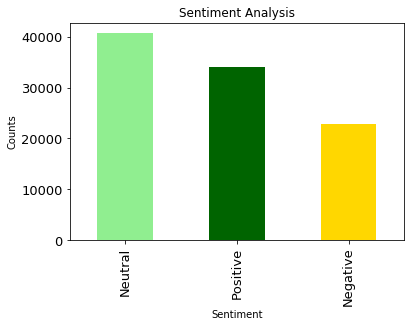

In [134]:
# Print the percentage of positive tweets
ptweets = df[df.Analysis == 'Positive']
ptweets = ptweets['full_text']
ptweets

round( (ptweets.shape[0] / df.shape[0]) * 100 , 1)

# Print the percentage of negative tweets
ntweets = df[df.Analysis == 'Negative']
ntweets = ntweets['full_text']
ntweets

round( (ntweets.shape[0] / df.shape[0]) * 100, 1)

# Show the value counts


# Plotting and visualizing the counts
plt.title('Sentiment Analysis')
plt.xlabel('Sentiment')
plt.ylabel('Counts')
df['Analysis'].value_counts().plot(kind = 'bar',color = ['lightgreen','darkgreen', 'gold'])
plt.show()

In [86]:
plt.figure(figsize=(25,20))
for i in range(0, df.shape[0]):
     plt.scatter(df["Polarity"][i], df["Subjectivity"][i], color='Blue') # plt.scatter(x,y,color)
 
plt.title('Sentiment Analysis')
plt.xlabel('Polarity')
plt.ylabel('Subjectivity')
plt.show()


KeyboardInterrupt: 

Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x000001B2DCD45268> (for post_execute):


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x000001B2DCD53D90> (for post_execute):


KeyboardInterrupt: 

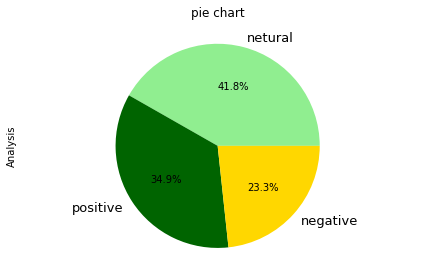

In [66]:
import matplotlib     
matplotlib.rc('xtick', labelsize=13)     
matplotlib.rc('ytick', labelsize=13)
colors = ['lightgreen','darkgreen', 'gold']

lable =   "netural","positive","negative"

plt.title("pie chart")

plt.axis('equal')

df['Analysis'].value_counts().plot(kind = 'pie',colors=colors,labels=lable,autopct='%1.1f%%')

plt.tight_layout()

plt.show()

In [ ]:
df['tweet_without_stopwords'] =  [word.lower() for word in df['tweet_without_stopwords']]

In [89]:
from nltk.corpus import stopwords
stop = stopwords.words('english')
stop.append('I')
df['tweet_without_stopwords'] = df["full_text"].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))


,created_at,full_text,id,Subjectivity,Polarity,Analysis,tweet_without_stopwords
0,2020-04-24,888 we don't give a fuck what the fda has to s...,1050228370808680448,0.405952,-0.057143,Negative,888 give fuck fda say compromised too. good gu...
1,2020-04-24,nolte climate denier bill gates quietly buys 4...,780594585575620609,0.333333,0.000000,Neutral,nolte climate denier bill gates quietly buys 4...
2,2020-04-24,if bill gates and his family open up a vial an...,1066887763767648264,0.368750,-0.037500,Negative,bill gates family open vial inject....and get ...
3,2020-04-24,3news the who bill and melinda gates foundati...,1163800395942105096,0.000000,0.000000,Neutral,3news bill melinda gates foundation wuhan inst...
4,2020-04-24,bill gates wants to spray millions of tonnes o...,996233032271970305,0.025000,0.050000,Positive,bill gates wants spray millions tonnes dust st...


In [ ]:
df[0:5]

In [27]:
from collections import Counter
most_occur = Counter(" ".join(df["tweet_without_stopwords"]).split()).most_common(10)

print(most_occur)


[('bill', 92206), ('gates', 87242), ('vaccine', 11733), ('amp', 11074), ('people', 8286), ('via', 6726), ('world', 6319), ('like', 6271), ('coronavirus', 5521), ('melinda', 5209)]


In [73]:
clean =  pd.DataFrame(most_occur,columns=['words', 'count'])
clean

,words,count
0,bill,92206
1,gates,87242
2,vaccine,11733
3,amp,11074
4,people,8286
5,via,6726
6,world,6319
7,like,6271
8,coronavirus,5521
9,melinda,5209


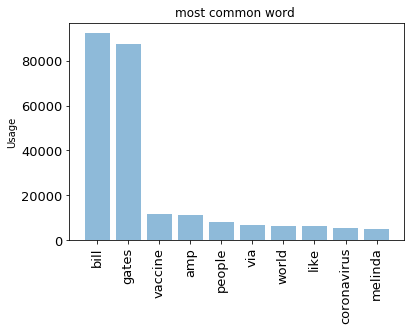

In [78]:
objects = clean["words"]
y_pos = np.arange(len(objects))
performance =clean["count"]

plt.bar(y_pos, performance, align='center', alpha=0.5)
plt.xticks(y_pos, objects)
plt.ylabel('Usage')
plt.xticks(rotation=90)
plt.title('most common word ')

plt.show()

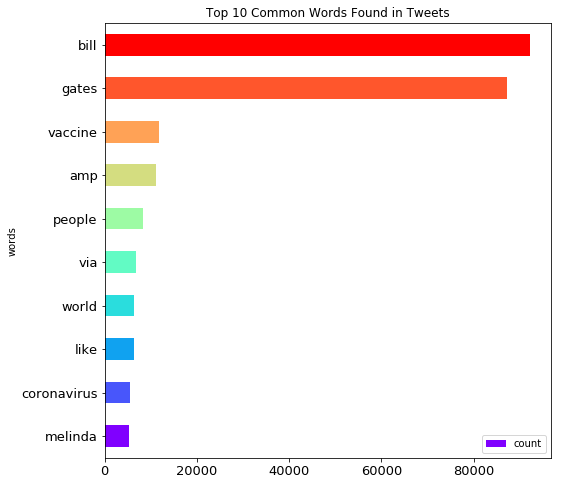

In [80]:
import matplotlib.cm as cm
fig, ax = plt.subplots(figsize=(8, 8))
colors = cm.rainbow(np.linspace(0, 1, 10))
# Plot horizontal bar graph
clean.sort_values(by='count').plot.barh(x='words',
                      y='count',
                      ax=ax,
                      color=colors)

ax.set_title("Top 10 Common Words Found in Tweets")

plt.show()

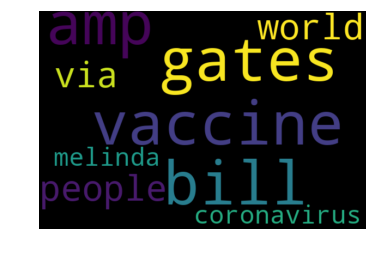

In [84]:
allWords = ' '.join([twts for twts in clean['words']])
wordCloud = WordCloud(width=600, height=400, random_state=21, max_font_size=110).generate(allWords)


plt.imshow(wordCloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [111]:
gp1 =  df.groupby('created_at')['full_text'].nunique()
gp1

created_at
2020-04-18    10645
2020-04-19    14073
2020-04-20    11847
2020-04-21    11084
2020-04-22    15065
2020-04-23    13083
2020-04-24    13374
Name: full_text, dtype: int64

In [92]:
gp2 = df.groupby('created_at')['id'].nunique()
gp2

created_at
2020-04-18     9250
2020-04-19    12069
2020-04-20    10316
2020-04-21     9467
2020-04-22    12863
2020-04-23    11942
2020-04-24    11859
Name: id, dtype: int64

In [120]:
gp3 = df.groupby('id')['full_text'].nunique().sort_values(ascending=False)
gp3[0:10]

id
4893877534             111
82375718                76
973224032836481024      67
187411778               63
766786784               63
1246054674421166082     59
1097140001052209152     58
1243135489827311616     55
1281018086              54
1242860485348900866     53
Name: full_text, dtype: int64

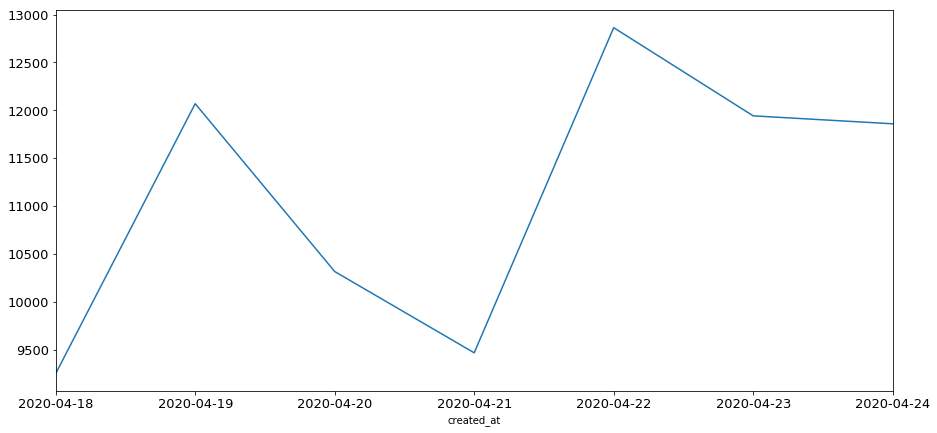

In [31]:
text

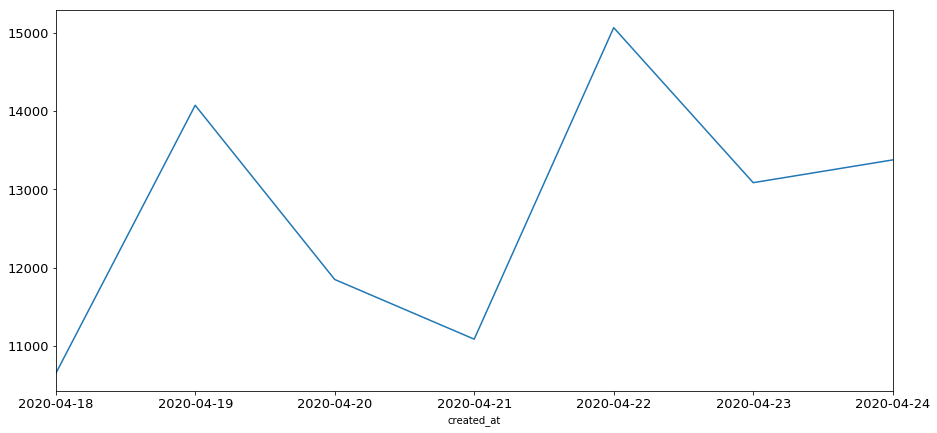

In [32]:
fig, ax = plt.subplots(figsize=(15,7))
df.groupby('created_at')['full_text'].nunique().plot(ax=ax)

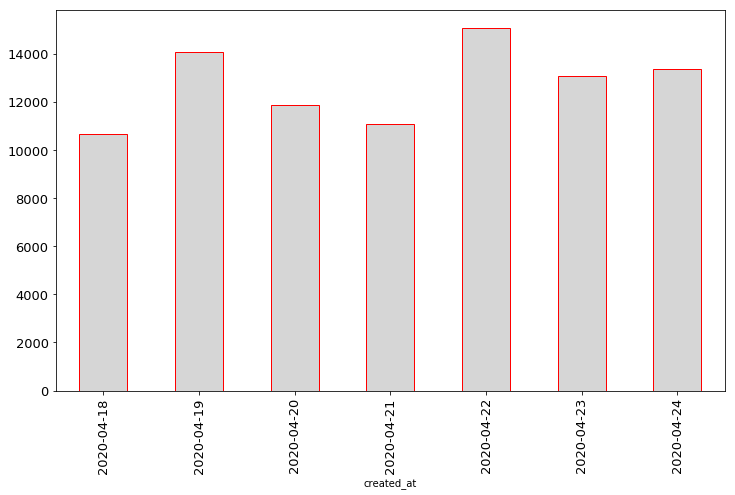

In [131]:
fig, ax = plt.subplots(figsize=(12,7))

df.groupby('created_at')['full_text'].nunique().plot(kind = 'bar',color=(0.2, 0.2, 0.2, 0.2),  edgecolor='red')

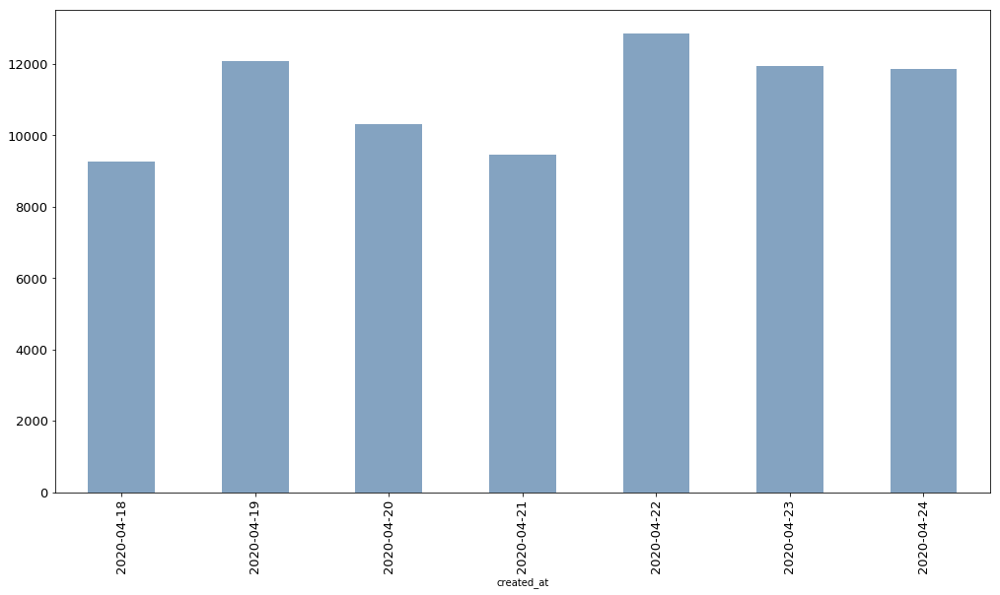

In [132]:
fig, ax = plt.subplots(figsize=(17,9))

df.groupby('created_at')['id'].nunique().plot(kind = 'bar',color=(0.2, 0.4, 0.6, 0.6))

KeyboardInterrupt: 

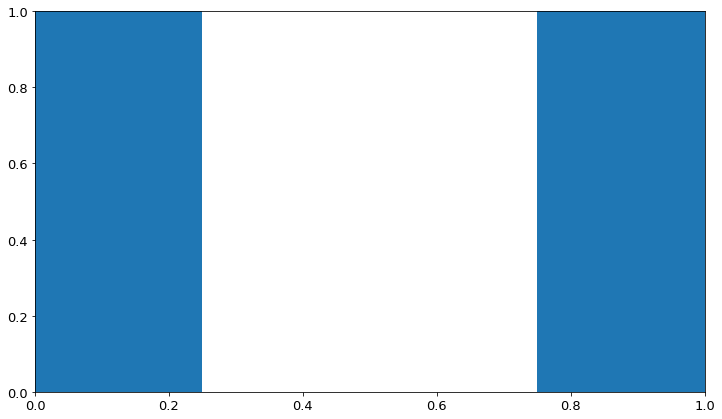

In [123]:
fig, ax = plt.subplots(figsize=(12,7))

df.groupby('id')['full_text'].nunique().sort_values(ascending=False).plot(kind = 'bar')

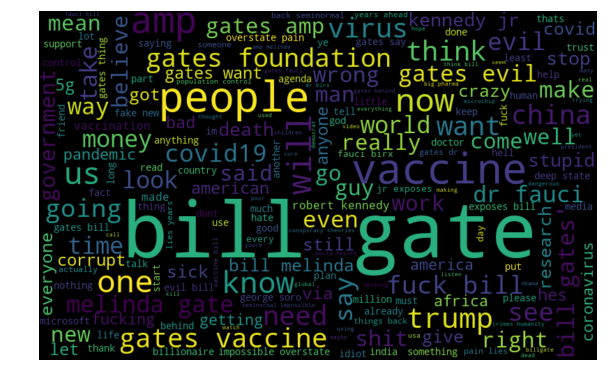

In [35]:
normal_words =' '.join([text for text in df['full_text'][df['Analysis'] == "Negative"]])

wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(normal_words)
plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

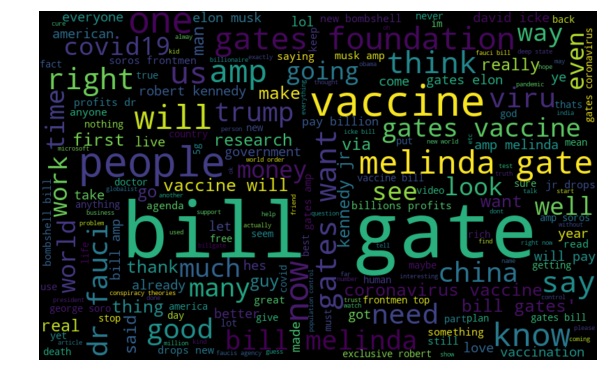

In [36]:
normal_words =' '.join([text for text in df['full_text'][df['Analysis'] == "Positive"]])

wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(normal_words)
plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

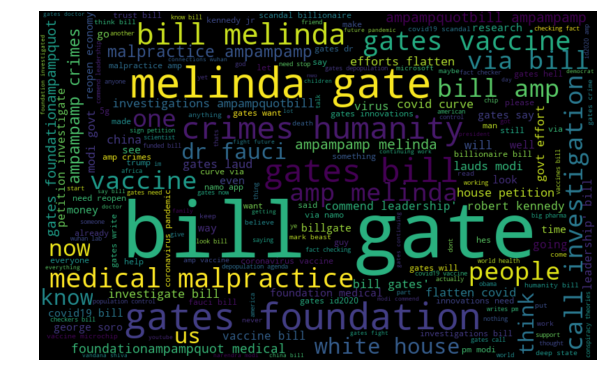

In [37]:
normal_words =' '.join([text for text in df['full_text'][df['Analysis'] == "Neutral"]])

wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(normal_words)
plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [ ]:
def hashtag_extract(x):
    hashtags = []
    # Loop over the words in the tweet
    for i in x:
        ht = re.findall(r"#(\w+)", i)
        hashtags.append(ht)

    return hashtags

In [ ]:
HT_regular = hashtag_extract(df['full_text'][df['Analysis'] == "Neutral"])

# extracting hashtags from racist/sexist tweets
HT_negative = hashtag_extract(df['full_text'][df['Analysis'] == "Positive"])

# unnesting list
HT_regular = sum(HT_regular,[])
HT_negative = sum(HT_negative,[])

In [ ]:
import nltk
import seaborn as sns

In [ ]:
a = nltk.FreqDist(HT_regular)
d = pd.DataFrame({'Hashtag': list(a.keys()),
                  'Count': list(a.values())})
# selecting top 10 most frequent hashtags     
d = d.nlargest(columns="Count", n = 10) 
plt.figure(figsize=(16,5))
plt.title("Non-Racist/Sexist Tweets")
ax = sns.barplot(data=d, x= "Hashtag", y = "Count")
ax.set(ylabel = 'Count')
plt.show()

In [ ]:
b = nltk.FreqDist(HT_negative)
e = pd.DataFrame({'Hashtag': list(b.keys()), 'Count': list(b.values())})
# selecting top 10 most frequent hashtags
e = e.nlargest(columns="Count", n = 10)   
plt.figure(figsize=(16,5))
plt.title("Racist/Sexist Tweets")
ax = sns.barplot(data=e, x= "Hashtag", y = "Count")
ax.set(ylabel = 'Count')
plt.show()

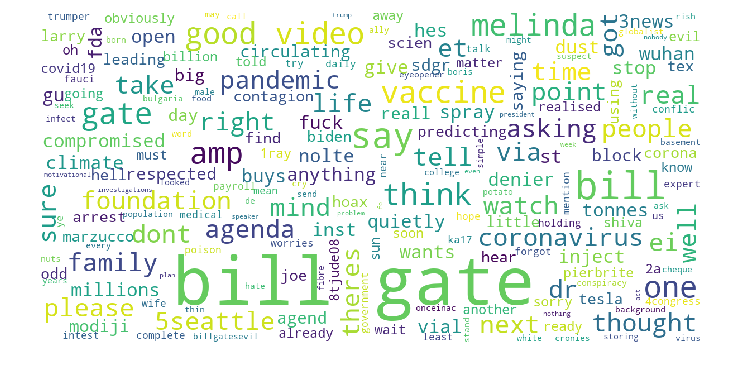

In [38]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
stopwords = set(STOPWORDS)

def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color='white',
        stopwords=stopwords,
        max_words=200,
        max_font_size=40, 
        scale=3,
        random_state=1 # chosen at random by flipping a coin; it was heads
    ).generate(str(data))

    fig = plt.figure(1, figsize=(12, 12))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)

    plt.imshow(wordcloud)
    plt.show()

show_wordcloud(df['tweet_without_stopwords'])

In [39]:
import nltk
from nltk import *

def test(tweet):
    tokens = nltk.word_tokenize(tweet)
    finder = BigramCollocationFinder.from_words(tokens)
    return tokens , finder
    

df['full_text'].apply(test)

0        ([888, we, do, n't, give, a, fuck, what, the, ...
1        ([nolte, climate, denier, bill, gates, quietly...
2        ([if, bill, gates, and, his, family, open, up,...
3        ([3news, the, who, bill, and, melinda, gates, ...
4        ([bill, gates, wants, to, spray, millions, of,...
5        ([5seattle, stop, asking, bill, gates, about, ...
6        ([respected, modiji, please, block, bill, gate...
7        ([videos, circulating, of, bill, gates, saying...
8        ([big, day, for, sdgr, i, am, predicting, the,...
9        ([marzucco, right, ., 2, points, ., 1., hell, ...
10       ([the, coronavirus, contagion, pandemic, hoax,...
11       ([we, should, all, find, it, a, little, odd, b...
12       ([74472061, tex, after, his, arrest, ..., .joe...
13       ([70553879, did, you, hear, bill, gates, say, ...
14       ([so, that, tells, me, bill, gates, and, pierb...
15       ([5seattle, why, are, you, asking, bill, gates...
16       ([covid19, vaccine, ready, “, soon, ”, says, u.

In [40]:
for tweet in df['full_text']:
    tokens = nltk.word_tokenize(tweet)
    finder = BigramCollocationFinder.from_words(tokens)
   
tokens

['how',
 'enlightened',
 'and',
 'advanced',
 'your',
 'critical',
 'thinking',
 'skills',
 'are',
 '!',
 'you',
 'sound',
 'like',
 'a',
 'jeopardy',
 'answer',
 'to',
 'the',
 'question',
 'what',
 'bill',
 'gates',
 'would',
 'actually',
 'say',
 'if',
 'he',
 'had',
 'balls',
 '!',
 '🤣']

In [41]:
for k,v in finder.ngram_fd.items():
    print(k,v)

('how', 'enlightened') 1
('enlightened', 'and') 1
('and', 'advanced') 1
('advanced', 'your') 1
('your', 'critical') 1
('critical', 'thinking') 1
('thinking', 'skills') 1
('skills', 'are') 1
('are', '!') 1
('!', 'you') 1
('you', 'sound') 1
('sound', 'like') 1
('like', 'a') 1
('a', 'jeopardy') 1
('jeopardy', 'answer') 1
('answer', 'to') 1
('to', 'the') 1
('the', 'question') 1
('question', 'what') 1
('what', 'bill') 1
('bill', 'gates') 1
('gates', 'would') 1
('would', 'actually') 1
('actually', 'say') 1
('say', 'if') 1
('if', 'he') 1
('he', 'had') 1
('had', 'balls') 1
('balls', '!') 1
('!', '🤣') 1


In [42]:
from textblob.sentiments import NaiveBayesAnalyzer

prebuilt_analyzer = NaiveBayesAnalyzer()
for tweet in df['full_text']:
    x = TextBlob(tweet,analyzer=prebuilt_analyzer)

[nltk_data] Downloading package movie_reviews to
[nltk_data]     C:\Users\GTS\AppData\Roaming\nltk_data...
[nltk_data]   Package movie_reviews is already up-to-date!


In [43]:
x.sentiment

Sentiment(classification='neg', p_pos=0.27760112831391365, p_neg=0.7223988716860816)

In [44]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
for tweet in df['full_text']:
    sid = SentimentIntensityAnalyzer()
    print(sid.polarity_scores(tweet))
    

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\GTS\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


{'neg': 0.121, 'neu': 0.831, 'pos': 0.047, 'compound': -0.5355}
{'neg': 0.2, 'neu': 0.8, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.143, 'neu': 0.857, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.124, 'neu': 0.876, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.091, 'neu': 0.866, 'pos': 0.043, 'compound': -0.4153}
{'neg': 0.301, 'neu': 0.699, 'pos': 0.0, 'compound': -0.8017}
{'neg': 0.148, 'neu': 0.651, 'pos': 0.201, 'compound': 0.2516}
{'neg': 0.0, 'neu': 0.878, 'pos': 0.122, 'compound': 0.6478}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.272, 'neu': 0.659, 'pos': 0.069, 'compound': -0.8122}
{'neg': 0.39, 'neu': 0.61, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.096, 'neu': 0.904, 'pos': 0.0, 'compound': -0.2516}
{'neg': 0.086, 'neu': 0.701, 'pos': 0.212, 'compound': 0.743}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.046, 'neu': 0.755, 'pos': 0.199, 'compound': 0.69}
{'neg': 0.0, 'neu': 0.916, 'pos': 0.084, 'compound': 0.0258}
{'neg': 0.0, 'neu': 0.848,

{'neg': 0.0, 'neu': 0.928, 'pos': 0.072, 'compound': 0.4926}
{'neg': 0.128, 'neu': 0.872, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.198, 'neu': 0.802, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 0.871, 'pos': 0.129, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.2, 'neu': 0.8, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.082, 'neu': 0.918, 'pos': 0.0, 'compound': -0.5927}
{'neg': 0.0, 'neu': 0.927, 'pos': 0.073, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.173, 'neu': 0.786, 'pos': 0.041, 'compound': -0.636}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.226, 'neu': 0.667, 'pos': 0.107, 'compound': -0.5696}
{'neg'

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.793, 'pos': 0.207, 'compound': 0.5267}
{'neg': 0.161, 'neu': 0.839, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.321, 'neu': 0.679, 'pos': 0.0, 'compound': -0.2244}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.339, 'neu': 0.661, 'pos': 0.0, 'compound': -0.4724}
{'neg': 0.039, 'neu': 0.879, 'pos': 0.083, 'compound': 0.2732}
{'neg': 0.111, 'neu': 0.816, 'pos': 0.074, 'compound': -0.3887}
{'neg': 0.123, 'neu': 0.817, 'pos': 0.06, 'compound': -0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.097, 'neu': 0.84, 'pos': 0.063, 'compound': -0.3182}
{'neg': 0.086, 'neu': 0.914, 'pos': 0.0, 'compound': -0.6792}
{'neg': 0.0, 'neu': 0.818, 'pos': 0.182, 'compound': 0.4404}
{'neg': 0.248, 'neu': 0.62, 'pos': 0.132, 'compound': -0.7568}
{'neg': 0.06, 'neu': 0.94, 'pos': 0.0, 'compound': -0.4497}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, '

{'neg': 0.281, 'neu': 0.632, 'pos': 0.087, 'compound': -0.7096}
{'neg': 0.065, 'neu': 0.888, 'pos': 0.047, 'compound': -0.1531}
{'neg': 0.157, 'neu': 0.801, 'pos': 0.042, 'compound': -0.743}
{'neg': 0.099, 'neu': 0.901, 'pos': 0.0, 'compound': -0.5927}
{'neg': 0.053, 'neu': 0.81, 'pos': 0.137, 'compound': 0.5106}
{'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.125, 'neu': 0.875, 'pos': 0.0, 'compound': -0.6776}
{'neg': 0.038, 'neu': 0.837, 'pos': 0.126, 'compound': 0.6605}
{'neg': 0.0, 'neu': 0.964, 'pos': 0.036, 'compound': 0.0772}
{'neg': 0.198, 'neu': 0.802, 'pos': 0.0, 'compound': -0.8785}
{'neg': 0.046, 'neu': 0.671, 'pos': 0.283, 'compound': 0.8834}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.915, 'pos': 0.085, 'compound': 0.5187}
{'neg': 0.0, 'neu': 0.889, 'pos': 0.

{'neg': 0.109, 'neu': 0.891, 'pos': 0.0, 'compound': -0.4215}
{'neg': 0.531, 'neu': 0.469, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.085, 'neu': 0.7, 'pos': 0.215, 'compound': 0.6369}
{'neg': 0.489, 'neu': 0.209, 'pos': 0.302, 'compound': -0.4199}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.317, 'neu': 0.627, 'pos': 0.056, 'compound': -0.93}
{'neg': 0.103, 'neu': 0.897, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.0, 'neu': 0.826, 'pos': 0.174, 'compound': 0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.05, 'neu': 0.95, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.154, 'neu': 0.705, 'pos': 0.141, 'compound': -0.0516}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.122, 'neu': 0.824, 'pos': 0.054, 'compound': -0.6124}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.203, 'neu': 0.7, 'pos': 0.097, 'compound': -0.

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.094, 'neu': 0.764, 'pos': 0.142, 'compound': 0.1007}
{'neg': 0.0, 'neu': 0.86, 'pos': 0.14, 'compound': 0.2382}
{'neg': 0.258, 'neu': 0.547, 'pos': 0.195, 'compound': -0.2023}
{'neg': 0.0, 'neu': 0.828, 'pos': 0.172, 'compound': 0.3612}
{'neg': 0.23, 'neu': 0.601, 'pos': 0.169, 'compound': -0.2748}
{'neg': 0.0, 'neu': 0.711, 'pos': 0.289, 'compound': 0.8074}
{'neg': 0.0, 'neu': 0.871, 'pos': 0.129, 'compound': 0.6892}
{'neg': 0.0, 'neu': 0.674, 'pos': 0.326, 'compound': 0.5256}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.937, 'pos': 0.063, 'compound': 0.5106}
{'neg': 0.189, 'neu': 0.811, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.278, 'neu': 0.722, 'pos': 0.0, 'compound': -0.4023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.148, 'neu': 0.752, 'pos': 0.1, 'compound': -0.5255}
{'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'co

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.231, 'neu': 0.769, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.049, 'neu': 0.951, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.152, 'neu': 0.848, 'pos': 0.0, 'compound': -0.6124}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.161, 'neu': 0.721, 'pos': 0.118, 'compound': -0.3182}
{'neg': 0.266, 'neu': 0.734, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.327, 'neu': 0.673, 'pos': 0.0, 'compound': -0.8074}
{'neg': 0.0, 'neu': 0.857, 'pos': 0.143, 'compound': 0.1695}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.251, 'neu': 0.598, 'pos': 0.151, 'compound': -0.5951}
{'neg': 0.255, 'neu': 0.745, 'pos': 0.0, 'compound': -0.802}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.4798}
{'neg': 0.131, 'neu': 0.557, 'pos': 0.312, 'compound': 0.7574}
{'neg': 0.0, 'neu': 0.505, 'pos': 0.495, 'compo

{'neg': 0.0, 'neu': 0.813, 'pos': 0.187, 'compound': 0.3182}
{'neg': 0.0, 'neu': 0.737, 'pos': 0.263, 'compound': 0.2828}
{'neg': 0.0, 'neu': 0.9, 'pos': 0.1, 'compound': 0.2732}
{'neg': 0.055, 'neu': 0.898, 'pos': 0.047, 'compound': -0.1027}
{'neg': 0.193, 'neu': 0.807, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 0.813, 'pos': 0.187, 'compound': 0.3182}
{'neg': 0.157, 'neu': 0.647, 'pos': 0.196, 'compound': 0.2462}
{'neg': 0.0, 'neu': 0.865, 'pos': 0.135, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.779, 'pos': 0.221, 'compound': 0.7783}
{'neg': 0.188, 'neu': 0.75, 'pos': 0.062, 'compound': -0.6124}
{'neg': 0.0, 'neu': 0.952, 'pos': 0.048, 'compound': 0.3089}
{'neg': 0.0, 'neu': 0.667, 'pos': 0.333, 'compound': 0.3612}
{'neg': 0.134, 'neu': 0.866, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 0.921, 'pos': 0.079, 'compound': 0.3578}
{'neg': 0.136, 'neu': 0.803, 'pos': 0.062, 'compound': -0.5562}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.266, 'neu': 0.734, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.944, 'pos': 0.056, 'compound': 0.2263}
{'neg': 0.203, 'neu': 0.52, 'pos': 0.277, 'compound': 0.4588}
{'neg': 0.188, 'neu': 0.75, 'pos': 0.062, 'compound': -0.6124}
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 0.79, 'pos': 0.21, 'compound': 0.4926}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.108, 'neu': 0.892, 'pos': 0.0, 'compound': -0.4184}
{'neg': 0.094, 'neu': 0.906, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.293, 'neu': 0.707, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.289, 'neu': 0.711, 'pos': 0.0, 'compound': -0.94}
{'neg': 0.204, 'neu': 0.796, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.252, 'neu': 0.748, 'pos': 0.0, 'compound': -0.926}
{'neg': 0.236, 'neu': 0.764, 'pos': 0.0, 'comp

{'neg': 0.128, 'neu': 0.78, 'pos': 0.092, 'compound': -0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.966, 'pos': 0.034, 'compound': 0.0772}
{'neg': 0.045, 'neu': 0.893, 'pos': 0.062, 'compound': -0.0258}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.109, 'neu': 0.802, 'pos': 0.089, 'compound': -0.1779}
{'neg': 0.078, 'neu': 0.702, 'pos': 0.22, 'compound': 0.7224}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.795, 'pos': 0.205, 'compound': 0.6908}
{'neg': 0.0, 'neu': 0.839, 'pos': 0.161, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.207, 'neu': 0.793, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.942, 'pos': 0.058, 'compound': 0.0772}
{'neg': 0.154, 'neu': 0.656, 'pos': 0.189, 'compound': 0.2003}
{'neg': 0.13, 'neu': 0.704, 'pos': 0.167, 'compound': 

{'neg': 0.0, 'neu': 0.932, 'pos': 0.068, 'compound': 0.2732}
{'neg': 0.0, 'neu': 0.866, 'pos': 0.134, 'compound': 0.4199}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.119, 'neu': 0.881, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.057, 'neu': 0.857, 'pos': 0.087, 'compound': 0.5096}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.375, 'neu': 0.625, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.0, 'neu': 0.711, 'pos': 0.289, 'compound': 0.7096}
{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'compound': -0.2755}
{'neg': 0.0, 'neu': 0.708, 'pos': 0.292, 'compound': 0.5106}
{'neg': 0.035, 'neu': 0.792, 'pos': 0.174, 'compound': 0.7823}
{'neg': 0.28, 'neu': 0.575, 'pos': 0.146, 'compound': -0.5423}
{'neg': 0.259, 'neu': 0.471, 'pos': 0.271, 'compound': -0.2023}
{'neg': 0.0, 'neu': 0.58, 'pos': 0.42, 'compound': 0.788}
{'neg': 0.098, 'neu': 0.853, 'pos': 0.049, 'c

{'neg': 0.253, 'neu': 0.666, 'pos': 0.081, 'compound': -0.9052}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.134, 'neu': 0.768, 'pos': 0.098, 'compound': -0.4215}
{'neg': 0.239, 'neu': 0.598, 'pos': 0.162, 'compound': -0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.234, 'neu': 0.766, 'pos': 0.0, 'compound': -0.8043}
{'neg': 0.164, 'neu': 0.711, 'pos': 0.125, 'compound': -0.2003}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.109, 'neu': 0.891, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.0, 'neu': 0.753, 'pos': 0.247, 'compound': 0.8176}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.762, 'pos': 0.238, 'compound': 0.3595}
{'neg': 0.0, 'neu': 0.897, 'pos': 0.103, 'compound': 0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.053, 'neu': 0.895, 'pos': 0.052, 'compound': -0.0139}
{'neg': 0.0, 'neu': 0.819, 'pos': 0.181, 'compoun

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.061, 'neu': 0.78, 'pos': 0.158, 'compound': 0.5386}
{'neg': 0.099, 'neu': 0.563, 'pos': 0.338, 'compound': 0.8176}
{'neg': 0.18, 'neu': 0.82, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.145, 'neu': 0.725, 'pos': 0.13, 'compound': 0.0772}
{'neg': 0.099, 'neu': 0.767, 'pos': 0.134, 'compound': 0.0258}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.469, 'neu': 0.531, 'pos': 0.0, 'compound': -0.8658}
{'neg': 0.055, 'neu': 0.776, 'pos': 0.17, 'compound': 0.6705}
{'neg': 0.07, 'neu': 0.809, 'pos': 0.121, 'compound': 0.34}
{'neg': 0.322, 'neu': 0.678, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.0, 'neu': 0.758, 'pos': 0.242, 'compound': 0.4939}
{'neg': 0.266, 'neu': 0.734, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.142, 'neu': 0.712, 'pos': 0.146, 'compound': -0.1962}
{'neg': 0.437, 'neu': 0.563, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.171, 'neu': 0.641, 'pos'

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.809, 'pos': 0.191, 'compound': 0.6369}
{'neg': 0.068, 'neu': 0.829, 'pos': 0.103, 'compound': 0.1027}
{'neg': 0.176, 'neu': 0.781, 'pos': 0.043, 'compound': -0.8011}
{'neg': 0.241, 'neu': 0.759, 'pos': 0.0, 'compound': -0.2263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.578, 'pos': 0.422, 'compound': 0.9309}
{'neg': 0.068, 'neu': 0.725, 'pos': 0.207, 'compound': 0.8705}
{'neg': 0.162, 'neu': 0.669, 'pos': 0.169, 'compound': -0.2023}
{'neg': 0.138, 'neu': 0.798, 'pos': 0.063, 'compound': -0.4253}
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.091, 'neu': 0.815, 'pos': 0.094, 'compound': 0.0232}
{'neg': 0.0, 'neu': 0.817, 'pos': 0.183, 'compound': 0.7935}
{'neg': 0.0, 'neu': 0.824, 'pos': 0.176, 'compound': 0.4574}
{'neg': 0.164, 'neu': 0.836, 'pos': 0.0, 'compound': -0.7398}
{'neg': 0.145, 'neu': 0.855

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.092, 'neu': 0.869, 'pos': 0.039, 'compound': -0.5106}
{'neg': 0.188, 'neu': 0.75, 'pos': 0.062, 'compound': -0.6124}
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.327, 'neu': 0.673, 'pos': 0.0, 'compound': -0.8658}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.213, 'neu': 0.735, 'pos': 0.051, 'compound': -0.765}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.306, 'neu': 0.694, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.902, 'pos': 0.098, 'compound': 0.3612}
{'neg': 0.09, 'neu': 0.706, 'pos': 0.204, 'compound': 0.4389}
{'neg': 0.0, 'neu': 0.815, 'pos': 0.185, 'compound': 0.3612}
{'neg': 0.138, 'neu': 0.862, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{

{'neg': 0.447, 'neu': 0.553, 'pos': 0.0, 'compound': -0.8658}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.214, 'neu': 0.786, 'pos': 0.0, 'compound': -0.8462}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.082, 'neu': 0.918, 'pos': 0.0, 'compound': -0.3252}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.89, 'pos': 0.11, 'compound': 0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.281, 'neu': 0.582, 'pos': 0.136, 'compound': -0.8658}
{'neg': 0.0, 'neu': 0.37, 'pos': 0.63, 'compound': 0.8176}
{'neg': 0.152, 'neu': 0.253, 'pos': 0.595, 'compound': 0.8885}
{'neg': 0.115, 'neu': 0.783, 'pos': 0.102, 'compound': -0.0946}
{'neg': 0.261, 'neu': 0.739, 'pos': 0.0, 'compound': -0.7186}
{'neg': 0.253, 'neu': 0.747, 'pos': 0.0, 'compound': -0.7269}
{'neg': 0.0, 'neu': 0.855, 'pos': 0.145, 'compound': 0.8176}
{'neg': 0.438, 'neu': 0.562, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.306, 'neu': 0.694, 'pos': 0.0, '

{'neg': 0.095, 'neu': 0.798, 'pos': 0.107, 'compound': 0.1635}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.765, 'pos': 0.235, 'compound': 0.8537}
{'neg': 0.0, 'neu': 0.957, 'pos': 0.043, 'compound': 0.1139}
{'neg': 0.245, 'neu': 0.755, 'pos': 0.0, 'compound': -0.7311}
{'neg': 0.298, 'neu': 0.702, 'pos': 0.0, 'compound': -0.5256}
{'neg': 0.058, 'neu': 0.899, 'pos': 0.042, 'compound': -0.1531}
{'neg': 0.083, 'neu': 0.713, 'pos': 0.203, 'compound': 0.4664}
{'neg': 0.108, 'neu': 0.847, 'pos': 0.044, 'compound': -0.4404}
{'neg': 0.304, 'neu': 0.658, 'pos': 0.037, 'compound': -0.9325}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.729, 'pos': 0.271, 'compound': 0.7717}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.683, 'pos': 0.317, 'compound': 0.6266}
{'neg': 0.053, 'neu': 0.865, 'pos': 0.083, '

{'neg': 0.0, 'neu': 0.634, 'pos': 0.366, 'compound': 0.7579}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.845, 'pos': 0.155, 'compound': 0.296}
{'neg': 0.213, 'neu': 0.735, 'pos': 0.051, 'compound': -0.765}
{'neg': 0.0, 'neu': 0.68, 'pos': 0.32, 'compound': 0.765}
{'neg': 0.06, 'neu': 0.94, 'pos': 0.0, 'compound': -0.2755}
{'neg': 0.28, 'neu': 0.623, 'pos': 0.097, 'compound': -0.6908}
{'neg': 0.153, 'neu': 0.61, 'pos': 0.237, 'compound': 0.538}
{'neg': 0.241, 'neu': 0.759, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.047, 'neu': 0.878, 'pos': 0.076, 'compound': 0.34}
{'neg': 0.0, 'neu': 0.84, 'pos': 0.16, 'compound': 0.5859}
{'neg': 0.0, '

{'neg': 0.163, 'neu': 0.837, 'pos': 0.0, 'compound': -0.5719}
{'neg': 0.05, 'neu': 0.856, 'pos': 0.094, 'compound': 0.2681}
{'neg': 0.178, 'neu': 0.757, 'pos': 0.065, 'compound': -0.6486}
{'neg': 0.323, 'neu': 0.677, 'pos': 0.0, 'compound': -0.6476}
{'neg': 0.128, 'neu': 0.696, 'pos': 0.177, 'compound': 0.1779}
{'neg': 0.306, 'neu': 0.574, 'pos': 0.12, 'compound': -0.5994}
{'neg': 0.121, 'neu': 0.742, 'pos': 0.136, 'compound': 0.0613}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.196, 'neu': 0.804, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.049, 'neu': 0.78, 'pos': 0.171, 'compound': 0.6705}
{'neg': 0.0, 'neu': 0.888, 'pos': 0.112, 'compound': 0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.138, 'neu': 0.728, 'pos': 0.134, 'compound': -0.0516}
{'neg': 0.183, 'neu': 0.638, 'pos': 0.179, 'compound': -0.0516}
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.143, 'neu': 0.80

{'neg': 0.0, 'neu': 0.856, 'pos': 0.144, 'compound': 0.7506}
{'neg': 0.159, 'neu': 0.757, 'pos': 0.084, 'compound': -0.5218}
{'neg': 0.085, 'neu': 0.806, 'pos': 0.109, 'compound': 0.2732}
{'neg': 0.199, 'neu': 0.751, 'pos': 0.051, 'compound': -0.743}
{'neg': 0.0, 'neu': 0.891, 'pos': 0.109, 'compound': 0.0258}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.945, 'pos': 0.055, 'compound': 0.2732}
{'neg': 0.0, 'neu': 0.958, 'pos': 0.042, 'compound': 0.3291}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.232, 'neu': 0.614, 'pos': 0.154, 'compound': -0.6249}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.293, 'neu': 0.707, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.074, 'neu': 0.827, 'pos': 0.099, 'compound': 0.2247}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.2, 'neu': 0.8, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.206, 'neu': 0.794, 'pos': 0.0, 'compoun

{'neg': 0.0, 'neu': 0.871, 'pos': 0.129, 'compound': 0.6369}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.247, 'neu': 0.753, 'pos': 0.0, 'compound': -0.7096}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.0772}
{'neg': 0.0, 'neu': 0.871, 'pos': 0.129, 'compound': 0.6369}
{'neg': 0.0, 'neu': 0.571, 'pos': 0.429, 'compound': 0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.226, 'neu': 0.774, 'pos': 0.0, 'compound': -0.7717}
{'neg': 0.0, 'neu': 0.803, 'pos': 0.197, 'compound': 0.4019}
{'neg': 0.206, 'neu': 0.794, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.169, 'neu': 0.734, 'pos': 0.097, 'compound': -0.5574}
{'neg': 0.0, 'neu': 0.87, 'pos': 0.13, 'compound': 0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.176, 'neu': 0.824, 'pos': 0.0, 'compound': -0.8311}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}


{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.23, 'neu': 0.714, 'pos': 0.056, 'compound': -0.9042}
{'neg': 0.164, 'neu': 0.678, 'pos': 0.158, 'compound': -0.0276}
{'neg': 0.138, 'neu': 0.799, 'pos': 0.063, 'compound': -0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.765, 'pos': 0.235, 'compound': 0.749}
{'neg': 0.0, 'neu': 0.92, 'pos': 0.08, 'compound': 0.0772}
{'neg': 0.101, 'neu': 0.899, 'pos': 0.0, 'compound': -0.2003}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.548, 'pos': 0.452, 'compound': 0.6808}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.145, 'neu': 0.855, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu':

{'neg': 0.245, 'neu': 0.755, 'pos': 0.0, 'compound': -0.8442}
{'neg': 0.273, 'neu': 0.727, 'pos': 0.0, 'compound': -0.7184}
{'neg': 0.328, 'neu': 0.672, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.062, 'neu': 0.938, 'pos': 0.0, 'compound': -0.0516}
{'neg': 0.075, 'neu': 0.803, 'pos': 0.122, 'compound': 0.128}
{'neg': 0.155, 'neu': 0.793, 'pos': 0.052, 'compound': -0.6124}
{'neg': 0.15, 'neu': 0.85, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.133, 'neu': 0.867, 'pos': 0.0, 'compound': -0.743}
{'neg': 0.0, 'neu': 0.895, 'pos': 0.105, 'compound': 0.5709}
{'neg': 0.191, 'neu': 0.766, 'pos': 0.043, 'compound': -0.8074}
{'neg': 0.144, 'neu': 0.856, 'pos': 0.0, 'compound': -0.5216}
{'neg': 0.0, 'neu': 0.91, 'pos': 0.09, 'compound': 0.4707}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.163, 'neu': 0.798, 'pos': 0.038, 'compound': -0.8225}
{'neg': 0.0, 'neu': 0.863, 'pos': 0.137, 'compound': 0.4019}
{'neg': 0.11, 'neu': 0.804, 'pos': 0.085, 'compound': -0.3519}
{'neg': 0.217, 'n

{'neg': 0.367, 'neu': 0.633, 'pos': 0.0, 'compound': -0.7003}
{'neg': 0.18, 'neu': 0.82, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.057, 'neu': 0.701, 'pos': 0.242, 'compound': 0.8268}
{'neg': 0.065, 'neu': 0.777, 'pos': 0.158, 'compound': 0.6428}
{'neg': 0.349, 'neu': 0.651, 'pos': 0.0, 'compound': -0.7096}
{'neg': 0.0, 'neu': 0.852, 'pos': 0.148, 'compound': 0.5095}
{'neg': 0.0, 'neu': 0.793, 'pos': 0.207, 'compound': 0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.854, 'pos': 0.146, 'compound': 0.34}
{'neg': 0.0, 'neu': 0.861, 'pos': 0.139, 'compound': 0.2732}
{'neg': 0.261, 'neu': 0.739, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.0, 'neu': 0.661, 'pos': 0.339, 'compound': 0.802}
{'neg': 0.0, 'neu': 0.658, 'pos': 0.342, 'compound': 0.5696}
{'neg': 0.049, 'neu': 0.796, 'pos': 0.156, 'compound': 0.7094}
{'neg': 0.225, 'neu': 0.775, 'pos': 0.0, 'compound': -0.7738}
{'neg': 0.033, 'neu': 0.855, 'pos': 0.112, 'compound': 0.34}
{'neg': 0.0, 'neu': 1.0, 

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.256, 'neu': 0.744, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.247, 'neu': 0.753, 'pos': 0.0, 'compound': -0.7096}
{'neg': 0.181, 'neu': 0.725, 'pos': 0.094, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.18, 'neu': 0.82, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.18, 'neu': 0.82, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.555, 'neu': 0.313, 'pos': 0.132, 'compound': -0.8302}
{'neg': 0.145, 'neu': 0.855, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.087, 'neu': 0.913, 'pos': 0.0, 'compound': -0.4039}
{'neg': 0.076, 'neu': 0.811, 'pos': 0.112, 'compound': 0.1868}
{'neg': 0.21, 'neu': 0.79, 'pos': 0.0, 'compound': -0.7269}
{'neg': 0.134, 'neu': 0.653, 'pos': 0.213, 'compound': 0.3164}
{'neg': 0.126, 'neu': 0.831, 'pos': 0.042, 'compo

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.1, 'neu': 0.835, 'pos': 0.065, 'compound': -0.3626}
{'neg': 0.403, 'neu': 0.597, 'pos': 0.0, 'compound': -0.926}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.4215}
{'neg': 0.0, 'neu': 0.857, 'pos': 0.143, 'compound': 0.3612}
{'neg': 0.353, 'neu': 0.647, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.117, 'neu': 0.677, 'pos': 0.207, 'compound': 0.3382}
{'neg': 0.0, 'neu': 0.938, 'pos': 0.062, 'compound': 0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.084, 'neu': 0.88, 'pos': 0.036, 'compound': -0.4997}
{'neg': 0.11, 'neu': 0.89, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.0, 'neu': 0.831, 'pos': 0.169, 'compound': 0.6705}
{'neg': 0.218, 'neu': 0.628, 'pos': 0.154, 'compound': -0.6419}
{'neg': 0.169, 'neu': 0.831, 'pos': 0.0, 'compound': -0.6884}
{'neg': 0.226, 'neu': 0.774, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.535, 'neu': 0.435, 'pos':

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.04, 'neu': 0.761, 'pos': 0.199, 'compound': 0.8316}
{'neg': 0.173, 'neu': 0.525, 'pos': 0.302, 'compound': 0.636}
{'neg': 0.117, 'neu': 0.79, 'pos': 0.093, 'compound': -0.1779}
{'neg': 0.202, 'neu': 0.708, 'pos': 0.09, 'compound': -0.4767}
{'neg': 0.0, 'neu': 0.831, 'pos': 0.169, 'compound': 0.431}
{'neg': 0.0, 'neu': 0.947, 'pos': 0.053, 'compound': 0.3412}
{'neg': 0.605, 'neu': 0.395, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.093, 'neu': 0.835, 'pos': 0.072, 'compound': -0.4767}
{'neg': 0.0, 'neu': 0.762, 'pos': 0.238, 'compound': 0.3612}
{'neg': 0.111, 'neu': 0.837, 'pos': 0.052, 'compound': -0.4199}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.237, 'neu': 0.682, 'pos': 0.081, 'compound': -0.6996}
{'neg': 0.03, 'neu': 0.841, 'pos': 0.128, 'compound': 0.6085}
{'neg': 0.106, 'neu': 0.894, 'pos': 0.0, 'compound': -0.7163}
{'neg': 0.122, 'neu': 0.775, 'pos': 0.102, 'compound': -0.2654}
{'neg': 0.13, 'neu

{'neg': 0.0, 'neu': 0.936, 'pos': 0.064, 'compound': 0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.332, 'neu': 0.668, 'pos': 0.0, 'compound': -0.8573}
{'neg': 0.175, 'neu': 0.584, 'pos': 0.241, 'compound': 0.1796}
{'neg': 0.0, 'neu': 0.27, 'pos': 0.73, 'compound': 0.4019}
{'neg': 0.0, 'neu': 0.86, 'pos': 0.14, 'compound': 0.3818}
{'neg': 0.107, 'neu': 0.716, 'pos': 0.176, 'compound': 0.3612}
{'neg': 0.042, 'neu': 0.907, 'pos': 0.051, 'compound': 0.1027}
{'neg': 0.293, 'neu': 0.707, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 0.902, 'pos': 0.098, 'compound': 0.34}
{'neg': 0.136, 'neu': 0.826, 'pos': 0.038, 'compound': -0.6486}
{'neg': 0.0, 'neu': 0.933, 'pos': 0.067, 'compound': 0.3612}
{'neg': 0.3, 'neu': 0.7, 'pos': 0.0, 'compound': -0.8617}
{'neg': 0.174, 'neu': 0.826, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.4215}
{'neg': 0.0, 'neu': 0.851, 'pos': 0.149, 'compound': 0.4215}
{'neg': 0.0, 'neu': 0.833, 'p

{'neg': 0.253, 'neu': 0.747, 'pos': 0.0, 'compound': -0.7269}
{'neg': 0.349, 'neu': 0.624, 'pos': 0.027, 'compound': -0.9726}
{'neg': 0.211, 'neu': 0.634, 'pos': 0.155, 'compound': -0.2006}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.249, 'neu': 0.751, 'pos': 0.0, 'compound': -0.4559}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.916, 'pos': 0.084, 'compound': 0.0258}
{'neg': 0.208, 'neu': 0.676, 'pos': 0.116, 'compound': -0.2263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.227, 'neu': 0.678, 'pos': 0.096, 'compound': -0.8591}
{'neg': 0.0, 'neu': 0.629, 'pos': 0.371, 'compound': 0.8625}
{'neg': 0.0, 'neu': 0.702, 'pos': 0.298, 'compound': 0.5267}
{'neg': 0.146, 'neu': 0.669, 'pos': 0.185, 'compound': 0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.

{'neg': 0.191, 'neu': 0.809, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.027, 'neu': 0.788, 'pos': 0.185, 'compound': 0.8412}
{'neg': 0.287, 'neu': 0.669, 'pos': 0.044, 'compound': -0.9155}
{'neg': 0.058, 'neu': 0.873, 'pos': 0.069, 'compound': 0.0859}
{'neg': 0.121, 'neu': 0.69, 'pos': 0.189, 'compound': 0.2912}
{'neg': 0.267, 'neu': 0.684, 'pos': 0.049, 'compound': -0.8378}
{'neg': 0.194, 'neu': 0.633, 'pos': 0.173, 'compound': -0.0946}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.068, 'neu': 0.85, 'pos': 0.083, 'compound': 0.1531}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'

{'neg': 0.082, 'neu': 0.918, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.0, 'neu': 0.895, 'pos': 0.105, 'compound': 0.25}
{'neg': 0.468, 'neu': 0.532, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.2023}
{'neg': 0.0, 'neu': 0.896, 'pos': 0.104, 'compound': 0.4168}
{'neg': 0.288, 'neu': 0.712, 'pos': 0.0, 'compound': -0.6642}
{'neg': 0.258, 'neu': 0.606, 'pos': 0.136, 'compound': -0.3818}
{'neg': 0.136, 'neu': 0.757, 'pos': 0.107, 'compound': -0.3612}
{'neg': 0.12, 'neu': 0.88, 'pos': 0.0, 'compound': -0.5707}
{'neg': 0.132, 'neu': 0.761, 'pos': 0.107, 'compound': -0.128}
{'neg': 0.19, 'neu': 0.71, 'pos': 0.101, 'compound': -0.7088}
{'neg': 0.146, 'neu': 0.854, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.209, 'neu': 0.791, 'pos': 0.0, 'compound': -0.2755}
{'neg': 0.0, 'neu': 0.714, 'pos':

{'neg': 0.0, 'neu': 0.618, 'pos': 0.382, 'compound': 0.7935}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.306, 'neu': 0.597, 'pos': 0.097, 'compound': -0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.777, 'pos': 0.223, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.177, 'neu': 0.728, 'pos': 0.095, 'compound': -0.5067}
{'neg': 0.105, 'neu': 0.831, 'pos': 0.063, 'compound': -0.4033}
{'neg': 0.185, 'neu': 0.506, 'pos': 0.309, 'compound': 0.296}
{'neg': 0.305, 'neu': 0.61, 'pos': 0.085, 'compound': -0.9134}
{'neg': 0.08, 'neu': 0.92, 'pos': 0.0, 'compound': -0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.122, 'neu': 0.824, 'pos': 0.054, 'compound': -0.5194}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound':

{'neg': 0.299, 'neu': 0.701, 'pos': 0.0, 'compound': -0.5707}
{'neg': 0.219, 'neu': 0.723, 'pos': 0.057, 'compound': -0.7579}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.303, 'neu': 0.697, 'pos': 0.0, 'compound': -0.7589}
{'neg': 0.118, 'neu': 0.882, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.892, 'pos': 0.108, 'compound': 0.5255}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.172, 'neu': 0.828, 'pos': 0.0, 'compound': -0.4003}
{'neg': 0.0, 'neu': 0.816, 'pos': 0.184, 'compound': 0.2315}
{'neg': 0.286, 'neu': 0.714, 'pos': 0.0, 'compound': -0.0516}
{'neg': 0.345, 'neu': 0.655, 'pos': 0.0, 'compound': -0.5696}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.188, 'neu': 0.75, 'pos': 0.062, 'compound': -0.6124}
{'neg': 0.0, 'neu': 0.76, 'pos': 0.24, 'compound': 0.802}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.

{'neg': 0.203, 'neu': 0.706, 'pos': 0.09, 'compound': -0.6114}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.385, 'neu': 0.615, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.232, 'neu': 0.711, 'pos': 0.057, 'compound': -0.765}
{'neg': 0.0, 'neu': 0.922, 'pos': 0.078, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.905, 'pos': 0.095, 'compound': 0.7227}
{'neg': 0.132, 'neu': 0.868, 'pos': 0.0, 'compound': -0.1695}
{'neg': 0.037, 'neu': 0.928, 'pos': 0.035, 'compound': -0.0258}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.865, 'pos': 0.135, 'compound': 0.2755}
{'neg': 0.0, 'neu': 0.526, 'pos': 0.474, 'compound': 0.4019}
{'neg': 0.318, 'neu': 0.682, 'pos': 0.0, 'compound': -0.871}
{'neg': 0.273, 'neu': 0.727, 'pos': 0.0, 'compound': -0.4588}
{'neg': 0.0, 'neu': 0.752, 'pos': 0.248, 'compound': 0.8038}
{'neg': 0.034, 'neu': 0.923, 'pos': 0.042,

{'neg': 0.148, 'neu': 0.744, 'pos': 0.108, 'compound': -0.2277}
{'neg': 0.0, 'neu': 0.944, 'pos': 0.056, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.051, 'neu': 0.748, 'pos': 0.201, 'compound': 0.7667}
{'neg': 0.061, 'neu': 0.806, 'pos': 0.133, 'compound': 0.3818}
{'neg': 0.092, 'neu': 0.814, 'pos': 0.095, 'compound': 0.0258}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.093, 'neu': 0.907, 'pos': 0.0, 'compound': -0.5696}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.221, 'neu': 0.739, 'pos': 0.04, 'compound': -0.8825}
{'neg': 0.0, 'neu': 0.872, 'pos': 0.128, 'compound': 0.1585}
{'neg': 0.088, 'neu': 0.912, 'pos': 0.0, 'compound': -0.4184}
{'neg': 0.061, 'neu': 0.806, 'pos': 0.133, 'compound': 0.3818}
{'neg': 0.0, 'neu': 0.581, 'pos': 0.419, 'compound': 0.5574}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compou

{'neg': 0.0, 'neu': 0.887, 'pos': 0.113, 'compound': 0.4497}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.046, 'neu': 0.721, 'pos': 0.232, 'compound': 0.8519}
{'neg': 0.0, 'neu': 0.84, 'pos': 0.16, 'compound': 0.6588}
{'neg': 0.184, 'neu': 0.816, 'pos': 0.0, 'compound': -0.6979}
{'neg': 0.294, 'neu': 0.565, 'pos': 0.141, 'compound': -0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.798, 'pos': 0.202, 'compound': 0.5106}
{'neg': 0.089, 'neu': 0.911, 'pos': 0.0, 'compound': -0.6705}
{'neg': 0.13, 'neu': 0.807, 'pos': 0.063, 'compound': -0.3612}
{'neg': 0.25, 'neu': 0.604, 'pos': 0.146, 'compound': -0.2677}
{'neg': 0.133, 'neu': 0.867, 'pos': 0.0, 'compound': -0.6094}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'

{'neg': 0.155, 'neu': 0.708, 'pos': 0.137, 'compound': -0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.865, 'pos': 0.135, 'compound': 0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.4215}
{'neg': 0.246, 'neu': 0.754, 'pos': 0.0, 'compound': -0.5562}
{'neg': 0.045, 'neu': 0.865, 'pos': 0.09, 'compound': 0.4015}
{'neg': 0.097, 'neu': 0.775, 'pos': 0.128, 'compound': 0.2023}
{'neg': 0.216, 'neu': 0.784, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.13, 'neu': 0.797, 'pos': 0.073, 'compound': -0.4021}
{'neg': 0.271, 'neu': 0.729, 'pos': 0.0, 'compound': -0.9371}
{'neg': 0.068, 'neu': 0.829, 'pos': 0.102, 'compound': 0.1901}
{'neg': 0.254, 'neu': 0.688, 'pos': 0.058, 'compound': -0.5719}
{'neg': 0.188, 'neu': 0.812, 'pos': 0.0, 'compound': -0.7579}
{'neg': 0.131, 'neu': 0.769, 'pos': 0.1, 'compound': -0.4215}
{'neg': 0.129, 'neu': 0.808,

{'neg': 0.253, 'neu': 0.747, 'pos': 0.0, 'compound': -0.7269}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.171, 'neu': 0.829, 'pos': 0.0, 'compound': -0.4738}
{'neg': 0.302, 'neu': 0.629, 'pos': 0.069, 'compound': -0.5719}
{'neg': 0.0, 'neu': 0.654, 'pos': 0.346, 'compound': 0.6486}
{'neg': 0.327, 'neu': 0.673, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.064, 'neu': 0.811, 'pos': 0.124, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.882, 'pos': 0.118, 'compound': 0.4215}
{'neg': 0.084, 'neu': 0.833, 'pos': 0.083, 'compound': -0.462}
{'neg': 0.0, 'neu': 0.802, 'pos': 0.198, 'compound': 0.8126}
{'neg': 0.033, 'neu': 0.827, 'pos': 0.14, 'compound': 0.7003}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.962, 'pos': 0.038, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.096, 'neu': 0.835, 'pos': 0.068, 'compound': -0.296}
{'neg': 0.156, 'neu': 0.844, 'pos': 0.0, 'compound': -0.743}
{'neg': 0.244, 'neu': 0.687, 'po

{'neg': 0.175, 'neu': 0.65, 'pos': 0.175, 'compound': -0.0034}
{'neg': 0.296, 'neu': 0.704, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.22, 'neu': 0.711, 'pos': 0.069, 'compound': -0.8002}
{'neg': 0.106, 'neu': 0.894, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 0.903, 'pos': 0.097, 'compound': 0.6114}
{'neg': 0.231, 'neu': 0.736, 'pos': 0.032, 'compound': -0.8916}
{'neg': 0.208, 'neu': 0.792, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.058, 'neu': 0.862, 'pos': 0.08, 'compound': 0.296}
{'neg': 0.201, 'neu': 0.625, 'pos': 0.174, 'compound': -0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.812, 'pos': 0.188, 'compound': 0.3716}
{'neg': 0.15, 'neu': 0.728, 'pos': 0.121, 'compound': -0.0516}
{'neg': 0.15, 'neu': 0.667, 'pos': 0

{'neg': 0.396, 'neu': 0.604, 'pos': 0.0, 'compound': -0.7096}
{'neg': 0.336, 'neu': 0.664, 'pos': 0.0, 'compound': -0.9039}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.671, 'neu': 0.329, 'pos': 0.0, 'compound': -0.6229}
{'neg': 0.0, 'neu': 0.704, 'pos': 0.296, 'compound': 0.8126}
{'neg': 0.049, 'neu': 0.888, 'pos': 0.063, 'compound': 0.1779}
{'neg': 0.094, 'neu': 0.906, 'pos': 0.0, 'compound': -0.6124}
{'neg': 0.444, 'neu': 0.556, 'pos': 0.0, 'compound': -0.7506}
{'neg': 0.185, 'neu': 0.681, 'pos': 0.134, 'compound': -0.1625}
{'neg': 0.034, 'neu': 0.882, 'pos': 0.084, 'compound': 0.3182}
{'neg': 0.0, 'neu': 0.952, 'pos': 0.048, 'compound': 0.2732}
{'neg': 0.123, 'neu': 0.712, 'pos': 0.166, 'compound': 0.1887}
{'neg': 0.054, 'neu': 0.809, 'pos': 0.137, 'compound': 0.5267}
{'neg': 0.0, 'neu': 0.881, 'pos': 0.119, 'compound': 0.4019}
{'neg': 0.0, 'neu': 0.94, 'pos': 0.06, 'compound': 0.2023}
{'neg': 0.295, 'neu': 0.705, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.0, 'ne

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.081, 'neu': 0.842, 'pos': 0.077, 'compound': -0.0258}
{'neg': 0.0, 'neu': 0.897, 'pos': 0.103, 'compound': 0.34}
{'neg': 0.293, 'neu': 0.707, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 0.891, 'pos': 0.109, 'compound': 0.5267}
{'neg': 0.117, 'neu': 0.883, 'pos': 0.0, 'compound': -0.6973}
{'neg': 0.191, 'neu': 0.809, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.151, 'neu': 0.849, 'pos': 0.0, 'compound': -0.8316}
{'neg': 0.314, 'neu': 0.686, 'pos': 0.0, 'compound': -0.6705}
{'neg': 0.0, 'neu': 0.901, 'pos': 0.099, 'compound': 0.296}
{'neg': 0.133, 'neu': 0.55, 'pos': 0.317, 'compound': 0.6124}
{'neg': 0.0, 'neu': 0.809, 'pos': 0.191, 'compound': 0.6369}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.08, 'neu': 0.92, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.158, 'neu': 0.66, 'pos': 0.182, 'compound': 0.2225}
{'neg': 0.385, 'neu': 0.615, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.227, 'neu': 0.773, 'p

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.098, 'neu': 0.862, 'pos': 0.04, 'compound': -0.4404}
{'neg': 0.191, 'neu': 0.809, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.054, 'neu': 0.818, 'pos': 0.129, 'compound': 0.4939}
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.179, 'neu': 0.414, 'pos': 0.407, 'compound': 0.5106}
{'neg': 0.234, 'neu': 0.649, 'pos': 0.117, 'compound': -0.4019}
{'neg': 0.095, 'neu': 0.693, 'pos': 0.212, 'compound': 0.4939}
{'neg': 0.0, 'neu': 0.873, 'pos': 0.127, 'compound': 0.1901}
{'neg': 0.077, 'neu': 0.745, 'pos': 0.178, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.936, 'pos': 0.064, 'compound': 0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.099, 'neu': 0.901, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.475, 'neu': 0.411, 'pos': 0.114, 'compound': -0.9751}
{'neg': 0.139, 'neu': 0.861, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.192, 'neu': 0.755, 'pos': 0.053, 'compound': -0.8316}
{'neg': 0.231, 'n

{'neg': 0.0, 'neu': 0.805, 'pos': 0.195, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.699, 'pos': 0.301, 'compound': 0.9366}
{'neg': 0.255, 'neu': 0.745, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.254, 'neu': 0.68, 'pos': 0.066, 'compound': -0.8652}
{'neg': 0.0, 'neu': 0.79, 'pos': 0.21, 'compound': 0.75}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.049, 'neu': 0.852, 'pos': 0.099, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.758, 'pos': 0.242, 'compound': 0.4939}
{'neg': 0.0, 'neu': 0.927, 'pos': 0.073, 'compound': 0.2023}
{'neg': 0.216, 'neu': 0.784, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.781, 'pos': 0.219, 'compound': 0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.116, 'neu': 0.639, 'pos': 0.244, 'compound': 0.7783}
{'neg': 0.043, 'neu': 0.957, 'pos': 0.0, 'compound': -0.2846}
{'neg': 0.145, 'neu': 0.855, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 0.338, 'pos': 0.662, 'compound': 0.8316}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0

{'neg': 0.0, 'neu': 0.754, 'pos': 0.246, 'compound': 0.8779}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.351, 'neu': 0.649, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.191, 'neu': 0.696, 'pos': 0.113, 'compound': -0.7278}
{'neg': 0.105, 'neu': 0.811, 'pos': 0.084, 'compound': -0.1531}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.105, 'neu': 0.811, 'pos': 0.084, 'compound': -0.1531}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.221, 'neu': 0.609, 'pos': 0.17, 'compound': -0.6369}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.161, 'neu': 0.839, 'pos': 0.0, 'compound': -0.7171}
{'neg': 0.102, 'neu': 0.827, 'pos': 0.071, 'compound': -0.1531}
{'neg': 0.068, 'neu': 0.844, 'pos': 0.088, 'compound': -0.0644}
{'neg': 0.246, 'neu': 0.608, 'pos': 0.146, 'compound': -0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.412, 'neu': 0.588, 'pos': 0.0, 'co

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.186, 'neu': 0.571, 'pos': 0.243, 'compound': 0.25}
{'neg': 0.0, 'neu': 0.647, 'pos': 0.353, 'compound': 0.7177}
{'neg': 0.172, 'neu': 0.828, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.057, 'neu': 0.683, 'pos': 0.26, 'compound': 0.836}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.873, 'pos': 0.127, 'compound': 0.5267}
{'neg': 0.072, 'neu': 0.836, 'pos': 0.092, 'compound': 0.1779}
{'neg': 0.0, 'neu': 0.929, 'pos': 0.071, 'compound': 0.4939}
{'neg': 0.285, 'neu': 0.715, 'pos': 0.0, 'compound': -0.7163}
{'neg': 0.0, 'neu': 0.849, 'pos': 0.151, 'compound': 0.4927}
{'neg': 0.148, 'neu': 0.792, 'pos': 0.06, 'compound': -0.6369}
{'neg': 0.05, 'neu': 0.894, 'pos': 0.057, 'compound': 0.0609}
{'neg': 0.184, 'neu': 0.575, 'pos': 0.241, 'compound': 0.25}
{'neg': 0.0, 'neu': 0.934, 'pos': 0.066, 'compound': 0.2263}
{'neg': 0.577, 'neu': 0.423, 'pos': 0.0, 'compound': -0.6239}
{'neg': 0.083, 'neu': 0.788, '

{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.8176}
{'neg': 0.451, 'neu': 0.475, 'pos': 0.074, 'compound': -0.9287}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.917, 'pos': 0.083, 'compound': 0.4576}
{'neg': 0.16, 'neu': 0.754, 'pos': 0.085, 'compound': -0.4753}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.3, 'neu': 0.554, 'pos': 0.146, 'compound': -0.7263}
{'neg': 0.0, 'neu': 0.785, 'pos': 0.215, 'compound': 0.3544}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.0772}
{'neg': 0.099, 'neu': 0.773, 'pos': 0.129, 'compound': 0.1779}
{'neg': 0.0, 'neu': 0.864, 'pos': 0.136, 'compound': 0.6369}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.835, 'pos': 0.165, 'compound': 0.8271}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.279, 'neu': 0.665, 'pos': 0.056, 'compound': -0.8547}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'co

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.096, 'neu': 0.88, 'pos': 0.024, 'compound': -0.5862}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.177, 'neu': 0.781, 'pos': 0.042, 'compound': -0.836}
{'neg': 0.145, 'neu': 0.753, 'pos': 0.102, 'compound': -0.3208}
{'neg': 0.164, 'neu': 0.658, 'pos': 0.178, 'compound': -0.2023}
{'neg': 0.058, 'neu': 0.686, 'pos': 0.256, 'compound': 0.8176}
{'neg': 0.071, 'neu': 0.897, 'pos': 0.032, 'compound': -0.2505}
{'neg': 0.208, 'neu': 0.792, 'pos': 0.0, 'compound': -0.6705}
{'neg': 0.161, 'neu': 0.839, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.159, 'neu': 0.634, 'pos': 0.206, 'compound': 0.4047}
{'neg': 0.308, 'neu': 0.591, 'pos': 0.101, 'compound': -0.5994}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.783, 'pos': 0.217, 'compound': 0.5574}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.872, 'pos': 0.1

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.112, 'neu': 0.888, 'pos': 0.0, 'compound': -0.5256}
{'neg': 0.273, 'neu': 0.727, 'pos': 0.0, 'compound': -0.4588}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.239, 'neu': 0.651, 'pos': 0.11, 'compound': -0.785}
{'neg': 0.0, 'neu': 0.788, 'pos': 0.212, 'compound': 0.7351}
{'neg': 0.101, 'neu': 0.749, 'pos': 0.15, 'compound': 0.0258}
{'neg': 0.178, 'neu': 0.736, 'pos': 0.086, 'compound': -0.6597}
{'neg': 0.099, 'neu': 0.84, 'pos': 0.061, 'compound': -0.25}
{'neg': 0.255, 'neu': 0.745, 'pos': 0.0, 'compound': -0.7579}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.178, 'neu': 0.736, 'pos': 0.086, 'compound': -0.6597}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.213, 'neu': 0.75, 'pos': 0.037, 'compound': -0.833}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.359, 'neu': 0.573, 'pos': 0.068, 'compound': -0.7644}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compou

{'neg': 0.0, 'neu': 0.86, 'pos': 0.14, 'compound': 0.0772}
{'neg': 0.75, 'neu': 0.25, 'pos': 0.0, 'compound': -0.7184}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.082, 'neu': 0.855, 'pos': 0.064, 'compound': -0.2263}
{'neg': 0.0, 'neu': 0.841, 'pos': 0.159, 'compound': 0.5574}
{'neg': 0.412, 'neu': 0.588, 'pos': 0.0, 'compound': -0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.352, 'neu': 0.648, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.813, 'pos': 0.187, 'compound': 0.8294}
{'neg': 0.146, 'neu': 0.854, 'pos': 0.0, 'compound': -0.8176}
{'neg': 0.099, 'neu': 0.785, 'pos': 0.116, 'compound': -0.1027}
{'neg': 0.0, 'neu': 0.588, 'pos': 0.412, 'compound': 0.5994}
{'neg': 0.0, 'neu': 0.865, 'pos': 0.135, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.206, 'neu': 0.794, 'pos': 0.0, 'compound': 

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.158, 'neu': 0.791, 'pos': 0.051, 'compound': -0.5106}
{'neg': 0.142, 'neu': 0.788, 'pos': 0.07, 'compound': -0.5141}
{'neg': 0.271, 'neu': 0.553, 'pos': 0.176, 'compound': -0.3687}
{'neg': 0.053, 'neu': 0.863, 'pos': 0.084, 'compound': 0.2819}
{'neg': 0.214, 'neu': 0.786, 'pos': 0.0, 'compound': -0.8356}
{'neg': 0.0, 'neu': 0.938, 'pos': 0.062, 'compound': 0.2144}
{'neg': 0.153, 'neu': 0.847, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.145, 'neu': 0.556, 'pos': 0.299, 'compound': 0.6124}
{'neg': 0.172, 'neu': 0.62, 'pos': 0.208, 'compound': 0.25}
{'neg': 0.109, 'neu': 0.891, 'pos': 0.0, 'compound': -0.0572}
{'neg': 0.179, 'neu': 0.821, 'pos': 0.0, 'compound': -0.539}
{'neg': 0.0, 'neu': 0.867, 'pos': 0.133, 'compound': 0.7074}
{'neg': 0.0, 'neu': 0.856, 'pos': 0.144, 'compound': 0.4019}
{'neg': 0.219, 'neu': 0.781, 'pos': 0.0, 'compound': -0.7096}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.047, 'neu': 0

{'neg': 0.0, 'neu': 0.902, 'pos': 0.098, 'compound': 0.5859}
{'neg': 0.0, 'neu': 0.894, 'pos': 0.106, 'compound': 0.0772}
{'neg': 0.226, 'neu': 0.774, 'pos': 0.0, 'compound': -0.9134}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.09, 'neu': 0.789, 'pos': 0.121, 'compound': 0.0258}
{'neg': 0.0, 'neu': 0.754, 'pos': 0.246, 'compound': 0.877}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.255, 'neu': 0.694, 'pos': 0.051, 'compound': -0.8974}
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.2, 'neu': 0.8, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.0, 'neu': 0.905, 'pos': 0.095, 'compound': 0.4482}
{'neg': 0.048, 'neu': 0.795, 'pos': 0.157, 'compound': 0.7943}
{'neg': 0.255, 'neu': 0.745, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.253, 'neu': 0.71, 'pos': 0.037, 'compound': -0.8221}
{'neg': 0.455, 'neu': 0.545, 'pos': 0.0, 'compo

{'neg': 0.191, 'neu': 0.809, 'pos': 0.0, 'compound': -0.7108}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.252, 'neu': 0.748, 'pos': 0.0, 'compound': -0.4023}
{'neg': 0.21, 'neu': 0.79, 'pos': 0.0, 'compound': -0.8176}
{'neg': 0.0, 'neu': 0.912, 'pos': 0.088, 'compound': 0.5106}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.137, 'neu': 0.802, 'pos': 0.061, 'compound': -0.3818}
{'neg': 0.117, 'neu': 0.81, 'pos': 0.074, 'compound': -0.2023}
{'neg': 0.229, 'neu': 0.675, 'pos': 0.096, 'compound': -0.7964}
{'neg': 0.0, 'neu': 0.782, 'pos': 0.218, 'compound': 0.7506}
{'neg': 0.0, 'neu': 0.889, 'pos': 0.111, 'compound': 0.3612}
{'neg': 0.109, 'neu': 0.816, 'pos': 0.074, 'compound': -0.228}
{'neg': 0.253, 'neu': 0.632, 'pos': 0.115, 'compound': -0.3612}
{'neg': 0.0, 'neu': 0.815, 'pos': 0.185, 'compound': 0.3612}
{'neg': 0.202, 'neu': 0.715, 'pos': 0.083, 'compound': -0.4912}
{'neg': 0.0, 'neu': 0.881, '

{'neg': 0.043, 'neu': 0.84, 'pos': 0.117, 'compound': 0.5916}
{'neg': 0.0, 'neu': 0.571, 'pos': 0.429, 'compound': 0.7184}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.872, 'pos': 0.128, 'compound': 0.2263}
{'neg': 0.278, 'neu': 0.621, 'pos': 0.101, 'compound': -0.7184}
{'neg': 0.0, 'neu': 0.764, 'pos': 0.236, 'compound': 0.4754}
{'neg': 0.114, 'neu': 0.886, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.105, 'neu': 0.743, 'pos': 0.153, 'compound': 0.3384}
{'neg': 0.025, 'neu': 0.848, 'pos': 0.127, 'compound': 0.7783}
{'neg': 0.0, 'neu': 0.805, 'pos': 0.195, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.078, 'neu': 0.862, 'pos': 0.06, 'compound': -0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.12, 'neu': 0.88, 'pos': 0.0, 'compound': -0.2914}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.17, 'neu': 0.83, 'pos': 0.0, 'compound'

{'neg': 0.0, 'neu': 0.957, 'pos': 0.043, 'compound': 0.2732}
{'neg': 0.1, 'neu': 0.9, 'pos': 0.0, 'compound': -0.0286}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.283, 'neu': 0.687, 'pos': 0.031, 'compound': -0.922}
{'neg': 0.14, 'neu': 0.86, 'pos': 0.0, 'compound': -0.2003}
{'neg': 0.227, 'neu': 0.738, 'pos': 0.034, 'compound': -0.8089}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.966, 'pos': 0.034, 'compound': 0.1901}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.103, 'neu': 0.762, 'pos': 0.135, 'compound': 0.1779}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.226, 'neu': 0.664, 'pos': 0.111, 'compound': -0.3818}
{'neg': 0.0, 'neu': 0.765, 'pos': 0.235, 'compound': 0.9097}
{'neg': 0.0, 'neu': 0.822, 'pos': 0.178, 'compound': 0.3818}
{'neg': 0.136, 'neu': 0.598, 'pos': 0.267, 'compound': 0.5093}
{'neg': 0.253, 'neu': 0.747, 'pos': 0.0, 'compound': -0.7269}
{'neg': 0.0, 'neu': 0.831, 'pos': 0.169, 'c

{'neg': 0.0, 'neu': 0.625, 'pos': 0.375, 'compound': 0.4588}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.917, 'pos': 0.083, 'compound': 0.4019}
{'neg': 0.153, 'neu': 0.729, 'pos': 0.118, 'compound': -0.4588}
{'neg': 0.043, 'neu': 0.931, 'pos': 0.026, 'compound': -0.2023}
{'neg': 0.0, 'neu': 0.803, 'pos': 0.197, 'compound': 0.4019}
{'neg': 0.25, 'neu': 0.574, 'pos': 0.175, 'compound': -0.5386}
{'neg': 0.068, 'neu': 0.932, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.078, 'neu': 0.783, 'pos': 0.139, 'compound': 0.25}
{'neg': 0.152, 'neu': 0.793, 'pos': 0.055, 'compound': -0.4939}
{'neg': 0.11, 'neu': 0.774, 'pos': 0.116, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.2, 'neu': 0.8, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.1, 'neu': 0.633, 'pos': 0.267, 'compound': 0.5719}
{'neg': 0.136, 'neu': 0.864, 'pos': 0.0, 'compound': -0.2244}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.

{'neg': 0.101, 'neu': 0.805, 'pos': 0.094, 'compound': -0.1027}
{'neg': 0.0, 'neu': 0.895, 'pos': 0.105, 'compound': 0.25}
{'neg': 0.197, 'neu': 0.594, 'pos': 0.209, 'compound': 0.1007}
{'neg': 0.0, 'neu': 0.469, 'pos': 0.531, 'compound': 0.5267}
{'neg': 0.0, 'neu': 0.762, 'pos': 0.238, 'compound': 0.8625}
{'neg': 0.364, 'neu': 0.636, 'pos': 0.0, 'compound': -0.743}
{'neg': 0.069, 'neu': 0.86, 'pos': 0.072, 'compound': 0.017}
{'neg': 0.043, 'neu': 0.771, 'pos': 0.186, 'compound': 0.8016}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.817, 'pos': 0.183, 'compound': 0.5216}
{'neg': 0.253, 'neu': 0.632, 'pos': 0.115, 'compound': -0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.051, 'neu': 0.825, 'pos': 0.124, 'compound': 0.457}
{'neg': 0.0, 'neu': 0.927, 'pos': 0.073, 'compound': 0.5267}
{'neg': 0.06, 'neu': 0.824, 'pos': 0.116, 'compound': 0.3612}
{'neg': 0.408, 'neu': 0.592, 'pos':

{'neg': 0.333, 'neu': 0.667, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 0.888, 'pos': 0.112, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.748, 'pos': 0.252, 'compound': 0.7951}
{'neg': 0.128, 'neu': 0.597, 'pos': 0.275, 'compound': 0.8545}
{'neg': 0.0, 'neu': 0.826, 'pos': 0.174, 'compound': 0.2732}
{'neg': 0.196, 'neu': 0.731, 'pos': 0.073, 'compound': -0.8126}
{'neg': 0.0, 'neu': 0.815, 'pos': 0.185, 'compound': 0.3612}
{'neg': 0.048, 'neu': 0.952, 'pos': 0.0, 'compound': -0.0516}
{'neg': 0.098, 'neu': 0.902, 'pos': 0.0, 'compound': -0.0516}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.199, 'neu': 0.41, 'pos': 0.392, 'compound': 0.5093}
{'neg': 0.148, 'neu': 0.68, 'pos': 0.172, 'compou

{'neg': 0.0, 'neu': 0.879, 'pos': 0.121, 'compound': 0.6705}
{'neg': 0.168, 'neu': 0.832, 'pos': 0.0, 'compound': -0.8074}
{'neg': 0.197, 'neu': 0.594, 'pos': 0.209, 'compound': 0.1007}
{'neg': 0.0, 'neu': 0.919, 'pos': 0.081, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.226, 'neu': 0.507, 'pos': 0.267, 'compound': 0.0571}
{'neg': 0.058, 'neu': 0.809, 'pos': 0.133, 'compound': 0.4509}
{'neg': 0.0, 'neu': 0.856, 'pos': 0.144, 'compound': 0.6369}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.069, 'neu': 0.88, 'pos': 0.052, 'compound': -0.2225}
{'neg': 0.0, 'neu': 0.757, 'pos': 0.243, 'compound': 0.5423}
{'neg': 0.406, 'neu': 0.594, 'pos': 0.0, 'compound': -0.6249}
{'neg': 0.069, 'neu': 0.88, 'pos': 0.052, 'compound': -0.2225}
{'neg': 0.046, 'neu': 0.881, 'pos': 0.073, 'compound': 0.34}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.2023}
{'neg': 0.0, 'neu': 0.787, 'pos': 0.213, 'compound': 0.4019}
{'neg': 0.394, 'neu': 0.60

{'neg': 0.0, 'neu': 0.847, 'pos': 0.153, 'compound': 0.4019}
{'neg': 0.131, 'neu': 0.709, 'pos': 0.16, 'compound': -0.0516}
{'neg': 0.116, 'neu': 0.545, 'pos': 0.34, 'compound': 0.7639}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.13, 'neu': 0.87, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.054, 'neu': 0.76, 'pos': 0.186, 'compound': 0.6597}
{'neg': 0.545, 'neu': 0.455, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.293, 'neu': 0.62, 'pos': 0.087, 'compound': -0.7184}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.244, 'neu': 0.756, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 0.638, 'pos': 0.362, 'compound': 0.6249}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.787, 'pos': 0.213, 'compound': 0.7641}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.18, 'neu': 0.778, 'pos': 0.042, 'compound': -0.7353}
{'neg': 0.0, 'neu': 0.828, 'pos': 0.172, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.824, 'pos': 0.176, 'compound': 0.5719}
{'neg': 0.148, 'neu': 0.719, 'pos': 0.133, 'compound': -0.1804}
{'neg': 0.194, 'neu': 0.647, 'pos': 0.159, 'compound': -0.34}
{'neg': 0.148, 'neu': 0.739, 'pos': 0.113, 'compound': -0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.279, 'neu': 0.721, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.242, 'neu': 0.675, 'pos': 0.083, 'compound': -0.8863}
{'neg': 0.091, 'neu': 0.865, 'pos': 0.044, 'compound': -0.5067}
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.417, 'neu': 0.583, 'pos': 0.0, 'compound': -0.8353}
{'neg': 0.214, 'neu': 0.739, 'pos': 0.046, 'compound': -0.8062}
{'neg': 0.118, 'neu': 0.699, 'po

{'neg': 0.167, 'neu': 0.573, 'pos': 0.26, 'compound': 0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.423, 'neu': 0.577, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.225, 'neu': 0.775, 'pos': 0.0, 'compound': -0.5413}
{'neg': 0.095, 'neu': 0.782, 'pos': 0.122, 'compound': 0.0258}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.202, 'neu': 0.762, 'pos': 0.036, 'compound': -0.7906}
{'neg': 0.187, 'neu': 0.705, 'pos': 0.108, 'compound': -0.3987}
{'neg': 0.0, 'neu': 0.934, 'pos': 0.066, 'compound': 0.4926}
{'neg': 0.0, 'neu': 0.743, 'pos': 0.257, 'compound': 0.8867}
{'neg': 0.201, 'neu': 0.799, 'pos': 0.0, 'compound': -0.743}
{'neg': 0.0, 'neu': 0.894, 'pos': 0.106, 'compound': 0.652}
{'neg': 0.243, 'neu': 0.757, 'pos': 0.0, 'compound': -0.7269}
{'neg': 0.149, 'neu': 0.746, 'pos': 0.105, 'compound': -0.6458}
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0

{'neg': 0.161, 'neu': 0.839, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.191, 'neu': 0.809, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.181, 'neu': 0.721, 'pos': 0.098, 'compound': -0.6677}
{'neg': 0.0, 'neu': 0.803, 'pos': 0.197, 'compound': 0.5984}
{'neg': 0.35, 'neu': 0.65, 'pos': 0.0, 'compound': -0.9661}
{'neg': 0.244, 'neu': 0.756, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.147, 'neu': 0.853, 'pos': 0.0, 'compound': -0.2263}
{'neg': 0.253, 'neu': 0.747, 'pos': 0.0, 'compound': -0.7269}
{'neg': 0.0, 'neu': 0.82, 'pos': 0.18, 'compound': 0.5106}
{'neg': 0.0, 'neu': 0.895, 'pos': 0.105, 'compound': 0.25}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.194, 'neu': 0.657, 'pos': 0.149, 'compound': -0.5848}
{'neg': 0.107, 'neu': 0.893, 'pos': 0.0, 'compound': 

{'neg': 0.045, 'neu': 0.899, 'pos': 0.057, 'compound': -0.0891}
{'neg': 0.145, 'neu': 0.708, 'pos': 0.148, 'compound': -0.2263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.847, 'pos': 0.153, 'compound': 0.6597}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.273, 'neu': 0.727, 'pos': 0.0, 'compound': -0.4588}
{'neg': 0.0, 'neu': 0.892, 'pos': 0.108, 'compound': 0.3182}
{'neg': 0.196, 'neu': 0.621, 'pos': 0.182, 'compound': -0.1088}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.072, 'neu': 0.718, 'pos': 0.21, 'compound': 0.5709}
{'neg': 0.2, 'neu': 0.8, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.852, 'pos': 0.148, 'compound': 0.6597}
{'neg': 0.153, 'neu': 0.692, 'pos': 0.154, 'compound': 0.0065}
{'neg': 0.0, 'neu': 0.779, 'pos': 0.221, 'compound': 0.3

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.17, 'neu': 0.83, 'pos': 0.0, 'compound': -0.6249}
{'neg': 0.633, 'neu': 0.367, 'pos': 0.0, 'compound': -0.7845}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.192, 'neu': 0.808, 'pos': 0.0, 'compound': -0.2263}
{'neg': 0.1, 'neu': 0.818, 'pos': 0.082, 'compound': -0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.212, 'neu': 0.64, 'pos': 0.149, 'compound': -0.3321}
{'neg': 0.0, 'neu': 0.959, 'pos': 0.041, 'compound': 0.1779}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.096, 'neu': 0.872, 'pos': 0.032, 'compound': -0.4588}
{'neg': 0.138, 'neu': 0.862, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.274, 'neu': 0.726, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.055, 'neu': 0.789, 'pos': 0.156, 'compound': 0.6121}
{'neg': 0.259, 'neu': 0.741, 'pos': 0.0, 'compound': -0.7424}
{'neg': 0.0, 'neu': 0.904, 'pos': 0.096, '

{'neg': 0.229, 'neu': 0.771, 'pos': 0.0, 'compound': -0.5067}
{'neg': 0.07, 'neu': 0.763, 'pos': 0.167, 'compound': 0.6209}
{'neg': 0.184, 'neu': 0.706, 'pos': 0.11, 'compound': -0.6038}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.296, 'neu': 0.704, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.111, 'neu': 0.679, 'pos': 0.21, 'compound': 0.1531}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.742, 'pos': 0.258, 'compound': 0.5399}
{'neg': 0.106, 'neu': 0.779, 'pos': 0.115, 'compound': 0.128}
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.925, 'pos': 0.075, 'compound': 0.4885}
{'neg': 0.123, 'neu': 0.877, 'pos': 0.0, 'compound': -0.6705}
{'neg': 0.147, 'neu': 0.642, 'pos': 0.211, '

{'neg': 0.099, 'neu': 0.812, 'pos': 0.088, 'compound': -0.0772}
{'neg': 0.212, 'neu': 0.676, 'pos': 0.113, 'compound': -0.4939}
{'neg': 0.216, 'neu': 0.784, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.867, 'pos': 0.133, 'compound': 0.3818}
{'neg': 0.0, 'neu': 0.882, 'pos': 0.118, 'compound': 0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.144, 'neu': 0.775, 'pos': 0.081, 'compound': -0.2003}
{'neg': 0.0, 'neu': 0.86, 'pos': 0.14, 'compound': 0.0772}
{'neg': 0.182, 'neu': 0.818, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 0.82, 'pos': 0.18, 'compound': 0.6908}
{'neg': 0.438, 'neu': 0.562, 'pos': 0.0, 'compound': -0.7906}
{'neg': 0.0, 'neu': 0.811, 'pos': 0.189, 'compound': 0.4215}
{'neg': 0.286, 'neu': 0.529, 'pos': 0.185, 'compound': -0.3182}
{'neg': 0.217, 'neu': 0.783, 'pos': 0.0, 'compound': -0.8172}
{'neg': 0.0, 'neu': 0.677, 'pos': 0.323, 'compound': 0.7346}
{'neg': 0.33, 'neu': 0.67, 

{'neg': 0.12, 'neu': 0.88, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.149, 'neu': 0.802, 'pos': 0.05, 'compound': -0.5574}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.2, 'neu': 0.8, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.0, 'neu': 0.844, 'pos': 0.156, 'compound': 0.6486}
{'neg': 0.063, 'neu': 0.937, 'pos': 0.0, 'compound': -0.2057}
{'neg': 0.198, 'neu': 0.802, 'pos': 0.0, 'compound': -0.9017}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.805, 'pos': 0.195, 'compound': 0.2914}
{'neg': 0.231, 'neu': 0.769, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.0, 'neu': 0.85, 'pos': 0.15, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.769, 'pos': 0.231, 'compound': 0.5106}
{'neg': 0.191, 'neu': 0.809, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.217, 'neu': 0.783, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0

{'neg': 0.371, 'neu': 0.629, 'pos': 0.0, 'compound': -0.7579}
{'neg': 0.0, 'neu': 0.662, 'pos': 0.338, 'compound': 0.9632}
{'neg': 0.0, 'neu': 0.721, 'pos': 0.279, 'compound': 0.8807}
{'neg': 0.155, 'neu': 0.634, 'pos': 0.211, 'compound': 0.2006}
{'neg': 0.216, 'neu': 0.784, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.244, 'neu': 0.756, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 0.831, 'pos': 0.169, 'compound': 0.6705}
{'neg': 0.259, 'neu': 0.741, 'pos': 0.0, 'compound': -0.8689}
{'neg': 0.293, 'neu': 0.707, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.048, 'neu': 0.71, 'pos': 0.243, 'compound': 0.8957}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.058, 'neu': 0.813, 'pos': 0.129, 'compound': 0.5046}
{'neg': 0.35, 'neu': 0.567, 'pos': 0.083, 'compound': -0.9548}
{'neg': 0.191, 'neu': 0.809, 'pos': 0.0, 'compound': -0.7783}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.2, 'neu': 0.8, 'pos': 0

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.732, 'pos': 0.268, 'compound': 0.872}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.159, 'neu': 0.744, 'pos': 0.096, 'compound': -0.5399}
{'neg': 0.228, 'neu': 0.772, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.0, 'neu': 0.828, 'pos': 0.172, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.879, 'pos': 0.121, 'compound': 0.4404}
{'neg': 0.483, 'neu': 0.517, 'pos': 0.0, 'compound': -0.4215}
{'neg': 0.25, 'neu': 0.75, 'pos': 0.0, 'compound': -0.4588}
{'neg': 0.309, 'neu': 0.605, 'pos': 0.086, 'compound': -0.7186}
{'neg': 0.037, 'neu': 0.963, 'pos': 0.0, 'compound': -0.2023}
{'neg': 0.046, 'neu': 0.675, 'pos': 0.279, 'compound': 0.9157}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'compound': -0.0516}
{'neg': 0.179, 'neu': 0.821, 'pos': 0.0, 'compound': -0.7269}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'com

{'neg': 0.0, 'neu': 0.791, 'pos': 0.209, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.127, 'neu': 0.786, 'pos': 0.087, 'compound': -0.2225}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.073, 'neu': 0.927, 'pos': 0.0, 'compound': -0.396}
{'neg': 0.2, 'neu': 0.8, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.216, 'neu': 0.784, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.216, 'neu': 0.737, 'pos': 0.047, 'compound': -0.7684}
{'neg': 0.154, 'neu': 0.783, 'pos': 0.063, 'compound': -0.555}
{'neg': 0.117, 'neu': 0.841, 'pos': 0.042, 'compound': -0.4939}
{'neg': 0.292, 'neu': 0.708, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.0, 'neu': 0.951, 'pos': 0.049, 'compound': 0.296}
{'neg': 0.142, 'neu': 0.615, 'pos': 0.243, 'compound': 0.4753}
{'neg': 0.234, 'neu': 0.766, 'pos': 0.0, 'compound': -0.6705}
{'neg': 0.0, 'neu': 0.634, 'pos': 0.366, 

{'neg': 0.0, 'neu': 0.8, 'pos': 0.2, 'compound': 0.5426}
{'neg': 0.033, 'neu': 0.843, 'pos': 0.124, 'compound': 0.5994}
{'neg': 0.067, 'neu': 0.817, 'pos': 0.116, 'compound': 0.1531}
{'neg': 0.253, 'neu': 0.747, 'pos': 0.0, 'compound': -0.7269}
{'neg': 0.139, 'neu': 0.673, 'pos': 0.188, 'compound': 0.2748}
{'neg': 0.08, 'neu': 0.92, 'pos': 0.0, 'compound': -0.477}
{'neg': 0.199, 'neu': 0.41, 'pos': 0.392, 'compound': 0.5093}
{'neg': 0.098, 'neu': 0.78, 'pos': 0.122, 'compound': 0.2732}
{'neg': 0.406, 'neu': 0.594, 'pos': 0.0, 'compound': -0.802}
{'neg': 0.0, 'neu': 0.9, 'pos': 0.1, 'compound': 0.1695}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.09, 'neu': 0.689, 'pos': 0.221, 'compound': 0.6696}
{'neg': 0.191, 'neu': 0.809, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.386, 'neu': 0.614, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.14, 'neu': 0.86, 'pos': 0.0, 'compound': -0.2003}
{'neg': 0.138, 'neu': 0.862, 'pos': 0.0, 'compound': -0.7269}
{'neg': 0.0, 'neu': 1.0, 'pos

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.3818}
{'neg': 0.226, 'neu': 0.774, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 0.822, 'pos': 0.178, 'compound': 0.3818}
{'neg': 0.241, 'neu': 0.64, 'pos': 0.118, 'compound': -0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.065, 'neu': 0.873, 'pos': 0.062, 'compound': -0.0258}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.946, 'pos': 0.054, 'compound': 0.2263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.065, 'neu': 0.935, 'pos': 0.0, 'compound': -0.1027}
{'neg': 0.127, 'neu': 0.873, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.61, 'neu

{'neg': 0.081, 'neu': 0.653, 'pos': 0.266, 'compound': 0.7964}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.169, 'neu': 0.615, 'pos': 0.215, 'compound': 0.1531}
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.115, 'neu': 0.822, 'pos': 0.063, 'compound': -0.1796}
{'neg': 0.343, 'neu': 0.507, 'pos': 0.151, 'compound': -0.9187}
{'neg': 0.176, 'neu': 0.762, 'pos': 0.062, 'compound': -0.7003}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.115, 'neu': 0.885, 'pos': 0.0, 'compound': -0.6369}
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.721, 'pos': 0.279, 'compound': 0.4767}
{'neg': 0.0, 'neu': 0.802, 'pos': 0.198, 'compound': 0.5719}
{'neg': 0.052, 'neu': 0.843, 'pos': 0.105, 'compound': 0.3515}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.275, 'neu': 0.725, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.083, 'neu': 0.882, 'pos': 0.036, 'compound': -0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.175, 'neu': 0.73, 'pos': 0.095, 'compound': -0.2732}
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.674, 'pos': 0.326, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.928, 'pos': 0.072, 'compound': 0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.154, 'neu': 0.614, 'pos': 0.232, 'compound': 0.1025}
{'neg': 0.0, 'neu': 0.943, 'pos': 0.057, 'compound': 0.3612}
{'neg': 0.115, 'neu': 0.885, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'ne

{'neg': 0.121, 'neu': 0.879, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.302, 'neu': 0.698, 'pos': 0.0, 'compound': -0.6369}
{'neg': 0.268, 'neu': 0.732, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.24, 'neu': 0.76, 'pos': 0.0, 'compound': -0.8924}
{'neg': 0.31, 'neu': 0.601, 'pos': 0.088, 'compound': -0.9018}
{'neg': 0.0, 'neu': 0.948, 'pos': 0.052, 'compound': 0.4019}
{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.198, 'neu': 0.678, 'pos': 0.124, 'compound': -0.6273}
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.874, 'pos': 0.126, 'compound': 0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.088, 'neu': 0.789, 'pos': 0.123, 'compound': 0.0387}
{'neg': 0.196, 'neu': 0.804, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.859, 'pos': 0.141, 'compound': 0.3182}
{'neg': 0.088, 'neu': 0.73, 'pos': 0.

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.195, 'neu': 0.678, 'pos': 0.127, 'compound': -0.1548}
{'neg': 0.183, 'neu': 0.603, 'pos': 0.214, 'compound': 0.4378}
{'neg': 0.213, 'neu': 0.787, 'pos': 0.0, 'compound': -0.4023}
{'neg': 0.101, 'neu': 0.899, 'pos': 0.0, 'compound': -0.8127}
{'neg': 0.078, 'neu': 0.828, 'pos': 0.095, 'compound': 0.2144}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.136, 'neu': 0.678, 'pos': 0.186, 'compound': 0.2263}
{'neg': 0.313, 'neu': 0.687, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 0.878, 'pos': 0.122, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.132, 'neu': 0.596, 'pos': 0.272, 'compound': 0.5106}
{'neg': 0.0, 'neu': 0.906, 'pos': 0.094, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.745, 'pos': 0.255, 'compound': 0.4767}
{'neg': 0.0, 'neu': 0.891, 'pos': 0.109, 'compound': 0.4019}
{'neg': 0.0, 'neu': 0.861, 'pos': 0.139, 'compound': 0.4404}
{'neg': 0.102, 'neu': 0.898, 'p

{'neg': 0.098, 'neu': 0.861, 'pos': 0.041, 'compound': -0.4215}
{'neg': 0.142, 'neu': 0.858, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.787, 'pos': 0.213, 'compound': 0.7817}
{'neg': 0.138, 'neu': 0.835, 'pos': 0.027, 'compound': -0.743}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.361, 'neu': 0.639, 'pos': 0.0, 'compound': -0.8418}
{'neg': 0.06, 'neu': 0.877, 'pos': 0.063, 'compound': 0.0258}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.131, 'neu': 0.869, 'pos': 0.0, 'compound': -0.3089}
{'neg': 0.102, 'neu': 0.791, 'pos': 0.107, 'compound': 0.0258}
{'neg': 0.305, 'neu': 0.695, 'pos': 0.0, 'compound': -0.7645}
{'neg': 0.094, 'neu': 0.906, 'pos': 0.0, 'compound': -0.4588}
{'neg': 0.0, 'neu': 0.703, 'pos': 0.297, 'compound': 0.9176}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.216, 'neu': 0.784, 'pos': 0.0

{'neg': 0.0, 'neu': 0.947, 'pos': 0.053, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.073, 'neu': 0.729, 'pos': 0.198, 'compound': 0.5267}
{'neg': 0.05, 'neu': 0.883, 'pos': 0.067, 'compound': 0.1754}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.904, 'pos': 0.096, 'compound': 0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.191, 'neu': 0.809, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.127, 'neu': 0.873, 'pos': 0.0, 'compound': -0.7003}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.868, 'pos': 0.132, 'compound': 0.7003}
{'neg': 0.121, 'neu': 0.879, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.181, 'neu': 0.752, 'pos': 0.067, 'compound': -0.8126}
{'neg': 0.

{'neg': 0.0, 'neu': 0.962, 'pos': 0.038, 'compound': 0.0772}
{'neg': 0.0, 'neu': 0.756, 'pos': 0.244, 'compound': 0.4404}
{'neg': 0.165, 'neu': 0.677, 'pos': 0.158, 'compound': -0.0258}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.809, 'pos': 0.191, 'compound': 0.8316}
{'neg': 0.233, 'neu': 0.767, 'pos': 0.0, 'compound': -0.2584}
{'neg': 0.29, 'neu': 0.71, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.0, 'neu': 0.915, 'pos': 0.085, 'compound': 0.6249}
{'neg': 0.0, 'neu': 0.845, 'pos': 0.155, 'compound': 0.296}
{'neg': 0.0, 'neu': 0.947, 'pos': 0.053, 'compound': 0.0772}
{'neg': 0.244, 'neu': 0.756, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.122, 'neu': 0.809, 'pos': 0.068, 'compound': -0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.116, 'neu': 0.791, 'pos': 0.093, 'compound': -0.2316}
{'neg': 0.05, 'neu': 0.95, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.148, 'neu': 0.852, 'pos': 0.

{'neg': 0.108, 'neu': 0.892, 'pos': 0.0, 'compound': -0.5577}
{'neg': 0.0, 'neu': 0.93, 'pos': 0.07, 'compound': 0.4019}
{'neg': 0.032, 'neu': 0.792, 'pos': 0.176, 'compound': 0.807}
{'neg': 0.109, 'neu': 0.795, 'pos': 0.096, 'compound': -0.1012}
{'neg': 0.432, 'neu': 0.568, 'pos': 0.0, 'compound': -0.8225}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.921, 'pos': 0.079, 'compound': 0.34}
{'neg': 0.0, 'neu': 0.619, 'pos': 0.381, 'compound': 0.8402}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.124, 'neu': 0.802, 'pos': 0.074, 'compound': -0.3987}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.323, 'neu': 0.561, 'pos': 0.116, 'compound': -0.6318}
{'neg': 0.126, 'neu': 0.778, 'pos': 0.097, 'compound': -0.3022}
{'neg': 0.0, 'neu': 0.831, 'pos': 0.169, 'compound': 0.6705}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.121, 'neu': 0.879, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.117, 'neu': 0.808, 'pos': 0.075

{'neg': 0.113, 'neu': 0.887, 'pos': 0.0, 'compound': -0.6705}
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.081, 'neu': 0.919, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.266, 'neu': 0.734, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.15, 'neu': 0.61, 'pos': 0.24, 'compound': 0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.064, 'neu': 0.816, 'pos': 0.12, 'compound': 0.6176}
{'neg': 0.1, 'neu': 0.845, 'pos': 0.055, 'compound': -0.4588}
{'neg': 0.11, 'neu': 0.89, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.245, 'neu': 0.63, 'pos': 0.126, 'compound': -0.4951}
{'neg': 0.226, 'neu': 0.774, 'pos': 0.0, 'compound': -0.7156}
{'neg': 0.0, 'neu': 0.68, 'pos': 0.32, 'compound': 0.5106}
{'neg': 0.562, 'neu': 0.3, 'pos': 0.138, 'compound': -0.8425}
{'neg': 0.147, 'neu': 0.746, 'pos': 0.107, 'compound': -0.6476}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.898, 'pos': 0.102, 'compound': 0.4927}
{'neg': 0.143, 'neu': 0.381, 'pos': 0.476, 'compound': 0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.296, 'neu': 0.377, 'pos': 0.327, 'compound': 0.128}
{'neg': 0.0, 'neu': 0.852, 'pos': 0.148, 'compound': 0.5719}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.168, 'neu': 0.715, 'pos': 0.118, 'compound': -0.2942}
{'neg': 0.216, 'neu': 0.784, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.127, 'neu': 0.734, 'pos': 0.139, 'compound': -0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.216, 'neu': 0.784, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.159, 'neu': 0.841, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0

{'neg': 0.113, 'neu': 0.776, 'pos': 0.11, 'compound': -0.0348}
{'neg': 0.0, 'neu': 0.658, 'pos': 0.342, 'compound': 0.3818}
{'neg': 0.196, 'neu': 0.714, 'pos': 0.089, 'compound': -0.5267}
{'neg': 0.063, 'neu': 0.895, 'pos': 0.041, 'compound': -0.2649}
{'neg': 0.12, 'neu': 0.692, 'pos': 0.187, 'compound': 0.5106}
{'neg': 0.142, 'neu': 0.757, 'pos': 0.101, 'compound': -0.3919}
{'neg': 0.0, 'neu': 0.778, 'pos': 0.222, 'compound': 0.8996}
{'neg': 0.15, 'neu': 0.728, 'pos': 0.122, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.684, 'pos': 0.316, 'compound': 0.5719}
{'neg': 0.282, 'neu': 0.718, 'pos': 0.0, 'compound': -0.7096}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.

{'neg': 0.211, 'neu': 0.789, 'pos': 0.0, 'compound': -0.1531}
{'neg': 0.271, 'neu': 0.62, 'pos': 0.109, 'compound': -0.9256}
{'neg': 0.242, 'neu': 0.758, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.286, 'neu': 0.714, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.286, 'neu': 0.634, 'pos': 0.08, 'compound': -0.8169}
{'neg': 0.19, 'neu': 0.623, 'pos': 0.187, 'compound': -0.0258}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.487, 'neu': 0.513, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.063, 'neu': 0.652, 'pos': 0.284, 'compound': 0.8807}
{'neg': 0.059, 'neu': 0.941, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.117, 'neu': 0.629, 'pos': 0.254, 'compound': 0.8139}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.146, 'neu': 0.696, 'pos': 0.158, 'compound': 0.0516}
{'neg': 0.189, 'neu': 0.811, 'pos': 0.0, 'compound': -0.6539}
{'neg': 0.0, 'neu': 0.722, 'pos': 0.278, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.514, 

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.332, 'neu': 0.622, 'pos': 0.045, 'compound': -0.9453}
{'neg': 0.1, 'neu': 0.737, 'pos': 0.163, 'compound': 0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.491, 'neu': 0.509, 'pos': 0.0, 'compound': -0.7732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.155, 'neu': 0.777, 'pos': 0.067, 'compound': -0.4939}
{'neg': 0.138, 'neu': 0.862, 'pos': 0.0, 'compound': -0.7379}
{'neg': 0.082, 'neu': 0.918, 'pos': 0.0, 'compound': -0.1531}
{'neg': 0.05, 'neu': 0.95, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.84, 'pos': 0.16, 'compound': 0.6542}
{'neg': 0.201, 'neu': 0.799, 'pos': 0.0, 'compound': -0.8535}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4389}
{'neg': 0.046, 'neu': 0.824, 'pos': 0.129, 'compound': 0.5469}
{'neg': 0.128, 'neu': 0.872, 'pos': 0.0, 'compound':

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.636, 'neu': 0.364, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 0.699, 'pos': 0.301, 'compound': 0.8588}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.206, 'neu': 0.794, 'pos': 0.0, 'compound': -0.3818}
{'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound': -0.7003}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.5, 'pos': 0.5, 'compound': 0.6124}
{'neg': 0.143, 'neu': 0.743, 'pos': 0.114, 'compound': -0.34}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.861, 'pos': 0.139, 'compound': 0.7003}
{'neg': 0.0, 'neu': 0.872, 'pos': 0.128, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.588, 'pos': 0.412, 'compound': 0.4215}
{'neg': 0.08, 'neu': 0.

{'neg': 0.247, 'neu': 0.753, 'pos': 0.0, 'compound': -0.7096}
{'neg': 0.0, 'neu': 0.805, 'pos': 0.195, 'compound': 0.5267}
{'neg': 0.0, 'neu': 0.844, 'pos': 0.156, 'compound': 0.6941}
{'neg': 0.308, 'neu': 0.692, 'pos': 0.0, 'compound': -0.8402}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.212, 'neu': 0.697, 'pos': 0.092, 'compound': -0.7207}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.917, 'pos': 0.083, 'compound': 0.4574}
{'neg': 0.081, 'neu': 0.615, 'pos': 0.304, 'compound': 0.7783}
{'neg': 0.096, 'neu': 0.904, 'pos': 0.0, 'compound': -0.6627}
{'neg': 0.066, 'neu': 0.829, 'pos': 0.105, 'compound': 0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.188, 'neu': 0.75, 'pos': 0.062, 'compound': -0.6124}
{'neg': 0.196, 'neu': 0.804, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.156, 'neu': 0.789, 'pos': 0.055, 'compound': -0.6372}
{'neg': 0.494, 'neu': 0.506, 'pos': 0

{'neg': 0.046, 'neu': 0.823, 'pos': 0.131, 'compound': 0.6115}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.326, 'neu': 0.674, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 0.592, 'pos': 0.408, 'compound': 0.7351}
{'neg': 0.657, 'neu': 0.343, 'pos': 0.0, 'compound': -0.91}
{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.34, 'neu': 0.629, 'pos': 0.031, 'compound': -0.9454}
{'neg': 0.234, 'neu': 0.719, 'pos': 0.047, 'compound': -0.8516}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.301, 'neu': 0.699, 'pos': 0.0, 'compound': -0.7845}
{'neg': 0.072, 'neu': 0.766, 'pos': 0.161, 'compound': 0.5106}
{'neg': 0.042, 'neu': 0.958, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.182, 'neu': 0.761, 'pos': 0.057, 'compound': -0.7761}
{'neg': 0.169, 'neu': 0.831, 'pos': 0.0, 'compound': -0.7579}
{'neg': 0.139, 'neu': 0.763, 'pos': 0.099, 'compound': -0.2244}
{'neg': 0.192, 'neu': 0.725, 'pos': 0.083, 'compound': -0.807}
{'neg': 0.0, 'neu':

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.036, 'neu': 0.964, 'pos': 0.0, 'compound': -0.0572}
{'neg': 0.09, 'neu': 0.767, 'pos': 0.143, 'compound': 0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.769, 'pos': 0.231, 'compound': 0.4588}
{'neg': 0.082, 'neu': 0.816, 'pos': 0.103, 'compound': 0.0}
{'neg': 0.062, 'neu': 0.859, 'pos': 0.079, 'compound': -0.0096}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.098, 'neu': 0.87, 'pos': 0.033, 'compound': -0.6187}
{'neg': 0.113, 'neu': 0.818, 'pos': 0.07, 'compound': -0.3855}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.121, 'neu': 0.671, 'pos': 0.208, 'compound': 0.3515}
{'neg': 0

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.294, 'neu': 0.706, 'pos': 0.0, 'compound': -0.829}
{'neg': 0.0, 'neu': 0.775, 'pos': 0.225, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.844, 'pos': 0.156, 'compound': 0.765}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.856, 'pos': 0.144, 'compound': 0.4939}
{'neg': 0.0, 'neu': 0.971, 'pos': 0.029, 'compound': 0.128}
{'neg': 0.289, 'neu': 0.711, 'pos': 0.0, 'compound': -0.879}
{'neg': 0.052, 'neu': 0.847, 'pos': 0.101, 'compound': 0.4019}
{'neg': 0.108, 'neu': 0.854, 'pos': 0.037, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.802, 'pos': 0.198, 'compound': 0.4939}
{'neg': 0.22, 'neu': 0.78, 'pos': 0.0, 'compound': -0.6705}
{'neg': 0.0, 'neu': 0.6, 'pos': 0.4, 'compound': 0.7184}
{'neg': 0.0, 'neu': 0.717, 'pos': 0.283, 'compound': 0.9214}
{'neg': 0.268, 'neu': 0.732, 'pos': 0.0, 'compound': -

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.87, 'pos': 0.13, 'compound': 0.5106}
{'neg': 0.041, 'neu': 0.959, 'pos': 0.0, 'compound': -0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.307, 'neu': 0.693, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.281, 'neu': 0.719, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.294, 'neu': 0.658, 'pos': 0.048, 'compound': -0.7644}
{'neg': 0.0, 'neu': 0.778, 'pos': 0.222, 'compound': 0.25}
{'neg': 0.213, 'neu': 0.787, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.173, 'neu': 0.737, 'pos': 0.09, 'compound': -0.6351}
{'neg': 0.155, 'neu': 0.727, 'pos': 0.118, 'compound': -0.2023}
{'neg': 0.0, 'neu': 0.843, 'pos': 0.157, 'compound': 0.7269}
{'neg': 0.36, 'neu': 0.64, 'pos': 0.0, 'compound': -0.8934}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0

{'neg': 0.0, 'neu': 0.905, 'pos': 0.095, 'compound': 0.4588}
{'neg': 0.362, 'neu': 0.638, 'pos': 0.0, 'compound': -0.7579}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.844, 'pos': 0.156, 'compound': 0.8016}
{'neg': 0.0, 'neu': 0.936, 'pos': 0.064, 'compound': 0.2144}
{'neg': 0.087, 'neu': 0.689, 'pos': 0.224, 'compound': 0.5849}
{'neg': 0.058, 'neu': 0.942, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.906, 'pos': 0.094, 'compound': 0.3612}
{'neg': 0.213, 'neu': 0.731, 'pos': 0.057, 'compound': -0.7933}
{'neg': 0.077, 'neu': 0.649, 'pos': 0.274, 'compound': 0.8807}
{'neg': 0.093, 'neu': 0.907, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.0, 'neu': 0.545, 'pos': 0.455, 'compound': 0.3612}
{'neg': 0.078, 'neu': 0.922, 'pos': 0.0, 'compound': -0.4201}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'com

{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.154, 'neu': 0.689, 'pos': 0.157, 'compound': -0.2263}
{'neg': 0.051, 'neu': 0.949, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.0, 'neu': 0.704, 'pos': 0.296, 'compound': 0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.129, 'neu': 0.871, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.182, 'neu': 0.818, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.136, 'neu': 0.694, 'pos': 0.17, 'compound': 0.1027}
{'neg': 0.099, 'neu': 0.803, 'pos': 0.099, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.813, 'pos': 0.187, 'compound': 0.3182}
{'neg': 0.0, 'neu': 0.849, 'pos': 0.151, 'compound': 0.1531}
{'neg': 0.249, 'neu': 0.751, 'pos': 0.0, 'compoun

{'neg': 0.0, 'neu': 0.936, 'pos': 0.064, 'compound': 0.4215}
{'neg': 0.293, 'neu': 0.707, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.34, 'neu': 0.66, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.884, 'pos': 0.116, 'compound': 0.2732}
{'neg': 0.145, 'neu': 0.855, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.162, 'neu': 0.838, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.0, 'neu': 0.173, 'pos': 0.827, 'compound': 0.5848}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.25}
{'neg': 0.06, 'neu': 0.742, 'pos': 0.198, 'compound': 0.834}
{'neg': 0.0, 'neu': 0.934, 'pos': 0.066, 'compound': 0.5067}
{'neg': 0.0, 'neu': 0.489, 'pos': 0.511, 'compound': 0.2714}
{'neg': 0.0, 'neu': 0.787, 'pos': 0.213, 'compound': 0.872}
{'neg': 0.0, 'neu': 0.759, 'pos': 0.241, 'compound': 0.6597}
{'neg': 0.0, 'neu': 0.703, 'pos': 0.297, 'compound': 0.6705}
{'neg': 0.113, 'neu': 0.771, 'pos': 0.1

{'neg': 0.114, 'neu': 0.848, 'pos': 0.038, 'compound': -0.5574}
{'neg': 0.0, 'neu': 0.617, 'pos': 0.383, 'compound': 0.8805}
{'neg': 0.279, 'neu': 0.721, 'pos': 0.0, 'compound': -0.5399}
{'neg': 0.306, 'neu': 0.694, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.168, 'neu': 0.778, 'pos': 0.054, 'compound': -0.8271}
{'neg': 0.069, 'neu': 0.768, 'pos': 0.163, 'compound': 0.228}
{'neg': 0.117, 'neu': 0.753, 'pos': 0.13, 'compound': 0.0935}
{'neg': 0.222, 'neu': 0.778, 'pos': 0.0, 'compound': -0.4574}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.202, 'neu': 0.743, 'pos': 0.056, 'compound': -0.8429}
{'neg': 0.09, 'neu': 0.866, 'pos': 0.043, 'compound': -0.2263}
{'neg': 0.0, 'neu': 0.859, 'pos': 0.141, 'compound': 0.7096}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.62, 'pos': 0.38, 'compound': 0.8555}
{'neg': 0.0, 'neu': 0.734, 'pos': 0.26

{'neg': 0.419, 'neu': 0.581, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.037, 'neu': 0.683, 'pos': 0.28, 'compound': 0.8511}
{'neg': 0.049, 'neu': 0.699, 'pos': 0.252, 'compound': 0.7003}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.201, 'neu': 0.695, 'pos': 0.103, 'compound': -0.7757}
{'neg': 0.419, 'neu': 0.581, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.0, 'neu': 0.912, 'pos': 0.088, 'compound': 0.4404}
{'neg': 0.095, 'neu': 0.905, 'pos': 0.0, 'compound': -0.25}
{'neg': 0.115, 'neu': 0.885, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.27, 'neu': 0.73, 'pos': 0.0, 'compound': -0.5719}
{'neg': 0.281, 'neu': 0.668, 'pos': 0.051, 'compound': -0.8828}
{'neg': 0.108, 'neu': 0.776, 'pos': 0.116, 'compound': 0.0516}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.61, 'pos': 0.39, 'compound': 0.4939}
{'neg': 0.101, 'neu': 0.899, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 0.936, 'pos': 0

{'neg': 0.151, 'neu': 0.849, 'pos': 0.0, 'compound': -0.6542}
{'neg': 0.0, 'neu': 0.912, 'pos': 0.088, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.865, 'pos': 0.135, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.915, 'pos': 0.085, 'compound': 0.4215}
{'neg': 0.0, 'neu': 0.724, 'pos': 0.276, 'compound': 0.652}
{'neg': 0.0, 'neu': 0.894, 'pos': 0.106, 'compound': 0.3612}
{'neg': 0.162, 'neu': 0.746, 'pos': 0.092, 'compound': -0.5685}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.155, 'neu': 0.79, 'pos': 0.055, 'compound': -0.8316}
{'neg': 0.14, 'neu': 0.654, 'pos': 0.206, 'compound': 0.3903}
{'neg': 0.084, 'neu': 0.642, 'pos': 0.275, 'compound': 0.8658}
{'neg': 0.283, 'neu': 0.585, 'pos': 0.132, 'compound': -0.7374}
{'neg': 0.036, 'neu': 0.964, 'pos': 0.0, 'compound': -0.0286}
{'neg': 0.164, 'neu': 0.836, 'pos': 0.0, 'compound': -0.7269}
{'neg': 0.251, 'neu': 0.749, 'po

{'neg': 0.043, 'neu': 0.957, 'pos': 0.0, 'compound': -0.0572}
{'neg': 0.358, 'neu': 0.642, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.191, 'neu': 0.809, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 0.476, 'pos': 0.524, 'compound': 0.6705}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.115, 'neu': 0.885, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.206, 'neu': 0.794, 'pos': 0.0, 'compound': -0.9289}
{'neg': 0.0, 'neu': 0.742, 'pos': 0.258, 'compound': 0.9035}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.324, 'neu': 0.676, 'pos': 0.0, 'compound': -0.8625}
{'neg': 0.256, 'neu': 0.233, 'pos': 0.512, 'compound': 0.5106}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0,

{'neg': 0.12, 'neu': 0.845, 'pos': 0.035, 'compound': -0.5574}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.193, 'neu': 0.746, 'pos': 0.061, 'compound': -0.7783}
{'neg': 0.468, 'neu': 0.532, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.146, 'neu': 0.854, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.121, 'neu': 0.879, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.182, 'neu': 0.55, 'pos': 0.268, 'compound': 0.6246}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.277, 'neu': 0.693, 'pos': 0.029, 'compound': -0.8958}
{'neg': 0.0, 'neu': 0.889, 'pos': 0.111, 'compound': 0.3612}
{'neg': 0.035, 'neu': 0.897, 'pos': 0.068, 'compound': 0.296}
{'neg': 0.043, 'neu': 0.957, 'pos': 0.0, 'compound': -0.1779}
{'neg': 0.048, 'neu': 0.586, 'pos': 0.366, 'compound': 0.8481}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compo

{'neg': 0.532, 'neu': 0.371, 'pos': 0.098, 'compound': -0.8015}
{'neg': 0.162, 'neu': 0.769, 'pos': 0.068, 'compound': -0.6588}
{'neg': 0.131, 'neu': 0.603, 'pos': 0.266, 'compound': 0.4019}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.181, 'neu': 0.712, 'pos': 0.107, 'compound': -0.5423}
{'neg': 0.0, 'neu': 0.863, 'pos': 0.137, 'compound': 0.6041}
{'neg': 0.0, 'neu': 0.888, 'pos': 0.112, 'compound': 0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.162, 'neu': 0.838, 'pos': 0.0, 'compound': -0.7177}
{'neg': 0.0, 'neu': 0.709, 'pos': 0.291, 'compound': 0.6249}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.251, 'neu': 0.654, 'pos': 0.094, 'compound': -0.7184}
{'neg': 0.038, 'neu': 0.775, 'pos': 0.187, 'compound': 0.8655}
{'neg': 0.0, 'neu': 0.868, 'pos': 0.132, 'compound': 0.4939}
{'neg': 0.0, 'neu': 0.905, 'pos': 0.095, 'compound': 0.3182}
{'neg': 0.057, 'neu': 0.859

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.171, 'neu': 0.829, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.256, 'neu': 0.744, 'pos': 0.0, 'compound': -0.5829}
{'neg': 0.281, 'neu': 0.558, 'pos': 0.161, 'compound': -0.7708}
{'neg': 0.148, 'neu': 0.852, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.397, 'neu': 0.463, 'pos': 0.14, 'compound': -0.9535}
{'neg': 0.265, 'neu': 0.677, 'pos': 0.057, 'compound': -0.6114}
{'neg': 0.0, 'neu': 0.947, 'pos': 0.053, 'compound': 0.128}
{'neg': 0.296, 'neu': 0.594, 'pos': 0.11, 'compound': -0.6898}
{'neg': 0.087, 'neu': 0.867, 'pos': 0.047, 'compound': -0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.761, 'pos': 0.239, 'compound': 0.8316}
{'neg': 0.118, 'neu': 0.821, 'pos': 0.06, 'compound': -0.34}
{'neg': 0.0, 'neu': 0.894, 'pos': 0.106, 'compound': 0.0772}
{'neg': 0.154, 'neu': 0.805, 'pos': 0.041, 'compound': -0.807}
{'neg': 0.0, 'neu': 0.725, '

{'neg': 0.0, 'neu': 0.82, 'pos': 0.18, 'compound': 0.296}
{'neg': 0.062, 'neu': 0.938, 'pos': 0.0, 'compound': -0.2451}
{'neg': 0.535, 'neu': 0.465, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.0, 'neu': 0.846, 'pos': 0.154, 'compound': 0.25}
{'neg': 0.039, 'neu': 0.918, 'pos': 0.043, 'compound': 0.0503}
{'neg': 0.111, 'neu': 0.889, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.0, 'neu': 0.889, 'pos': 0.111, 'compound': 0.6808}
{'neg': 0.203, 'neu': 0.731, 'pos': 0.067, 'compound': -0.508}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.886, 'pos': 0.114, 'compound': 0.6124}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.965, 'pos': 0.035, 'compound': 0.0772}
{'neg': 0.0, 'neu': 0.894, 'pos': 0.106, 'compound': 0.5423}
{'neg': 0.102, 'neu': 0.81, 'pos': 0.088, 'compound': -0.3818}
{'neg': 0.237, 'neu': 0.763, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'com

{'neg': 0.134, 'neu': 0.866, 'pos': 0.0, 'compound': -0.7205}
{'neg': 0.072, 'neu': 0.709, 'pos': 0.219, 'compound': 0.8176}
{'neg': 0.0, 'neu': 0.9, 'pos': 0.1, 'compound': 0.4567}
{'neg': 0.056, 'neu': 0.866, 'pos': 0.078, 'compound': 0.0258}
{'neg': 0.205, 'neu': 0.649, 'pos': 0.145, 'compound': -0.3632}
{'neg': 0.058, 'neu': 0.902, 'pos': 0.039, 'compound': -0.25}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.159, 'neu': 0.796, 'pos': 0.045, 'compound': -0.5106}
{'neg': 0.269, 'neu': 0.731, 'pos': 0.0, 'compound': -0.7096}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.085, 'neu': 0.835, 'pos': 0.08, 'compound': -0.0362}
{'neg': 0.202, 'neu': 0.642, 'pos': 0.156, 'compound': -0.128}
{'neg': 0.0, 'neu': 0.75, 'pos': 0.25, 'compound': 0.25}
{'neg': 0.247, 'neu': 0.753, 'pos': 0.0, 'compound': -0.7096}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.085, 'neu': 0.853, 'pos': 0.061,

{'neg': 0.177, 'neu': 0.757, 'pos': 0.067, 'compound': -0.7003}
{'neg': 0.275, 'neu': 0.725, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.125, 'neu': 0.829, 'pos': 0.046, 'compound': -0.5951}
{'neg': 0.148, 'neu': 0.731, 'pos': 0.121, 'compound': -0.3164}
{'neg': 0.293, 'neu': 0.707, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 0.94, 'pos': 0.06, 'compound': 0.4588}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.153, 'neu': 0.638, 'pos': 0.208, 'compound': -0.0346}
{'neg': 0.369, 'neu': 0.631, 'pos': 0.0, 'compound': -0.8225}
{'neg': 0.043, 'neu': 0.884, 'pos': 0.072, 'compound': 0.3578}
{'neg': 0.0, 'neu': 0.759, 'pos': 0.241, 'compound': 0.5801}
{'neg': 0.0, 'neu': 0.898, 'pos': 0.102, 'compound': 0.1779}
{'neg': 0.169, 'neu': 0.746, 'pos': 0.085, 'compound': -0.6588}
{'neg': 0.0, 'neu': 0.819, 'pos': 0.181, 'compound': 0.8126}
{'neg': 0.0, 'neu': 0.873, 'pos': 0.127, 'compound': 0.4939}
{'neg': 0.538, 'neu': 0.462, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.0,

{'neg': 0.067, 'neu': 0.742, 'pos': 0.192, 'compound': 0.619}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.098, 'neu': 0.902, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.0, 'neu': 0.871, 'pos': 0.129, 'compound': 0.6114}
{'neg': 0.271, 'neu': 0.729, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.15, 'neu': 0.5, 'pos': 0.35, 'compound': 0.5859}
{'neg': 0.0, 'neu': 0.541, 'pos': 0.459, 'compound': 0.8176}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.122, 'neu': 0.538, 'pos': 0.341, 'compound': 0.5667}
{'neg': 0.142, 'neu': 0.802, 'pos': 0.056, 'compound': -0.7003}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.34}
{'neg': 0.0, 'neu': 0.868, 'pos': 0.132, 'compound': 0.6124}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.088, 'neu': 0.684, 'pos': 0.228, 'compound': 0.5374}
{'neg': 0.0, 'neu': 0.87, 'pos': 0.13, 'compound': 0.2732}
{'neg': 0.064, 'neu': 0.885, 'pos': 0.051, 'compou

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.137, 'neu': 0.802, 'pos': 0.061, 'compound': -0.3818}
{'neg': 0.0, 'neu': 0.757, 'pos': 0.243, 'compound': 0.7269}
{'neg': 0.209, 'neu': 0.791, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.066, 'neu': 0.934, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.138, 'neu': 0.862, 'pos': 0.0, 'compound': -0.7096}
{'neg': 0.0, 'neu': 0.906, 'pos': 0.094, 'compound': 0.1531}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.916, 'pos': 0.084, 'compound': 0.3182}
{'neg': 0.0, 'neu': 0.452, 'pos': 0.548, 'compound': 0.9618}
{'neg': 0.117, 'neu': 0.883, 'pos': 0.0, 'compound': -0.3071}
{'neg': 0.0, 'neu': 0.907, 'pos': 0.093, 'compound': 0.4767}
{'neg': 0.227, 'neu': 0.521, 'pos': 0.251, 'compound': 0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.905, 'pos': 0.095, 'compound'

{'neg': 0.113, 'neu': 0.846, 'pos': 0.041, 'compound': -0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.147, 'neu': 0.853, 'pos': 0.0, 'compound': -0.7364}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.07, 'neu': 0.828, 'pos': 0.102, 'compound': 0.2484}
{'neg': 0.161, 'neu': 0.74, 'pos': 0.1, 'compound': -0.2263}
{'neg': 0.158, 'neu': 0.719, 'pos': 0.122, 'compound': -0.128}
{'neg': 0.0, 'neu': 0.93, 'pos': 0.07, 'compound': 0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.266, 'neu': 0.734, 'pos': 0.0, 'compound': -0.9382}
{'neg': 0.17, 'neu': 0.83, 'pos': 0.0, 'compound': -0.5719}
{'neg': 0.339, 'neu': 0.661, 'pos': 0.0, 'compound': -0.7724}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.947, 'pos': 0.053, 'compound': 0.34}
{'neg': 

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.209, 'neu': 0.791, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 0.519, 'pos': 0.481, 'compound': 0.9726}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.244, 'neu': 0.756, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.754, 'pos': 0.246, 'compound': 0.8934}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.266, 'neu': 0.734, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.274, 'neu': 0.726, 'pos': 0.0, 'compound': -0.8074}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.696, 'pos': 0.304, 'compound': 0.8074}
{'neg': 0.0, 'neu': 0.892, 'pos': 0.108, 'compound': 0.6114}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.317, 'neu': 0.683, 'pos': 0.0, 'compound': -0.6249}
{'neg': 0.088,

{'neg': 0.342, 'neu': 0.658, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.056, 'neu': 0.6, 'pos': 0.344, 'compound': 0.8478}
{'neg': 0.0, 'neu': 0.843, 'pos': 0.157, 'compound': 0.3818}
{'neg': 0.19, 'neu': 0.81, 'pos': 0.0, 'compound': -0.2755}
{'neg': 0.465, 'neu': 0.535, 'pos': 0.0, 'compound': -0.8271}
{'neg': 0.15, 'neu': 0.85, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.172, 'neu': 0.625, 'pos': 0.203, 'compound': 0.4255}
{'neg': 0.245, 'neu': 0.707, 'pos': 0.048, 'compound': -0.7424}
{'neg': 0.28, 'neu': 0.72, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.073, 'neu': 0.754, 'pos': 0.173, 'compound': 0.5413}
{'neg': 0.33, 'neu': 0.67, 'pos': 0.0, 'compound': -0.8836}
{'neg': 0.209, 'neu': 0.791, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 0.877, 'pos': 0.123, 'compound': 0.2732}
{'neg': 0.078, 'neu': 0.864, 'pos': 0.058, 'compound': -0.2244}
{'neg': 0.224, 'neu': 0.776, 'pos': 0.0, 'compound': -0.6705}
{'neg': 0.122, 'neu': 0.878, 'pos': 0.0, 'compound': -0.2023}
{'neg': 0.19,

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.041, 'neu': 0.798, 'pos': 0.161, 'compound': 0.6705}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.215, 'neu': 0.785, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.087, 'neu': 0.725, 'pos': 0.188, 'compound': 0.34}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.177, 'neu': 0.823, 'pos': 0.0, 'compound': -0.8777}
{'neg': 0.135, 'neu': 0.764, 'pos': 0.101, 'compound': -0.5994}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.022, 'neu': 0.751, 'pos': 0.227, 'compound': 0.8801}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.107, 'neu': 0.893, 'pos': 0.0, 'compound': -0.0516}
{'neg': 0.243, 'neu': 0.486, 'pos': 0.27, 'compound': 0.0717}
{'neg': 0.0, 'neu': 0.906, 'pos': 0.094, 'compound': 0.5927}
{'neg': 

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.261, 'neu': 0.629, 'pos': 0.109, 'compound': -0.9039}
{'neg': 0.048, 'neu': 0.923, 'pos': 0.029, 'compound': -0.2263}
{'neg': 0.168, 'neu': 0.832, 'pos': 0.0, 'compound': -0.3875}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.148, 'neu': 0.852, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.709, 'pos': 0.291, 'compound': 0.5719}
{'neg': 0.0, 'neu': 0.808, 'pos': 0.192, 'compound': 0.5859}
{'neg': 0.121, 'neu': 0.879, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.106, 'neu': 0.894, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.324, 'neu': 0.676, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.098, 'neu': 0.872, 'pos': 0.029, 'compound': -0.6249}
{'neg': 0.113, 'neu': 0.799, 'pos': 0.088, 'compound': -0.1511}
{'neg': 0.206, 'neu': 0.713, 'pos': 0.081, 'compound': -0.5454}
{'neg': 0.119, 'neu': 0.881

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.188, 'neu': 0.75, 'pos': 0.062, 'compound': -0.6124}
{'neg': 0.269, 'neu': 0.731, 'pos': 0.0, 'compound': -0.7096}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.166, 'neu': 0.639, 'pos': 0.195, 'compound': -0.2244}
{'neg': 0.064, 'neu': 0.775, 'pos': 0.162, 'compound': 0.6494}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.951, 'pos': 0.049, 'compound': 0.1027}
{'neg': 0.106, 'neu': 0.856, 'pos': 0.038, 'compound': -0.5719}
{'neg': 0.164, 'neu': 0.781, 'pos': 0.055, 'compound': -0.8074}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.907, 'pos': 0.093, 'compound': 0.5106}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.065, 'neu': 0.935, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 0.827, 'pos': 0.173, 'compound': 0.5859}
{'neg': 0.071, 'neu': 0.667, 'pos': 0.261, 'compound': 0.7615}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'comp

{'neg': 0.122, 'neu': 0.745, 'pos': 0.133, 'compound': -0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.205, 'neu': 0.795, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 0.875, 'pos': 0.125, 'compound': 0.6114}
{'neg': 0.056, 'neu': 0.89, 'pos': 0.054, 'compound': -0.0258}
{'neg': 0.0, 'neu': 0.8, 'pos': 0.2, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.937, 'pos': 0.063, 'compound': 0.3612}
{'neg': 0.144, 'neu': 0.749, 'pos': 0.107, 'compound': -0.1779}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.247, 'neu': 0.753, 'pos': 0.0, 'compound': -0.7845}
{'neg': 0.103, 'neu': 0.733, 'pos': 0.164, 'compound': 0.2732}
{'neg': 0.044, 'neu': 0.802, 'pos': 0.154, 'compound': 0.7357}
{'neg': 0.538, 'neu': 0.462, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.799, 'pos': 0.201, 'compound': 0.7003}
{'neg': 0.0, 'neu': 0.853, 'pos': 0.147, 'compound': 0.7845}
{'neg': 0.034, 'neu': 0.847, 'pos'

{'neg': 0.0, 'neu': 0.722, 'pos': 0.278, 'compound': 0.6597}
{'neg': 0.0, 'neu': 0.815, 'pos': 0.185, 'compound': 0.3612}
{'neg': 0.052, 'neu': 0.782, 'pos': 0.166, 'compound': 0.6908}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.181, 'neu': 0.819, 'pos': 0.0, 'compound': -0.8738}
{'neg': 0.344, 'neu': 0.576, 'pos': 0.081, 'compound': -0.6776}
{'neg': 0.184, 'neu': 0.709, 'pos': 0.106, 'compound': -0.2732}
{'neg': 0.0, 'neu': 0.791, 'pos': 0.209, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.652, 'pos': 0.348, 'compound': 0.4939}
{'neg': 0.128, 'neu': 0.758, 'pos': 0.115, 'compound': -0.1531}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.136, 'neu': 0.798, 'pos': 0.066, 'compound': -0.4086}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.116, 'neu': 0.794, 'pos': 0.09, 'compound': -0.128}
{'neg': 0.0, 'neu': 0.755, 'pos': 0.245, 'compound': 0.8651}
{'neg': 0.451, 'neu': 0.549, 

{'neg': 0.208, 'neu': 0.792, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.051, 'neu': 0.818, 'pos': 0.131, 'compound': 0.4467}
{'neg': 0.0, 'neu': 0.8, 'pos': 0.2, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.93, 'pos': 0.07, 'compound': 0.4145}
{'neg': 0.056, 'neu': 0.7, 'pos': 0.244, 'compound': 0.8421}
{'neg': 0.096, 'neu': 0.701, 'pos': 0.204, 'compound': 0.5267}
{'neg': 0.121, 'neu': 0.879, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.708, 'pos': 0.292, 'compound': 0.5106}
{'neg': 0.0, 'neu': 0.904, 'pos': 0.096, 'compound': 0.2023}
{'neg': 0.0, 'neu': 0.761, 'pos': 0.239, 'compound': 0.296}
{'neg': 0.171, 'neu': 0.605, 'pos': 0.224, 'compound': 0.3544}
{'neg': 0.043, 'neu': 0.869, 'pos': 0.088, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.321, 'neu': 0.679, 'pos': 0.0, 'compound': -0.7271}
{'neg': 0.452, 'neu': 0.548, 'pos': 0.0, 'compound': -0.765}
{'neg': 0.15, 'neu': 0.726, 'pos': 

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.609, 'pos': 0.391, 'compound': 0.9042}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.297, 'neu': 0.658, 'pos': 0.044, 'compound': -0.9477}
{'neg': 0.205, 'neu': 0.795, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.326, 'neu': 0.594, 'pos': 0.08, 'compound': -0.8885}
{'neg': 0.778, 'neu': 0.222, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.11, 'neu': 0.751, 'pos': 0.138, 'compound': 0.0516}
{'neg': 0.178, 'neu': 0.726, 'pos': 0.096, 'compound': -0.6688}
{'neg': 0.0, 'neu': 0.778, 'pos': 0.222, 'compound': 0.25}
{'neg': 0.337, 'neu': 0.663, 'pos': 0.0, 'compound': -0.9042}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'

{'neg': 0.5, 'neu': 0.397, 'pos': 0.103, 'compound': -0.7184}
{'neg': 0.198, 'neu': 0.802, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.274, 'neu': 0.726, 'pos': 0.0, 'compound': -0.5256}
{'neg': 0.098, 'neu': 0.902, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.229, 'neu': 0.658, 'pos': 0.113, 'compound': -0.8351}
{'neg': 0.104, 'neu': 0.786, 'pos': 0.11, 'compound': 0.0799}
{'neg': 0.0, 'neu': 0.762, 'pos': 0.238, 'compound': 0.8074}
{'neg': 0.231, 'neu': 0.769, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.092, 'neu': 0.816, 'pos': 0.092, 'compound': -0.25}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.479, 'neu': 0.521, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.0, 'neu': 0.947, 'pos': 0.053, 'compound': 0.0772}
{'neg': 0.121, 'neu': 0.879, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.035, 'neu': 0.965, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.07, 'neu': 0.851, 'pos': 0.079, 'compound': 0.3612}
{'neg': 0.212, 'neu': 0.708, 'pos': 0.08, 'compound': -0.8172}
{'neg': 0.049, 'neu

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.11, 'neu': 0.89, 'pos': 0.0, 'compound': -0.69}
{'neg': 0.0, 'neu': 0.722, 'pos': 0.278, 'compound': 0.4019}
{'neg': 0.208, 'neu': 0.792, 'pos': 0.0, 'compound': -0.7959}
{'neg': 0.267, 'neu': 0.733, 'pos': 0.0, 'compound': -0.6249}
{'neg': 0.119, 'neu': 0.881, 'pos': 0.0, 'compound': -0.5562}
{'neg': 0.0, 'neu': 0.948, 'pos': 0.052, 'compound': 0.2401}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.059, 'neu': 0.65, 'pos': 0.291, 'compound': 0.9013}
{'neg': 0.0, 'neu': 0.928, 'pos': 0.072, 'compound': 0.4215}
{'neg': 0.236, 'neu': 0.764, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.06, 'neu': 0.739, 'pos': 0.201, 'compound': 0.8402}
{'neg': 0.071, 'neu': 0.929, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.185, 'neu': 0.815, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.139, 'neu': 0.861, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.146, 'neu': 0.854, 'pos': 0.0, 

{'neg': 0.16, 'neu': 0.806, 'pos': 0.034, 'compound': -0.8316}
{'neg': 0.132, 'neu': 0.783, 'pos': 0.085, 'compound': -0.0966}
{'neg': 0.079, 'neu': 0.921, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.06, 'neu': 0.786, 'pos': 0.154, 'compound': 0.6249}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.117, 'neu': 0.664, 'pos': 0.219, 'compound': 0.5574}
{'neg': 0.057, 'neu': 0.943, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.319, 'neu': 0.595, 'pos': 0.087, 'compound': -0.931}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.158, 'neu': 0.842, 'pos': 0.0, 'compound': -0.7506}
{'neg': 0.069, 'neu': 0.931, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.06, 'neu': 0.904, 'pos': 0.036, 'compound': -0.2263}
{'neg': 0.079, 'neu': 0.869, 'pos': 0.052, 'compound': -0.1877}
{'neg': 0.0, 'neu': 0.684, 'pos': 0.316, 'compound': 0.4168}
{'neg': 0.299, 'neu': 0.701, 'pos': 0.0, 'compound': -0.9485}
{'neg': 0.195, 'neu': 0.8

{'neg': 0.0, 'neu': 0.76, 'pos': 0.24, 'compound': 0.6948}
{'neg': 0.171, 'neu': 0.488, 'pos': 0.341, 'compound': 0.5411}
{'neg': 0.081, 'neu': 0.751, 'pos': 0.168, 'compound': 0.3612}
{'neg': 0.046, 'neu': 0.853, 'pos': 0.101, 'compound': 0.34}
{'neg': 0.0, 'neu': 0.908, 'pos': 0.092, 'compound': 0.2844}
{'neg': 0.053, 'neu': 0.947, 'pos': 0.0, 'compound': -0.3129}
{'neg': 0.329, 'neu': 0.671, 'pos': 0.0, 'compound': -0.7088}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.11, 'neu': 0.793, 'pos': 0.098, 'compound': -0.128}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.629, 'pos': 0.371, 'compound': 0.8625}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.381, 'neu': 0.619, 'pos': 0.0, 'compound': -0.969}
{'neg': 0.191, 'neu': 0.809, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.099, 'neu': 0.901, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.0, 'neu': 0.629, 'pos': 0.371, 'compound': 0.8625}
{'neg': 0.057, 'neu': 0.798, 'p

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.22, 'neu': 0.78, 'pos': 0.0, 'compound': -0.6012}
{'neg': 0.09, 'neu': 0.851, 'pos': 0.059, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.156, 'neu': 0.844, 'pos': 0.0, 'compound': -0.7906}
{'neg': 0.0, 'neu': 0.882, 'pos': 0.118, 'compound': 0.5413}
{'neg': 0.0, 'neu': 0.861, 'pos': 0.139, 'compound': 0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.099, 'neu': 0.719, 'pos': 0.182, 'compound': 0.6124}
{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.109, 'neu': 0.891, 'pos': 0.0, 'compound': -0.5826}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.052, 'neu': 0.855, 'pos': 0.093, 'compound': 0.2732}
{'neg': 0.0, 'neu': 0.786, 'pos': 0.214, 'compound': 0.7719}
{'neg': 0.0, 'neu': 0.809, 'pos': 0.191, 'compound': 0.7644}
{'neg': 0.0, 'neu': 0.517, 'pos': 0.483, 'compound':

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.827, 'pos': 0.173, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.845, 'pos': 0.155, 'compound': 0.6486}
{'neg': 0.0, 'neu': 0.599, 'pos': 0.401, 'compound': 0.9524}
{'neg': 0.0, 'neu': 0.891, 'pos': 0.109, 'compound': 0.5106}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.97, 'pos': 0.03, 'compound': 0.0772}
{'neg': 0.0, 'neu': 0.927, 'pos': 0.073, 'compound': 0.2023}
{'neg': 0.0, 'neu': 0.515, 'pos': 0.485, 'compound': 0.6853}
{'neg': 0.0, 'neu': 0.781, 'pos': 0.219, 'compound': 0.4215}
{'neg': 0.16, 'neu': 0.84, 'pos': 0.0, 'compound': -0.7269}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.078, 'neu': 0.878, 'pos': 0.044, 'compound': -0.1603}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.78, 'pos': 0.22, 'compound': 0.5859}
{'neg':

{'neg': 0.0, 'neu': 0.932, 'pos': 0.068, 'compound': 0.4703}
{'neg': 0.075, 'neu': 0.925, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.153, 'neu': 0.661, 'pos': 0.186, 'compound': 0.0129}
{'neg': 0.0, 'neu': 0.92, 'pos': 0.08, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.755, 'pos': 0.245, 'compound': 0.7316}
{'neg': 0.0, 'neu': 0.858, 'pos': 0.142, 'compound': 0.5848}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.949, 'pos': 0.051, 'compound': 0.0772}
{'neg': 0.225, 'neu': 0.694, 'pos': 0.081, 'compound': -0.8885}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0

{'neg': 0.38, 'neu': 0.62, 'pos': 0.0, 'compound': -0.886}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.191, 'neu': 0.809, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.685, 'pos': 0.315, 'compound': 0.3182}
{'neg': 0.0, 'neu': 0.585, 'pos': 0.415, 'compound': 0.7269}
{'neg': 0.0, 'neu': 0.741, 'pos': 0.259, 'compound': 0.4215}
{'neg': 0.184, 'neu': 0.816, 'pos': 0.0, 'compound': -0.4023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.253, 'neu': 0.747, 'pos': 0.0, 'compound': -0.7269}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.17, 'neu': 0.669, 'pos': 0.162, 'compound': -0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.778, 'pos': 0.222, 'compound': 0.25}
{'neg': 0.0, 'neu': 0.933, 'pos': 0.067, 'compound': 0.128}
{'neg': 0.11

{'neg': 0.0, 'neu': 0.906, 'pos': 0.094, 'compound': 0.4019}
{'neg': 0.152, 'neu': 0.848, 'pos': 0.0, 'compound': -0.7717}
{'neg': 0.255, 'neu': 0.745, 'pos': 0.0, 'compound': -0.802}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.763, 'pos': 0.237, 'compound': 0.818}
{'neg': 0.163, 'neu': 0.769, 'pos': 0.068, 'compound': -0.4939}
{'neg': 0.0, 'neu': 0.887, 'pos': 0.113, 'compound': 0.4199}
{'neg': 0.106, 'neu': 0.845, 'pos': 0.049, 'compound': -0.4412}
{'neg': 0.159, 'neu': 0.841, 'pos': 0.0, 'compound': -0.7964}
{'neg': 0.339, 'neu': 0.661, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.191, 'neu': 0.809, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.115, 'neu': 0.796, 'pos': 0.089, 'compound': -0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.07, 'neu': 0.863, 'pos': 0.066, 'compound': -0.0516}
{'neg': 0.189, 'neu': 0.811, 'pos': 0.0, 'compound': -0.4215}
{'neg': 0.191, 'neu': 0.809, '

{'neg': 0.212, 'neu': 0.737, 'pos': 0.051, 'compound': -0.802}
{'neg': 0.049, 'neu': 0.813, 'pos': 0.138, 'compound': 0.5719}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.878, 'pos': 0.122, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.207, 'neu': 0.719, 'pos': 0.074, 'compound': -0.6619}
{'neg': 0.439, 'neu': 0.514, 'pos': 0.047, 'compound': -0.9556}
{'neg': 0.0, 'neu': 0.918, 'pos': 0.082, 'compound': 0.1779}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.192, 'neu': 0.584, 'pos': 0.225, 'compound': 0.2003}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.119, 'neu': 0.714, 'pos': 0.167, 'compound': 0.2023}
{'neg': 0.0, 'neu': 0.595, 'pos': 0.405, 'compound': 0.5267}
{'neg': 0.123, 'neu': 0.707, 'pos': 0.17, 'compound': 0.3212}
{'neg': 0.278, 'neu': 0.722, 'pos': 0.0, 'compound'

{'neg': 0.079, 'neu': 0.835, 'pos': 0.086, 'compound': 0.0772}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.304, 'neu': 0.696, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 0.83, 'pos': 0.17, 'compound': 0.3217}
{'neg': 0.199, 'neu': 0.801, 'pos': 0.0, 'compound': -0.8573}
{'neg': 0.291, 'neu': 0.709, 'pos': 0.0, 'compound': -0.5707}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.937, 'pos': 0.063, 'compound': 0.2724}
{'neg': 0.137, 'neu': 0.863, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.073, 'neu': 0.808, 'pos': 0.119, 'compound': 0.4902}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.11, 'neu': 0.89, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'compound': -0.5848}

{'neg': 0.0, 'neu': 0.854, 'pos': 0.146, 'compound': 0.4767}
{'neg': 0.227, 'neu': 0.605, 'pos': 0.168, 'compound': -0.3147}
{'neg': 0.141, 'neu': 0.787, 'pos': 0.072, 'compound': -0.4767}
{'neg': 0.292, 'neu': 0.708, 'pos': 0.0, 'compound': -0.9153}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.789, 'pos': 0.211, 'compound': 0.4939}
{'neg': 0.227, 'neu': 0.773, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.812, 'pos': 0.188, 'compound': 0.4588}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.123, 'neu': 0.877, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.836, 'pos': 0.164, 'compound': 0.813}
{'neg': 0.0, 'neu': 0.66, 'pos': 0.34, 'compound': 0.5574}
{'neg': 0.389, 'neu': 0.611, 'pos': 0.0, 'compound': -0.7906}
{'neg': 0.244, 'neu': 0.684, 'pos': 0.072, 'compound': -0.6722}
{'neg': 0.0, 'neu': 0.715, 'pos': 0.285, '

{'neg': 0.121, 'neu': 0.783, 'pos': 0.096, 'compound': -0.3637}
{'neg': 0.098, 'neu': 0.719, 'pos': 0.183, 'compound': 0.3182}
{'neg': 0.063, 'neu': 0.937, 'pos': 0.0, 'compound': -0.4003}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.063, 'neu': 0.685, 'pos': 0.251, 'compound': 0.7506}
{'neg': 0.042, 'neu': 0.891, 'pos': 0.068, 'compound': 0.3348}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.797, 'pos': 0.203, 'compound': 0.6808}
{'neg': 0.17, 'neu': 0.83, 'pos': 0.0, 'compound': -0.8122}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.687, 'pos': 0.313, 'compound': 0.4926}
{'neg': 0.046, 'neu': 0.839, 'pos': 0.115, 'compound': 0.508}
{'neg': 0.191, 'neu': 0.809, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 0.744, 'pos': 0.256, 'compound': 0.

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.632, 'pos': 0.368, 'compound': 0.7996}
{'neg': 0.293, 'neu': 0.707, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.196, 'neu': 0.701, 'pos': 0.103, 'compound': -0.25}
{'neg': 0.0, 'neu': 0.863, 'pos': 0.137, 'compound': 0.5399}
{'neg': 0.815, 'neu': 0.185, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.174, 'neu': 0.826, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.221, 'neu': 0.779, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.16, 'neu': 0.709, 'pos': 0.13, 'compound': -0.2263}
{'neg': 0.042, 'neu': 0.705, 'pos': 0.253, 'compound': 0.9016}
{'neg': 0.128, 'neu': 0.789, 'pos': 0.083, 'compound': -0.4939}
{'neg': 0.039, 'neu': 0.934, 'pos': 0.027, 'compound': -0.1531}
{'neg': 0.222, 'neu': 0.778, 'pos': 0.0, 'compound': -0.6449}
{'neg': 0.11, 'neu': 0.712, 'pos': 0.179, 'compound': 0.5574}
{'neg': 0.188, 'neu': 0.697, 

{'neg': 0.365, 'neu': 0.635, 'pos': 0.0, 'compound': -0.9637}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.1, 'neu': 0.815, 'pos': 0.085, 'compound': -0.1027}
{'neg': 0.1, 'neu': 0.9, 'pos': 0.0, 'compound': -0.25}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.18, 'neu': 0.82, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.161, 'neu': 0.839, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.0, 'neu': 0.629, 'pos': 0.371, 'compound': 0.8625}
{'neg': 0.2, 'neu': 0.5, 'pos': 0.3, 'compound': 0.4199}
{'neg': 0.0, 'neu': 0.714, 'pos': 0.286, 'compound': 0.4939}
{'neg': 0.0, 'neu': 0.629, 'pos': 0.371, 'compound': 0.8625}
{'neg': 0.065, 'neu': 0.835, 'pos': 0.1, 'compound': 0.1779}
{'neg': 0.0, 'neu': 0.831, 'pos': 0.169, 'compound': 0.6486}
{'neg': 0.047, 'neu': 0.778, 'pos': 0.175, 'compound': 0.7722}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'ne

{'neg': 0.15, 'neu': 0.732, 'pos': 0.118, 'compound': -0.2023}
{'neg': 0.053, 'neu': 0.825, 'pos': 0.121, 'compound': 0.4201}
{'neg': 0.0, 'neu': 0.966, 'pos': 0.034, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.149, 'neu': 0.851, 'pos': 0.0, 'compound': -0.6562}
{'neg': 0.127, 'neu': 0.672, 'pos': 0.201, 'compound': 0.0}
{'neg': 0.411, 'neu': 0.589, 'pos': 0.0, 'compound': -0.826}
{'neg': 0.106, 'neu': 0.851, 'pos': 0.044, 'compound': -0.4588}
{'neg': 0.0, 'neu': 0.865, 'pos': 0.135, 'compound': 0.4717}
{'neg': 0.226, 'neu': 0.665, 'pos': 0.11, 'compound': -0.719}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.694, 'pos': 0.306, 'compound': 0.296}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.4939}
{'neg': 0.164, 'neu': 0.591, 'pos': 0.245, 'compound': 0.5719}
{'neg': 0.077, 'neu': 0.754, 'pos': 0.169, 

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.161, 'neu': 0.839, 'pos': 0.0, 'compound': -0.5046}
{'neg': 0.0, 'neu': 0.899, 'pos': 0.101, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.138, 'neu': 0.725, 'pos': 0.138, 'compound': 0.0}
{'neg': 0.239, 'neu': 0.573, 'pos': 0.188, 'compound': -0.1581}
{'neg': 0.157, 'neu': 0.843, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 0.85, 'pos': 0.15, 'compound': 0.5719}
{'neg': 0.293, 'neu': 0.707, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.834, 'pos': 0.166, 'compound': 0.4545}
{'neg': 0.063, 'neu': 0.784, 'pos': 0.153, 'compound': 0.6486}
{'neg': 0.0, 'neu': 0.923, 'pos': 0.077, 'compound': 0.4926}


{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.925, 'pos': 0.075, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.033, 'neu': 0.967, 'pos': 0.0, 'compound': -0.0572}
{'neg': 0.0, 'neu': 0.937, 'pos': 0.063, 'compound': 0.3612}
{'neg': 0.253, 'neu': 0.683, 'pos': 0.064, 'compound': -0.8074}
{'neg': 0.157, 'neu': 0.76, 'pos': 0.083, 'compound': -0.64}
{'neg': 0.0, 'neu': 0.796, 'pos': 0.204, 'compound': 0.7488}
{'neg': 0.208, 'neu': 0.792, 'pos': 0.0, 'compound': -0.7964}
{'neg': 0.158, 'neu': 0.804, 'pos': 0.038, 'compound': -0.5413}
{'neg': 0.0, 'neu': 0.942, 'pos': 0.058, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.743, 'pos': 0.257, 'compound': 0.81}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.104, 'neu': 0.896, 'pos': 0.0, 'compound': -0.6124}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0

{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.343, 'neu': 0.657, 'pos': 0.0, 'compound': -0.6901}
{'neg': 0.0, 'neu': 0.816, 'pos': 0.184, 'compound': 0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.337, 'neu': 0.663, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.169, 'neu': 0.773, 'pos': 0.058, 'compound': -0.6124}
{'neg': 0.0, 'neu': 0.839, 'pos': 0.161, 'compound': 0.3182}
{'neg': 0.0, 'neu': 0.868, 'pos': 0.132, 'compound': 0.4404}
{'neg': 0.048, 'neu': 0.837, 'pos': 0.115, 'compound': 0.5023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.125, 'neu': 0.839, 'pos': 0.036, 'compound': -0.5719}
{'neg': 0.0, 'neu': 0.841, 'pos': 0.159, 'compound': 0.6077}
{'

{'neg': 0.171, 'neu': 0.62, 'pos': 0.209, 'compound': 0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.145, 'neu': 0.855, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.075, 'neu': 0.925, 'pos': 0.0, 'compound': -0.0572}
{'neg': 0.088, 'neu': 0.659, 'pos': 0.254, 'compound': 0.8625}
{'neg': 0.146, 'neu': 0.854, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.0, 'neu': 0.885, 'pos': 0.115, 'compound': 0.765}
{'neg': 0.088, 'neu': 0.693, 'pos': 0.218, 'compound': 0.5983}
{'neg': 0.0, 'neu': 0.726, 'pos': 0.274, 'compound': 0.8074}
{'neg': 0.102, 'neu': 0.898, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.115, 'neu': 0.758, 'pos': 0.127, 'compound': -0.128}
{'neg': 0.265, 'neu': 0.639, 'pos': 0.096, 'compound': -0.5719}
{'neg': 0.0, 'neu': 0.69, 'pos': 0.31, 'compound': 0.4019}
{'neg': 0.0, 'neu': 0.857, 'pos': 0.143, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.743, 'pos': 0.2

{'neg': 0.135, 'neu': 0.76, 'pos': 0.105, 'compound': -0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.633, 'pos': 0.367, 'compound': 0.4404}
{'neg': 0.051, 'neu': 0.901, 'pos': 0.049, 'compound': -0.0258}
{'neg': 0.238, 'neu': 0.627, 'pos': 0.136, 'compound': -0.6002}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.1531}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.233, 'neu': 0.625, 'pos': 0.142, 'compound': -0.3818}
{'neg': 0.203, 'neu': 0.797, 'pos': 0.0, 'compound': -0.3707}
{'neg': 0.0, 'neu': 0.581, 'pos': 0.419, 'compound': 0.802}
{'neg': 0.165, 'neu': 0.835, 'pos': 0.0, 'compound': -0.7579}
{'neg': 0.0, 'neu': 0.798, 'pos': 0.202, 'compound': 0.765}
{'neg': 0.099, 'neu': 0.901, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.21, 'neu': 0.79, 'pos': 0.0, 'compound': -0.7269}
{'neg': 0.0, 'neu': 0.784, 'pos': 0.216, 'compound': 0.7096}
{'neg': 0.208, 'neu': 0.751, 'pos': 0.042, 'compound': -0.8126}
{'neg': 0.0, 'neu': 1.0,

{'neg': 0.0, 'neu': 0.707, 'pos': 0.293, 'compound': 0.8074}
{'neg': 0.0, 'neu': 0.843, 'pos': 0.157, 'compound': 0.3818}
{'neg': 0.0, 'neu': 0.915, 'pos': 0.085, 'compound': 0.0772}
{'neg': 0.216, 'neu': 0.784, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.064, 'neu': 0.936, 'pos': 0.0, 'compound': -0.2263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.394, 'neu': 0.606, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.293, 'neu': 0.707, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.147, 'neu': 0.559, 'pos': 0.294, 'compound': 0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.261, 'neu': 0.642, 'pos': 0.096, 'compound': -0.8016}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.037, 'neu': 0.907, 'pos': 0.056, 'compound': 0.2416}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.103, 'neu': 0.819, 'pos': 0.078, 'compound': -0.0772}
{'neg': 0.384, 'neu': 0.616, 'pos': 0.0, 'compound': -0.3595}
{'neg': 0.278, 'neu': 0.722, 'pos': 0

{'neg': 0.252, 'neu': 0.748, 'pos': 0.0, 'compound': -0.4023}
{'neg': 0.0, 'neu': 0.898, 'pos': 0.102, 'compound': 0.1513}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.291, 'neu': 0.709, 'pos': 0.0, 'compound': -0.8126}
{'neg': 0.0, 'neu': 0.852, 'pos': 0.148, 'compound': 0.5719}
{'neg': 0.066, 'neu': 0.883, 'pos': 0.05, 'compound': -0.1739}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.636, 'neu': 0.364, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.262, 'neu': 0.686, 'pos': 0.052, 'compound': -0.8779}
{'neg': 0.137, 'neu': 0.863, 'pos': 0.0, 'compound': -0.2263}
{'neg': 0.142, 'neu': 0.776, 'pos': 0.082, 'compound': -0.5647}
{'neg': 0.271, 'neu': 0.625, 'pos': 0.104, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.127, 'neu': 0.873, 'pos': 0.0, 'compound'

{'neg': 0.467, 'neu': 0.533, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.066, 'neu': 0.886, 'pos': 0.048, 'compound': -0.2263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.711, 'pos': 0.289, 'compound': 0.7269}
{'neg': 0.098, 'neu': 0.762, 'pos': 0.14, 'compound': 0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.084, 'neu': 0.883, 'pos': 0.033, 'compound': -0.5624}
{'neg': 0.0, 'neu': 0.826, 'pos': 0.174, 'compound': 0.3804}
{'neg': 0.208, 'neu': 0.754, 'pos': 0.038, 'compound': -0.8047}
{'neg': 0.156, 'neu': 0.844, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.084, 'neu': 0.732, 'pos': 0.184, 'compound': 0.5719}
{'neg': 0.07, 'neu': 0.628, 'pos': 0.303, 'compound': 0.8636}
{'neg': 0.132, 'neu': 0.829, 'pos': 0.04, 'compound': -0.7096}
{'neg': 0.214, 'neu': 0.786, 'pos': 0.0, 'compound': -0.4588}
{'neg': 0.0, 'neu': 0.723, 'pos': 0.277, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos

{'neg': 0.065, 'neu': 0.935, 'pos': 0.0, 'compound': -0.1027}
{'neg': 0.224, 'neu': 0.776, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 0.861, 'pos': 0.139, 'compound': 0.2732}
{'neg': 0.097, 'neu': 0.793, 'pos': 0.11, 'compound': 0.0772}
{'neg': 0.0, 'neu': 0.881, 'pos': 0.119, 'compound': 0.6908}
{'neg': 0.0, 'neu': 0.49, 'pos': 0.51, 'compound': 0.8074}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.122, 'neu': 0.584, 'pos': 0.294, 'compound': 0.719}
{'neg': 0.256, 'neu': 0.744, 'pos': 0.0, 'compound': -0.6315}
{'neg': 0.13, 'neu': 0.87, 'pos': 0.0, 'compound': -0.6486}
{'neg': 0.0, 'neu': 0.861, 'pos': 0.139, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.906, 'pos': 0.094, 'compound': 0.6486}
{'neg': 0.336, 'neu': 0.545, 'pos': 0.118, 'compound': -0.5267}
{'neg': 0.0, 'neu': 0.809, 'pos': 0.191, 'compound': 0.5106}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'co

{'neg': 0.0, 'neu': 0.706, 'pos': 0.294, 'compound': 0.926}
{'neg': 0.0, 'neu': 0.737, 'pos': 0.263, 'compound': 0.3612}
{'neg': 0.293, 'neu': 0.707, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.039, 'neu': 0.811, 'pos': 0.15, 'compound': 0.7425}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.34}
{'neg': 0.205, 'neu': 0.795, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.117, 'neu': 0.883, 'pos': 0.0, 'compound': -0.6905}
{'neg': 0.269, 'neu': 0.731, 'pos': 0.0, 'compound': -0.7096}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.088, 'neu': 0.842, 'pos': 0.07, 'compound': -0.128}
{'neg': 0.228, 'neu': 0.663, 'pos': 0.109, 'compound': -0.4662}
{'neg': 0.255, 'neu': 0.604, 'pos': 0.141, 'compound': -0.4019}
{'neg': 0.233, 'neu': 0.545, 'pos': 0.223, 'compound': -0.0516}
{'neg': 0.071, 'neu': 0.862, 'pos': 0.067, 'compound': -0.0516}
{'neg': 0.0, 'neu': 0.857, 'po

{'neg': 0.073, 'neu': 0.76, 'pos': 0.167, 'compound': 0.4939}
{'neg': 0.21, 'neu': 0.718, 'pos': 0.072, 'compound': -0.6124}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.284, 'neu': 0.421, 'pos': 0.295, 'compound': 0.0258}
{'neg': 0.302, 'neu': 0.698, 'pos': 0.0, 'compound': -0.9536}
{'neg': 0.202, 'neu': 0.686, 'pos': 0.112, 'compound': -0.5499}
{'neg': 0.274, 'neu': 0.726, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 0.881, 'pos': 0.119, 'compound': 0.6369}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.34, 'neu': 0.35, 'pos': 0.31, 'compound': -0.1531}
{'neg': 0.113, 'neu': 0.837, 'pos': 0.05, 'compound': -0.4215}
{'neg': 0.0, 'neu': 0.747, 'pos': 0.253, 'compound': 0.7269}
{'neg': 0.0, 'neu': 0.726, 'pos': 0.274, 'compound': 0.8271}
{'neg': 0.447, 'neu': 0.263, 'pos': 0.29, 'compound': -0.2944}
{'neg': 0.124, 'neu': 0.876, 'pos': 0.0, 'compound': -0.6239}
{'neg': 0.185, 'neu': 0.815, 'pos': 0.0, 'compound': -0.6901}
{'neg': 0.184, 'neu': 

{'neg': 0.165, 'neu': 0.73, 'pos': 0.105, 'compound': -0.4939}
{'neg': 0.0, 'neu': 0.795, 'pos': 0.205, 'compound': 0.8402}
{'neg': 0.0, 'neu': 0.915, 'pos': 0.085, 'compound': 0.0772}
{'neg': 0.326, 'neu': 0.674, 'pos': 0.0, 'compound': -0.5256}
{'neg': 0.127, 'neu': 0.873, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.153, 'neu': 0.847, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.746, 'pos': 0.254, 'compound': 0.469}
{'neg': 0.153, 'neu': 0.847, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.074, 'neu': 0.777, 'pos': 0.149, 'compound': 0.296}
{'neg': 0.091, 'neu': 0.789, 'pos': 0.12, 'compound': 0.3612}
{'neg': 0.093, 'neu': 0.907, 'pos': 0.0, 'compound': -0.5826}
{'neg': 0.0, 'neu': 0.89, 'pos': 0.11, 'compound': 0.4939}
{'neg': 0.263, 'neu': 0.737, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.0, 'neu': 0.914, 'pos': 0.086, 'compound': 0.5411}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.079, 'neu': 0.

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.054, 'neu': 0.946, 'pos': 0.0, 'compound': -0.4005}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.2, 'neu': 0.8, 'pos': 0.0, 'compound': -0.4574}
{'neg': 0.0, 'neu': 0.839, 'pos': 0.161, 'compound': 0.8217}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.182, 'neu': 0.701, 'pos': 0.117, 'compound': -0.34}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.067, 'neu': 0.815, 'pos': 0.119, 'compound': 0.2728}
{'neg': 0.0, 'neu': 0.729, 'pos': 0.271, 'compound': 0.7783}
{'neg': 0.0, 'neu': 0.746, 'pos': 0.254, 'compound': 0.7783}
{'neg': 0.141, 'neu': 0.859, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.067, 'neu': 0.767, 'pos': 0.166, 'compound': 0.4576}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 

{'neg': 0.08, 'neu': 0.878, 'pos': 0.043, 'compound': -0.4228}
{'neg': 0.0, 'neu': 0.818, 'pos': 0.182, 'compound': 0.4404}
{'neg': 0.055, 'neu': 0.797, 'pos': 0.148, 'compound': 0.5994}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.217, 'neu': 0.783, 'pos': 0.0, 'compound': -0.8658}
{'neg': 0.375, 'neu': 0.625, 'pos': 0.0, 'compound': -0.636}
{'neg': 0.244, 'neu': 0.756, 'pos': 0.0, 'compound': -0.7964}
{'neg': 0.0, 'neu': 0.828, 'pos': 0.172, 'compound': 0.7003}
{'neg': 0.232, 'neu': 0.689, 'pos': 0.079, 'compound': -0.7184}
{'neg': 0.0, 'neu': 0.879, 'pos': 0.121, 'compound': 0.5719}
{'neg': 0.0, 'neu': 0.923, 'pos': 0.077, 'compound': 0.3818}
{'neg': 0.071, 'neu': 0.855, 'pos': 0.074, 'compound': 0.0258}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.771, 'pos': 0.229, 'compound': 0.5927}
{'neg': 0.304, 'neu': 0.696, 'pos': 0.0, 

{'neg': 0.0, 'neu': 0.813, 'pos': 0.187, 'compound': 0.3182}
{'neg': 0.227, 'neu': 0.773, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.147, 'neu': 0.667, 'pos': 0.187, 'compound': 0.1531}
{'neg': 0.0, 'neu': 0.919, 'pos': 0.081, 'compound': 0.1298}
{'neg': 0.0, 'neu': 0.808, 'pos': 0.192, 'compound': 0.8176}
{'neg': 0.204, 'neu': 0.637, 'pos': 0.159, 'compound': -0.1779}
{'neg': 0.0, 'neu': 0.68, 'pos': 0.32, 'compound': 0.7935}
{'neg': 0.302, 'neu': 0.576, 'pos': 0.122, 'compound': -0.6486}
{'neg': 0.0, 'neu': 0.823, 'pos': 0.177, 'compound': 0.4215}
{'neg': 0.179, 'neu': 0.821, 'pos': 0.0, 'compound': -0.8227}
{'neg': 0.0, 'neu': 0.875, 'pos': 0.125, 'compound': 0.5106}
{'neg': 0.075, 'neu': 0.85, 'pos': 0.075, 'compound': 0.0}
{'neg': 0.027, 'neu': 0.802, 'pos': 0.17, 'compound': 0.7552}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.85, 'pos': 0.15, 'compound': 0.4574}
{'neg': 0.0, 'neu': 1.0, 'pos': 0

{'neg': 0.0, 'neu': 0.912, 'pos': 0.088, 'compound': 0.3612}
{'neg': 0.057, 'neu': 0.913, 'pos': 0.03, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.792, 'pos': 0.208, 'compound': 0.6996}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.128, 'neu': 0.814, 'pos': 0.058, 'compound': -0.4215}
{'neg': 0.636, 'neu': 0.364, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.116, 'neu': 0.711, 'pos': 0.172, 'compound': 0.3804}
{'neg': 0.0, 'neu': 0.876, 'pos': 0.124, 'compound': 0.3412}
{'neg': 0.105, 'neu': 0.895, 'pos': 0.0, 'compound': -0.6705}
{'neg': 0.098, 'neu': 0.902, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.08, 'neu': 0.92, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'ne

{'neg': 0.215, 'neu': 0.785, 'pos': 0.0, 'compound': -0.5667}
{'neg': 0.219, 'neu': 0.672, 'pos': 0.109, 'compound': -0.7717}
{'neg': 0.0, 'neu': 0.866, 'pos': 0.134, 'compound': 0.7783}
{'neg': 0.157, 'neu': 0.843, 'pos': 0.0, 'compound': -0.4215}
{'neg': 0.027, 'neu': 0.832, 'pos': 0.141, 'compound': 0.6882}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.139, 'neu': 0.861, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.629, 'pos': 0.371, 'compound': 0.8625}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.066, 'neu': 0.785, 'pos': 0.149, 'compound': 0.5538}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.293, 'neu': 0.707, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 0.917, 'pos': 0.083, 'compound': 0.4019}
{'neg': 0.07, 'neu': 0.93, 'pos': 0.0, 'compound': -0.2

{'neg': 0.293, 'neu': 0.707, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.186, 'neu': 0.814, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.097, 'neu': 0.903, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.079, 'neu': 0.585, 'pos': 0.336, 'compound': 0.8779}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.142, 'neu': 0.805, 'pos': 0.053, 'compound': -0.7088}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.11, 'neu': 0.806, 'pos': 0.084, 'compound': -0.1779}
{'neg': 0.116, 'neu': 0.814, 'pos': 0.07, 'compound': -0.1027}
{'neg': 0.052, 'neu': 0.858, 'pos': 0.089, 'compound': 0.2267}
{'neg': 0.293, 'neu': 0.707, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 0.853, 'pos': 0.147, 'compound':

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.0772}
{'neg': 0.0, 'neu': 0.83, 'pos': 0.17, 'compound': 0.631}
{'neg': 0.0, 'neu': 0.867, 'pos': 0.133, 'compound': 0.25}
{'neg': 0.496, 'neu': 0.504, 'pos': 0.0, 'compound': -0.784}
{'neg': 0.0, 'neu': 0.811, 'pos': 0.189, 'compound': 0.4199}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.732, 'pos': 0.268, 'compound': 0.5106}
{'neg': 0.198, 'neu': 0.755, 'pos': 0.047, 'compound': -0.8405}
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.165, 'neu': 0.753, 'pos': 0.083, 'compound': -0.5399}
{'neg': 0.0, 'neu': 0.69, 'pos': 0.31, 'compound': 0.4019}
{'neg': 0.057, 'neu': 0.868, 'pos': 0.075, 'compound': 0.1531}
{'neg': 0.166, 'neu': 0.777, 'pos': 0.057, 'compound': -0.565}
{'neg': 0.0, 'neu': 0.955, 'pos': 0.045, 'compoun

{'neg': 0.0, 'neu': 0.879, 'pos': 0.121, 'compound': 0.6236}
{'neg': 0.082, 'neu': 0.766, 'pos': 0.152, 'compound': 0.4131}
{'neg': 0.686, 'neu': 0.314, 'pos': 0.0, 'compound': -0.6565}
{'neg': 0.0, 'neu': 0.662, 'pos': 0.338, 'compound': 0.6239}
{'neg': 0.0, 'neu': 0.843, 'pos': 0.157, 'compound': 0.3818}
{'neg': 0.035, 'neu': 0.965, 'pos': 0.0, 'compound': -0.2411}
{'neg': 0.0, 'neu': 0.82, 'pos': 0.18, 'compound': 0.8402}
{'neg': 0.031, 'neu': 0.969, 'pos': 0.0, 'compound': -0.0572}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.8, 'pos': 0.2, 'compound': 0.7894}
{'neg': 0.25, 'neu': 0.75, 'pos': 0.0, 'compound': -0.8748}
{'neg': 0.152, 'neu': 0.717, 'pos': 0.131, 'compound': -0.2091}
{'neg': 0.0, 'neu': 0.759, 'pos': 0.241, 'compound': 0.802}
{'neg': 0.143, 'neu': 0.714, 'pos': 0.143, 'compound': 0.0}
{'neg': 0.144, 'neu': 0.856, 'pos': 0.0, 'compound': -0.5719}
{'neg': 0.12, 'neu': 0.824, 'pos': 0.056, 'compound': -0.5267}
{'neg': 0.0, 'neu': 0.828, 'p

{'neg': 0.62, 'neu': 0.38, 'pos': 0.0, 'compound': -0.8687}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.079, 'neu': 0.75, 'pos': 0.171, 'compound': 0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.299, 'neu': 0.701, 'pos': 0.0, 'compound': -0.3724}
{'neg': 0.119, 'neu': 0.881, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.72, 'pos': 0.28, 'compound': 0.8285}
{'neg': 0.16, 'neu': 0.784, 'pos': 0.056, 'compound': -0.5719}
{'neg': 0.167, 'neu': 0.758, 'pos': 0.076, 'compound': -0.5267}
{'neg': 0.0, 'neu': 0.674, 'pos': 0.326, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.084, 'neu': 0.811, 'pos': 0.106, 'compound': 0.2263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.164, 'neu': 0.836, 'pos': 0.0, 'compound': -0.7927}
{'ne

{'neg': 0.044, 'neu': 0.908, 'pos': 0.048, 'compound': 0.0387}
{'neg': 0.077, 'neu': 0.839, 'pos': 0.084, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.722, 'pos': 0.278, 'compound': 0.4019}
{'neg': 0.244, 'neu': 0.756, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.175, 'neu': 0.779, 'pos': 0.047, 'compound': -0.7628}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.176, 'neu': 0.737, 'pos': 0.087, 'compound': -0.4588}
{'neg': 0.516, 'neu': 0.484, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.398, 'neu': 0.602, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.224, 'neu': 0.776, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.209, 'neu': 0.724, 'pos': 0.067, 'compound': -0.7111}
{'neg': 0.148, 'neu': 0.739, 'pos': 0.113, 'compound': -0.4215}
{'neg': 0.143, 'neu': 0.77, 'pos': 0.087, 'compound': -0.3826}
{'neg': 0.113, 'neu': 0.766, 'p

{'neg': 0.0, 'neu': 0.831, 'pos': 0.169, 'compound': 0.6486}
{'neg': 0.204, 'neu': 0.796, 'pos': 0.0, 'compound': -0.4717}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4019}
{'neg': 0.134, 'neu': 0.789, 'pos': 0.077, 'compound': -0.4645}
{'neg': 0.0, 'neu': 0.865, 'pos': 0.135, 'compound': 0.5673}
{'neg': 0.0, 'neu': 0.865, 'pos': 0.135, 'compound': 0.5673}
{'neg': 0.0, 'neu': 0.919, 'pos': 0.081, 'compound': 0.4215}
{'neg': 0.209, 'neu': 0.668, 'pos': 0.123, 'compound': -0.6124}
{'neg': 0.11, 'neu': 0.853, 'pos': 0.037, 'compound': -0.6249}
{'neg': 0.18, 'neu': 0.777, 'pos': 0.044, 'compound': -0.802}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.107, 'neu': 0.842, 'pos': 0.051, 'compound': -0.3291}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.165, 'neu': 0.782, 'pos': 0.053, 'compound': -0.743}
{'neg': 0.19, 'neu': 0.701, 'pos': 0.109, 'compound': -0.4723}
{'neg': 0.293, 'neu': 0.707,

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.58, 'pos': 0.42, 'compound': 0.7003}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.297, 'neu': 0.703, 'pos': 0.0, 'compound': -0.886}
{'neg': 0.354, 'neu': 0.646, 'pos': 0.0, 'compound': -0.8972}
{'neg': 0.0, 'neu': 0.789, 'pos': 0.211, 'compound': 0.7712}
{'neg': 0.0, 'neu': 0.821, 'pos': 0.179, 'compound': 0.7089}
{'neg': 0.052, 'neu': 0.88, 'pos': 0.069, 'compound': 0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.161, 'neu': 0.736, 'pos': 0.103, 'compound': -0.5423}
{'neg': 0.103, 'neu': 0.686, 'pos': 0.212, 'compound': 0.7204}
{'neg': 0.058, 'neu': 0.894, 'pos': 0.048, 'compound': -0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.072, 'neu': 0.754, 'pos': 0.174, 'compound': 0.4753}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.1

{'neg': 0.293, 'neu': 0.707, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.197, 'neu': 0.676, 'pos': 0.127, 'compound': -0.5423}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.0772}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.181, 'neu': 0.819, 'pos': 0.0, 'compound': -0.6249}
{'neg': 0.114, 'neu': 0.796, 'pos': 0.09, 'compound': -0.25}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.157, 'neu': 0.843, 'pos': 0.0, 'compound': -0.4559}
{'neg': 0.114, 'neu': 0.793, 'pos': 0.093, 'compound': -0.1531}
{'neg': 0.184, 'neu': 0.71, 'pos': 0.105, 'compound': -0.5847}
{'neg': 0.153, 'neu': 0.847, 'pos': 0.0, 'compound': -0.8225}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.112, 'neu': 0.812, 'pos': 0.075, 'compound': -0.2086}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.975, 'pos': 0.025, 'compound': 0.0772}
{'neg': 0.142, 'neu': 0.65, 'p

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.293, 'neu': 0.707, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.156, 'neu': 0.844, 'pos': 0.0, 'compound': -0.5707}
{'neg': 0.236, 'neu': 0.764, 'pos': 0.0, 'compound': -0.8388}
{'neg': 0.112, 'neu': 0.888, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.049, 'neu': 0.776, 'pos': 0.175, 'compound': 0.6749}
{'neg': 0.086, 'neu': 0.673, 'pos': 0.241, 'compound': 0.872}
{'neg': 0.183, 'neu': 0.817, 'pos': 0.0, 'compound': -0.8074}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.182, 'neu': 0.818, 'pos': 0.0, 'compound': -0.7088}
{'neg': 0.088, 'neu': 0.608, 'pos': 0.304, 'compound': 0.4939}
{'neg': 0.09, 'neu': 0.767, 'pos': 0.143, 'compound': 

{'neg': 0.302, 'neu': 0.698, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.074, 'neu': 0.745, 'pos': 0.181, 'compound': 0.25}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.127, 'neu': 0.635, 'pos': 0.238, 'compound': 0.2718}
{'neg': 0.0, 'neu': 0.888, 'pos': 0.112, 'compound': 0.4404}
{'neg': 0.212, 'neu': 0.788, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.261, 'neu': 0.739, 'pos': 0.0, 'compound': -0.6494}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 0.906, 'pos': 0.094, 'compound': 0.7351}
{'neg': 0.031, 'neu': 0.743, 'pos': 0.225, 'compound': 0.8624}
{'neg': 0.122, 'neu': 0.764, 'pos': 0.114, 'compound': -0.1027}
{'neg': 0.148, 'neu': 0.852, 'pos': 0.0, 'compound': -0.787}
{'neg': 0.142, 'neu': 0.777, 'pos': 0.081, 'compound': -0.4404}
{'neg': 0.378, 'neu': 0.622, 'pos': 0.0, 'compound': -0.8591}
{'neg': 0.0, 'neu': 0.819, 'po

{'neg': 0.035, 'neu': 0.835, 'pos': 0.13, 'compound': 0.6486}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.24, 'neu': 0.5, 'pos': 0.26, 'compound': 0.0516}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.136, 'neu': 0.864, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.176, 'neu': 0.824, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.18, 'neu': 0.722, 'pos': 0.099, 'compound': -0.5233}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.062, 'neu': 0.713, 'pos': 0.226, 'compound': 0.7037}
{'neg': 0.0, 'neu': 0.868, 'pos': 0.132, 'compound': 0.6124}
{'neg': 0.128, 'neu': 0.872, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.089, 'neu': 0.769, 'pos': 0.142, 'compound': 0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.091, 'neu': 0.856, 'pos': 0.053, 'compound': -0.3

{'neg': 0.101, 'neu': 0.644, 'pos': 0.254, 'compound': 0.8087}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.588, 'pos': 0.412, 'compound': 0.6814}
{'neg': 0.124, 'neu': 0.876, 'pos': 0.0, 'compound': -0.3412}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.519, 'pos': 0.481, 'compound': 0.5719}
{'neg': 0.069, 'neu': 0.741, 'pos': 0.189, 'compound': 0.7308}
{'neg': 0.039, 'neu': 0.879, 'pos': 0.081, 'compound': 0.3182}
{'neg': 0.115, 'neu': 0.531, 'pos': 0.354, 'compound': 0.7268}
{'neg': 0.139, 'neu': 0.556, 'pos': 0.306, 'compound': 0.5859}
{'neg': 0.0, 'neu': 0.932, 'pos': 0.068, 'compound': 0.1027}
{'neg': 0.0, 'neu': 0.663, 'pos': 0.337, 'compound': 0.6249}
{'neg': 0.044, 'neu': 0.857, 'pos': 0.1, 'compound': 0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.861, 'pos': 0.139, 'compound': 0.7958}
{'neg': 0.0, 'neu': 0.955, 'pos': 0.045, 

{'neg': 0.36, 'neu': 0.64, 'pos': 0.0, 'compound': -0.8932}
{'neg': 0.0, 'neu': 0.894, 'pos': 0.106, 'compound': 0.5423}
{'neg': 0.129, 'neu': 0.789, 'pos': 0.082, 'compound': -0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.394, 'neu': 0.606, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.0, 'neu': 0.784, 'pos': 0.216, 'compound': 0.5538}
{'neg': 0.0, 'neu': 0.943, 'pos': 0.057, 'compound': 0.4215}
{'neg': 0.0, 'neu': 0.928, 'pos': 0.072, 'compound': 0.2732}
{'neg': 0.0, 'neu': 0.817, 'pos': 0.183, 'compound': 0.4847}
{'neg': 0.151, 'neu': 0.787, 'pos': 0.062, 'compound': -0.4723}
{'neg': 0.04, 'neu': 0.836, 'pos': 0.124, 'compound': 0.51}
{'neg': 0.0, 'neu': 0.952, 'pos': 0.048, 'compound': 0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.079, 'neu': 0.921, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.251, 'neu': 0.657, 'pos': 0.092, 'compound': -0.5629}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.056, 'neu': 0.736, 'pos': 

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.035, 'neu': 0.85, 'pos': 0.115, 'compound': 0.4464}
{'neg': 0.0, 'neu': 0.921, 'pos': 0.079, 'compound': 0.4404}
{'neg': 0.07, 'neu': 0.796, 'pos': 0.134, 'compound': 0.4588}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.255, 'neu': 0.593, 'pos': 0.151, 'compound': -0.5956}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.063, 'neu': 0.801, 'pos': 0.136, 'compound': 0.5838}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.273, 'neu': 0.727, 'pos': 0.0, 'compound': -0.9186}
{'neg': 0.199, 'neu': 0.801, 'pos': 0.0, 'compound': -0.5399}
{'neg': 0.086, 'neu': 0.859, 'pos': 0.055, 'compound': -0.1531}
{'neg': 0.0, 'neu': 0.889, 'pos': 0.111, 'compound': 0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.084, 'neu': 0.862, 'pos': 0.054, 'compound': -0.3164}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.198, 'neu': 0.396, 'pos': 0.406, 'c

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.75, 'pos': 0.25, 'compound': 0.4588}
{'neg': 0.0, 'neu': 0.863, 'pos': 0.137, 'compound': 0.2263}
{'neg': 0.0, 'neu': 0.746, 'pos': 0.254, 'compound': 0.6249}
{'neg': 0.095, 'neu': 0.71, 'pos': 0.195, 'compound': 0.5267}
{'neg': 0.0, 'neu': 0.933, 'pos': 0.067, 'compound': 0.25}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.07, 'neu': 0.653, 'pos': 0.277, 'compound': 0.9516}
{'neg': 0.106, 'neu': 0.86, 'pos': 0.033, 'compound': -0.631}
{'neg': 0.293, 'neu': 0.707, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.089, 'neu': 0.836, 'pos': 0.075, 'compound': -0.1265}
{'neg': 0.0, 'neu': 0.881, 'pos': 0.119, 'compound': 0.4404}
{'neg': 0.115, 'neu': 0.885, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 0.931, 'pos': 0.069, 'compound': 0.3182}
{'neg': 0.186, 'neu': 0.814, 'pos': 0.0, 'compound': -0.6249}
{'neg': 0.0, 'neu': 0.785, 'pos': 0.215,

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.717, 'pos': 0.283, 'compound': 0.8074}
{'neg': 0.345, 'neu': 0.408, 'pos': 0.247, 'compound': -0.63}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.155, 'neu': 0.845, 'pos': 0.0, 'compound': -0.765}
{'neg': 0.0, 'neu': 0.847, 'pos': 0.153, 'compound': 0.743}
{'neg': 0.0, 'neu': 0.619, 'pos': 0.381, 'compound': 0.8126}
{'neg': 0.049, 'neu': 0.904, 'pos': 0.047, 'compound': -0.0258}
{'neg': 0.171, 'neu': 0.782, 'pos': 0.047, 'compound': -0.6542}
{'neg': 0.156, 'neu': 0.844, 'pos': 0.0, 'compound': -0.5707}
{'neg': 0.0, 'neu': 0.392, 'pos': 0.608, 'compound': 0.8519}
{'neg': 0.0, 'neu': 0.87, 'pos': 0.13, 'compound': 0.5859}
{'neg': 0.129, 'neu': 0.871, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.129, 'neu': 0.799, 'pos': 0.072, 'compound': -0.3637}
{'neg': 0.244, 'neu': 0.756, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 0.571, 'pos': 0.429, 'compound': 0.5423}
{'neg': 0.262, 'neu': 0.738,

{'neg': 0.0, 'neu': 0.844, 'pos': 0.156, 'compound': 0.6249}
{'neg': 0.0, 'neu': 0.805, 'pos': 0.195, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.93, 'pos': 0.07, 'compound': 0.5719}
{'neg': 0.0, 'neu': 0.797, 'pos': 0.203, 'compound': 0.4215}
{'neg': 0.336, 'neu': 0.534, 'pos': 0.13, 'compound': -0.5719}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.351, 'neu': 0.649, 'pos': 0.0, 'compound': -0.5848}
{'neg': 0.073, 'neu': 0.727, 'pos': 0.2, 'compound': 0.7156}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.764, 'pos': 0.236, 'compound': 0.5719}
{'neg': 0.146, 'neu': 0.696, 'pos': 0.158, 'compound': 0.1779}
{'neg': 0.252, 'neu': 0.748, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.0, 'neu': 0.915, 'pos': 0.085, 'compound': 0.4215}
{'neg': 0.0, 'neu': 0.898, 'pos': 0.102, 'compound': 0.1511}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.449, 'neu': 0.551, 'pos': 0.0, 'compou

{'neg': 0.0, 'neu': 0.902, 'pos': 0.098, 'compound': 0.0772}
{'neg': 0.069, 'neu': 0.78, 'pos': 0.151, 'compound': 0.4199}
{'neg': 0.066, 'neu': 0.902, 'pos': 0.032, 'compound': -0.34}
{'neg': 0.293, 'neu': 0.707, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.032, 'neu': 0.913, 'pos': 0.056, 'compound': 0.296}
{'neg': 0.118, 'neu': 0.847, 'pos': 0.035, 'compound': -0.5454}
{'neg': 0.056, 'neu': 0.766, 'pos': 0.177, 'compound': 0.4588}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.78, 'pos': 0.22, 'compound': 0.3089}
{'neg': 0.0, 'neu': 0.625, 'pos': 0.375, 'compound': 0.8807}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.371, 'neu': 0.629, 'pos': 0.0, 'compound': -0.7573}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.737, 'pos': 0.263, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compou

{'neg': 0.0, 'neu': 0.948, 'pos': 0.052, 'compound': 0.34}
{'neg': 0.059, 'neu': 0.837, 'pos': 0.105, 'compound': 0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.132, 'neu': 0.806, 'pos': 0.062, 'compound': -0.3818}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.28, 'neu': 0.56, 'pos': 0.16, 'compound': -0.3612}
{'neg': 0.243, 'neu': 0.757, 'pos': 0.0, 'compound': -0.5875}
{'neg': 0.0, 'neu': 0.862, 'pos': 0.138, 'compound': 0.34}
{'neg': 0.0, 'neu': 0.857, 'pos': 0.143, 'compound': 0.5927}
{'neg': 0.138, 'neu': 0.801, 'pos': 0.061, 'compound': -0.4939}
{'neg': 0.0, 'neu': 0.741, 'pos': 0.259, 'compound': 0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.173, 'neu': 0.827, 'pos': 0.0, 'compound': -0.8209}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 

{'neg': 0.293, 'neu': 0.707, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.259, 'neu': 0.698, 'pos': 0.042, 'compound': -0.933}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.214, 'neu': 0.786, 'pos': 0.0, 'compound': -0.8934}
{'neg': 0.116, 'neu': 0.833, 'pos': 0.05, 'compound': -0.6597}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.077, 'neu': 0.844, 'pos': 0.079, 'compound': 0.2742}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.24, 'neu': 0.76, 'pos': 0.0, 'compound': -0.8481}
{'neg': 0.035, 'neu': 0.965, 'pos': 0.0, 'compound': -0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.159, 'neu': 0.841, 'pos': 0.0, 'compound': -0.1779}
{'neg': 0.151, 'neu': 0.849, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0

{'neg': 0.127, 'neu': 0.814, 'pos': 0.059, 'compound': -0.3612}
{'neg': 0.0, 'neu': 0.9, 'pos': 0.1, 'compound': 0.4404}
{'neg': 0.155, 'neu': 0.651, 'pos': 0.195, 'compound': -0.2924}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.548, 'pos': 0.452, 'compound': 0.5106}
{'neg': 0.0, 'neu': 0.823, 'pos': 0.177, 'compound': 0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.126, 'neu': 0.874, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.273, 'neu': 0.727, 'pos': 0.0, 'compound': -0.4588}
{'neg': 0.312, 'neu': 0.688, 'pos': 0.0, 'compound': -0.2057}
{'neg': 0.0, 'neu': 0.719, 'pos': 0.281, 'compound': 0.5994}
{'neg': 0.0, 'neu': 0.588, 'pos': 0.412, 'compound': 0.9186}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg':

{'neg': 0.128, 'neu': 0.872, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.088, 'neu': 0.732, 'pos': 0.18, 'compound': 0.6369}
{'neg': 0.0, 'neu': 0.804, 'pos': 0.196, 'compound': 0.4885}
{'neg': 0.0, 'neu': 0.8, 'pos': 0.2, 'compound': 0.5423}
{'neg': 0.224, 'neu': 0.647, 'pos': 0.129, 'compound': -0.5423}
{'neg': 0.0, 'neu': 0.778, 'pos': 0.222, 'compound': 0.8706}
{'neg': 0.0, 'neu': 0.674, 'pos': 0.326, 'compound': 0.926}
{'neg': 0.076, 'neu': 0.866, 'pos': 0.058, 'compound': -0.2003}
{'neg': 0.0, 'neu': 0.803, 'pos': 0.197, 'compound': 0.4019}
{'neg': 0.082, 'neu': 0.824, 'pos': 0.094, 'compound': 0.1027}
{'neg': 0.0, 'neu': 0.869, 'pos': 0.131, 'compound': 0.4951}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.679, 'pos': 0.321, 'compound': 0.8402}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.269, 'neu': 0.517, 'pos': 0.214, 'compound': -0.2732}
{'neg': 0.07, 'neu': 0.93, 'pos': 0.0, 'compound': -0.1316}
{'neg': 0.0, 'neu': 1.0, 'pos': 

{'neg': 0.077, 'neu': 0.806, 'pos': 0.116, 'compound': 0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.779, 'pos': 0.221, 'compound': 0.5267}
{'neg': 0.236, 'neu': 0.661, 'pos': 0.104, 'compound': -0.7351}
{'neg': 0.0, 'neu': 0.818, 'pos': 0.182, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.804, 'pos': 0.196, 'compound': 0.5267}
{'neg': 0.048, 'neu': 0.952, 'pos': 0.0, 'compound': -0.0572}
{'neg': 0.028, 'neu': 0.787, 'pos': 0.185, 'compound': 0.775}
{'neg': 0.152, 'neu': 0.794, 'pos': 0.054, 'compound': -0.68}
{'neg': 0.217, 'neu': 0.609, 'pos': 0.174, 'compound': -0.126}
{'neg': 0.076, 'neu': 0.733, 'pos': 0.191, 'compound': 0.5994}
{'neg': 0.145, 'neu': 0.855, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.894, 'pos': 0.106, 'compound': 0.5574}
{'neg': 0.0, 'neu': 0.855, 'pos': 0.145, 

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.062, 'neu': 0.937, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.058, 'neu': 0.681, 'pos': 0.261, 'compound': 0.91}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.104, 'neu': 0.755, 'pos': 0.141, 'compound': 0.2942}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.221, 'neu': 0.703, 'pos': 0.076, 'compound': -0.7639}
{'neg': 0.147, 'neu': 0.729, 'pos': 0.124, 'compound': -0.323}
{'neg': 0.0, 'neu': 0.847, 'pos': 0.153, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.205, 'neu': 0.725, 'pos': 0.07, 'compound': -0.7639}
{'neg': 0.221, 'neu': 0.652, 'pos': 0.127, 'compou

{'neg': 0.0, 'neu': 0.911, 'pos': 0.089, 'compound': 0.2144}
{'neg': 0.287, 'neu': 0.713, 'pos': 0.0, 'compound': -0.8934}
{'neg': 0.195, 'neu': 0.805, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.066, 'neu': 0.934, 'pos': 0.0, 'compound': -0.4926}
{'neg': 0.253, 'neu': 0.581, 'pos': 0.167, 'compound': -0.5267}
{'neg': 0.058, 'neu': 0.916, 'pos': 0.026, 'compound': -0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.181, 'neu': 0.819, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 0.803, 'pos': 0.197, 'compound': 0.4019}
{'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.4939}
{'neg': 0.131, 'neu': 0.869, 'pos': 0.0, 'compound': -0.7326}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.196, 'neu': 0.804, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.162, 'neu': 0.738, 'pos': 0.1, 'compound': -0.6858}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.182, 'neu': 0.677, 'pos': 0.141, 'compound': -0.2023}
{'neg': 0.242, 'neu': 0.758, 'pos': 0.0, 'compound': -0.9287}
{'neg': 0.177, 'neu': 0.823, 'pos': 0.0, 'compound': -0.7208}
{'neg': 0.0, 'neu': 0.741, 'pos': 0.259, 'compound': 0.743}
{'neg': 0.0, 'neu': 0.5, 'pos': 0.5, 'compound': 0.6124}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.176, 'neu': 0.545, 'pos': 0.279, 'compound': 0.6358}
{'neg': 0.128, 'neu': 0.872, 'pos': 0.0, 'compound': -0.4215}
{'neg': 0.092, 'neu': 0.723, 'pos': 0.185, 'compound': 0.6802}
{'neg': 0.086, 'neu': 0.863, 'pos': 0.051, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.426, 'pos': 0.574, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compou

{'neg': 0.0, 'neu': 0.828, 'pos': 0.172, 'compound': 0.4404}
{'neg': 0.188, 'neu': 0.681, 'pos': 0.131, 'compound': -0.2732}
{'neg': 0.101, 'neu': 0.749, 'pos': 0.15, 'compound': 0.3164}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.117, 'neu': 0.78, 'pos': 0.102, 'compound': 0.1027}
{'neg': 0.134, 'neu': 0.671, 'pos': 0.195, 'compound': 0.25}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.317, 'neu': 0.504, 'pos': 0.18, 'compound': -0.4404}
{'neg': 0.0, 'neu': 0.896, 'pos': 0.104, 'compound': 0.6124}
{'neg': 0.123, 'neu': 0.877, 'pos': 0.0, 'compound': -0.68}
{'neg': 0.233, 'neu': 0.66, 'pos': 0.108, 'compound': -0.6808}
{'neg': 0.0, 'neu': 0.915, 'pos': 0.085, 'compound': 0.0772}
{'neg': 0.175, 'neu': 0.708, 'pos': 0.116, 'compound': -0.528}
{'neg': 0.0, 'neu': 0.863, 'pos': 0.137, 'compound': 0.4019}
{'neg': 0.192, 'neu': 0.808, 'pos': 0.0, 'compound': -0.7845}
{'neg': 0.055, 'neu': 0.945, 'pos'

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.162, 'neu': 0.838, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.221, 'neu': 0.779, 'pos': 0.0, 'compound': -0.8689}
{'neg': 0.228, 'neu': 0.691, 'pos': 0.081, 'compound': -0.5574}
{'neg': 0.202, 'neu': 0.476, 'pos': 0.321, 'compound': 0.25}
{'neg': 0.439, 'neu': 0.561, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.083, 'neu': 0.578, 'pos': 0.339, 'compound': 0.8481}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.133, 'neu': 0.867, 'pos': 0.0, 'compound': -0.7424}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.209, 'neu': 0.709, 'pos': 0.082, 'compound': -0.5113}
{'neg': 0.0, 'neu': 0.845, 'pos': 0.155, 'compound': 0.6908}
{'neg': 0.066, 'neu': 0.839, 'pos': 0.096, 'compound': 0.2481}
{'neg': 0.11, 'neu': 0.724, 'pos': 0.166, 'compound'

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.815, 'pos': 0.185, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.122, 'neu': 0.783, 'pos': 0.096, 'compound': -0.1531}
{'neg': 0.153, 'neu': 0.568, 'pos': 0.279, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.082, 'neu': 0.804, 'pos': 0.113, 'compound': 0.3415}
{'neg': 0.0, 'neu': 0.805, 'pos': 0.195, 'compound': 0.4404}
{'neg': 0.231, 'neu': 0.769, 'pos': 0.0, 'compound': -0.4588}
{'neg': 0.173, 'neu': 0.315, 'pos': 0.512, 'compound': 0.6476}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.761, 'pos': 0.239, 'compound': 0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.133, 'neu': 0.796, 'pos': 0.071, 'compound': -0.4926}
{'neg': 0.071, 'neu': 0.742, 'pos': 0.187, 'compound':

{'neg': 0.036, 'neu': 0.798, 'pos': 0.166, 'compound': 0.7717}
{'neg': 0.332, 'neu': 0.618, 'pos': 0.05, 'compound': -0.8065}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.559, 'pos': 0.441, 'compound': 0.6486}
{'neg': 0.23, 'neu': 0.726, 'pos': 0.044, 'compound': -0.9151}
{'neg': 0.0, 'neu': 0.82, 'pos': 0.18, 'compound': 0.7901}
{'neg': 0.102, 'neu': 0.834, 'pos': 0.064, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.084, 'neu': 0.916, 'pos': 0.0, 'compound': -0.5399}
{'neg': 0.195, 'neu': 0.805, 'pos': 0.0, 'compound': -0.743}
{'neg': 0.0, 'neu': 0.959, 'pos': 0.041, 'compound': 0.1531}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.956, 'pos': 0.044, 'compound': 0.0772}
{'neg': 0.292, 'neu': 0.708, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.0, 'neu': 0.854, 'pos': 0.146, 'compound': 0.555}
{'neg': 0.0, 'neu': 0.721, 'pos': 0.279, 'compound': 0.7351}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.847, 'pos': 0.153, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.638, 'pos': 0.362, 'compound': 0.5267}
{'neg': 0.063, 'neu': 0.83, 'pos': 0.107, 'compound': 0.1027}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.959, 'pos': 0.041, 'compound': 0.0258}
{'neg': 0.123, 'neu': 0.807, 'pos': 0.07, 'compound': -0.453}
{'neg': 0.21, 'neu': 0.69, 'pos': 0.1, 'compound': -0.6808}
{'neg': 0.074, 'neu': 0.926, 'pos': 0.0, 'compound': -0.3724}
{'neg': 0.0, 'neu': 0.839, 'pos': 0.161, 'compound': 0.3612}
{'neg': 0.059, 'neu': 0.892, 'pos': 0.049, 'compound': -0.128}
{'neg': 0.16, 'neu': 0.756, 'pos': 0.084, 'compound': -0.3818}
{'neg': 0.0, 'neu': 0.87, 'pos': 0.13, 'compound': 0.2732}
{'neg': 0.087, 'neu': 0.913, 'pos': 0.0, 'compound': -0.6124}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.112, 'neu': 0.857, 'pos': 0.031, 'compound': -0.5267}
{'neg': 0.0, 'neu': 0.8

{'neg': 0.128, 'neu': 0.774, 'pos': 0.098, 'compound': -0.1655}
{'neg': 0.051, 'neu': 0.877, 'pos': 0.072, 'compound': 0.2363}
{'neg': 0.061, 'neu': 0.847, 'pos': 0.092, 'compound': 0.1779}
{'neg': 0.231, 'neu': 0.769, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.162, 'neu': 0.734, 'pos': 0.104, 'compound': -0.3182}
{'neg': 0.165, 'neu': 0.801, 'pos': 0.034, 'compound': -0.8282}
{'neg': 0.0, 'neu': 0.834, 'pos': 0.166, 'compound': 0.717}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.217, 'neu': 0.783, 'pos': 0.0, 'compound': -0.8176}
{'neg': 0.351, 'neu': 0.649, 'pos': 0.0, 'compound': -0.7574}
{'neg': 0.139, 'neu': 0.792, 'pos': 0.069, 'compound': -0.2996}
{'neg': 0.0, 'neu': 0.688, 'pos': 0.312, 'compound': 0.7783}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.905, 'pos': 0.095, 'compound': 0.2942}
{'neg': 0.0, 'neu': 

{'neg': 0.231, 'neu': 0.558, 'pos': 0.211, 'compound': -0.1285}
{'neg': 0.121, 'neu': 0.879, 'pos': 0.0, 'compound': -0.5719}
{'neg': 0.19, 'neu': 0.81, 'pos': 0.0, 'compound': -0.7876}
{'neg': 0.109, 'neu': 0.746, 'pos': 0.144, 'compound': 0.1779}
{'neg': 0.0, 'neu': 0.863, 'pos': 0.137, 'compound': 0.7351}
{'neg': 0.186, 'neu': 0.814, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.14, 'neu': 0.702, 'pos': 0.158, 'compound': 0.0772}
{'neg': 0.0, 'neu': 0.57, 'pos': 0.43, 'compound': 0.8835}
{'neg': 0.073, 'neu': 0.8, 'pos': 0.127, 'compound': 0.1531}
{'neg': 0.0, 'neu': 0.851, 'pos': 0.149, 'compound': 0.2732}
{'neg': 0.334, 'neu': 0.531, 'pos': 0.135, 'compound': -0.9207}
{'neg': 0.0, 'neu': 0.576, 'pos': 0.424, 'compound': 0.7096}
{'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.052, 'neu': 0.782, '

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.693, 'pos': 0.307, 'compound': 0.7351}
{'neg': 0.193, 'neu': 0.807, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.883, 'pos': 0.117, 'compound': 0.5106}
{'neg': 0.214, 'neu': 0.786, 'pos': 0.0, 'compound': -0.7184}
{'neg': 0.087, 'neu': 0.913, 'pos': 0.0, 'compound': -0.2263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.223, 'neu': 0.672, 'pos': 0.105, 'compound': -0.7514}
{'neg': 0.0, 'neu': 0.859, 'pos': 0.141, 'compound': 0.3182}
{'neg': 0.0, 'neu': 0.931, 'pos': 0.069, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.775, 'pos': 0.225, 'compound': 0.4939}
{'neg': 0.0, 'neu': 0.786, 'pos': 0.214, 'compound': 0.4588}
{'neg': 0.0, 'neu': 0.643, 'pos': 0.357, 'compound': 0.836}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound'

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.329, 'neu': 0.671, 'pos': 0.0, 'compound': -0.659}
{'neg': 0.338, 'neu': 0.662, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.163, 'neu': 0.753, 'pos': 0.083, 'compound': -0.7184}
{'neg': 0.101, 'neu': 0.834, 'pos': 0.065, 'compound': -0.3769}
{'neg': 0.0, 'neu': 0.888, 'pos': 0.112, 'compound': 0.5859}
{'neg': 0.0, 'neu': 0.916, 'pos': 0.084, 'compound': 0.3182}
{'neg': 0.0, 'neu': 0.625, 'pos': 0.375, 'compound': 0.6124}
{'neg': 0.209, 'neu': 0.743, 'pos': 0.048, 'compound': -0.5468}
{'neg': 0.0, 'neu': 0.847, 'pos': 0.153, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.409, 'neu': 0.591, 'pos': 0.0, 'compound': -0.8519}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.791, 'pos': 0.209, 'compound': 0.4404}
{'neg': 0.155, 'neu': 0.783, 'pos': 0.062, 'compound': -0.7089}
{'neg': 0.03, 'neu': 0.9, 'pos': 0.07,

{'neg': 0.057, 'neu': 0.943, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.045, 'neu': 0.955, 'pos': 0.0, 'compound': -0.1511}
{'neg': 0.0, 'neu': 0.932, 'pos': 0.068, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.821, 'pos': 0.179, 'compound': 0.34}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.123, 'neu': 0.754, 'pos': 0.123, 'compound': 0.0}
{'neg': 0.144, 'neu': 0.856, 'pos': 0.0, 'compound': -0.4336}
{'neg': 0.056, 'neu': 0.766, 'pos': 0.177, 'compound': 0.4588}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.106, 'neu': 0.894, 'pos': 0.0, 'compound': -0.197}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.082, 'neu': 0.646, 'pos': 0.272, 'compound': 0.87}
{'neg': 0.0, 'neu': 0.87, 'pos': 0.13, 'compound': 0.4576}
{'neg': 0.0, 'neu': 0.912, 'pos': 0.088, 'compound': 0.3612}
{'neg': 0.076, 'neu': 0.614, 'pos': 0.31, 'compound': 0.8295}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.901, 'pos': 0.099, 'compound': 0.4319}
{'neg': 0.073, 'neu': 0.84, 'pos': 0.087, 'compound': 0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.186, 'neu': 0.717, 'pos': 0.098, 'compound': -0.5673}
{'neg': 0.159, 'neu': 0.841, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 0.898, 'pos': 0.102, 'compound': 0.5106}
{'neg': 0.058, 'neu': 0.866, 'pos': 0.076, 'compound': 0.1779}
{'neg': 0.0, 'neu': 0.76, 'pos': 0.24, 'compound': 0.9274}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.114, 'neu': 0.886, 'pos': 0.0, 'compound': -0.6636}
{'neg': 0.0, 'neu': 0.845, 'pos': 0.155, 'compound': 0.6908}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.066, 'neu': 0.934, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.178, 'neu': 0.709, 'pos': 0.113, 'compound': -0.4767}
{'neg': 0.0, 'neu': 0.889, 'pos': 0.111, 'compound': 0.4588}
{'neg': 0.112, 'neu': 0.888, 'pos': 0.0, 'co

{'neg': 0.172, 'neu': 0.611, 'pos': 0.217, 'compound': 0.2023}
{'neg': 0.216, 'neu': 0.784, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.183, 'neu': 0.725, 'pos': 0.093, 'compound': -0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.135, 'neu': 0.798, 'pos': 0.067, 'compound': -0.6486}
{'neg': 0.467, 'neu': 0.533, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.137, 'neu': 0.863, 'pos': 0.0, 'compound': -0.4023}
{'neg': 0.218, 'neu': 0.711, 'pos': 0.071, 'compound': -0.5684}
{'neg': 0.0, 'neu': 0.627, 'pos': 0.373, 'compound': 0.8655}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.789, 'pos': 0.211, 'compound': 0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.077, 'neu': 0.787, 'pos': 0.137, 'compound': 0.2649}
{'neg': 0.051, 'neu': 0.817, 'pos': 0.132, '

{'neg': 0.237, 'neu': 0.763, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.062, 'neu': 0.894, 'pos': 0.044, 'compound': -0.25}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.11, 'neu': 0.706, 'pos': 0.184, 'compound': 0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.874, 'pos': 0.126, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.197, 'neu': 0.803, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.152, 'neu': 0.766, 'pos': 0.082, 'compound': -0.5647}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.13, 'neu': 0.87, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.236, 'neu': 0.764, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.079, 'neu': 0.854, 'pos': 0.067, 'compound': -0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.648, 'pos': 0.352, 'compound': 0.8271}
{'neg': 0.096, 'neu': 0.831, 'pos': 0.073, 'compound': -0

{'neg': 0.197, 'neu': 0.803, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.306, 'neu': 0.655, 'pos': 0.039, 'compound': -0.9512}
{'neg': 0.113, 'neu': 0.887, 'pos': 0.0, 'compound': -0.2924}
{'neg': 0.117, 'neu': 0.732, 'pos': 0.151, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.736, 'pos': 0.264, 'compound': 0.7003}
{'neg': 0.087, 'neu': 0.675, 'pos': 0.238, 'compound': 0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.361, 'neu': 0.639, 'pos': 0.0, 'compound': -0.1759}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.045, 'neu': 0.86, 'pos': 0.095, 'compound': 0.3561}
{'neg': 0.244, 'neu': 0.594, 'pos': 0.162, 'compound': -0.6887}
{'neg': 0.0, 'neu': 0.851, 'pos': 0.149, 'compound': 0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.818, 'pos': 0.182, 'compound': 0.6124}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.135, 'neu': 0.721, 'pos': 0.144, 'compound': -0.1098}
{'neg': 0.0, 'neu': 0.882, 'pos': 0.118, 'compound': 0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.061, 'neu': 0.83, 'pos': 0.109, 'compound': 0.2732}
{'neg': 0.088, 'neu': 0.802, 'pos': 0.111, 'compound': 0.296}
{'neg': 0.153, 'neu': 0.847, 'pos': 0.0, 'compound': -0.7832}
{'neg': 0.177, 'neu': 0.704, 'pos': 0.119, 'compound': -0.5267}
{'neg': 0.0, 'neu': 0.718, 'pos': 0.282, 'compound': 0.926}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.023, 'neu': 0.764, 'pos': 0.212, 'compound': 0.836}
{'neg': 0.11, 'neu': 0.671, 'pos': 0.22, 'compound': 0.2023}
{'neg': 0.106, 'neu': 0.812, 'pos': 0.081, 'compound': -0.2023}
{'neg': 0.13, 'neu': 0.577, 'pos': 0.293, 'comp

{'neg': 0.2, 'neu': 0.8, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.122, 'neu': 0.774, 'pos': 0.104, 'compound': -0.4482}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.636, 'neu': 0.364, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 0.935, 'pos': 0.065, 'compound': 0.2225}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.098, 'neu': 0.656, 'pos': 0.246, 'compound': 0.2846}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.084, 'neu': 0.651, 'pos': 0.265, 'compound': 0.8849}
{'neg': 0.188, 'neu': 0.812, 'pos': 0.0, 'compound': -0.8402}
{'neg': 0.299, 'neu': 0.701, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.074, 'neu': 0.844, 'pos': 0.082, 'compound': 0.0779}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.087, 'neu': 0.682, 'pos': 0.231, 'compound': 0.8225}
{

{'neg': 0.31, 'neu': 0.69, 'pos': 0.0, 'compound': -0.2023}
{'neg': 0.31, 'neu': 0.69, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.119, 'neu': 0.703, 'pos': 0.178, 'compound': 0.2732}
{'neg': 0.0, 'neu': 0.943, 'pos': 0.057, 'compound': 0.2382}
{'neg': 0.0, 'neu': 0.869, 'pos': 0.131, 'compound': 0.7777}
{'neg': 0.285, 'neu': 0.715, 'pos': 0.0, 'compound': -0.6114}
{'neg': 0.059, 'neu': 0.941, 'pos': 0.0, 'compound': -0.3089}
{'neg': 0.186, 'neu': 0.704, 'pos': 0.111, 'compound': -0.4588}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.143, 'neu': 0.616, 'pos': 0.241, 'compound': 0.6597}
{'neg': 0.0, 'neu': 0.639, 'pos': 0.361, 'compound': 0.5255}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.147, 'neu': 0.673, 'pos': 0.18, 'compound': -0.0667}
{'neg': 0.096, 'neu': 0.822, 'pos': 0.082, 'compound': -0.1756}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.23, 'neu': 0.77, 'pos': 0.0, '

{'neg': 0.187, 'neu': 0.751, 'pos': 0.062, 'compound': -0.5897}
{'neg': 0.111, 'neu': 0.889, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.077, 'neu': 0.923, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.126, 'neu': 0.604, 'pos': 0.27, 'compound': 0.7195}
{'neg': 0.59, 'neu': 0.41, 'pos': 0.0, 'compound': -0.802}
{'neg': 0.061, 'neu': 0.636, 'pos': 0.302, 'compound': 0.8625}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.104, 'neu': 0.763, 'pos': 0.133, 'compound': 0.3593}
{'neg': 0.077, 'neu': 0.739, 'pos': 0.183, 'compound': 0.4588}
{'neg': 0.074, 'neu': 0.736, 'pos': 0.19, 'compound': 0.5399}
{'neg': 0.0, 'neu': 0.948, 'pos': 0.052, 'compound': 0.2732}
{'neg': 0.107, 'neu': 0.893, 'pos': 0.0, 'compound': -0.4588}
{'neg': 0.098, 'neu': 0.902, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.0, 'neu': 0.944, 'pos': 0.056, 'compound': 0.2263}
{'neg': 0.084, 'neu': 0.916, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.856, 'pos': 0.144, 'compound': 0.6908}
{'neg': 0.0, 'neu'

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.135, 'neu': 0.685, 'pos': 0.181, 'compound': 0.4727}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.922, 'pos': 0.078, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.186, 'neu': 0.814, 'pos': 0.0, 'compound': -0.4939}
{'ne

{'neg': 0.209, 'neu': 0.723, 'pos': 0.068, 'compound': -0.5122}
{'neg': 0.145, 'neu': 0.745, 'pos': 0.11, 'compound': -0.2244}
{'neg': 0.167, 'neu': 0.757, 'pos': 0.076, 'compound': -0.5386}
{'neg': 0.179, 'neu': 0.705, 'pos': 0.116, 'compound': -0.5423}
{'neg': 0.352, 'neu': 0.648, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.872, 'pos': 0.128, 'compound': 0.7645}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.911, 'pos': 0.089, 'compound': 0.5255}
{'neg': 0.132, 'neu': 0.737, 'pos': 0.13, 'compound': -0.0083}
{'neg': 0.0, 'neu': 0.885, 'pos': 0.115, 'compound': 0.5267}
{'neg': 0.104, 'neu': 0.727, 'pos': 0.169, 'compound': 0.555}
{'neg': 0.116, 'neu': 0.757, 'pos': 0.127, 'compound': 0.0772}
{'neg': 0.0, 'neu': 0.888, 'pos': 0.112, 'compound': 0.6908}
{'neg': 0.0, 'neu': 0.435, 'pos': 0.565, 'compound': 0.5994}
{'neg': 0.305, 'neu': 0.579, 'pos': 0.116, 'compound': -0.5574}
{'neg': 0.0, 'neu'

{'neg': 0.139, 'neu': 0.861, 'pos': 0.0, 'compound': -0.7003}
{'neg': 0.081, 'neu': 0.919, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.0772}
{'neg': 0.222, 'neu': 0.696, 'pos': 0.082, 'compound': -0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.051, 'neu': 0.777, 'pos': 0.172, 'compound': 0.7033}
{'neg': 0.429, 'neu': 0.571, 'pos': 0.0, 'compound': -0.8176}
{'neg': 0.524, 'neu': 0.476, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.202, 'neu': 0.642, 'pos': 0.156, 'compound': -0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.154, 'neu': 0.781, 'pos': 0.065, 'compound': -0.5426}
{'neg': 0.219, 'neu': 0.698, 'pos': 0.082, 'compound': -0.6696}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.4215}
{'neg': 0.119, 'neu': 0.786, 'pos': 0.096, 'compound': -0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.

{'neg': 0.095, 'neu': 0.806, 'pos': 0.099, 'compound': 0.0276}
{'neg': 0.153, 'neu': 0.568, 'pos': 0.279, 'compound': 0.4404}
{'neg': 0.079, 'neu': 0.921, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.084, 'neu': 0.728, 'pos': 0.188, 'compound': 0.5267}
{'neg': 0.0, 'neu': 0.849, 'pos': 0.151, 'compound': 0.4939}
{'neg': 0.182, 'neu': 0.818, 'pos': 0.0, 'compound': -0.25}
{'neg': 0.144, 'neu': 0.667, 'pos': 0.189, 'compound': 0.2023}
{'neg': 0.185, 'neu': 0.784, 'pos': 0.031, 'compound': -0.7568}
{'neg': 0.27, 'neu': 0.605, 'pos': 0.125, 'compound': -0.5574}
{'neg': 0.636, 'neu': 0.364, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 0.691, 'pos': 0.309, 'compound': 0.7003}
{'neg': 0.0, 'neu': 0.839, 'pos': 0.161, 'compound': 0.3182}
{'neg': 0.067, 'neu': 0.784, 'pos': 0.148, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.063, 'neu': 0.937, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.0, 'neu': 0

{'neg': 0.163, 'neu': 0.837, 'pos': 0.0, 'compound': -0.7783}
{'neg': 0.076, 'neu': 0.819, 'pos': 0.105, 'compound': -0.3129}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.784, 'pos': 0.216, 'compound': 0.833}
{'neg': 0.0, 'neu': 0.811, 'pos': 0.189, 'compound': 0.4215}
{'neg': 0.0, 'neu': 0.89, 'pos': 0.11, 'compound': 0.2732}
{'neg': 0.032, 'neu': 0.927, 'pos': 0.042, 'compound': 0.1386}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.169, 'neu': 0.831, 'pos': 0.0, 'compound': -0.5367}
{'neg': 0.632, 'neu': 0.368, 'pos': 0.0, 'compound': -0.8225}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.182, 'neu': 0.818, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 0.777, 'pos': 0.223, 'compound': 0.3182}
{'neg': 0.175, 'neu': 0.774, 'pos': 0.051, 'compound': -0.76

{'neg': 0.29, 'neu': 0.71, 'pos': 0.0, 'compound': -0.6486}
{'neg': 0.194, 'neu': 0.681, 'pos': 0.126, 'compound': -0.3182}
{'neg': 0.0, 'neu': 0.87, 'pos': 0.13, 'compound': 0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.906, 'pos': 0.094, 'compound': 0.4588}
{'neg': 0.236, 'neu': 0.764, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.213, 'neu': 0.787, 'pos': 0.0, 'compound': -0.8547}
{'neg': 0.0, 'neu': 0.622, 'pos': 0.378, 'compound': 0.9652}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.905, 'pos': 0.095, 'compound': 0.4215}
{'neg': 0.056, 'neu': 0.944, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.131, 'neu': 0.869, 'pos': 0.0, 'compound': -0.308}
{'neg': 0.136, 'neu': 0.605, 'pos': 0.259, 'compound': 0.6908}


{'neg': 0.125, 'neu': 0.826, 'pos': 0.05, 'compound': -0.6249}
{'neg': 0.126, 'neu': 0.78, 'pos': 0.094, 'compound': -0.2263}
{'neg': 0.155, 'neu': 0.695, 'pos': 0.15, 'compound': -0.0258}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.098, 'neu': 0.902, 'pos': 0.0, 'compound': -0.0516}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.065, 'neu': 0.935, 'pos': 0.0, 'compound': -0.1513}
{'neg': 0.255, 'neu': 0.567, 'pos': 0.177, 'compound': -0.2732}
{'neg': 0.193, 'neu': 0.807, 'pos': 0.0, 'compound': -0.3382}
{'neg': 0.0, 'neu': 0.775, 'pos': 0.225, 'compound': 0.4926}
{'neg': 0.172, 'neu': 0.706, 'pos': 0.122, 'compound': 0.4153}
{'neg': 0.137, 'neu': 0.818, 'pos': 0.045, 'compound': -0.5013}
{'neg': 0.152, 'neu': 0.685, 'pos': 0.163, 'compound': -0.128}
{'neg': 0.141, 'neu': 0.859, 'pos': 0.0, 'compound': -0.2411}
{'neg': 0.32, 'neu': 0.68, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.171, 'neu': 0.50

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.212, 'neu': 0.788, 'pos': 0.0, 'compound': -0.7906}
{'neg': 0.241, 'neu': 0.759, 'pos': 0.0, 'compound': -0.7263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.93, 'pos': 0.07, 'compound': 0.1759}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.048, 'neu': 0.769, 'pos': 0.183, 'compound': 0.7644}
{'neg': 0.317, 'neu': 0.639, 'pos': 0.044, 'compound': -0.9582}
{'neg': 0.278, 'neu': 0.722, 'pos': 0.0, 'compound': -0.6595}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.901, 'pos': 0.099, 'compound': 0.5267}
{'neg': 0.028, 'neu': 0.972, 'pos': 0.0, 'compound': -0.0516}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.053, 'neu': 0.859, 'pos': 0.088, 'compound': 0.1874}
{'neg': 0.0, 'neu': 0.721, 'pos': 0.279, 'compound': 0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'n

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.048, 'neu': 0.788, 'pos': 0.164, 'compound': 0.6826}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.319, 'neu': 0.681, 'pos': 0.0, 'compound': -0.7249}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.147, 'neu': 0.812, 'pos': 0.041, 'compound': -0.6597}
{'neg': 0.166, 'neu': 0.797, 'pos': 0.037, 'compound': -0.7906}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.073, 'neu': 0.66, 'pos': 0.267, 'compound': 0.7096}
{'neg': 0.094, 'neu': 0.808, 'pos': 0.098, 'compound': 0.0258}
{'neg': 0.103, 'neu': 0.865, 'pos': 0.032, 'compound': -0.5972}
{'neg': 0.036, 'neu': 0.847, 'pos': 0.117, 'compound': 0.7003}
{'neg': 0.0, 'neu': 0.746, 'pos': 0.254, 'compound': 0.6249}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.079, 'neu': 0.836, 'pos': 0.085, 'compound': -0.3826}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.236, 'neu': 0.764, 'pos': 0.0, 'comp

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.143, 'neu': 0.816, 'pos': 0.042, 'compound': -0.5719}
{'neg': 0.115, 'neu': 0.733, 'pos': 0.152, 'compound': 0.1779}
{'neg': 0.131, 'neu': 0.635, 'pos': 0.234, 'compound': 0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.154, 'neu': 0.846, 'pos': 0.0, 'compound': -0.4754}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.106, 'neu': 0.851, 'pos': 0.044, 'compound': -0.5719}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.813, 'pos': 0.187, 'compound': 0.5684}
{'neg': 0.05, 'neu': 0.844, 'pos': 0.106, 'compound': 0.2014}
{'neg': 0.129, 'neu': 0.638, 'pos': 0.233, 'compound': 0.6723}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.076, 'neu': 0.924, 'pos': 0.0, 'compound': -0.1027}
{'neg': 0.0, 'neu': 0.92, 'pos': 0.08, 'compound': 0.4606}

{'neg': 0.064, 'neu': 0.874, 'pos': 0.062, 'compound': -0.0258}
{'neg': 0.0, 'neu': 0.917, 'pos': 0.083, 'compound': 0.4404}
{'neg': 0.079, 'neu': 0.921, 'pos': 0.0, 'compound': -0.471}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.227, 'neu': 0.773, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.0, 'neu': 0.66, 'pos': 0.34, 'compound': 0.868}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.828, 'pos': 0.172, 'compound': 0.4019}
{'neg': 0.0, 'neu': 0.808, 'pos': 0.192, 'compound': 0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.916, 'pos': 0.084, 'compound': 0.3182}
{'neg': 0.104, 'neu': 0.896, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.171, 'neu': 0.829, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.137, 'neu': 0.667, 'pos': 0.196, 'compound': 0.124}
{'neg': 0.069, 'neu': 0.808, 'pos': 0.122, 'compound': 0.2292}
{'neg': 0.388, 'neu': 0.612, 'pos': 0.0, 'comp

{'neg': 0.039, 'neu': 0.863, 'pos': 0.098, 'compound': 0.4374}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.0, 'neu': 0.869, 'pos': 0.131, 'compound': 0.7394}
{'neg': 0.262, 'neu': 0.738, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.28, 'neu': 0.72, 'pos': 0.0, 'compound': -0.6884}
{'neg': 0.093, 'neu': 0.751, 'pos': 0.156, 'compound': 0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.056, 'neu': 0.766, 'pos': 0.177, 'compound': 0.4588}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.891, 'pos': 0.109, 'compound': 0.296}
{'neg': 0.328, 'neu': 0.6, 'pos': 0.072, 'compound': -0.7964}
{'neg': 0.0, 'neu': 0.947, 'pos': 0.053, 'compound': 0.2263}
{'neg': 0.065, 'neu': 0.826, 'pos': 0.109, 'compound': 0.381

{'neg': 0.085, 'neu': 0.849, 'pos': 0.066, 'compound': -0.1779}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.128, 'neu': 0.872, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.811, 'pos': 0.189, 'compound': 0.4199}
{'neg': 0.177, 'neu': 0.71, 'pos': 0.113, 'compound': -0.3716}
{'neg': 0.188, 'neu': 0.812, 'pos': 0.0, 'compound': -0.6588}
{'neg': 0.0, 'neu': 0.844, 'pos': 0.156, 'compound': 0.6124}
{'neg': 0.082, 'neu': 0.82, 'pos': 0.098, 'compound': 0.25}
{'neg': 0.0, 'neu': 0.668, 'pos': 0.332, 'compound': 0.9246}
{'neg': 0.322, 'neu': 0.678, 'pos': 0.0, 'compound': -0.5157}
{'neg': 0.204, 'neu': 0.724, 'pos': 0.072, 'compound': -0.5994}
{'neg': 0.168, 'neu': 0.832, 'pos': 0.0, 'compound': -0.7959}
{'neg': 0.167, 'neu': 0.614, 'pos': 0.219, 'compound': 0.1531}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'co

{'neg': 0.163, 'neu': 0.837, 'pos': 0.0, 'compound': -0.5963}
{'neg': 0.11, 'neu': 0.701, 'pos': 0.189, 'compound': 0.3786}
{'neg': 0.0, 'neu': 0.698, 'pos': 0.302, 'compound': 0.8555}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.338, 'neu': 0.514, 'pos': 0.148, 'compound': -0.4515}
{'neg': 0.522, 'neu': 0.478, 'pos': 0.0, 'compound': -0.9359}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.903, 'pos': 0.097, 'compound': 0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.61, 'pos': 0.39, 'compound': 0.4939}
{'neg': 0.058, 'neu': 0.907, 'pos': 0.036, 'compound': -0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.117, 'neu': 0.767, 'pos': 0.117, 'compound': -0.25}
{'neg': 0.124, 'neu': 0.876, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.0, 'neu': 0.863, 'pos': 0.137, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0

{'neg': 0.101, 'neu': 0.732, 'pos': 0.168, 'compound': 0.296}
{'neg': 0.0, 'neu': 0.818, 'pos': 0.182, 'compound': 0.4404}
{'neg': 0.092, 'neu': 0.757, 'pos': 0.151, 'compound': 0.3612}
{'neg': 0.134, 'neu': 0.866, 'pos': 0.0, 'compound': -0.5972}
{'neg': 0.175, 'neu': 0.825, 'pos': 0.0, 'compound': -0.7506}
{'neg': 0.061, 'neu': 0.753, 'pos': 0.186, 'compound': 0.6679}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.769, 'pos': 0.231, 'compound': 0.4019}
{'neg': 0.236, 'neu': 0.764, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.285, 'neu': 0.715, 'pos': 0.0, 'compound': -0.6114}
{'neg': 0.177, 'neu': 0.753, 'pos': 0.07, 'compound': -0.4577}
{'neg': 0.24, 'neu': 0.693, 'pos': 0.067, 'compound': -0.858}
{'neg': 0.122, 'neu': 0.801, 'pos': 0.077, 'compound': -0.3182}
{'neg': 0.136, 'neu': 0.864, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.0, 'neu': 0.939, 'pos': 0.061, 'compound': 0.0772}
{'neg': 0.086, 'neu': 

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.727, 'pos': 0.273, 'compound': 0.9037}
{'neg': 0.365, 'neu': 0.5, 'pos': 0.135, 'compound': -0.6808}
{'neg': 0.251, 'neu': 0.749, 'pos': 0.0, 'compound': -0.855}
{'neg': 0.179, 'neu': 0.821, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.0, 'neu': 0.645, 'pos': 0.355, 'compound': 0.296}
{'neg': 0.182, 'neu': 0.818, 'pos': 0.0, 'compound': -0.4588}
{'neg': 0.0, 'neu': 0.828, 'pos': 0.172, 'compound': 0.4404}
{'neg': 0.133, 'neu': 0.688, 'pos': 0.179, 'compound': 0.25}
{'neg': 0.194, 'neu': 0.806, 'pos': 0.0, 'compound': -0.9019}
{'neg': 0.139, 'neu': 0.563, 'pos': 0.298, 'compound': 0.5678}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.095, 'neu': 0.758, 'pos': 0.148, 'compound': 0.3628}
{'neg': 0.119, 'neu': 0.881, 'pos': 0.0, 'compound': -0.6124}
{'neg': 0.072, 'neu': 0.782, 'pos': 0.147, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 

{'neg': 0.174, 'neu': 0.826, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.114, 'neu': 0.7, 'pos': 0.187, 'compound': 0.3612}
{'neg': 0.156, 'neu': 0.714, 'pos': 0.129, 'compound': -0.1531}
{'neg': 0.066, 'neu': 0.934, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.164, 'neu': 0.75, 'pos': 0.086, 'compound': -0.5296}
{'neg': 0.111, 'neu': 0.889, 'pos': 0.0, 'compound': -0.3595}
{'neg': 0.176, 'neu': 0.737, 'pos': 0.087, 'compound': -0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.025, 'neu': 0.748, 'pos': 0.227, 'compound': 0.865}
{'neg': 0.038, 'neu': 0.78, 'pos': 0.182, 'compound': 0.8083}
{'neg': 0.506, 'neu': 0.494, 'pos': 0.0, 'compound': -0.7999}
{'neg': 0.224, 'neu': 0.776, 'pos': 0.0, 'compound': -0.1531}
{'neg': 0.128, 'neu': 0.734, 'pos': 0.138, 'compound': 0.1351}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.101, 'neu': 0.899, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.0, 'neu': 0.653, 'pos': 0.347, 'compound': 0.4926}
{'neg': 0.157, 'neu'

{'neg': 0.109, 'neu': 0.796, 'pos': 0.094, 'compound': -0.128}
{'neg': 0.162, 'neu': 0.838, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.232, 'neu': 0.722, 'pos': 0.046, 'compound': -0.8588}
{'neg': 0.0, 'neu': 0.762, 'pos': 0.238, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.132, 'neu': 0.868, 'pos': 0.0, 'compound': -0.6486}
{'neg': 0.27, 'neu': 0.636, 'pos': 0.094, 'compound': -0.7964}
{'neg': 0.0, 'neu': 0.899, 'pos': 0.101, 'compound': 0.2023}
{'neg': 0.0, 'neu': 0.878, 'pos': 0.122, 'compound': 0.6306}
{'neg': 0.071, 'neu': 0.711, 'pos': 0.218, 'compound': 0.6808}
{'neg': 0.087, 'neu': 0.913, 'pos': 0.0, 'compound': -0.3947}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.805, 'pos': 0.195, 'compound': 0

{'neg': 0.233, 'neu': 0.767, 'pos': 0.0, 'compound': -0.899}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.18, 'neu': 0.82, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.923, 'pos': 0.077, 'compound': 0.4588}
{'neg': 0.217, 'neu': 0.561, 'pos': 0.222, 'compound': 0.0191}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.343, 'neu': 0.657, 'pos': 0.0, 'compound': -0.3935}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.067, 'neu': 0.836, 'pos': 0.097, 'compound': 0.1426}
{'neg': 0.086, 'neu': 0.84, 'pos': 0.074, 'compound': -0.128}
{'neg': 0.144, 'neu': 0.856, 'pos': 0.0, 'compound': -0.7506}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.045, 'neu': 0.955, 'pos': 0.0, 'compound': -0.1027}
{'neg': 0.291, 'neu': 0.709, 'pos': 0.0, 'compound': -0.8316}
{'neg': 0.115, 'neu': 0.782, 'pos': 0.103, 'compound': -0.0772}
{'neg': 0.036, 'neu': 0.875, 'pos': 0.089, 'compound': 0.4303}
{'neg': 0.301, 'neu': 0.538, 'pos': 0.16

{'neg': 0.0, 'neu': 0.816, 'pos': 0.184, 'compound': 0.4019}
{'neg': 0.098, 'neu': 0.902, 'pos': 0.0, 'compound': -0.0516}
{'neg': 0.218, 'neu': 0.782, 'pos': 0.0, 'compound': -0.4199}
{'neg': 0.094, 'neu': 0.76, 'pos': 0.146, 'compound': 0.2263}
{'neg': 0.0, 'neu': 0.806, 'pos': 0.194, 'compound': 0.7906}
{'neg': 0.0, 'neu': 0.855, 'pos': 0.145, 'compound': 0.296}
{'neg': 0.299, 'neu': 0.701, 'pos': 0.0, 'compound': -0.8652}
{'neg': 0.31, 'neu': 0.69, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.0, 'neu': 0.806, 'pos': 0.194, 'compound': 0.7543}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.761, 'pos': 0.239, 'compound': 0.296}
{'neg': 0.0, 'neu': 0.841, 'pos': 0.159, 'compound': 0.2244}
{'neg': 0.0, 'neu': 0.864, 'pos': 0.136, 'compound': 0.743}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.304, 'neu': 0.514, 'pos': 0.182, 'compound': -0.3818}
{'neg': 0.652, 'neu': 0.348, 'pos': 0.0, '

{'neg': 0.0, 'neu': 0.839, 'pos': 0.161, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.114, 'neu': 0.886, 'pos': 0.0, 'compound': -0.6705}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.826, 'pos': 0.174, 'compound': 0.6249}
{'neg': 0.2, 'neu': 0.8, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.932, 'pos': 0.068, 'compound': 0.5106}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.116, 'neu': 0.767, 'pos': 0.116, 'compound': -0.0018}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.941, 'pos': 0.059, 'compound': 0.4588}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.85, 'pos':

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.189, 'neu': 0.769, 'pos': 0.042, 'compound': -0.7493}
{'neg': 0.1, 'neu': 0.814, 'pos': 0.086, 'compound': -0.1531}
{'neg': 0.0, 'neu': 0.905, 'pos': 0.095, 'compound': 0.2263}
{'neg': 0.154, 'neu': 0.701, 'pos': 0.145, 'compound': 0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.299, 'neu': 0.701, 'pos': 0.0, 'compound': -0.8443}
{'neg': 0.164, 'neu': 0.729, 'pos': 0.107, 'compound': -0.4767}
{'neg': 0.253, 'neu': 0.688, 'pos': 0.059, 'compound': -0.8357}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.123, 'neu': 0.709, 'pos': 0.168, 'compound': 0.2905}
{'neg': 0.0, 'neu': 0.887, 'pos': 0.113, 'compound': 0.4926}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.108, 'neu': 0.713, 'pos': 0.179, 'compound': 0.4

{'neg': 0.037, 'neu': 0.891, 'pos': 0.072, 'compound': 0.202}
{'neg': 0.178, 'neu': 0.519, 'pos': 0.303, 'compound': 0.2225}
{'neg': 0.177, 'neu': 0.777, 'pos': 0.047, 'compound': -0.7912}
{'neg': 0.0, 'neu': 0.92, 'pos': 0.08, 'compound': 0.5267}
{'neg': 0.0, 'neu': 0.836, 'pos': 0.164, 'compound': 0.5423}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.079, 'neu': 0.864, 'pos': 0.057, 'compound': -0.2481}
{'neg': 0.137, 'neu': 0.752, 'pos': 0.111, 'compound': -0.3382}
{'neg': 0.0, 'neu': 0.721, 'pos': 0.279, 'compound': 0.8955}
{'neg': 0.074, 'neu': 0.789, 'pos': 0.137, 'compound': 0.34}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.179, 'neu': 0.731, 'pos': 0.09, 'compound': -0.5023}
{'neg': 0.0, 'neu': 0.784, 'pos': 0.216, 'compound': 0.296}
{'neg': 0.0, 'neu': 0.878, 'pos': 0.122, 'compound': 0.3612}
{'neg': 0.076, 'neu': 0.803, 'pos': 0.121, 'compound': 0.2349}
{'neg': 0.195, 'neu': 0.7

{'neg': 0.181, 'neu': 0.819, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 0.859, 'pos': 0.141, 'compound': 0.7263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.279, 'neu': 0.721, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.232, 'neu': 0.663, 'pos': 0.105, 'compound': -0.5908}
{'neg': 0.0, 'neu': 0.793, 'pos': 0.207, 'compound': 0.5267}
{'neg': 0.146, 'neu': 0.662, 'pos': 0.192, 'compound': 0.1779}
{'neg': 0.382, 'neu': 0.423, 'pos': 0.195, 'compound': -0.2996}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.784, 'pos': 0.216, 'compound': 0.6808}
{'neg': 0.14, 'neu': 0.86, 'pos': 0.0, 'compound': -0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.901, 'pos': 0.099, 'compound': 0.5283}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'n

{'neg': 0.138, 'neu': 0.532, 'pos': 0.33, 'compound': 0.5574}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.898, 'pos': 0.102, 'compound': 0.5994}
{'neg': 0.144, 'neu': 0.796, 'pos': 0.059, 'compound': -0.6808}
{'neg': 0.117, 'neu': 0.78, 'pos': 0.103, 'compound': -0.1779}
{'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.34}
{'neg': 0.188, 'neu': 0.812, 'pos': 0.0, 'compound': -0.4588}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.766, 'pos': 0.234, 'compound': 0.6705}
{'neg': 0.0, 'neu': 0.88, 'pos': 0.12, 'compound': 0.5267}
{'neg': 0.128, 'neu': 0.82, 'pos': 0.052, 'compound': -0.5106}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.231, 'neu': 0.598, 'pos': 0.171, 'compound': -0.4397}
{'neg': 0.281, 'neu': 0.615, 'pos': 0.105, 'compound': -0.8908}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound':

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.805, 'pos': 0.195, 'compound': 0.4404}
{'neg': 0.204, 'neu': 0.73, 'pos': 0.066, 'compound': -0.7717}
{'neg': 0.142, 'neu': 0.858, 'pos': 0.0, 'compound': -0.4559}
{'neg': 0.0, 'neu': 0.927, 'pos': 0.073, 'compound': 0.5023}
{'neg': 0.234, 'neu': 0.542, 'pos': 0.224, 'compound': -0.2104}
{'neg': 0.0, 'neu': 0.527, 'pos': 0.473, 'compound': 0.5562}
{'neg': 0.206, 'neu': 0.794, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 0.847, 'pos': 0.153, 'compound': 0.4404}
{'neg': 0.066, 'neu': 0.881, 'pos': 0.053, 'compound': -0.1779}
{'neg': 0.0, 'neu': 0.901, 'pos': 0.099, 'compound': 0.5283}
{'neg': 0.188, 'neu': 0.65, 'pos': 0.162, 'compound': -0.1007}
{'neg': 0.076, 'neu': 0.87, 'pos': 0.054, 'compound': -0.25}
{'neg': 0.299, 'neu': 0.701, 'pos': 0.0, 'compound': -0.3724}
{'neg': 0.075, 'neu': 0.925, 'pos': 0.0, 'compound': -0.4003}
{'neg': 0.0, 'neu': 0.859, 'pos': 0.141, 'compound': 0.2023}
{'neg': 0.0, 'neu

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.109, 'neu': 0.891, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.0, 'neu': 0.921, 'pos': 0.079, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.862, 'pos': 0.138, 'compound': 0.4927}
{'neg': 0.066, 'neu': 0.852, 'pos': 0.083, 'compound': 0.1779}
{'neg': 0.268, 'neu': 0.732, 'pos': 0.0, 'compound': -0.5093}
{'neg': 0.0, 'neu': 0.804, 'pos': 0.196, 'compound': 0.296}
{'neg': 0.184, 'neu': 0.719, 'pos': 0.097, 'compound': -0.6802}
{'neg': 0.257, 'neu': 0.711, 'pos': 0.032, 'compound': -0.9022}
{'neg': 0.151, 'neu': 0.797, 'pos': 0.052, 'compound': -0.7138}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.215, 'neu': 0.644, 'pos': 0.141, 'compound': -0.5267}
{'neg': 0.145, 'neu': 0.855, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.691, 'pos': 0.309, 'co

{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.7845}
{'neg': 0.437, 'neu': 0.563, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.737, 'pos': 0.263, 'compound': 0.3612}
{'neg': 0.087, 'neu': 0.868, 'pos': 0.045, 'compound': -0.2732}
{'neg': 0.0, 'neu': 0.794, 'pos': 0.206, 'compound': 0.6901}
{'neg': 0.074, 'neu': 0.89, 'pos': 0.036, 'compound': -0.25}
{'neg': 0.0, 'neu': 0.851, 'pos': 0.149, 'compound': 0.2732}
{'neg': 0.0, 'neu': 0.746, 'pos': 0.254, 'compound': 0.5267}
{'neg': 0.0, 'neu': 0.827, 'pos': 0.173, 'compound': 0.3182}
{'neg': 0.168, 'neu': 0.534, 'pos': 0.298, 'compound': 0.4019}
{'neg': 0.0, 'neu': 0.882, 'pos': 0.118, 'compound': 0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.074, 'neu': 0.703, 'pos': 0.223, 'compound': 0.6658}
{'neg': 0.0, 'neu': 0.892, 'pos': 0.1

{'neg': 0.0, 'neu': 0.883, 'pos': 0.117, 'compound': 0.4926}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.877, 'pos': 0.123, 'compound': 0.2755}
{'neg': 0.085, 'neu': 0.915, 'pos': 0.0, 'compound': -0.0516}
{'neg': 0.0, 'neu': 0.837, 'pos': 0.163, 'compound': 0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.354, 'neu': 0.621, 'pos': 0.026, 'compound': -0.9359}
{'neg': 0.0, 'neu': 0.821, 'pos': 0.179, 'compound': 0.6976}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.913, 'pos': 0.087, 'compound': 0.6369}
{'neg': 0.127, 'neu': 0.873, 'pos': 0.0, 'compound': -0.2584}
{'neg': 0.073, 'neu': 0.806, 'pos': 0.121, 'compound': 0.128}
{'neg': 0.209, 'neu': 0.465, 'pos': 0.326, 'compound': 0.3612}
{'neg': 0.045, 'neu': 0.955, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.19, 'neu': 0.754, 'pos': 0.057, 'compoun

{'neg': 0.125, 'neu': 0.875, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.457, 'neu': 0.543, 'pos': 0.0, 'compound': -0.6369}
{'neg': 0.257, 'neu': 0.743, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.179, 'neu': 0.634, 'pos': 0.187, 'compound': 0.0516}
{'neg': 0.0, 'neu': 0.856, 'pos': 0.144, 'compound': 0.6908}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.1, 'neu': 0.9, 'pos': 0.0, 'compound': -0.3491}
{'neg': 0.057, 'neu': 0.796, 'pos': 0.147, 'compound': 0.5574}
{'neg': 0.106, 'neu': 0.818, 'pos': 0.076, 'compound': -0.3773}
{'neg': 0.165, 'neu': 0.752, 'pos': 0.083, 'compound': -0.7506}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.028, 'neu': 0.854, 'pos': 0.119, 'compound': 0.7088}
{'neg': 0.068, 'neu': 0.819, 'pos': 0.113, 'compound': 0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.636, 'neu': 0.364, 'pos': 0.0, 'com

{'neg': 0.0, 'neu': 0.794, 'pos': 0.206, 'compound': 0.6369}
{'neg': 0.08, 'neu': 0.92, 'pos': 0.0, 'compound': -0.4184}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.386, 'neu': 0.565, 'pos': 0.049, 'compound': -0.936}
{'neg': 0.0, 'neu': 0.894, 'pos': 0.106, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.078, 'neu': 0.729, 'pos': 0.193, 'compound': 0.296}
{'neg': 0.136, 'neu': 0.583, 'pos': 0.282, 'compound': 0.3612}
{'neg': 0.488, 'neu': 0.512, 'pos': 0.0, 'compound': -0.9081}
{'neg': 0.253, 'neu': 0.623, 'pos': 0.125, 'compound': -0.5095}
{'neg': 0.476, 'neu': 0.524, 'pos': 0.0, 'compound': -0.8722}
{'neg': 0.4, 'neu': 0.6, 'pos': 0.0, 'compound': -0.865}
{'neg': 0.132, 'neu': 0.705, 'pos': 0.163, 'compound': 0.2477}
{'neg': 0.0, 'neu': 0.932, 'pos': 0.068, 'compound': 0.3612}
{'neg': 0.129, 'neu': 0.76, 'pos': 0.1

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.07, 'neu': 0.93, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.394, 'neu': 0.606, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.097, 'neu': 0.903, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.13, 'neu': 0.87, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.079, 'neu': 0.921, 'pos': 0.0, 'compound': -0.6449}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.053, 'neu': 0.817, 'pos': 0.13, 'compound': 0.5837}
{'neg': 0.276, 'neu': 0.663, 'pos': 0.061, 'compound': -0.8934}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.107, 'neu': 0.809, 'pos': 0.084, 'compound': -0.2263}
{'neg': 0.215, 'neu': 0.63, 'pos': 0.155, 'compound': -0.479}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.844, 'pos': 0.156, 'compound': 0.3412}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.879, 'pos': 0.121, 'compound': 0.6249}
{'neg': 0.0, 'neu': 0.906, 'pos': 0.094, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.897, 'pos': 0.103, 'compound': 0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.078, 'neu': 0.723, 'pos': 0.2, 'compound': 0.751}
{'neg': 0.166, 'neu': 0.687, 'pos': 0.147, 'compound': 0.4838}
{'neg': 0.122, 'neu': 0.878, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.143, 'neu': 0.792, 'pos': 0.066, 'compound': -0.3419}
{'neg': 0.114, 'neu': 0.717, 'pos': 0.169, 'compound': 0.3804}
{'neg': 0.203, 'neu': 0.641, 'pos': 0.156, 'compound': -0.6124}
{'neg': 0.538, 'neu': 0.462, 'pos': 0.0, 'compound': -0.

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.694, 'pos': 0.306, 'compound': 0.296}
{'neg': 0.11, 'neu': 0.89, 'pos': 0.0, 'compound': -0.1531}
{'neg': 0.088, 'neu': 0.784, 'pos': 0.128, 'compound': -0.3331}
{'neg': 0.192, 'neu': 0.808, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.41, 'neu': 0.59, 'pos': 0.0, 'compound': -0.9752}
{'neg': 0.186, 'neu': 0.634, 'pos': 0.18, 'compound': -0.0387}
{'neg': 0.0, 'neu': 0.845, 'pos': 0.155, 'compound': 0.5411}
{'neg': 0.0, 'neu': 0.924, 'pos': 0.076, 'compound': 0.3182}
{'neg': 0.0, 'neu': 0.89, 'pos': 0.11, 'compound': 0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.756, 'pos': 0.244, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.734, 'pos': 0.266, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.956, 'pos': 0.044, 'compound': 0.2023}
{'neg': 0.119, 'neu': 0.881, 'pos': 0.0, 'compound': -0.2244}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compo

{'neg': 0.077, 'neu': 0.602, 'pos': 0.321, 'compound': 0.8074}
{'neg': 0.026, 'neu': 0.75, 'pos': 0.224, 'compound': 0.902}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.778, 'pos': 0.222, 'compound': 0.25}
{'neg': 0.0, 'neu': 0.821, 'pos': 0.179, 'compound': 0.34}
{'neg': 0.07, 'neu': 0.772, 'pos': 0.158, 'compound': 0.5951}
{'neg': 0.205, 'neu': 0.746, 'pos': 0.05, 'compound': -0.6103}
{'neg': 0.133, 'neu': 0.75, 'pos': 0.117, 'compound': -0.1406}
{'neg': 0.0, 'neu': 0.633, 'pos': 0.367, 'compound': 0.875}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.078, 'neu': 0.667, 'pos': 0.255, 'compound': 0.743}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.636, 'neu': 0.364, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.783, 'pos': 0.217, 'compound': 0.7496}
{'neg': 0.0, 'neu': 0.849, 'pos': 0.151, 'compound': 0.

{'neg': 0.135, 'neu': 0.865, 'pos': 0.0, 'compound': -0.5719}
{'neg': 0.0, 'neu': 0.682, 'pos': 0.318, 'compound': 0.4939}
{'neg': 0.0, 'neu': 0.881, 'pos': 0.119, 'compound': 0.5023}
{'neg': 0.277, 'neu': 0.629, 'pos': 0.094, 'compound': -0.5994}
{'neg': 0.0, 'neu': 0.646, 'pos': 0.354, 'compound': 0.8519}
{'neg': 0.0, 'neu': 0.849, 'pos': 0.151, 'compound': 0.6908}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.346, 'neu': 0.654, 'pos': 0.0, 'compound': -0.8402}
{'neg': 0.109, 'neu': 0.807, 'pos': 0.084, 'compound': -0.2023}
{'neg': 0.052, 'neu': 0.877, 'pos': 0.071, 'compound': -0.0}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.058, 'neu': 0.942, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.929, 'pos': 0.071, 'compound': 0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compoun

{'neg': 0.0, 'neu': 0.712, 'pos': 0.288, 'compound': 0.8176}
{'neg': 0.07, 'neu': 0.93, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 0.927, 'pos': 0.073, 'compound': 0.2057}
{'neg': 0.365, 'neu': 0.635, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.099, 'neu': 0.852, 'pos': 0.049, 'compound': -0.4215}
{'neg': 0.0, 'neu': 0.794, 'pos': 0.206, 'compound': 0.7184}
{'neg': 0.0, 'neu': 0.839, 'pos': 0.161, 'compound': 0.8633}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.61, 'neu': 0.39, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.903, 'pos': 0.097, 'compound': 0.4019}
{'neg': 0.159, 'neu': 0.841, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.094, 'neu': 0.837, 'pos': 0.069, 'compound': -0.091}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}


{'neg': 0.0, 'neu': 0.732, 'pos': 0.268, 'compound': 0.296}
{'neg': 0.0, 'neu': 0.783, 'pos': 0.217, 'compound': 0.3612}
{'neg': 0.605, 'neu': 0.395, 'pos': 0.0, 'compound': -0.8669}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.877, 'pos': 0.123, 'compound': 0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.185, 'neu': 0.694, 'pos': 0.12, 'compound': -0.4218}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.143, 'neu': 0.608, 'pos': 0.249, 'compound': 0.717}
{'neg': 0.108, 'neu': 0.892, 'pos': 0.0, 'compound': -0.6249}
{'neg': 0.414, 'neu': 0.366, 'pos': 0.22, 'compound': -0.5719}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.29, 'neu': 0.631, 'pos': 0.079, 'compound': -0.8271}
{'neg': 0.0, 'neu': 0.828, 'pos': 0.172, 'compound': 0.3612}
{'ne

{'neg': 0.24, 'neu': 0.574, 'pos': 0.186, 'compound': -0.6124}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.298, 'neu': 0.635, 'pos': 0.067, 'compound': -0.9274}
{'neg': 0.132, 'neu': 0.738, 'pos': 0.13, 'compound': -0.0258}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.083, 'neu': 0.851, 'pos': 0.066, 'compound': -0.2263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.15, 'neu': 0.684, 'pos': 0.167, 'compound': 0.1027}
{'neg': 0.0, 'neu': 0.714, 'pos': 0.286, 'compound': 0.6369}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.065, 'neu': 0.799, 'pos': 0.136, 'compound': 0.4416}
{'neg': 0.0, 'neu': 0.874, 'pos': 0.126, 'compound': 0.7227}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.046, 'neu': 0.954, 'pos': 0.0, 'compound': -0.2263}
{'neg': 0.098, 'neu': 0.833, 'pos': 0.069, 'compound': -0.296}
{'neg': 0.126, 'neu': 0.874, 'pos': 0.0, 'compound': -0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'comp

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.179, 'neu': 0.821, 'pos': 0.0, 'compound': -0.8856}
{'neg': 0.0, 'neu': 0.777, 'pos': 0.223, 'compound': 0.3182}
{'neg': 0.439, 'neu': 0.561, 'pos': 0.0, 'compound': -0.5719}
{'neg': 0.198, 'neu': 0.691, 'pos': 0.111, 'compound': -0.5994}
{'neg': 0.343, 'neu': 0.657, 'pos': 0.0, 'compound': -0.9658}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.823, 'pos': 0.177, 'compound': 0.6249}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.067, 'neu': 0.85, 'pos': 0.082, 'compound': -0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.059, 'neu': 0.941, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.84, 'pos': 0.16, 'compound': 0.8519}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.026, 'neu': 0.974, 'pos': 0.0, 'compound': -0.0772}
{'neg': 0.069, 'neu': 0.931, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.0, 'neu': 0.784, 'pos': 0.216, 'compound':

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.098, 'neu': 0.815, 'pos': 0.087, 'compound': -0.1027}
{'neg': 0.538, 'neu': 0.462, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 0.773, 'pos': 0.227, 'compound': 0.5256}
{'neg': 0.119, 'neu': 0.61, 'pos': 0.271, 'compound': 0.6705}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.729, 'pos': 0.271, 'compound': 0.6369}
{'neg': 0.095, 'neu': 0.585, 'pos': 0.32, 'compound': 0.8074}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.869, 'pos': 0.131, 'compound': 0.5374}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.762, 'pos': 0.238, 'compound': 0.6124}
{'neg': 0.234, 'neu': 0.669, 'pos': 0.097, 'compound': -0.4767}
{'neg': 0.0, 'neu': 0.818, 'pos': 0.182, 'compound': 0.4404}
{'neg': 0.182, 'neu': 0.706, 'pos': 0.112, 'compound': -0.5529}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound'

{'neg': 0.127, 'neu': 0.829, 'pos': 0.044, 'compound': -0.6486}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.193, 'neu': 0.568, 'pos': 0.239, 'compound': 0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.039, 'neu': 0.899, 'pos': 0.062, 'compound': 0.2732}
{'neg': 0.24, 'neu': 0.6, 'pos': 0.16, 'compound': -0.7796}
{'neg': 0.0, 'neu': 0.847, 'pos': 0.153, 'compound': 0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.035, 'neu': 0.965, 'pos': 0.0, 'compound': -0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.277, 'neu': 0.723, 'pos': 0.0, 'compound': -0.8888}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.722, 'pos': 0.278, 'compound': 0.4019}
{'neg': 0.34, 'neu': 0.66, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.0,

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.049, 'neu': 0.822, 'pos': 0.129, 'compound': 0.5267}
{'neg': 0.068, 'neu': 0.839, 'pos': 0.093, 'compound': 0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.237, 'neu': 0.763, 'pos': 0.0, 'compound': -0.6876}
{'neg': 0.229, 'neu': 0.771, 'pos': 0.0, 'compound': -0.8852}
{'neg': 0.049, 'neu': 0.893, 'pos': 0.058, 'compound': 0.1115}
{'neg': 0.17, 'neu': 0.743, 'pos': 0.087, 'compound': -0.6915}
{'neg': 0.22, 'neu': 0.78, 'pos': 0.0, 'compound': -0.8345}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.094, 'neu': 0.849, 'pos': 0.057, 'compound': -0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.812, 'pos': 0.188, 'compound': 0.3724}
{'neg': 0.2, 'neu': 0.654, 'pos': 0.147, 'compound': -0.3291}
{'neg': 0.188, 'neu': 0.812, 'pos': 0.0, 'compound': 

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.156, 'neu': 0.809, 'pos': 0.035, 'compound': -0.6705}
{'neg': 0.068, 'neu': 0.932, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.344, 'neu': 0.605, 'pos': 0.05, 'compound': -0.939}
{'neg': 0.156, 'neu': 0.809, 'pos': 0.035, 'compound': -0.6705}
{'neg': 0.241, 'neu': 0.686, 'pos': 0.074, 'compound': -0.875}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.076, 'neu': 0.924, 'pos': 0.0, 'compound': -0.5255}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.039, 'neu': 0.744, 'pos': 0.217, 'compound': 0.796}
{'neg': 0.0, 'neu': 0.883, 'pos': 0.117, 'compound': 0.6908}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.031, 'neu': 0.918, 'pos': 0.051, 'compound': 0.2023}
{'neg': 0.0, 'neu': 0.836, 'pos': 0.164, 'compound': 0.5994}
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': 

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.206, 'neu': 0.674, 'pos': 0.121, 'compound': -0.34}
{'neg': 0.324, 'neu': 0.676, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.685, 'pos': 0.315, 'compound': 0.7096}
{'neg': 0.144, 'neu': 0.78, 'pos': 0.076, 'compound': -0.4522}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.234, 'neu': 0.766, 'pos': 0.0, 'compound': -0.6715}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.131, 'neu': 0.769, 'pos': 0.1, 'compound': -0.1779}
{'neg': 0.124, 'neu': 0.54, 'pos': 0.336, 'compound': 0.8346}
{'neg': 0.0, 'neu': 0.814, 'pos': 0.186, 'compound': 0.4767}
{'neg': 0.0, 'neu': 0.826, 'pos': 0.174, 'compound': 0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.751, 'pos': 0.249, 'compound': 0.4574}
{'neg':

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.385, 'neu': 0.615, 'pos': 0.0, 'compound': -0.6124}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.947, 'pos': 0.053, 'compound': 0.3612}
{'neg': 0.04, 'neu': 0.863, 'pos': 0.097, 'compound': 0.4767}
{'neg': 0.0, 'neu': 0.881, 'pos': 0.119, 'compound': 0.2263}
{'neg': 0.107, 'neu': 0.786, 'pos': 0.107, 'compound': -0.0098}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.5106}
{'neg': 0.538, 'neu': 0.462, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.39, 'neu': 0.61, 'pos': 0.0, 'compound': -0.9466}
{'neg': 0.142, 'neu': 0.858, 'pos': 0.0, 'compound': -0.8078}
{'neg': 0.2, 'neu': 0.778, 'pos': 0.022, 'compound': -0.9133}
{'neg': 0.0, 'neu': 0.722, 'pos': 0.278, 'compound': 0.4019

{'neg': 0.0, 'neu': 0.96, 'pos': 0.04, 'compound': 0.0772}
{'neg': 0.243, 'neu': 0.592, 'pos': 0.164, 'compound': -0.296}
{'neg': 0.088, 'neu': 0.863, 'pos': 0.048, 'compound': -0.3973}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.0, 'neu': 0.899, 'pos': 0.101, 'compound': 0.4019}
{'neg': 0.148, 'neu': 0.852, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.345, 'neu': 0.655, 'pos': 0.0, 'compound': -0.7845}
{'neg': 0.171, 'neu': 0.604, 'pos': 0.224, 'compound': 0.4303}
{'neg': 0.0, 'neu': 0.641, 'pos': 0.359, 'compound': 0.4215}
{'neg': 0.144, 'neu': 0.856, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.0, 'neu': 0.769, 'pos': 0.231, 'compound': 0.5106}
{'neg': 0.084, 'neu': 0.775, 'pos': 0.141, 'compound': 0.5532}
{'neg': 0.0, 'neu': 0.851, 'pos': 0.149, 'compound': 0.7579}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.0772}
{'neg': 0.298, 'neu': 0.491, 'pos': 0.211, 'compound': -0.3182}
{'neg': 0.0, 'neu': 0.903, 'pos': 0.097, 'compound': 0.5423}
{'neg': 0.0

{'neg': 0.131, 'neu': 0.77, 'pos': 0.1, 'compound': -0.3919}
{'neg': 0.0, 'neu': 0.822, 'pos': 0.178, 'compound': 0.8144}
{'neg': 0.048, 'neu': 0.778, 'pos': 0.174, 'compound': 0.7054}
{'neg': 0.574, 'neu': 0.426, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.077, 'neu': 0.923, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.198, 'neu': 0.802, 'pos': 0.0, 'compound': -0.7845}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.075, 'neu': 0.78, 'pos': 0.145, 'compound': 0.34}
{'neg': 0.164, 'neu': 0.79, 'pos': 0.046, 'compound': -0.75}
{'neg': 0.067, 'neu': 0.933, 'pos': 0.0, 'compound': -0.3549}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.105, 'neu': 0.765, 'pos': 0.13, 'compound': -0.1007}
{'neg': 0.333, 'neu': 0.667, 'pos': 0.0, 'compound': -0.7568}
{'neg': 0.33, 'neu': 0.42, 'pos': 0.25, 'compound': -0.5645}
{'neg': 0.0, 'neu': 0.357, 'pos': 0.643, 'compound': 0.6597}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.186, 'neu': 0.814, 'pos': 0

{'neg': 0.0, 'neu': 0.916, 'pos': 0.084, 'compound': 0.0258}
{'neg': 0.074, 'neu': 0.849, 'pos': 0.077, 'compound': 0.0258}
{'neg': 0.348, 'neu': 0.547, 'pos': 0.105, 'compound': -0.7351}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.079, 'neu': 0.921, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.0, 'neu': 0.783, 'pos': 0.217, 'compound': 0.5719}
{'neg': 0.035, 'neu': 0.889, 'pos': 0.076, 'compound': 0.4468}
{'neg': 0.0, 'neu': 0.872, 'pos': 0.128, 'compound': 0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.963, 'pos': 0.037, 'compound': 0.0772}
{'neg': 0.0, 'neu': 0.663, 'pos': 0.337, 'compound': 0.8798}
{'neg': 0.286, 'neu': 0.714, 'pos': 0.0, 'compound': -0.6369}
{'neg': 0.211, 'neu': 0.747, 'pos': 0.042, 'compound': -0.8419}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.0772}
{'neg': 0.191, 'neu': 0.771, 'pos': 0.038, 'compound': -0.8839}
{'neg': 0.273, 'neu': 0.53, 'pos': 0.197, 'compound': -0.4624}
{'neg': 0.0, 'neu': 0

{'neg': 0.262, 'neu': 0.524, 'pos': 0.214, 'compound': -0.1604}
{'neg': 0.474, 'neu': 0.526, 'pos': 0.0, 'compound': -0.6705}
{'neg': 0.325, 'neu': 0.521, 'pos': 0.153, 'compound': -0.7651}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.063, 'neu': 0.834, 'pos': 0.103, 'compound': 0.335}
{'neg': 0.253, 'neu': 0.702, 'pos': 0.044, 'compound': -0.9285}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.269, 'neu': 0.731, 'pos': 0.0, 'compound': -0.7096}
{'neg': 0.097, 'neu': 0.903, 'pos': 0.0, 'compound': -0.6705}
{'neg': 0.077, 'neu': 0.819, 'pos': 0.104, 'compound': 0.0516}
{'neg': 0.181, 'neu': 0.75, 'pos': 0.069, 'compound': -0.6858}
{'neg': 0.0, 'neu': 0.854, 'pos': 0.146, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.775, 'pos': 0.225, 'compound': 0.4404}
{'neg': 0.319, 'neu': 0.681, 'pos': 0.0, 'compound': -0.6901}
{'neg': 0.128, 'neu': 0.79, 'pos': 0.082, 'compound': -0.4003}
{'neg': 0.0, 'neu': 0.805

{'neg': 0.182, 'neu': 0.729, 'pos': 0.088, 'compound': -0.7096}
{'neg': 0.063, 'neu': 0.884, 'pos': 0.053, 'compound': -0.0859}
{'neg': 0.0, 'neu': 0.864, 'pos': 0.136, 'compound': 0.636}
{'neg': 0.0, 'neu': 0.912, 'pos': 0.088, 'compound': 0.2263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.439, 'neu': 0.561, 'pos': 0.0, 'compound': -0.69}
{'neg': 0.203, 'neu': 0.722, 'pos': 0.074, 'compound': -0.6908}
{'neg': 0.077, 'neu': 0.857, 'pos': 0.066, 'compound': -0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.944, 'pos': 0.056, 'compound': 0.2716}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.394, 'neu': 0.606, 'pos': 0.0, 'compound': -0.7579}
{'neg': 0.558, 'neu': 0.442, 'pos': 0.0, 'compound': -0.8217}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.358, 'neu': 0.565, 'pos': 0.077, 'compound':

{'neg': 0.0, 'neu': 0.751, 'pos': 0.249, 'compound': 0.743}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.938, 'pos': 0.062, 'compound': 0.3182}
{'neg': 0.097, 'neu': 0.823, 'pos': 0.08, 'compound': -0.2263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.828, 'pos': 0.172, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.293, 'neu': 0.637, 'pos': 0.07, 'compound': -0.7678}
{'neg': 0.095, 'neu': 0.905, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.892, 'pos': 0.108, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.915, 'pos': 0.085, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.726, 'pos': 0.274, 'compound': 0.7003}
{'neg': 0.183, 'neu': 0.757, 'pos': 0.059, 'compound': -0.5093}
{'neg'

{'neg': 0.0, 'neu': 0.723, 'pos': 0.277, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.93}
{'neg': 0.07, 'neu': 0.93, 'pos': 0.0, 'compound': -0.09}
{'neg': 0.0, 'neu': 0.614, 'pos': 0.386, 'compound': 0.7425}
{'neg': 0.289, 'neu': 0.711, 'pos': 0.0, 'compound': -0.8074}
{'neg': 0.077, 'neu': 0.822, 'pos': 0.101, 'compound': 0.34}
{'neg': 0.0, 'neu': 0.69, 'pos': 0.31, 'compound': 0.8402}
{'neg': 0.0, 'neu': 0.932, 'pos': 0.068, 'compound': 0.4404}
{'neg': 0.166, 'neu': 0.705, 'pos': 0.128, 'compound': -0.128}
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.9001}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.123, 'neu': 0.718, 'pos': 0.159, 'compound': 0.233}
{'neg': 0.367, 'neu': 0.633, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 0.897, 'pos': 0.103, 'compound': 0.5423}
{'neg': 0.04, 'neu': 0.817, 'pos': 0.143, 'co

{'neg': 0.168, 'neu': 0.76, 'pos': 0.072, 'compound': -0.6184}
{'neg': 0.113, 'neu': 0.887, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.06, 'neu': 0.815, 'pos': 0.124, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.678, 'pos': 0.322, 'compound': 0.5859}
{'neg': 0.0, 'neu': 0.759, 'pos': 0.241, 'compound': 0.2263}
{'neg': 0.119, 'neu': 0.762, 'pos': 0.119, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.805, 'pos': 0.195, 'compound': 0.4404}
{'neg': 0.079, 'neu': 0.85, 'pos': 0.072, 'compound': -0.0942}
{'neg': 0.0, 'neu': 0.812, 'pos': 0.188, 'compound': 0.6124}
{'neg': 0.084, 'neu': 0.872, 'pos': 0.044, 'compound': -0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.269, 'neu': 0.731, 'pos': 0.0, 'compound': -0.9081}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.863, 'pos': 0.137, 'compound

{'neg': 0.144, 'neu': 0.667, 'pos': 0.189, 'compound': 0.2023}
{'neg': 0.0, 'neu': 0.856, 'pos': 0.144, 'compound': 0.4019}
{'neg': 0.686, 'neu': 0.314, 'pos': 0.0, 'compound': -0.6571}
{'neg': 0.053, 'neu': 0.826, 'pos': 0.122, 'compound': 0.4019}
{'neg': 0.0, 'neu': 0.865, 'pos': 0.135, 'compound': 0.6808}
{'neg': 0.0, 'neu': 0.805, 'pos': 0.195, 'compound': 0.4404}
{'neg': 0.274, 'neu': 0.665, 'pos': 0.061, 'compound': -0.8519}
{'neg': 0.161, 'neu': 0.796, 'pos': 0.043, 'compound': -0.5267}
{'neg': 0.0, 'neu': 0.654, 'pos': 0.346, 'compound': 0.6486}
{'neg': 0.231, 'neu': 0.769, 'pos': 0.0, 'compound': -0.4588}
{'neg': 0.0, 'neu': 0.707, 'pos': 0.293, 'compound': 0.7156}
{'neg': 0.081, 'neu': 0.751, 'pos': 0.168, 'compound': 0.3612}
{'neg': 0.102, 'neu': 0.725, 'pos': 0.172, 'compound': 0.1386}
{'neg': 0.0, 'neu': 0.818, 'pos': 0.182, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.063, 'neu': 0.906, 'pos': 0.032, 'compound': -0.308}
{'neg': 0.0, 

{'neg': 0.143, 'neu': 0.773, 'pos': 0.084, 'compound': -0.233}
{'neg': 0.344, 'neu': 0.656, 'pos': 0.0, 'compound': -0.8126}
{'neg': 0.058, 'neu': 0.942, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.229, 'neu': 0.771, 'pos': 0.0, 'compound': -0.92}
{'neg': 0.161, 'neu': 0.839, 'pos': 0.0, 'compound': -0.6124}
{'neg': 0.152, 'neu': 0.801, 'pos': 0.047, 'compound': -0.7263}
{'neg': 0.046, 'neu': 0.954, 'pos': 0.0, 'compound': -0.1027}
{'neg': 0.243, 'neu': 0.757, 'pos': 0.0, 'compound': -0.8902}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.867, 'pos': 0.133, 'compound': 0.3182}
{'neg': 0.0, 'neu': 0.825, 'pos': 0.175, 'compound': 0.5267}
{'neg': 0.206, 'neu': 0.794, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 0.863, 'pos': 0.137, 'compound': 0.7568}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.211, 'neu': 0.643, 'pos': 0.146, 'compound': -0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.196, 'neu': 0.804, 'pos

{'neg': 0.0, 'neu': 0.77, 'pos': 0.23, 'compound': 0.5983}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.202, 'neu': 0.642, 'pos': 0.156, 'compound': -0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.259, 'neu': 0.741, 'pos': 0.0, 'compound': -0.743}
{'neg': 0.193, 'neu': 0.807, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.057, 'neu': 0.903, 'pos': 0.04, 'compound': -0.2023}
{'neg': 0.0, 'neu': 0.775, 'pos': 0.225, 'compound': 0.5659}
{'neg': 0.206, 'neu': 0.771, 'pos': 0.023, 'compound': -0.9042}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.863, 'pos': 0.137, 'compound': 0.6908}
{'neg': 0.1, 'neu': 0.769, 'pos': 0.131, 'compound': 0.2023}
{'neg': 0.145, 'neu': 0.855, 'pos': 0.0, 'compound': -0.296}
{'neg'

{'neg': 0.107, 'neu': 0.625, 'pos': 0.268, 'compound': 0.5267}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.4588}
{'neg': 0.312, 'neu': 0.688, 'pos': 0.0, 'compound': -0.717}
{'neg': 0.0, 'neu': 0.816, 'pos': 0.184, 'compound': 0.7845}
{'neg': 0.207, 'neu': 0.793, 'pos': 0.0, 'compound': -0.5255}
{'neg': 0.056, 'neu': 0.944, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.094, 'neu': 0.828, 'pos': 0.078, 'compound': 0.0839}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.175, 'neu': 0.825, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.508, 'pos': 0.492, 'compound': 0.4404}
{'neg': 0.172, 'neu': 0.828, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.225, 'neu': 0.636, 'pos': 0.139, 'compound': -0.6083}
{'neg': 0.139, 'neu': 0.645, 'pos': 0.216, 'compound': 0.7568}
{'neg': 0.0, 'neu': 0.872, 'pos': 0.128, 'compound': 0.6908}
{'neg': 0.0, 'neu': 0.668, 'pos':

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.07, 'neu': 0.803, 'pos': 0.127, 'compound': 0.296}
{'neg': 0.241, 'neu': 0.759, 'pos': 0.0, 'compound': -0.9152}
{'neg': 0.0, 'neu': 0.867, 'pos': 0.133, 'compound': 0.6908}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.744, 'pos': 0.256, 'compound': 0.4767}
{'neg': 0.223, 'neu': 0.777, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.076, 'neu': 0.924, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.268, 'neu': 0.732, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.216, 'neu': 0.739, 'pos': 0.045, 'compound': -0.8519}
{'neg': 0.0, 'neu': 0.791, 'pos': 0.209, 'compound': 0.4404}
{'neg': 0.108, 'neu': 0.729, 'pos': 0.163, 'compound': 0.1511}
{'neg': 0.325, 'neu': 0.559, 'pos': 0.116, 'compound': -0.8164}
{'neg': 0.266, 'neu': 0.607, 'pos': 0.126, 'compound': -0.4588}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 

{'neg': 0.116, 'neu': 0.767, 'pos': 0.116, 'compound': 0.0}
{'neg': 0.157, 'neu': 0.732, 'pos': 0.112, 'compound': -0.2964}
{'neg': 0.404, 'neu': 0.596, 'pos': 0.0, 'compound': -0.7783}
{'neg': 0.022, 'neu': 0.875, 'pos': 0.102, 'compound': 0.5106}
{'neg': 0.364, 'neu': 0.413, 'pos': 0.223, 'compound': -0.4019}
{'neg': 0.257, 'neu': 0.743, 'pos': 0.0, 'compound': -0.5367}
{'neg': 0.341, 'neu': 0.659, 'pos': 0.0, 'compound': -0.7351}
{'neg': 0.176, 'neu': 0.665, 'pos': 0.159, 'compound': 0.0098}
{'neg': 0.305, 'neu': 0.695, 'pos': 0.0, 'compound': -0.6435}
{'neg': 0.064, 'neu': 0.76, 'pos': 0.175, 'compound': 0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.907, 'pos': 0.093, 'compound': 0.5423}
{'neg': 0.081, 'neu': 0.875, 'pos': 0.044, 'compound': -0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.654, 'pos': 0.346, 'compound': 0.7506}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.158, 'neu': 0.667,

{'neg': 0.0, 'neu': 0.884, 'pos': 0.116, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.633, 'pos': 0.367, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.178, 'neu': 0.822, 'pos': 0.0, 'compound': -0.6347}
{'neg': 0.14, 'neu': 0.784, 'pos': 0.077, 'compound': -0.5374}
{'neg': 0.175, 'neu': 0.825, 'pos': 0.0, 'compound': -0.5255}
{'neg': 0.137, 'neu': 0.65, 'pos': 0.213, 'compound': 0.4753}
{'neg': 0.122, 'neu': 0.719, 'pos': 0.158, 'compound': 0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.856, 'pos': 0.144, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.744, 'pos': 0.256, 'compound': 0.7345}
{'neg': 0.248, 'neu': 0.702, 'pos': 0.05, 'compound': -0.8735}
{'neg': 0.172, 'neu': 0.828, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.137, 'neu': 0.863, 'pos': 0.0, 'compound

{'neg': 0.061, 'neu': 0.886, 'pos': 0.053, 'compound': -0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.439, 'neu': 0.476, 'pos': 0.084, 'compound': -0.8932}
{'neg': 0.091, 'neu': 0.717, 'pos': 0.192, 'compound': 0.4767}
{'neg': 0.189, 'neu': 0.663, 'pos': 0.148, 'compound': -0.2023}
{'neg': 0.0, 'neu': 0.82, 'pos': 0.18, 'compound': 0.5106}
{'neg': 0.039, 'neu': 0.769, 'pos': 0.191, 'compound': 0.7845}
{'neg': 0.127, 'neu': 0.774, 'pos': 0.099, 'compound': -0.3956}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.048, 'neu': 0.799, 'pos': 0.153, 'compound': 0.7399}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.852, 'pos': 0.148, 'compound': 0.6351}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.19, 'neu': 0.725, 'pos': 0.085, 'compound': -0.3612}
{'neg': 0.173, 'neu': 0.739, 'pos': 0.088, 'comp

{'neg': 0.184, 'neu': 0.594, 'pos': 0.222, 'compound': -0.2023}
{'neg': 0.111, 'neu': 0.758, 'pos': 0.131, 'compound': 0.0399}
{'neg': 0.0, 'neu': 0.7, 'pos': 0.3, 'compound': 0.8402}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.059, 'neu': 0.713, 'pos': 0.228, 'compound': 0.8261}
{'neg': 0.0, 'neu': 0.807, 'pos': 0.193, 'compound': 0.7506}
{'neg': 0.0, 'neu': 0.855, 'pos': 0.145, 'compound': 0.5267}
{'neg': 0.0, 'neu': 0.787, 'pos': 0.213, 'compound': 0.6597}
{'neg': 0.115, 'neu': 0.781, 'pos': 0.104, 'compound': -0.0516}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.134, 'neu': 0.515, 'pos': 0.351, 'compound': 0.6369}
{'neg': 0.0, 'neu': 0.854, 'pos': 0.146, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.146, 'neu': 0.854, 'pos': 0.0, 'compound': -0.3382}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0

{'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.4215}
{'neg': 0.093, 'neu': 0.744, 'pos': 0.163, 'compound': 0.3612}
{'neg': 0.144, 'neu': 0.774, 'pos': 0.083, 'compound': -0.5229}
{'neg': 0.0, 'neu': 0.863, 'pos': 0.137, 'compound': 0.6908}
{'neg': 0.0, 'neu': 0.935, 'pos': 0.065, 'compound': 0.2617}
{'neg': 0.0, 'neu': 0.817, 'pos': 0.183, 'compound': 0.5859}
{'neg': 0.0, 'neu': 0.872, 'pos': 0.128, 'compound': 0.6908}
{'neg': 0.144, 'neu': 0.856, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.474, 'neu': 0.526, 'pos': 0.0, 'compound': -0.4023}
{'neg': 0.29, 'neu': 0.58, 'pos': 0.13, 'compound': -0.8225}
{'neg': 0.137, 'neu': 0.672, 'pos': 0.191, 'compound': 0.1511}
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.202, 'neu': 0.798, 'pos': 0.0, 'compound': -0.4215}
{'neg': 0.21, 'neu': 0.613, 'pos': 0.178, 'compound': 0.1225}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.446, 'neu': 0.47

{'neg': 0.068, 'neu': 0.932, 'pos': 0.0, 'compound': -0.2755}
{'neg': 0.156, 'neu': 0.844, 'pos': 0.0, 'compound': -0.503}
{'neg': 0.231, 'neu': 0.769, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.0, 'neu': 0.806, 'pos': 0.194, 'compound': 0.9022}
{'neg': 0.0, 'neu': 0.647, 'pos': 0.353, 'compound': 0.7184}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.923, 'pos': 0.077, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.319, 'neu': 0.681, 'pos': 0.0, 'compound': -0.7579}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.128, 'neu': 0.872, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.96, 'pos': 0.04, 'compound': 0.25}
{'neg': 0.049, 'neu': 0.844, 'pos': 0.108, 'compound': 0.4215}
{'neg': 0.129, 'neu': 0.468, 'pos': 0.404, 'compound': 0.5719}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.101, 'neu': 0.594, 'pos': 0.305, 'compound': 0

{'neg': 0.096, 'neu': 0.793, 'pos': 0.11, 'compound': -0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.068, 'neu': 0.932, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.14, 'neu': 0.573, 'pos': 0.287, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.113, 'neu': 0.802, 'pos': 0.085, 'compound': -0.3291}
{'neg': 0.0, 'neu': 0.863, 'pos': 0.137, 'compound': 0.6908}
{'neg': 0.0, 'neu': 0.861, 'pos': 0.139, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.728, 'pos': 0.272, 'compound': 0.4574}
{'neg': 0.0, 'neu': 0.769, 'pos': 0.231, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.047, 'neu': 0.87, 'pos': 0.083, 'compound': 0.4323}
{'neg': 0.218, 'neu': 0.752, 'pos': 0.031, 'compound': -0.7888}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.224, 'neu': 0.776, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.197, 'neu': 0.803, 'pos': 0.0, 'compou

{'neg': 0.0, 'neu': 0.853, 'pos': 0.147, 'compound': 0.6705}
{'neg': 0.046, 'neu': 0.884, 'pos': 0.069, 'compound': 0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.06, 'neu': 0.578, 'pos': 0.362, 'compound': 0.9118}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.179, 'neu': 0.611, 'pos': 0.21, 'compound': 0.1027}
{'neg': 0.04, 'neu': 0.785, 'pos': 0.175, 'compound': 0.7493}
{'neg': 0.0, 'neu': 0.746, 'pos': 0.254, 'compound': 0.8012}
{'neg': 0.082, 'neu': 0.847, 'pos': 0.071, 'compound': -0.1027}
{'neg': 0.112, 'neu': 0.849, 'pos': 0.038, 'compound': -0.5719}
{'neg': 0.506, 'neu': 0.494, 'pos': 0.0, 'compound': -0.8478}
{'neg': 0.0, 'neu': 0.861, 'pos': 0.139, 'compound': 0.5267}
{'neg': 0.046, 'neu': 0.842, 'pos': 0.111, 'compound': 0.4753}
{'neg': 0.31, 'neu': 0.69, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.783, 'pos'

{'neg': 0.063, 'neu': 0.937, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.093, 'neu': 0.744, 'pos': 0.163, 'compound': 0.3612}
{'neg': 0.177, 'neu': 0.719, 'pos': 0.104, 'compound': -0.0803}
{'neg': 0.114, 'neu': 0.719, 'pos': 0.168, 'compound': 0.2263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.897, 'pos': 0.103, 'compound': 0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.109, 'neu': 0.669, 'pos': 0.222, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.105, 'neu': 0.812, 'pos': 0.083, 'compound': -0.3102}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.066, 'neu': 0.846, 'pos': 0.088, 'compound': 0.1779}
{'neg': 0.139, 'neu': 0.667, 'pos': 0.194, 'compound': 0.2263}
{'neg': 0.0, 'neu': 0.759, 'pos': 0.241, 'compound': 0.8074}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.106, 'neu': 0.712, 'pos': 0.182, 'compo

{'neg': 0.0, 'neu': 0.931, 'pos': 0.069, 'compound': 0.3818}
{'neg': 0.079, 'neu': 0.731, 'pos': 0.19, 'compound': 0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.117, 'neu': 0.883, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.187, 'neu': 0.813, 'pos': 0.0, 'compound': -0.4574}
{'neg': 0.242, 'neu': 0.758, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.066, 'neu': 0.861, 'pos': 0.073, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.147, 'neu': 0.715, 'pos': 0.138, 'compound': -0.046}
{'neg': 0.216, 'neu': 0.784, 'pos': 0.0, 'compound': -0.357}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.788, 'pos': 0.212, 'compound': 0.8678}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.115, 'neu': 0.821, 'pos': 0.064, 'compound': -0.2411}
{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.0, 'neu': 0.805, 'pos': 0.195, 'compou

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.155, 'neu': 0.625, 'pos': 0.22, 'compound': 0.2238}
{'neg': 0.0, 'neu': 0.868, 'pos': 0.132, 'compound': 0.2263}
{'neg': 0.123, 'neu': 0.789, 'pos': 0.088, 'compound': -0.2732}
{'neg': 0.0, 'neu': 0.739, 'pos': 0.261, 'compound': 0.8139}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.101, 'neu': 0.775, 'pos': 0.124, 'compound': 0.0516}
{'neg': 0.103, 'neu': 0.86, 'pos': 0.037, 'compound': -0.5106}
{'neg': 0.059, 'neu': 0.796, 'pos': 0.145, 'compound': 0.6114}
{'neg': 0.065, 'neu': 0.652, 'pos': 0.283, 'compound': 0.8402}
{'neg': 0.314, 'neu': 0.686, 'pos': 0.0, 'compound': -0.8271}
{'neg': 0.324, 'neu': 0.676, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.863, 'pos': 0.137, 'compound': 0.6908}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.172, 'neu': 0.625, 'pos': 0.203, 'com

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.459, 'neu': 0.541, 'pos': 0.0, 'compound': -0.5255}
{'neg': 0.0, 'neu': 0.841, 'pos': 0.159, 'compound': 0.5256}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.099, 'neu': 0.819, 'pos': 0.082, 'compound': 0.0971}
{'neg': 0.123, 'neu': 0.877, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.065, 'neu': 0.935, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.423, 'neu': 0.577, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.216, 'neu': 0.689, 'pos': 0.096, 'compound': -0.6124}
{'neg': 0.064, 'neu': 0.815, 'pos': 0.12, 'compound': 0.3182}
{'neg': 0.108, 'neu': 0.664, 'pos': 0.228, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.144, 'neu': 0.752, 'pos': 0.104, 'compound': -0.2584}
{'neg': 0.0, 'neu': 0.435, 'pos': 0.565, 'compound': 0.5994}
{'neg': 0.107, 'neu': 0.815, 'pos': 0.078, '

{'neg': 0.0, 'neu': 0.939, 'pos': 0.061, 'compound': 0.0772}
{'neg': 0.134, 'neu': 0.519, 'pos': 0.347, 'compound': 0.5435}
{'neg': 0.08, 'neu': 0.92, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.044, 'neu': 0.889, 'pos': 0.067, 'compound': 0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.129, 'neu': 0.871, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.155, 'neu': 0.845, 'pos': 0.0, 'compound': -0.7506}
{'neg': 0.0, 'neu': 0.829, 'pos': 0.171, 'compound': 0.5106}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.08, 'neu': 0.83, 'pos': 0.09, 'compound': 0.0757}
{'neg': 0.0, 'neu': 0.882, 'pos': 0.118, 'compound': 0.6808}
{'neg': 0.055, 'neu': 0.945, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.161, 'neu': 0.729, 'pos': 0.109, 'compound': -0.4588}
{'neg': 0.0, 'neu': 0.866, 'pos': 0.134, 'compound': 0.4767}
{'neg': 0.0, 'neu': 0.851, 'pos': 0.149, 'co

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.109, 'neu': 0.891, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.288, 'neu': 0.712, 'pos': 0.0, 'compound': -0.9515}
{'neg': 0.113, 'neu': 0.798, 'pos': 0.089, 'compound': -0.1793}
{'neg': 0.071, 'neu': 0.775, 'pos': 0.153, 'compound': 0.6249}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.062, 'neu': 0.872, 'pos': 0.067, 'compound': 0.0516}
{'neg': 0.229, 'neu': 0.659, 'pos': 0.112, 'compound': -0.624}
{'neg': 0.151, 'neu': 0.664, 'pos': 0.184, 'compound': -0.1759}
{'neg': 0.38, 'neu': 0.537, 'pos': 0.083, 'compound': -0.9015}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.116, 'neu': 0.884, 'pos': 0.0, 'compound': -0.4389}
{'neg': 0.134, 'neu': 0.866, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.05, 'neu': 0.807, 'pos': 0.143, 'compound': 0.5423}
{'neg': 0.531, 'neu': 0.469, 'pos': 0.0, 'compound': -0.7783}
{'neg': 0.046, 'neu': 0.954, 'pos

{'neg': 0.0, 'neu': 0.943, 'pos': 0.057, 'compound': 0.25}
{'neg': 0.067, 'neu': 0.933, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.113, 'neu': 0.747, 'pos': 0.139, 'compound': 0.0196}
{'neg': 0.0, 'neu': 0.89, 'pos': 0.11, 'compound': 0.3802}
{'neg': 0.2, 'neu': 0.685, 'pos': 0.116, 'compound': -0.453}
{'neg': 0.0, 'neu': 0.726, 'pos': 0.274, 'compound': 0.807}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.052, 'neu': 0.793, 'pos': 0.155, 'compound': 0.6182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.042, 'neu': 0.958, 'pos': 0.0, 'compound': -0.2263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.073, 'neu': 0.767, 'pos': 0.16, 'compound': 0.7469}
{'neg': 0.0, 'neu': 0.777, 'pos': 0.223, 'compound': 0.3182}
{'neg': 0.143, 'neu': 0.696, 'pos': 0.161, 'compound': -0.1531}
{'neg': 0.0, 'neu': 0.865, 'pos': 0.135, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'co

{'neg': 0.207, 'neu': 0.682, 'pos': 0.111, 'compound': -0.7783}
{'neg': 0.11, 'neu': 0.852, 'pos': 0.037, 'compound': -0.6256}
{'neg': 0.058, 'neu': 0.774, 'pos': 0.168, 'compound': 0.6249}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.08, 'neu': 0.769, 'pos': 0.15, 'compound': 0.25}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.061, 'neu': 0.939, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.096, 'neu': 0.871, 'pos': 0.032, 'compound': -0.631}
{'neg': 0.0, 'neu': 0.588, 'pos': 0.412, 'compound': 0.4215}
{'neg': 0.045, 'neu': 0.898, 'pos': 0.057, 'compound': 0.1531}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.897, 'pos': 0.103, 'compound': 0.7227}
{'neg': 0.147, 'neu': 0.686, 'pos': 0.167, 'compound': 0.1154}
{'neg': 0.104, 'neu': 0.844, 'pos': 0.052, 'compound': -0.4344}
{'neg': 0.211, 'neu': 0.789, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.0, 'neu': 0.769, 'pos': 0.231

{'neg': 0.0, 'neu': 0.892, 'pos': 0.108, 'compound': 0.3182}
{'neg': 0.119, 'neu': 0.698, 'pos': 0.183, 'compound': 0.123}
{'neg': 0.0, 'neu': 0.942, 'pos': 0.058, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.902, 'pos': 0.098, 'compound': 0.3612}
{'neg': 0.137, 'neu': 0.863, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.119, 'neu': 0.881, 'pos': 0.0, 'compound': -0.3645}
{'neg': 0.0, 'neu': 0.843, 'pos': 0.157, 'compound': 0.8221}
{'neg': 0.059, 'neu': 0.673, 'pos': 0.268, 'compound': 0.8674}
{'neg': 0.203, 'neu': 0.797, 'pos': 0.0, 'compound': -0.8469}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.09, 'neu': 0.833, 'pos': 0.077, 'compound': -0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.19, 'neu': 0.691, 'pos': 0.119, 'compound': -0.6908}
{'neg': 0.079, 'neu': 0.793, 'pos': 0.128, 'compound': 0.2732}
{'neg': 0.078, 'neu': 0.922, 'pos': 0.0,

{'neg': 0.0, 'neu': 0.842, 'pos': 0.158, 'compound': 0.7334}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.223, 'neu': 0.777, 'pos': 0.0, 'compound': -0.8807}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.202, 'neu': 0.798, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.083, 'neu': 0.779, 'pos': 0.137, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.889, 'pos': 0.111, 'compound': 0.5423}
{'neg': 0.188, 'neu': 0.812, 'pos': 0.0, 'compound': -0.7579}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.302, 'neu': 0.698, 'pos': 0.0, 'compound': -0.0772}
{'neg': 0.195, 'neu': 0.805, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.154, 'neu': 0.743, 'pos': 0.103, 'compound': -0.2263}
{'neg': 0

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.839, 'pos': 0.161, 'compound': 0.8062}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.096, 'neu': 0.6, 'pos': 0.304, 'compound': 0.9022}
{'neg': 0.074, 'neu': 0.833, 'pos': 0.093, 'compound': 0.3818}
{'neg': 0.0, 'neu': 0.78, 'pos': 0.22, 'compound': 0.3089}
{'neg': 0.104, 'neu': 0.863, 'pos': 0.033, 'compound': -0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.184, 'neu': 0.816, 'pos': 0.0, 'compound': -0.7263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.129, 'neu': 0.871, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.29, 'neu': 0.71, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.0, 'neu': 0.946, 'pos': 0.054, 'compound': 0.3412}
{'neg': 0.192, 'neu': 0.731, 'pos': 0.077, 'compound': -0.428}
{'neg': 0.206, 'neu': 0.794, 'pos': 0.0, 'compound': -0.6369

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.143, 'neu': 0.857, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.0, 'neu': 0.824, 'pos': 0.176, 'compound': 0.128}
{'neg': 0.261, 'neu': 0.674, 'pos': 0.065, 'compound': -0.8001}
{'neg': 0.0, 'neu': 0.821, 'pos': 0.179, 'compound': 0.8683}
{'neg': 0.174, 'neu': 0.546, 'pos': 0.281, 'compound': 0.2878}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.085, 'neu': 0.748, 'pos': 0.167, 'compound': 0.5106}
{'neg': 0.0, 'neu': 0.858, 'pos': 0.142, 'compound': 0.7269}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.083, 'neu': 0.833, 'pos': 0.083, 'compound': 0.0}
{'neg': 0.123, 'neu': 0.877, 'pos': 0.0, 'compound': -0.2411}
{'neg': 0.243, 'neu': 0.757, 'pos': 0.0, 'compound': -0.7762}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.179, 'neu': 0.821, 'pos': 0.0, 'compound': -0.34

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.836, 'pos': 0.164, 'compound': 0.6908}
{'neg': 0.435, 'neu': 0.565, 'pos': 0.0, 'compound': -0.7717}
{'neg': 0.187, 'neu': 0.549, 'pos': 0.264, 'compound': 0.3387}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.8, 'pos': 0.2, 'compound': 0.8755}
{'neg': 0.089, 'neu': 0.829, 'pos': 0.082, 'compound': -0.0382}
{'neg': 0.094, 'neu': 0.738, 'pos': 0.168, 'compound': 0.4067}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.035, 'neu': 0.965, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.047, 'neu': 0.721, 'pos': 0.233, 'compound': 0.7906}
{'neg': 0.056, 'neu': 0.895, 'pos': 0.049, 'compound': -0.0844}
{'neg': 0.236, 'neu': 0.764, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 0.779, 'pos': 0.221, 'compound': 0.3724}
{'neg': 0.0, 'neu': 0.891, 'pos': 0.109, 'compoun

{'neg': 0.067, 'neu': 0.709, 'pos': 0.224, 'compound': 0.8229}
{'neg': 0.186, 'neu': 0.682, 'pos': 0.132, 'compound': -0.2942}
{'neg': 0.185, 'neu': 0.707, 'pos': 0.108, 'compound': -0.5709}
{'neg': 0.149, 'neu': 0.802, 'pos': 0.05, 'compound': -0.7339}
{'neg': 0.0, 'neu': 0.642, 'pos': 0.358, 'compound': 0.4199}
{'neg': 0.0, 'neu': 0.566, 'pos': 0.434, 'compound': 0.3182}
{'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.34}
{'neg': 0.0, 'neu': 0.641, 'pos': 0.359, 'compound': 0.4215}
{'neg': 0.073, 'neu': 0.777, 'pos': 0.15, 'compound': 0.3612}
{'neg': 0.072, 'neu': 0.84, 'pos': 0.088, 'compound': -0.0498}
{'neg': 0.154, 'neu': 0.661, 'pos': 0.185, 'compound': 0.2444}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.363, 'neu': 0.497, 'pos': 0.14, 'compound': -0.8225}
{'neg': 0.0, 'neu': 0.809, 'pos': 0.191, 'compound': 0.795}
{'neg': 0.0, 'neu': 0.925, 'pos': 0.075, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.294, 'neu': 0.

{'neg': 0.054, 'neu': 0.775, 'pos': 0.171, 'compound': 0.4588}
{'neg': 0.054, 'neu': 0.775, 'pos': 0.171, 'compound': 0.4588}
{'neg': 0.226, 'neu': 0.774, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.165, 'neu': 0.718, 'pos': 0.117, 'compound': -0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.674, 'pos': 0.326, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.062, 'neu': 0.841, 'pos': 0.098, 'compound': 0.3147}
{'neg': 0.203, 'neu': 0.797, 'pos': 0.0, 'compound': -0.6256}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.236, 'neu': 0.706, 'pos': 0.058, 'compound': -0.8612}
{'neg': 0.298, 'neu': 0.559, 'pos': 0.143, 'compound': -0.3612}
{'

{'neg': 0.0, 'neu': 0.841, 'pos': 0.159, 'compound': 0.8439}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.199, 'neu': 0.476, 'pos': 0.325, 'compound': 0.4404}
{'neg': 0.423, 'neu': 0.577, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.259, 'neu': 0.504, 'pos': 0.237, 'compound': -0.0772}
{'neg': 0.5, 'neu': 0.5, 'pos': 0.0, 'compound': -0.7184}
{'neg': 0.0, 'neu': 0.906, 'pos': 0.094, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.232, 'neu': 0.768, 'pos': 0.0, 'compound': -0.4445}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.056, 'neu': 0.774, 'pos': 0.17, 'compound': 0.6757}
{'neg': 0.112, 'neu': 0.796, 'pos': 0.092, 'compound': -0.2263}
{'neg': 0.0, 'neu': 0.886, 'pos': 0.114, 'compound': 0.5598}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.942, 'pos': 0.058, 'compound': 0.2732}
{'neg': 0.0, 'neu': 0.783, 'pos': 0.217, 'compound': 0.787}
{'neg': 0.056, 'neu': 0.86, 'pos': 0.084, 'co

{'neg': 0.0, 'neu': 0.861, 'pos': 0.139, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.901, 'pos': 0.099, 'compound': 0.1901}
{'neg': 0.0, 'neu': 0.89, 'pos': 0.11, 'compound': 0.3802}
{'neg': 0.182, 'neu': 0.818, 'pos': 0.0, 'compound': -0.6774}
{'neg': 0.126, 'neu': 0.874, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.163, 'neu': 0.837, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.173, 'neu': 0.743, 'pos': 0.084, 'compound': -0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.039, 'neu': 0.89, 'pos': 0.071, 'compound': 0.3597}
{'neg': 0.141, 'neu': 0.547, 'pos': 0.312, 'compound': 0.7988}
{'neg': 0.098, 'neu': 0.719, 'pos': 0.183, 'compound': 0.3182}
{'neg': 0.0, 'neu': 0.881, 'pos': 0.119, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.688, 'pos': 0.312, 'compound': 0.7944}
{'neg': 0.222, 'neu': 0.648, 'pos': 0.13, 'compound': -0.3164}
{'neg': 0.0, 'neu': 0.748, 'pos': 

{'neg': 0.183, 'neu': 0.699, 'pos': 0.118, 'compound': -0.296}
{'neg': 0.636, 'neu': 0.364, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 0.706, 'pos': 0.294, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.813, 'pos': 0.187, 'compound': 0.3182}
{'neg': 0.288, 'neu': 0.712, 'pos': 0.0, 'compound': -0.7845}
{'neg': 0.052, 'neu': 0.792, 'pos': 0.156, 'compound': 0.6369}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.9, 'pos': 0.1, 'compound': 0.4588}
{'neg': 0.106, 'neu': 0.813, 'pos': 0.081, 'compound': -0.3147}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.197, 'neu': 0.803, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.089, 'neu': 0.806, 'pos': 0.105, 'compound': 0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.244, 'neu': 0.756, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.323, 'neu': 0.677, 'pos': 0.0, 'compound

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.851, 'pos': 0.149, 'compound': 0.802}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.193, 'neu': 0.614, 'pos': 0.193, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.94, 'pos': 0.06, 'compound': 0.2732}
{'neg': 0.155, 'neu': 0.774, 'pos': 0.071, 'compound': -0.4019}
{'neg': 0.0, 'neu': 0.884, 'pos': 0.116, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.047, 'neu': 0.766, 'pos': 0.187, 'compound': 0.6808}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.597, 'pos': 0.403, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.728, 'pos': 0.272, 'compound': 0.4576}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu

{'neg': 0.0, 'neu': 0.961, 'pos': 0.039, 'compound': 0.0772}
{'neg': 0.068, 'neu': 0.664, 'pos': 0.268, 'compound': 0.8957}
{'neg': 0.081, 'neu': 0.715, 'pos': 0.205, 'compound': 0.5886}
{'neg': 0.225, 'neu': 0.716, 'pos': 0.059, 'compound': -0.8519}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.055, 'neu': 0.827, 'pos': 0.118, 'compound': 0.4666}
{'neg': 0.153, 'neu': 0.701, 'pos': 0.146, 'compound': -0.0258}
{'neg': 0.197, 'neu': 0.803, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.0772}
{'neg': 0.238, 'neu': 0.616, 'pos': 0.147, 'compound': -0.6249}
{'neg': 0.125, 'neu': 0.79, 'pos': 0.085, 'compound': -0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.304, 'neu': 0.696, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.4767}
{'neg': 0.109, 'neu': 0.769, 'pos': 0.121, 'compound': 0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.79

{'neg': 0.236, 'neu': 0.764, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 0.858, 'pos': 0.142, 'compound': 0.6105}
{'neg': 0.209, 'neu': 0.791, 'pos': 0.0, 'compound': -0.891}
{'neg': 0.0, 'neu': 0.653, 'pos': 0.347, 'compound': 0.8777}
{'neg': 0.0, 'neu': 0.839, 'pos': 0.161, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.889, 'pos': 0.111, 'compound': 0.3612}
{'neg': 0.07, 'neu': 0.93, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.0, 'neu': 0.789, 'pos': 0.211, 'compound': 0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.275, 'neu': 0.725, 'pos': 0.0, 'compound': -0.6486}
{'neg': 0.176, 'neu': 0.742, 'pos': 0.082, 'compound': -0.5719}
{'neg': 0.0, 'neu': 0.89, 'pos': 0.11, 'compound': 0.6369}
{'neg': 0.0, 'neu': 0.9, 'pos': 0.1, 'compound': 0.6124}
{'neg': 0.0, 'neu': 0.87, 'pos': 0.13, 'compound': 0.34}
{'neg': 0.0, 'neu': 0.87, 'pos': 0.13, 'compound': 0.34}
{'neg': 0.081, 'neu': 0.794, 'pos': 0.125, 'comp

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.046, 'neu': 0.841, 'pos': 0.113, 'compound': 0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.309, 'neu': 0.691, 'pos': 0.0, 'compound': -0.8225}
{'neg': 0.246, 'neu': 0.754, 'pos': 0.0, 'compound': -0.8955}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.133, 'neu': 0.867, 'pos': 0.0, 'compound': -0.7096}
{'neg': 0.029, 'neu': 0.871, 'pos': 0.1, 'compound': 0.5673}
{'neg': 0.073, 'neu': 0.84, 'pos': 0.087, 'compound': 0.128}
{'neg': 0.0, 'neu': 0.762, 'pos': 0.238, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.93, 'pos': 0.07, 'compound': 0.34}
{'neg': 0.0, 'neu': 0.549, 'pos': 0.451, 'compound': 0.8658}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.326, 'neu': 0.674, 'pos': 0.0, 'compound': -0.5256}
{'neg': 0.092, 'neu': 0.842, 'pos': 0.066, 'compound': -0

{'neg': 0.185, 'neu': 0.815, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.0, 'neu': 0.741, 'pos': 0.259, 'compound': 0.4201}
{'neg': 0.0, 'neu': 0.839, 'pos': 0.161, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.695, 'pos': 0.305, 'compound': 0.9513}
{'neg': 0.136, 'neu': 0.726, 'pos': 0.138, 'compound': 0.022}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.948, 'pos': 0.052, 'compound': 0.296}
{'neg': 0.145, 'neu': 0.855, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.059, 'neu': 0.941, 'pos': 0.0, 'compound': -0.0191}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.149, 'neu': 0.737, 'pos': 0.114, 'compound': -0.4019}
{'neg': 0.176, 'neu': 0.779, 'pos': 0.045, 'compound': -0.802}
{'neg': 0.251, 'neu': 0.557, 'pos': 0.192, 'compound': -0.2111}
{'neg': 0.06, 'neu': 0.94, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.251, 'neu': 0.628, 'pos': 0.122, 

{'neg': 0.0, 'neu': 0.744, 'pos': 0.256, 'compound': 0.4767}
{'neg': 0.094, 'neu': 0.58, 'pos': 0.326, 'compound': 0.4939}
{'neg': 0.0, 'neu': 0.777, 'pos': 0.223, 'compound': 0.7659}
{'neg': 0.0, 'neu': 0.92, 'pos': 0.08, 'compound': 0.1027}
{'neg': 0.146, 'neu': 0.731, 'pos': 0.123, 'compound': -0.3843}
{'neg': 0.582, 'neu': 0.418, 'pos': 0.0, 'compound': -0.4184}
{'neg': 0.072, 'neu': 0.81, 'pos': 0.119, 'compound': 0.3869}
{'neg': 0.105, 'neu': 0.832, 'pos': 0.063, 'compound': -0.3971}
{'neg': 0.082, 'neu': 0.918, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.138, 'neu': 0.664, 'pos': 0.198, 'compound': 0.2893}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.333, 'neu': 0.667, 'pos': 0.0, 'compound': -0.4588}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound':

{'neg': 0.153, 'neu': 0.847, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.104, 'neu': 0.781, 'pos': 0.115, 'compound': 0.1531}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.19, 'neu': 0.773, 'pos': 0.037, 'compound': -0.8932}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.281, 'neu': 0.719, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.098, 'neu': 0.855, 'pos': 0.047, 'compound': -0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.737, 'pos': 0.263, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.122, 'neu': 0.803, 'pos': 0.075, 'compound': -0.2987}
{'neg': 0.076, 'neu': 0.824, 'pos': 0.1, 'compound': 0.1754}
{'neg': 0.152, 'neu': 0.673, 'pos': 0.175, 'compound': -0.128}
{'neg': 0.156, 'neu': 0.844, 'pos': 0.0, 'compound': -0.416

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.096, 'neu': 0.786, 'pos': 0.119, 'compound': 0.2732}
{'neg': 0.0, 'neu': 0.831, 'pos': 0.169, 'compound': 0.8087}
{'neg': 0.0, 'neu': 0.78, 'pos': 0.22, 'compound': 0.765}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.139, 'neu': 0.783, 'pos': 0.078, 'compound': -0.3723}
{'neg': 0.119, 'neu': 0.701, 'pos': 0.18, 'compound': 0.5456}
{'neg': 0.0, 'neu': 0.819, 'pos': 0.181, 'compound': 0.7065}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.769, 'pos': 0.231, 'compound': 0.4019}
{'neg': 0.085, 'neu': 0.779, 'pos': 0.136, 'compound': 0.1461}
{'neg': 0.354, 'neu': 0.646, 'pos': 0.0, 'compound': -0.508}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.097, 'neu': 0.903, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.054, 'neu': 0.788, 'pos': 0.157, 'compound': 0.4927}
{'neg': 0.088, 'neu': 0.808, 'pos': 0.104, 'compound

{'neg': 0.114, 'neu': 0.886, 'pos': 0.0, 'compound': -0.6981}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.202, 'neu': 0.798, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.115, 'neu': 0.726, 'pos': 0.159, 'compound': 0.0852}
{'neg': 0.196, 'neu': 0.804, 'pos': 0.0, 'compound': -0.4885}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.143, 'neu': 0.571, 'pos': 0.286, 'compound': 0.4592}
{'neg': 0.279, 'neu': 0.721, 'pos': 0.0, 'compound': -0.886}
{'neg': 0.147, 'neu': 0.853, 'pos': 0.0, 'compound': -0.5067}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.894, 'pos': 0.106, 'compound': 0.0772}
{'neg': 0.101, 'neu': 0.805, 'pos': 0.094, 'compound': -0.3182}
{'neg': 0.0, 'neu': 0.884, 'pos': 0.116, 'compound': 0.6956}
{'neg': 0.0, 'neu': 0.706, 'pos': 0.294, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.932, 'pos': 0.068, 'compound': 0.1779}
{'neg': 0.0, 'neu': 0.901, 'pos': 0.099, 'compound': 0.3182}
{'neg': 0.0, 'neu': 0.492, 'pos': 

{'neg': 0.0, 'neu': 0.845, 'pos': 0.155, 'compound': 0.5106}
{'neg': 0.095, 'neu': 0.881, 'pos': 0.025, 'compound': -0.5027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.813, 'pos': 0.187, 'compound': 0.8392}
{'neg': 0.132, 'neu': 0.699, 'pos': 0.168, 'compound': 0.34}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.665, 'pos': 0.335, 'compound': 0.9525}
{'neg': 0.381, 'neu': 0.619, 'pos': 0.0, 'compound': -0.5719}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.898, 'pos': 0.102, 'compound': 0.3818}
{'neg': 0.145, 'neu': 0.855, 'pos': 0.0, 'compound': -0.8074}
{'neg': 0.115, 'neu': 0.885, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, '

{'neg': 0.114, 'neu': 0.517, 'pos': 0.369, 'compound': 0.785}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.283, 'neu': 0.669, 'pos': 0.048, 'compound': -0.9285}
{'neg': 0.126, 'neu': 0.874, 'pos': 0.0, 'compound': -0.7351}
{'neg': 0.0, 'neu': 0.826, 'pos': 0.174, 'compound': 0.8658}
{'neg': 0.0, 'neu': 0.883, 'pos': 0.117, 'compound': 0.6901}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.297, 'neu': 0.674, 'pos': 0.029, 'compound': -0.9287}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.141, 'neu': 0.859, 'pos': 0.0, 'compound': -0.3863}
{'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.2023}
{'neg': 0.06, 'neu': 0.737, 'pos': 0.204, 'compound': 0.802}
{'neg': 0.117, 'neu': 0.52, 'pos': 0.363, 'compound': 0.7707}
{'neg': 0.0, 'neu': 0.904, 'pos': 0.096, 'compound': 0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 

{'neg': 0.251, 'neu': 0.663, 'pos': 0.086, 'compound': -0.6908}
{'neg': 0.075, 'neu': 0.625, 'pos': 0.3, 'compound': 0.5574}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.119, 'neu': 0.795, 'pos': 0.086, 'compound': -0.4588}
{'neg': 0.078, 'neu': 0.862, 'pos': 0.06, 'compound': -0.128}
{'neg': 0.111, 'neu': 0.786, 'pos': 0.103, 'compound': 0.1779}
{'neg': 0.236, 'neu': 0.764, 'pos': 0.0, 'compound': -0.5255}
{'neg': 0.102, 'neu': 0.739, 'pos': 0.159, 'compound': 0.4588}
{'neg': 0.0, 'neu': 0.889, 'pos': 0.111, 'compound': 0.4829}
{'neg': 0.0, 'neu': 0.929, 'pos': 0.071, 'compound': 0.2263}
{'neg': 0.0, 'neu': 0.714, 'pos': 0.286, 'compound': 0.25}
{'neg': 0.17, 'neu': 0.83, 'pos': 0.0, 'compound': -0.7899}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.085, 'neu': 0.782, 'pos': 0.133, 'compound': 0.3182}
{'neg': 0.059, 'neu': 0.593, 'pos': 0.348, 'compound': 0.8934}
{'neg': 0.158, 'neu': 0.842, 'po

{'neg': 0.0, 'neu': 0.706, 'pos': 0.294, 'compound': 0.3612}
{'neg': 0.277, 'neu': 0.723, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.127, 'neu': 0.873, 'pos': 0.0, 'compound': -0.7269}
{'neg': 0.292, 'neu': 0.563, 'pos': 0.146, 'compound': -0.7717}
{'neg': 0.045, 'neu': 0.755, 'pos': 0.199, 'compound': 0.7876}
{'neg': 0.0, 'neu': 0.938, 'pos': 0.062, 'compound': 0.25}
{'neg': 0.442, 'neu': 0.388, 'pos': 0.171, 'compound': -0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.825, 'pos': 0.175, 'compound': 0.8807}
{'neg': 0.083, 'neu': 0.69, 'pos': 0.228, 'compound': 0.6369}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.058, 'neu': 0.842, 'pos': 0.099, 'compound': 0.2263}
{'neg': 0.0, 'neu': 0.312, 'pos': 0.688, 'compound': 0.296}
{'neg': 0.0, 'neu': 0.545, 'pos': 0.455, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.95, 'pos': 0.05, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 

{'neg': 0.285, 'neu': 0.715, 'pos': 0.0, 'compound': -0.6114}
{'neg': 0.142, 'neu': 0.858, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.0, 'neu': 0.648, 'pos': 0.352, 'compound': 0.886}
{'neg': 0.0, 'neu': 0.77, 'pos': 0.23, 'compound': 0.6887}
{'neg': 0.0, 'neu': 0.884, 'pos': 0.116, 'compound': 0.4404}
{'neg': 0.105, 'neu': 0.743, 'pos': 0.152, 'compound': 0.128}
{'neg': 0.101, 'neu': 0.767, 'pos': 0.132, 'compound': 0.0258}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.096, 'neu': 0.847, 'pos': 0.056, 'compound': -0.34}
{'neg': 0.116, 'neu': 0.82, 'pos': 0.064, 'compound': -0.3182}
{'neg': 0.127, 'neu': 0.873, 'pos': 0.0, 'compound': -0.7165}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.313, 'neu': 0.615, 'pos': 0.072, 'compound': -0.7941}
{'neg': 0.186, 'neu': 0.814, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.031, 'neu': 0.796, 'pos': 0.173,

{'neg': 0.0, 'neu': 0.927, 'pos': 0.073, 'compound': 0.5696}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.288, 'neu': 0.712, 'pos': 0.0, 'compound': -0.7076}
{'neg': 0.0, 'neu': 0.914, 'pos': 0.086, 'compound': 0.4482}
{'neg': 0.0, 'neu': 0.964, 'pos': 0.036, 'compound': 0.1967}
{'neg': 0.0, 'neu': 0.832, 'pos': 0.168, 'compound': 0.3875}
{'neg': 0.278, 'neu': 0.722, 'pos': 0.0, 'compound': -0.743}
{'neg': 0.095, 'neu': 0.782, 'pos': 0.123, 'compound': 0.3384}
{'neg': 0.167, 'neu': 0.703, 'pos': 0.13, 'compound': -0.34}
{'neg': 0.078, 'neu': 0.886, 'pos': 0.036, 'compound': -0.4118}
{'neg': 0.362, 'neu': 0.638, 'pos': 0.0, 'compound': -0.1779}
{'neg': 0.236, 'neu': 0.764, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.065, 'neu': 0.935, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compoun

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.066, 'neu': 0.934, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.0, 'neu': 0.863, 'pos': 0.137, 'compound': 0.7906}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.148, 'neu': 0.852, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.055, 'neu': 0.81, 'pos': 0.136, 'compound': 0.4588}
{'neg': 0.0, 'neu': 0.698, 'pos': 0.302, 'compound': 0.5994}
{'neg': 0.067, 'neu': 0.816, 'pos': 0.117, 'compound': 0.2075}
{'neg': 0.145, 'neu': 0.855, 'pos': 0.0, 'compound': -0.7783}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.348, 'neu': 0.652, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.0, 'neu': 0.658, 'pos': 0.342, 'compound': 0.7783}
{'neg': 0.054, 'neu': 0.806, 'pos': 0.14, 'compound': 0.7096}
{'neg': 0.16, 'neu': 0.796, 'pos': 0.044, 'compound': -0.6383}
{'neg': 0.032, 'neu': 0.883, 'pos': 0.086, 'compound': 0.5412}
{'neg': 0.1, 'neu': 0.869, 'pos': 0.031, '

{'neg': 0.422, 'neu': 0.578, 'pos': 0.0, 'compound': -0.7634}
{'neg': 0.258, 'neu': 0.417, 'pos': 0.326, 'compound': 0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.961, 'pos': 0.039, 'compound': 0.296}
{'neg': 0.172, 'neu': 0.713, 'pos': 0.115, 'compound': -0.2177}
{'neg': 0.0, 'neu': 0.827, 'pos': 0.173, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.954, 'pos': 0.046, 'compound': 0.2023}
{'neg': 0.464, 'neu': 0.536, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 0.975, 'pos': 0.025, 'compound': 0.0772}
{'neg': 0.093, 'neu': 0.734, 'pos': 0.173, 'compound': 0.5994}
{'neg': 0.0, 'neu': 0.849, 'pos': 0.151, 'compound': 0.4939}
{'neg': 0.128, 'neu': 0.872, 'pos': 0.0, 'compound': -0.7081}
{'neg': 0.437, 'neu': 0.563, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.146, 'neu': 0.75, 'pos': 0.104, 'compound': -0.25}
{'neg': 0.037, 'neu': 0.751, 'pos': 0.212, 'compound': 0.8885}
{'neg': 0.191, 'neu': 0.80

{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.06, 'neu': 0.833, 'pos': 0.107, 'compound': 0.4215}
{'neg': 0.278, 'neu': 0.722, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.085, 'neu': 0.915, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.121, 'neu': 0.748, 'pos': 0.131, 'compound': 0.0516}
{'neg': 0.0, 'neu': 0.973, 'pos': 0.027, 'compound': 0.0382}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.114, 'neu': 0.615, 'pos': 0.27, 'compound': 0.4168}
{'neg': 0.0, 'neu': 0.943, 'pos': 0.057, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.856, 'pos': 0.144, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.13, 'neu': 0.576, 'pos': 0.294, 'compound': 0.7777}
{'neg': 0.0, 'neu': 0.444, 'pos': 0.556, 'compound': 0.3612}
{'neg': 0.067, 'neu': 0.933, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.07, 'neu': 0.858, 'pos': 0.072, '

{'neg': 0.278, 'neu': 0.722, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.223, 'neu': 0.66, 'pos': 0.117, 'compound': -0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.113, 'neu': 0.784, 'pos': 0.103, 'compound': -0.128}
{'neg': 0.0, 'neu': 0.796, 'pos': 0.204, 'compound': 0.3182}
{'neg': 0.0, 'neu': 0.618, 'pos': 0.382, 'compound': 0.4753}
{'neg': 0.087, 'neu': 0.695, 'pos': 0.218, 'compound': 0.4646}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.196, 'neu': 0.76, 'pos': 0.044, 'compound': -0.8225}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.7, 'pos': 0.3, 'compound': 0.5093}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.139, 'neu': 0.768, 'pos': 0.093, 'compound': -0.5106}
{'neg': 0.0, 'neu': 0.881, 'pos': 0.119, 'compound': 0.4019}
{'neg': 0.085, 'neu': 0.915, 'pos': 0.0, 'compound': -0.4023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0

{'neg': 0.147, 'neu': 0.706, 'pos': 0.147, 'compound': -0.0005}
{'neg': 0.085, 'neu': 0.769, 'pos': 0.146, 'compound': 0.5244}
{'neg': 0.0, 'neu': 0.732, 'pos': 0.268, 'compound': 0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.4, 'neu': 0.6, 'pos': 0.0, 'compound': -0.94}
{'neg': 0.365, 'neu': 0.5, 'pos': 0.135, 'compound': -0.6808}
{'neg': 0.095, 'neu': 0.81, 'pos': 0.095, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.293, 'neu': 0.707, 'pos': 0.0, 'compound': -0.6103}
{'neg': 0.0, 'neu': 0.902, 'pos': 0.098, 'compound': 0.34}
{'neg': 0.133, 'neu': 0.289, 'pos': 0.577, 'compound': 0.826}
{'neg': 0.22, 'neu': 0.78, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.942, 'pos': 0.058, 'compound': 0.3818}
{'neg': 0.12, 'neu': 0.88, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.274, 'neu': 0.726, 'pos': 0.0, 'compound': -0.

{'neg': 0.233, 'neu': 0.675, 'pos': 0.091, 'compound': -0.5538}
{'neg': 0.054, 'neu': 0.886, 'pos': 0.06, 'compound': 0.0859}
{'neg': 0.043, 'neu': 0.777, 'pos': 0.181, 'compound': 0.7964}
{'neg': 0.0, 'neu': 0.75, 'pos': 0.25, 'compound': 0.4576}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.335, 'neu': 0.549, 'pos': 0.115, 'compound': -0.7184}
{'neg': 0.267, 'neu': 0.635, 'pos': 0.098, 'compound': -0.8517}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.245, 'neu': 0.644, 'pos': 0.112, 'compound': -0.7351}
{'neg': 0.0, 'neu': 0.839, 'pos': 0.161, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.173, 'neu': 0.752, 'pos': 0.075, 'compound': -0.5037}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.139, 'neu': 0.807, 'pos': 0.054, 'compound': -0.5411}
{'neg': 0.081, 'neu': 0.588, 'pos': 0.331, 'compound': 0.7845}
{'neg': 0.196, 'neu': 0.804, 'pos': 0.

{'neg': 0.109, 'neu': 0.891, 'pos': 0.0, 'compound': -0.5983}
{'neg': 0.126, 'neu': 0.743, 'pos': 0.131, 'compound': 0.0258}
{'neg': 0.079, 'neu': 0.681, 'pos': 0.24, 'compound': 0.6688}
{'neg': 0.069, 'neu': 0.776, 'pos': 0.155, 'compound': 0.4939}
{'neg': 0.122, 'neu': 0.683, 'pos': 0.194, 'compound': 0.25}
{'neg': 0.0, 'neu': 0.907, 'pos': 0.093, 'compound': 0.3544}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.905, 'pos': 0.095, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.874, 'pos': 0.126, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.153, 'neu': 0.847, 'pos': 0.0, 'compound': -0.8176}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.167, 'neu': 0.698, 'pos': 0.135, 'compound': -0.1759}
{'neg': 0.26, 'neu': 0.74, 'pos': 0.0, 'compound': -0.60

{'neg': 0.391, 'neu': 0.609, 'pos': 0.0, 'compound': -0.6697}
{'neg': 0.093, 'neu': 0.763, 'pos': 0.144, 'compound': 0.2023}
{'neg': 0.146, 'neu': 0.691, 'pos': 0.163, 'compound': 0.1739}
{'neg': 0.068, 'neu': 0.793, 'pos': 0.139, 'compound': 0.3612}
{'neg': 0.425, 'neu': 0.575, 'pos': 0.0, 'compound': -0.9458}
{'neg': 0.438, 'neu': 0.562, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.729, 'pos': 0.271, 'compound': 0.6239}
{'neg': 0.302, 'neu': 0.698, 'pos': 0.0, 'compound': -0.6369}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.86, 'pos': 0.14, 'compound': 0.0772}
{'neg': 0.106, 'neu': 0.785, 'pos': 0.109, 'compound': 0.0398}
{'neg': 0.218, 'neu': 0.565, 'pos': 0.218, 'compound': 0.0}
{'neg': 0.302, 'neu': 0.698, 'pos': 0.0, 'compound': -0.9245}
{'neg': 0.17, 'neu': 0.83, 'pos': 0.0, 'compound': -0.8402}
{'neg': 0.16, 'neu': 0.777, 'pos': 0.063, 'compound': -0.4588}
{'neg': 0.0, 'neu': 0.938, 

{'neg': 0.0, 'neu': 0.425, 'pos': 0.575, 'compound': 0.8582}
{'neg': 0.242, 'neu': 0.689, 'pos': 0.069, 'compound': -0.8075}
{'neg': 0.058, 'neu': 0.763, 'pos': 0.179, 'compound': 0.6093}
{'neg': 0.094, 'neu': 0.757, 'pos': 0.149, 'compound': 0.2023}
{'neg': 0.042, 'neu': 0.739, 'pos': 0.22, 'compound': 0.8557}
{'neg': 0.0, 'neu': 0.788, 'pos': 0.212, 'compound': 0.2235}
{'neg': 0.0, 'neu': 0.957, 'pos': 0.043, 'compound': 0.128}
{'neg': 0.029, 'neu': 0.696, 'pos': 0.275, 'compound': 0.9098}
{'neg': 0.205, 'neu': 0.795, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.134, 'neu': 0.866, 'pos': 0.0, 'compound': -0.5499}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.423, 'neu': 0.577, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.906, 'pos': 0.094, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.09, 'neu': 0.761, 'pos': 0.148, 'compound': 0.2617}
{'neg': 0.065, 'neu': 0.935, 'pos

{'neg': 0.13, 'neu': 0.709, 'pos': 0.161, 'compound': 0.3182}
{'neg': 0.0, 'neu': 0.89, 'pos': 0.11, 'compound': 0.1531}
{'neg': 0.0, 'neu': 0.938, 'pos': 0.062, 'compound': 0.34}
{'neg': 0.0, 'neu': 0.873, 'pos': 0.127, 'compound': 0.6249}
{'neg': 0.168, 'neu': 0.498, 'pos': 0.334, 'compound': 0.5673}
{'neg': 0.368, 'neu': 0.316, 'pos': 0.316, 'compound': -0.128}
{'neg': 0.0, 'neu': 0.858, 'pos': 0.142, 'compound': 0.7003}
{'neg': 0.159, 'neu': 0.796, 'pos': 0.045, 'compound': -0.5106}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.245, 'neu': 0.755, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.69, 'pos': 0.31, 'compound': 0.5574}
{'neg': 0.177, 'neu': 0.738, 'pos': 0.085, 'compound': -0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.223, 'neu': 0.584, 'pos': 0.192, 'compound'

{'neg': 0.183, 'neu': 0.717, 'pos': 0.1, 'compound': -0.4767}
{'neg': 0.474, 'neu': 0.526, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.209, 'neu': 0.536, 'pos': 0.255, 'compound': 0.2173}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.261, 'neu': 0.739, 'pos': 0.0, 'compound': -0.6418}
{'neg': 0.0, 'neu': 0.83, 'pos': 0.17, 'compound': 0.5411}
{'neg': 0.0, 'neu': 0.848, 'pos': 0.152, 'compound': 0.7538}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.936, 'pos': 0.064, 'compound': 0.34}
{'neg': 0.141, 'neu': 0.859, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.084, 'neu': 0.761, 'pos': 0.156, 'compound': 0.4199}
{'neg': 0.155, 'neu': 0.788, 'pos': 0.057, 'compound': -0.6705}
{'neg': 0.0, 'neu': 0.61, 'pos': 0.39, 'compound': 0.4939}
{'neg': 0.0, 'neu': 0.886, 'pos': 0.114, 'compound': 0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound'

{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.0772}
{'neg': 0.0, 'neu': 0.906, 'pos': 0.094, 'compound': 0.4588}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.064, 'neu': 0.877, 'pos': 0.059, 'compound': -0.0516}
{'neg': 0.186, 'neu': 0.655, 'pos': 0.159, 'compound': -0.17}
{'neg': 0.123, 'neu': 0.825, 'pos': 0.053, 'compound': -0.5106}
{'neg': 0.0, 'neu': 0.882, 'pos': 0.118, 'compound': 0.6249}
{'neg': 0.0, 'neu': 0.852, 'pos': 0.148, 'compound': 0.659}
{'neg': 0.0, 'neu': 0.899, 'pos': 0.101, 'compound': 0.4215}
{'neg': 0.065, 'neu': 0.867, 'pos': 0.069, 'compound': -0.2023}
{'neg': 0.176, 'neu': 0.824, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.146, 'neu': 0.72, 'pos': 0.134, 'compound': 0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.056, 'neu': 0.766, 'pos': 0.177, 'comp

{'neg': 0.0, 'neu': 0.471, 'pos': 0.529, 'compound': 0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.259, 'neu': 0.658, 'pos': 0.083, 'compound': -0.8002}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.299, 'neu': 0.544, 'pos': 0.156, 'compound': -0.2732}
{'neg': 0.1, 'neu': 0.859, 'pos': 0.041, 'compound': -0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.183, 'neu': 0.817, 'pos': 0.0, 'compound': -0.69}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.474, 'neu': 0.526, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.349, 'neu': 0.651, 'pos': 0.0, 'compound': -0.8779}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.871

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.158, 'neu': 0.75, 'pos': 0.093, 'compound': -0.3561}
{'neg': 0.263, 'neu': 0.737, 'pos': 0.0, 'compound': -0.836}
{'neg': 0.101, 'neu': 0.71, 'pos': 0.189, 'compound': 0.4939}
{'neg': 0.057, 'neu': 0.826, 'pos': 0.117, 'compound': 0.3834}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.24, 'neu': 0.76, 'pos': 0.0, 'compound': -0.6892}
{'neg': 0.214, 'neu': 0.786, 'pos': 0.0, 'compound': -0.4574}
{'neg': 0.127, 'neu': 0.588, 'pos': 0.285, 'compound': 0.8807}
{'neg': 0.107, 'neu': 0.84, 'pos': 0.053, 'compound': -0.3804}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.688, 'neu': 0.312, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.109, 'neu': 0.891, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.255, 'neu': 0.745, 'pos': 0.0, 'compound': -0.8834}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound'

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 0.591, 'pos': 0.409, 'compound': 0.8648}
{'neg': 0.0, 'neu': 0.943, 'pos': 0.057, 'compound': 0.34}
{'neg': 0.0, 'neu': 0.769, 'pos': 0.231, 'compound': 0.5994}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.217, 'neu': 0.262, 'pos': 0.521, 'compound': 0.539}
{'neg': 0.197, 'neu': 0.685, 'pos': 0.118, 'compound': -0.4515}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.3612}
{'neg': 0.353, 'neu': 0.647, 'pos': 0.0, 'compound': -0.9005}
{'neg': 0.055, 'neu': 0.825, 'pos': 0.12, 'compound': 0.3164}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.408, 'pos': 0.592, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.132, 'neu': 0.744, 'pos': 0.124, 'compound': -0.091

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.231, 'neu': 0.625, 'pos': 0.144, 'compound': -0.3382}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.127, 'neu': 0.814, 'pos': 0.058, 'compound': -0.5974}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.863, 'pos': 0.137, 'compound': 0.4019}
{'neg': 0.0, 'neu': 0.682, 'pos': 0.318, 'compound': 0.6369}
{'neg': 0.271, 'neu': 0.729, 'pos': 0.0, 'compound': -0.636}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.228, 'neu': 0.772, 'pos': 0.0, 'compound': -0.7783}
{'neg': 0.188, 'neu': 0.812, 'pos': 0.0, 'compound': -0.7506}
{'neg': 0.226, 'neu': 0.774, 'pos': 0.0, 'compound': -0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.042, 'neu': 0.911, 'pos': 0.047, 'compound': 0.0516}
{'neg': 0.044, 'neu': 0.823, 'pos': 0.133, 'compound': 0.6597}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}

{'neg': 0.049, 'neu': 0.844, 'pos': 0.108, 'compound': 0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.351, 'neu': 0.649, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.485, 'neu': 0.515, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.162, 'neu': 0.838, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.167, 'neu': 0.745, 'pos': 0.089, 'compound': -0.4939}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.153, 'neu': 0.794, 'pos': 0.054, 'compound': -0.7169}
{'neg': 0.162, 'neu': 0.838, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.278, 'neu': 0.722, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.162, 'neu': 0.838, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.0, 'neu': 0.925, 'pos': 0.075, 'compound': 0.3612}
{'neg': 0.133, 'neu': 0.783, 'pos': 0.084, 'compound': -0.1754}
{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'compound': -0.3843}
{'neg': 0.052, 'neu': 0.896, 'pos': 0.053, 'compound': 0.0129}
{'neg': 0.027, 'ne

{'neg': 0.0, 'neu': 0.904, 'pos': 0.096, 'compound': 0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.278, 'neu': 0.722, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.19, 'neu': 0.81, 'pos': 0.0, 'compound': -0.7269}
{'neg': 0.078, 'neu': 0.922, 'pos': 0.0, 'compound': -0.0258}
{'neg': 0.286, 'neu': 0.714, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.046, 'neu': 0.894, 'pos': 0.06, 'compound': 0.1779}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.954, 'pos': 0.046, 'compound': 0.2263}
{'neg': 0.0, 'neu': 0.837, 'pos': 0.163, 'compound': 0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.195, 'neu': 0.634, 'pos': 0.171, 'compound': -0.3544}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.064, 'neu': 0.936, 'pos': 0.0, 'compound': -0.3089}
{'neg': 0.219, 'neu': 0.608, 'pos': 0.173, 'compound': -0.5

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.155, 'neu': 0.845, 'pos': 0.0, 'compound': -0.6488}
{'neg': 0.05, 'neu': 0.773, 'pos': 0.178, 'compound': 0.7668}
{'neg': 0.136, 'neu': 0.758, 'pos': 0.106, 'compound': -0.1531}
{'neg': 0.063, 'neu': 0.854, 'pos': 0.083, 'compound': 0.1779}
{'neg': 0.065, 'neu': 0.883, 'pos': 0.052, 'compound': -0.151}
{'neg': 0.036, 'neu': 0.792, 'pos': 0.172, 'compound': 0.7184}
{'neg': 0.0, 'neu': 0.686, 'pos': 0.314, 'compound': 0.6597}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.173, 'neu': 0.78, 'pos': 0.047, 'compound': -0.705}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.669, 'pos': 0.331, 'compound': 0.7845}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.189, 'neu': 0.697, 'pos': 0.114, 'compound': -0.3612}
{'neg': 0.0, 'neu': 0.722, 'pos': 0.278, 'compound': 0.4019}
{'neg': 0.121, 'neu': 0.879, 'pos': 0.0, 'co

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.095, 'neu': 0.819, 'pos': 0.086, 'compound': -0.0516}
{'neg': 0.278, 'neu': 0.722, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.202, 'neu': 0.655, 'pos': 0.143, 'compound': -0.25}
{'neg': 0.636, 'neu': 0.364, 'pos': 0.0, 'compound': -0.5411}
{'neg': 0.254, 'neu': 0.746, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.919, 'pos': 0.081, 'compound': 0.1511}
{'neg': 0.257, 'neu': 0.6, 'pos': 0.143, 'compound': -0.81}
{'neg': 0.189, 'neu': 0.782, 'pos': 0.029, 'compound': -0.882}
{'neg': 0.026, 'neu': 0.911, 'pos': 0.063, 'compound': 0.4404}
{'neg': 0.418, 'neu': 0.582, 'pos': 0.0, 'compound': -0.7339}
{'neg': 0.095, 'neu': 0.836, 'pos': 0.069, 'compound': -0.0675}
{'neg': 0.158, 'neu': 0.842, 'pos': 0.0, 'compound': -0.5719}
{'neg': 0.111, 'neu': 0.889, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.0, 'neu': 0.914, 'pos': 0.086, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0

{'neg': 0.0, 'neu': 0.85, 'pos': 0.15, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.14, 'neu': 0.796, 'pos': 0.063, 'compound': -0.3167}
{'neg': 0.109, 'neu': 0.805, 'pos': 0.086, 'compound': -0.296}
{'neg': 0.419, 'neu': 0.581, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.0, 'neu': 0.839, 'pos': 0.161, 'compound': 0.3182}
{'neg': 0.09, 'neu': 0.853, 'pos': 0.057, 'compound': -0.3164}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.278, 'neu': 0.722, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.142, 'neu': 0.75, 'pos': 0.108, 'compound': -0.4215}
{'neg': 0.142, 'neu': 0.75, 'pos': 0.108, 'compound': -0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.4215}
{'neg': 0.655, 'neu': 0.345, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.266, 'neu': 0.734, 'pos': 0.0, 'compou

{'neg': 0.087, 'neu': 0.836, 'pos': 0.077, 'compound': -0.0762}
{'neg': 0.071, 'neu': 0.88, 'pos': 0.049, 'compound': -0.25}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.087, 'neu': 0.645, 'pos': 0.267, 'compound': 0.8172}
{'neg': 0.0, 'neu': 0.723, 'pos': 0.277, 'compound': 0.3182}
{'neg': 0.082, 'neu': 0.868, 'pos': 0.05, 'compound': -0.3612}
{'neg': 0.231, 'neu': 0.769, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.196, 'neu': 0.804, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.891, 'pos': 0.109, 'compound': 0.4019}
{'neg': 0.178, 'neu': 0.742, 'pos': 0.08, 'compound': -0.6808}
{'neg': 0.0, 'neu': 0.811, 'pos': 0.189, 'compound': 0.6794}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.027, 'neu': 0.886, 'pos': 0.087, 'compound': 0.4812}
{'neg': 0.0, 'neu': 0.673, 'pos': 0.327, 'compound': 0.7777}
{'neg': 0.056, 'neu': 0.793, 'pos': 0.152, 'compound': 0.4767}
{'neg': 0.179, 'neu': 0.821, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.245, 'neu': 0.7

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.171, 'neu': 0.829, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.4199}
{'neg': 0.309, 'neu': 0.691, 'pos': 0.0, 'compound': -0.8834}
{'neg': 0.263, 'neu': 0.737, 'pos': 0.0, 'compound': -0.6103}
{'neg': 0.071, 'neu': 0.929, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.463, 'neu': 0.537, 'pos': 0.0, 'compound': -0.7088}
{'neg': 0.171, 'neu': 0.62, 'pos': 0.209, 'compound': 0.128}
{'neg': 0.0, 'neu': 0.801, 'pos': 0.199, 'compound': 0.3595}
{'neg': 0.0, 'neu': 0.783, 'pos': 0.217, 'compound': 0.8074}
{'neg': 0.249, 'neu': 0.751, 'pos': 0.0, 'compound': -0.7657}
{'neg': 0.193, 'neu': 0.731, 'pos': 0.076, 'compound': -0.6341}
{'neg': 0.12, 'neu': 0.798, 'pos': 0.082, 'compound': -0.1779}
{'neg': 0.211, 'neu': 0.627, 'pos': 0.162, 'compound': -0.3599}
{'neg': 0.089, 'neu': 0.82, 'pos': 0.091, 'compound': 0.0258}
{'neg': 0.0, 'neu': 1.0

{'neg': 0.12, 'neu': 0.777, 'pos': 0.103, 'compound': -0.2023}
{'neg': 0.099, 'neu': 0.819, 'pos': 0.082, 'compound': -0.2023}
{'neg': 0.279, 'neu': 0.721, 'pos': 0.0, 'compound': -0.8294}
{'neg': 0.099, 'neu': 0.819, 'pos': 0.082, 'compound': -0.2023}
{'neg': 0.214, 'neu': 0.786, 'pos': 0.0, 'compound': -0.4588}
{'neg': 0.448, 'neu': 0.552, 'pos': 0.0, 'compound': -0.7964}
{'neg': 0.124, 'neu': 0.711, 'pos': 0.165, 'compound': -0.3129}
{'neg': 0.099, 'neu': 0.819, 'pos': 0.082, 'compound': -0.2023}
{'neg': 0.31, 'neu': 0.69, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.31, 'neu': 0.69, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.31, 'neu': 0.69, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.31, 'neu': 0.69, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.173, 'neu': 0.641, 'pos': 0.186, 'compound': 0.0516}
{'neg': 0.104, 'neu': 0.896, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.24, 'neu': 0

{'neg': 0.173, 'neu': 0.827, 'pos': 0.0, 'compound': -0.2225}
{'neg': 0.124, 'neu': 0.555, 'pos': 0.321, 'compound': 0.8928}
{'neg': 0.0, 'neu': 0.704, 'pos': 0.296, 'compound': 0.7096}
{'neg': 0.115, 'neu': 0.754, 'pos': 0.131, 'compound': 0.1027}
{'neg': 0.0, 'neu': 0.813, 'pos': 0.187, 'compound': 0.4576}
{'neg': 0.194, 'neu': 0.806, 'pos': 0.0, 'compound': -0.3412}
{'neg': 0.278, 'neu': 0.722, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.121, 'neu': 0.742, 'pos': 0.138, 'compound': -0.1119}
{'neg': 0.049, 'neu': 0.799, 'pos': 0.153, 'compound': 0.4588}
{'neg': 0.0, 'neu': 0.826, 'pos': 0.174, 'compound': 0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.248, 'neu': 0.752, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.127, 'neu': 0.873, 'pos': 0.0, 'compound': -0.3252}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.251, 'neu': 0.702, 'pos': 0.046, 'compound': -0.8996}
{'neg': 0.056, 'neu': 0.899,

{'neg': 0.072, 'neu': 0.928, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.351, 'neu': 0.649, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.153, 'neu': 0.847, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.0, 'neu': 0.891, 'pos': 0.109, 'compound': 0.4215}
{'neg': 0.169, 'neu': 0.604, 'pos': 0.227, 'compound': 0.5103}
{'neg': 0.485, 'neu': 0.515, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.07, 'neu': 0.857, 'pos': 0.073, 'compound': 0.0387}
{'neg': 0.122, 'neu': 0.797, 'pos': 0.081, 'compound': -0.0571}
{'neg': 0.05, 'neu': 0.95, 'pos': 0.0, 'compound': -0.0572}
{'neg': 0.281, 'neu': 0.719, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.0, 'neu': 0.615, 'pos': 0.385, 'compound': 0.3612}
{'neg': 0.089, 'neu': 0.911, 'pos': 0.0, 'compound': -0.1695}
{'neg': 0.206, 'neu': 0.794, 'pos': 0.0, 'compound': -0.2057}
{'neg': 0.0, 'neu': 0.943, 'pos': 0.057, 'compound': 0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.275, 'neu': 0.725

{'neg': 0.106, 'neu': 0.776, 'pos': 0.118, 'compound': -0.1531}
{'neg': 0.0, 'neu': 0.671, 'pos': 0.329, 'compound': 0.8511}
{'neg': 0.46, 'neu': 0.54, 'pos': 0.0, 'compound': -0.3724}
{'neg': 0.192, 'neu': 0.808, 'pos': 0.0, 'compound': -0.6412}
{'neg': 0.134, 'neu': 0.831, 'pos': 0.035, 'compound': -0.4767}
{'neg': 0.198, 'neu': 0.759, 'pos': 0.044, 'compound': -0.8092}
{'neg': 0.281, 'neu': 0.657, 'pos': 0.062, 'compound': -0.9231}
{'neg': 0.0, 'neu': 0.809, 'pos': 0.191, 'compound': 0.4295}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.095, 'neu': 0.905, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.706, 'pos': 0.294, 'compound': 0.3612}
{'neg': 0.63, 'neu': 0.37, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.148, 'neu': 0.47, 'pos': 0.382, 'compound': 0.5399}
{'neg': 0.206, 'neu': 0.697, 'pos': 0.097, 'compound': -0.4767}
{'neg': 0.0, 'neu': 1

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.104, 'neu': 0.896, 'pos': 0.0, 'compound': -0.4215}
{'neg': 0.059, 'neu': 0.941, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.428, 'neu': 0.39, 'pos': 0.182, 'compound': -0.5848}
{'neg': 0.253, 'neu': 0.747, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.05, 'neu': 0.681, 'pos': 0.269, 'compound': 0.7959}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.047, 'neu': 0.899, 'pos': 0.054, 'compound': 0.0772}
{'neg': 0.125, 'neu': 0.875, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.0, 'neu': 0.88, 'pos': 0.12, 'compound': 0.3818}
{'neg': 0.034, 'neu': 0.853, 'pos': 0.112, 'compound': 0.6369}
{'neg': 0.18, 'neu': 0.663, 'pos': 0.157, 'compound': -0.2247}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.063, 'neu': 0.937, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.036, 'neu': 0.79, 'pos': 0.174, 'compo

{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.296}
{'neg': 0.0, 'neu': 0.806, 'pos': 0.194, 'compound': 0.6249}
{'neg': 0.135, 'neu': 0.841, 'pos': 0.024, 'compound': -0.7964}
{'neg': 0.126, 'neu': 0.874, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.109, 'neu': 0.792, 'pos': 0.099, 'compound': -0.0516}
{'neg': 0.107, 'neu': 0.841, 'pos': 0.052, 'compound': -0.1615}
{'neg': 0.0, 'neu': 0.779, 'pos': 0.221, 'compound': 0.4295}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.033, 'neu': 0.917, 'pos': 0.05, 'compound': 0.2023}
{'neg': 0.134, 'neu': 0.832, 'pos': 0.034, 'compound': -0.7568}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.064, 'neu': 0.714, 'pos': 0.222, 'compound': 0.6369}
{'neg': 0.0, 'neu': 0.872, 'pos': 0.128, 'compound': 0.6476}
{'neg': 0.278, 'neu': 0.722, 'pos': 0.0, 'co

{'neg': 0.408, 'neu': 0.323, 'pos': 0.269, 'compound': -0.3164}
{'neg': 0.103, 'neu': 0.897, 'pos': 0.0, 'compound': -0.1531}
{'neg': 0.636, 'neu': 0.364, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 0.887, 'pos': 0.113, 'compound': 0.4926}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.205, 'neu': 0.795, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.485, 'neu': 0.515, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.373, 'neu': 0.583, 'pos': 0.045, 'compound': -0.9592}
{'neg': 0.153, 'neu': 0.847, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.157, 'neu': 0.692, 'pos': 0.151, 'compound': -0.5106}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.199, 'neu': 0.801, 'pos': 0.0, 'compound': -0.5386}
{'neg': 0.636, 'neu': 0.364, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.818, 'pos': 0.182, 'compound': 0.7184}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0,

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.139, 'neu': 0.861, 'pos': 0.0, 'compound': -0.3089}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.255, 'neu': 0.745, 'pos': 0.0, 'compound': -0.5831}
{'neg': 0.157, 'neu': 0.843, 'pos': 0.0, 'compound': -0.4559}
{'neg': 0.228, 'neu': 0.772, 'pos': 0.0, 'compound': -0.9042}
{'neg': 0.157, 'neu': 0.692, 'pos': 0.151, 'compound': -0.5106}
{'neg': 0.133, 'neu': 0.606, 'pos': 0.261, 'compound': 0.4939}
{'neg': 0.0, 'neu': 0.849, 'pos': 0.151, 'compound': 0.6705}
{'neg': 0.0, 'neu': 0.882, 'pos': 0.118, 'compound': 0.6808}
{'neg': 0.109, 'neu': 0.821, 'pos': 0.07, 'compound': -0.4959}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.661, 'pos': 0.339, 'compound': 0.6249}
{'neg': 0.098, 'neu': 0.902, 'pos': 0.0, 'compound': -0.2411}
{'neg': 0.244, 'neu': 0.593, 'pos': 0.163, 'com

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.742, 'pos': 0.258, 'compound': 0.6808}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.271, 'neu': 0.729, 'pos': 0.0, 'compound': -0.906}
{'neg': 0.358, 'neu': 0.642, 'pos': 0.0, 'compound': -0.8629}
{'neg': 0.08, 'neu': 0.92, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.278, 'neu': 0.722, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.0, 'neu': 0.705, 'pos': 0.295, 'compound': 0.7046}
{'neg': 0.0, 'neu': 0.923, 'pos': 0.077, 'compound': 0.5562}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.048, 'neu': 0.822, 'pos': 0.13, 'compound': 0.6476}
{'neg': 0.0, 'neu': 0.687, 'pos': 0.313, 'compound': 0.8439}
{'neg': 0.051, 'neu': 0.671, 'pos': 0.278, 'compound': 0.8788}
{'neg': 0.147, 'neu': 0.853, 'pos': 0.0, 'compound': -0.6124}
{'neg': 0.0, 'neu': 0.797, 'pos': 0.203, 'compound': 0.4215}
{'neg': 0.375, 'neu': 0.625, 'pos': 0.0, 'compo

{'neg': 0.089, 'neu': 0.853, 'pos': 0.058, 'compound': -0.3595}
{'neg': 0.0, 'neu': 0.802, 'pos': 0.198, 'compound': 0.5719}
{'neg': 0.0, 'neu': 0.737, 'pos': 0.263, 'compound': 0.3612}
{'neg': 0.172, 'neu': 0.71, 'pos': 0.119, 'compound': -0.3446}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.876, 'pos': 0.124, 'compound': 0.34}
{'neg': 0.0, 'neu': 0.813, 'pos': 0.187, 'compound': 0.6486}
{'neg': 0.091, 'neu': 0.839, 'pos': 0.07, 'compound': -0.1536}
{'neg': 0.112, 'neu': 0.794, 'pos': 0.094, 'compound': -0.1303}
{'neg': 0.112, 'neu': 0.888, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.124, 'neu': 0.876, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.144, 'neu': 0.811, 'pos': 0.045, 'compound': -0.631}
{'neg': 0.738, 'neu': 0.262, 'pos': 0.0, 'compound': -0.9442}
{'neg': 0.0, 'neu': 0.916, 'pos': 0.084, 'compound': 0.4926}
{'neg': 0.0, 'neu': 0.861, 'pos': 0.139, 'compound': 0.7003}
{'neg': 0.0, 'neu': 0.642, 'pos': 0.358, 'compound': 0.4199}
{'neg': 0.2, 'neu'

{'neg': 0.0, 'neu': 0.824, 'pos': 0.176, 'compound': 0.5423}
{'neg': 0.0, 'neu': 0.702, 'pos': 0.298, 'compound': 0.768}
{'neg': 0.0, 'neu': 0.773, 'pos': 0.227, 'compound': 0.5719}
{'neg': 0.067, 'neu': 0.744, 'pos': 0.189, 'compound': 0.5815}
{'neg': 0.117, 'neu': 0.883, 'pos': 0.0, 'compound': -0.3009}
{'neg': 0.0, 'neu': 0.661, 'pos': 0.339, 'compound': 0.4717}
{'neg': 0.0, 'neu': 0.593, 'pos': 0.407, 'compound': 0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.193, 'neu': 0.807, 'pos': 0.0, 'compound': -0.6159}
{'neg': 0.136, 'neu': 0.864, 'pos': 0.0, 'compound': -0.4574}
{'neg': 0.127, 'neu': 0.873, 'pos': 0.0, 'compound': -0.5432}
{'neg': 0.12, 'neu': 0.771, 'pos': 0.11, 'compound': -0.1531}
{'neg': 0.066, 'neu': 0.76, 'pos': 0.174, 'compound': 0.5256}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.891, 'pos': 0.109, 'com

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.241, 'neu': 0.759, 'pos': 0.0, 'compound': -0.2263}
{'neg': 0.0, 'neu': 0.756, 'pos': 0.244, 'compound': 0.7003}
{'neg': 0.125, 'neu': 0.818, 'pos': 0.057, 'compound': -0.3107}
{'neg': 0.172, 'neu': 0.828, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.206, 'neu': 0.709, 'pos': 0.085, 'compound': -0.8176}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.097, 'neu': 0.673, 'pos': 0.23, 'compound': 0.4168}
{'neg': 0.198, 'neu': 0.642, 'pos': 0.159, 'compound': -0.34}
{'neg': 0.312, 'neu': 0.459, 'pos': 0.229, 'compound': -0.2263}
{'neg': 0.164, 'neu': 0.764, 'pos': 0.072, 'compound': -0.4926}
{'neg': 0.0, 'neu': 0.858, 'pos': 0.142, 'compound': 0.6808}
{'neg': 0.0, 'neu': 0.889, 'pos': 0.111, 'compound': 0.5574}
{'neg': 0.298, 'neu': 0.702, 'pos': 0.0, 'compound': -0.5256}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.248, 'neu': 0.752, 'pos':

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.145, 'neu': 0.855, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.032, 'neu': 0.819, 'pos': 0.15, 'compound': 0.6341}
{'neg': 0.063, 'neu': 0.86, 'pos': 0.077, 'compound': 0.1531}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.126, 'neu': 0.874, 'pos': 0.0, 'compound': -0.7096}
{'neg': 0.037, 'neu': 0.761, 'pos': 0.201, 'compound': 0.745}
{'neg': 0.072, 'neu': 0.816, 'pos': 0.112, 'compound': 0.4753}
{'neg': 0.0, 'neu': 0.932, 'pos': 0.068, 'compound': 0.3871}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.22, 'neu': 0.78, 'pos': 0.0, 'compound': -0.8207}
{'neg': 0.066, 'neu': 0.789, 'pos': 0.145, 'compound': 0.6259}
{'neg': 0.312, 'neu': 0.688, 'pos': 0.0, 'compound': -0.7783}
{'neg': 0.07, 'neu': 0.93, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'com

{'neg': 0.089, 'neu': 0.911, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.058, 'neu': 0.685, 'pos': 0.257, 'compound': 0.8625}
{'neg': 0.294, 'neu': 0.706, 'pos': 0.0, 'compound': -0.8779}
{'neg': 0.214, 'neu': 0.592, 'pos': 0.194, 'compound': 0.0258}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.179, 'neu': 0.685, 'pos': 0.136, 'compound': -0.2058}
{'neg': 0.081, 'neu': 0.666, 'pos': 0.253, 'compound': 0.685}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.164, 'neu': 0.836, 'pos': 0.0, 'compound': -0.5719}
{'neg': 0.259, 'neu': 0.741, 'pos': 0.0, 'compound': -0.4215}
{'neg': 0.331, 'neu': 0.598, 'pos': 0.071, 'compound': -0.9369}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.12, 'neu': 0.88, 'pos': 0.0, 'compound': -0.4588}
{'neg': 0.264, 'neu': 0.736, 'pos': 0.0, 'compound': -0.6486}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compou

{'neg': 0.0, 'neu': 0.643, 'pos': 0.357, 'compound': 0.1695}
{'neg': 0.144, 'neu': 0.736, 'pos': 0.12, 'compound': -0.4199}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.902, 'pos': 0.098, 'compound': 0.4497}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.263, 'neu': 0.737, 'pos': 0.0, 'compound': -0.717}
{'neg': 0.211, 'neu': 0.644, 'pos': 0.144, 'compound': -0.3832}
{'neg': 0.063, 'neu': 0.937, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.943, 'pos': 0.057, 'compound': 0.2057}
{'neg': 0.131, 'neu': 0.818, 'pos': 0.051, 'compound': -0.5994}
{'neg': 0.0, 'neu': 0.887, 'pos': 0.113, 'compound': 0.4215}
{'neg': 0.397, 'neu': 0.603, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.0, 'neu': 0.732, 'pos': 0.268, 'compound': 0.5106}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 

{'neg': 0.176, 'neu': 0.746, 'pos': 0.078, 'compound': -0.4404}
{'neg': 0.172, 'neu': 0.828, 'pos': 0.0, 'compound': -0.4847}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.131, 'neu': 0.657, 'pos': 0.211, 'compound': 0.1779}
{'neg': 0.199, 'neu': 0.801, 'pos': 0.0, 'compound': -0.8016}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'compound': -0.1027}
{'neg': 0.085, 'neu': 0.881, 'pos': 0.034, 'compound': -0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.042, 'neu': 0.909, 'pos': 0.049, 'compound': 0.0772}
{'neg': 0.0, 'neu': 0.777, 'pos': 0.223, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.4939}
{'neg': 0.333, 'neu': 0.667, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.803, 'pos': 0.197, 'compound':

{'neg': 0.209, 'neu': 0.791, 'pos': 0.0, 'compound': -0.6083}
{'neg': 0.0, 'neu': 0.784, 'pos': 0.216, 'compound': 0.5106}
{'neg': 0.0, 'neu': 0.759, 'pos': 0.241, 'compound': 0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.089, 'neu': 0.8, 'pos': 0.111, 'compound': 0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.944, 'pos': 0.056, 'compound': 0.2263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.419, 'neu': 0.581, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.077, 'neu': 0.678, 'pos': 0.245, 'compound': 0.5679}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.887, 'pos': 0.113, 'compound': 0.3182}
{'neg': 0.605, 'neu': 0

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.273, 'neu': 0.727, 'pos': 0.0, 'compound': -0.9186}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.066, 'neu': 0.934, 'pos': 0.0, 'compound': -0.3412}
{'neg': 0.0, 'neu': 0.787, 'pos': 0.213, 'compound': 0.5859}
{'neg': 0.136, 'neu': 0.864, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.067, 'neu': 0.89, 'pos': 0.043, 'compound': -0.3237}
{'neg': 0.279, 'neu': 0.721, 'pos': 0.0, 'compound': -0.9186}
{'neg': 0.369, 'neu': 0.546, 'pos': 0.085, 'compound': -0.8519}
{'neg': 0.031, 'neu': 0.904, 'pos': 0.065, 'compound': 0.3182}
{'neg': 0.108, 'neu': 0.757, 'pos': 0.135, 'compound': 0.128}
{'neg': 0.073, 'neu': 0.781, 'pos': 0.145, 'compound': 0.6986}
{'neg': 0.273, 'neu': 0.727, 'pos': 0.0, 'compound': -0.9186}
{'neg': 0.0, 'neu': 0.879, 'pos': 0.121, 'compound': 0.7346}
{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'compound': -0.0516}
{'neg': 0.177, 'neu': 0.789, 'pos': 0.034, 'compound': -0.8392}
{'neg': 0.0, 'neu': 

{'neg': 0.066, 'neu': 0.835, 'pos': 0.099, 'compound': 0.3975}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.769, 'pos': 0.231, 'compound': 0.5994}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.939, 'pos': 0.061, 'compound': 0.4215}
{'neg': 0.105, 'neu': 0.75, 'pos': 0.146, 'compound': 0.4654}
{'neg': 0.093, 'neu': 0.907, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.538, 'neu': 0.462, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 0.705, 'pos': 0.295, 'compound': 0.9219}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.139, 'neu': 0.708, 'pos': 0.153, 'compound': -0.2714}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.246, 'neu': 0.522, 'pos': 0.231, 'compound': -0.0516}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.904, 'pos': 0.096, 'compound': 0.5106}
{'neg': 0.032, 'neu': 0.968, 'pos': 0.0, 'compound': -0.1027}
{'neg': 0.235, 'neu': 0.765, 'pos': 0.0, 'compo

{'neg': 0.0, 'neu': 0.761, 'pos': 0.239, 'compound': 0.296}
{'neg': 0.145, 'neu': 0.855, 'pos': 0.0, 'compound': -0.743}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.116, 'neu': 0.815, 'pos': 0.069, 'compound': -0.5113}
{'neg': 0.082, 'neu': 0.918, 'pos': 0.0, 'compound': -0.5255}
{'neg': 0.233, 'neu': 0.616, 'pos': 0.151, 'compound': -0.5267}
{'neg': 0.0, 'neu': 0.897, 'pos': 0.103, 'compound': 0.4767}
{'neg': 0.204, 'neu': 0.694, 'pos': 0.102, 'compound': -0.3578}
{'neg': 0.163, 'neu': 0.837, 'pos': 0.0, 'compound': -0.8299}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.705, 'pos': 0.295, 'compound': 0.7269}
{'neg': 0.161, 'neu': 0.657, 'pos': 0.182, 'compound': 0.0772}
{'neg': 0.0, 'neu': 0.791, 'pos': 0.209, 'compound': 0.3365}
{'neg': 0.068, 'neu': 0.739, 'pos': 0.193, 'compound': 0.659}
{'neg': 0.208, 'neu': 0.792, 'pos': 0.0, 'compound': -0.5684}
{'neg': 0.097, 'neu': 0.818, 'pos': 0.085, 'compound': -0.1027}
{'neg': 0.297, 'neu':

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.606, 'pos': 0.394, 'compound': 0.9514}
{'neg': 0.0, 'neu': 0.864, 'pos': 0.136, 'compound': 0.7269}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.081, 'neu': 0.71, 'pos': 0.208, 'compound': 0.7238}
{'neg': 0.18, 'neu': 0.739, 'pos': 0.081, 'compound': -0.765}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.13, 'neu': 0.87, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.0, 'neu': 0.777, 'pos': 0.223, 'compound': 0.3182}
{'neg': 0.124, 'neu': 0.814, 'pos': 0.062, 'compound': -0.5207}
{'neg': 0.0, 'neu': 0.88, 'pos': 0.12, 'compound': 0.128}
{'neg': 0.379, 'neu': 0.621, 'pos': 0.0, 'compound': -0.8679}
{'neg': 0.0, 'neu': 0.928, 'pos': 0.072, 'compound': 0.4926}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.

{'neg': 0.155, 'neu': 0.845, 'pos': 0.0, 'compound': -0.836}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.737, 'pos': 0.263, 'compound': 0.3612}
{'neg': 0.198, 'neu': 0.541, 'pos': 0.26, 'compound': 0.1739}
{'neg': 0.0, 'neu': 0.9, 'pos': 0.1, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.881, 'pos': 0.119, 'compound': 0.3071}
{'neg': 0.236, 'neu': 0.764, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 0.673, 'pos': 0.327, 'compound': 0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.144, 'neu': 0.856, 'pos': 0.0, 'compound': -0.5972}
{'neg': 0.051, 'neu': 0.829, 'pos': 0.12, 'compound': 0.3506}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.802, 'pos': 0.198, 'compound': 0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0,

{'neg': 0.18, 'neu': 0.82, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.362, 'neu': 0.638, 'pos': 0.0, 'compound': -0.8428}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.181, 'neu': 0.799, 'pos': 0.02, 'compound': -0.8442}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.181, 'neu': 0.509, 'pos': 0.31, 'compound': 0.4199}
{'neg': 0.075, 'neu': 0.925, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.087, 'neu': 0.812, 'pos': 0.101, 'compound': -0.0865}
{'neg': 0.112, 'neu': 0.782, 'pos': 0.106, 'compound': -0.0772}
{'neg': 0.0, 'neu': 0.783, 'pos': 0.217, 'compound': 0.3612}
{'neg': 0.415, 'neu': 0.585, 'pos': 0.0, 'compound': -0.9593}
{'neg': 0.41, 'neu': 0.538, 'pos': 0.051, 'compound': -0.9325}
{'neg': 0.103, 'neu': 0.897, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.148, 'neu': 0.739, 'pos': 0.113, 'compound': -0.4215}
{'neg': 0.094, 'neu': 0.906, 'pos': 0.0, 'compound': -0.2905}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.091, 'neu': 0.864, 

{'neg': 0.111, 'neu': 0.889, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.189, 'neu': 0.564, 'pos': 0.247, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.392, 'neu': 0.538, 'pos': 0.07, 'compound': -0.7906}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.945, 'pos': 0.055, 'compound': 0.4927}
{'neg': 0.07, 'neu': 0.804, 'pos': 0.125, 'compound': 0.2714}
{'neg': 0.0, 'neu': 0.847, 'pos': 0.153, 'compound': 0.2023}
{'neg': 0.0, 'neu': 0.882, 'pos': 0.118, 'compound': 0.4939}
{'neg': 0.062, 'neu': 0.595, 'pos': 0.343, 'compound': 0.7309}
{'neg': 0.0, 'neu': 0.846, 'pos': 0.154, 'compound': 0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.615, 'pos': 0.385, 'compound': 0.3612}
{'neg': 0.193, 'neu': 0.643, 'pos': 0.164, 'compound': -0.2

{'neg': 0.1, 'neu': 0.588, 'pos': 0.312, 'compound': 0.6908}
{'neg': 0.029, 'neu': 0.971, 'pos': 0.0, 'compound': -0.0572}
{'neg': 0.075, 'neu': 0.824, 'pos': 0.101, 'compound': 0.3451}
{'neg': 0.0, 'neu': 0.918, 'pos': 0.082, 'compound': 0.3612}
{'neg': 0.052, 'neu': 0.657, 'pos': 0.291, 'compound': 0.91}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.205, 'neu': 0.795, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.08, 'neu': 0.802, 'pos': 0.118, 'compound': 0.2976}
{'neg': 0.184, 'neu': 0.816, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 0.963, 'pos': 0.037, 'compound': 0.0258}
{'neg': 0.0, 'neu': 0.945, 'pos': 0.055, 'compound': 0.2023}
{'neg': 0.084, 'neu': 0.705, 'pos': 0.211, 'compound': 0.5719}
{'neg': 0.0, 'neu': 0.705, 'pos': 0.295, 'compound': 0.7213}
{'neg': 0.218, 'neu': 0.687, 'pos': 0.095, 'compound': -0.5809}
{'neg': 0.181, 'neu': 0.622, 'pos': 0.197, 'compound': 0.0772}
{'neg': 0.146, 'neu': 0.809, 'pos': 0.044, 'compound': -0.5994}
{'neg': 0.0, 'n

{'neg': 0.437, 'neu': 0.563, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 0.955, 'pos': 0.045, 'compound': 0.2263}
{'neg': 0.0, 'neu': 0.667, 'pos': 0.333, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.955, 'pos': 0.045, 'compound': 0.2263}
{'neg': 0.0, 'neu': 0.847, 'pos': 0.153, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.065, 'neu': 0.775, 'pos': 0.16, 'compound': 0.4387}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.311, 'neu': 0.617, 'pos': 0.071, 'compound': -0.9653}
{'neg': 0.118, 'neu': 0.694, 'pos': 0.188, 'compound': 0.25}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.905, 'pos': 0.095, 'compound': 0.4939}
{'neg': 0.236, 'neu': 0.764, 'pos': 0.0, 'compound': -0.5267}
{'neg'

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.139, 'neu': 0.861, 'pos': 0.0, 'compound': -0.6705}
{'neg': 0.054, 'neu': 0.913, 'pos': 0.033, 'compound': -0.2047}
{'neg': 0.275, 'neu': 0.725, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.21, 'neu': 0.684, 'pos': 0.106, 'compound': -0.8107}
{'neg': 0.0, 'neu': 0.655, 'pos': 0.345, 'compound': 0.7443}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.873, 'pos': 0.127, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.119, 'neu': 0.704, 'pos': 0.177, 'compound': 0.4587}
{'neg': 0.0, 'neu': 0.784, 'pos': 0.216, 'compound': 0.296}
{'neg': 0.326, 'neu': 0.674, 'pos': 0.0, 'compound': -0.5256}
{'neg': 0.237, 'neu': 0.73, 'pos': 0.033, 'compound': -0.8442}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{

{'neg': 0.138, 'neu': 0.862, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.159, 'neu': 0.841, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.623, 'pos': 0.377, 'compound': 0.8834}
{'neg': 0.096, 'neu': 0.615, 'pos': 0.288, 'compound': 0.6124}
{'neg': 0.067, 'neu': 0.868, 'pos': 0.064, 'compound': -0.0258}
{'neg': 0.0, 'neu': 0.805, 'pos': 0.195, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.796, 'pos': 0.204, 'compound': 0.7088}
{'neg': 0.0, 'neu': 0.865, 'pos': 0.135, 'compound': 0.3612}
{'neg': 0.098, 'neu': 0.844, 'pos': 0.058, 'compound': -0.2263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.054, 'neu': 0.794, 'pos': 0.152, 'compound': 0.4767}
{'neg': 0.103, 'neu': 0.897, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.236, 'neu': 0.764, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.032, 'neu': 0.932, 'pos': 0.036, 'compound': 0.0516}
{'neg': 0.208, 'neu': 0.792, 'pos': 0.0, 'compound': -0.765}
{'neg': 0.0, 'neu': 0.

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.524, 'neu': 0.476, 'pos': 0.0, 'compound': -0.9744}
{'neg': 0.236, 'neu': 0.764, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.524, 'neu': 0.476, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.824, 'pos': 0.176, 'compound': 0.6696}
{'neg': 0.0, 'neu': 0.714, 'pos': 0.286, 'compound': 0.7506}
{'neg': 0.142, 'neu': 0.736, 'pos': 0.123, 'compound': -0.1007}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.865, 'pos': 0.135, 'compound': 0.3612}
{'neg': 0.059, 'neu': 0.941, 'pos': 0.0, 'compound': -0.3089}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.312, 'neu': 0.688, 'pos': 0.0, 'compound': -0.7777}
{'neg': 0.0, 'neu': 0.946, 'pos': 0.054, 'compound': 0.2732}
{'neg': 0.231, 'neu': 0.769, 'pos': 0.0, 'compound': -0.40

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.351, 'neu': 0.649, 'pos': 0.0, 'compound': -0.5848}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.15, 'neu': 0.85, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.0, 'neu': 0.912, 'pos': 0.088, 'compound': 0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.189, 'neu': 0.492, 'pos': 0.32, 'compound': 0.296}
{'neg': 0.061, 'neu': 0.878, 'pos': 0.061, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.645, 'pos': 0.355, 'compound': 0.8312}
{'neg': 0.0, 'neu': 0.96, 'pos': 0.04, 'compound': 0.0772}
{'neg': 0.202, 'neu': 0.673, 'pos': 0.125, 'compound': -0.3804}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.118, 'neu': 0.823, 'pos': 0.059, 'compound': -0.4215}
{'neg': 0.636, 'neu': 0.364, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.15, 'neu': 0.85, 'pos': 0.0, 'compound': -0.5574}
{'

{'neg': 0.056, 'neu': 0.825, 'pos': 0.119, 'compound': 0.4735}
{'neg': 0.0, 'neu': 0.805, 'pos': 0.195, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.434, 'neu': 0.566, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.0, 'neu': 0.781, 'pos': 0.219, 'compound': 0.4215}
{'neg': 0.565, 'neu': 0.435, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.07, 'neu': 0.826, 'pos': 0.105, 'compound': 0.1601}
{'neg': 0.61, 'neu': 0.39, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.1, 'neu': 0.9, 'pos': 0.0, 'compound': -0.5972}
{'neg': 0.148, 'neu': 0.852, 'pos': 0.0, 'compound': -0.6901}
{'neg': 0.212, 'neu': 0.678, 'pos': 0.109, 'compound': -0.3612}
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 0.674, 'pos': 0.326, 'compound': 0.9115}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.038, 'neu': 0.962, 'pos': 0.0

{'neg': 0.099, 'neu': 0.874, 'pos': 0.027, 'compound': -0.5951}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.06, 'neu': 0.94, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.0, 'neu': 0.906, 'pos': 0.094, 'compound': 0.4939}
{'neg': 0.0, 'neu': 0.867, 'pos': 0.133, 'compound': 0.3818}
{'neg': 0.054, 'neu': 0.946, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.322, 'neu': 0.678, 'pos': 0.0, 'compound': -0.2263}
{'neg': 0.066, 'neu': 0.801, 'pos': 0.133, 'compound': 0.4854}
{'neg': 0.056, 'neu': 0.886, 'pos': 0.058, 'compound': 0.0258}
{'neg': 0.0, 'neu': 0.878, 'pos': 0.122, 'compound': 0.6745}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.748, 'pos': 0.252, 'compound': 0.8126}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.103, 'neu': 0.897, 'pos': 0.0, 'compound': -0.4129}
{'neg': 0.185, 'neu': 0.815, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.072, 'neu': 0.7, 'pos': 0.229, 'compound': 0.7883}
{'neg': 0.128, 'neu': 0.64, 'pos': 

{'neg': 0.264, 'neu': 0.617, 'pos': 0.119, 'compound': -0.5106}
{'neg': 0.236, 'neu': 0.764, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.162, 'neu': 0.748, 'pos': 0.09, 'compound': -0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.236, 'neu': 0.723, 'pos': 0.041, 'compound': -0.8442}
{'neg': 0.165, 'neu': 0.632, 'pos': 0.203, 'compound': 0.3147}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.853, 'pos': 0.147, 'compound': 0.6486}
{'neg': 0.154, 'neu': 0.846, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.434, 'neu': 0.566, 'pos': 0.0, 'compound': -0.784}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.733, 'pos': 0.267, 'compound': 0.9001}
{'neg': 0.13, 'neu': 0.87, 'pos': 0.0, 'compound': -0.2732}
{

{'neg': 0.18, 'neu': 0.529, 'pos': 0.291, 'compound': 0.2716}
{'neg': 0.0, 'neu': 0.862, 'pos': 0.138, 'compound': 0.6323}
{'neg': 0.0, 'neu': 0.783, 'pos': 0.217, 'compound': 0.1695}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.084, 'neu': 0.916, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.146, 'neu': 0.67, 'pos': 0.184, 'compound': 0.434}
{'neg': 0.0, 'neu': 0.888, 'pos': 0.112, 'compound': 0.6597}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.231, 'neu': 0.729, 'pos': 0.04, 'compound': -0.8442}
{'neg': 0.191, 'neu': 0.809, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.875, 'pos': 0.125, 'compound': 0.5106}
{'neg': 0.0, 'neu': 0.886, 'pos': 0.114, 'compound': 0.5374}
{'neg': 0.084, 'neu': 0.916, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.083, 'neu': 0.917, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compoun

{'neg': 0.0, 'neu': 0.897, 'pos': 0.103, 'compound': 0.4576}
{'neg': 0.075, 'neu': 0.773, 'pos': 0.152, 'compound': 0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.104, 'neu': 0.792, 'pos': 0.104, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.197, 'neu': 0.803, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.0, 'neu': 0.897, 'pos': 0.103, 'compound': 0.4576}
{'neg': 0.0, 'neu': 0.811, 'pos': 0.189, 'compound': 0.2732}
{'neg': 0.117, 'neu': 0.826, 'pos': 0.057, 'compound': -0.3802}
{'neg': 0.0, 'neu': 0.798, 'pos': 0.202, 'compound': 0.4199}
{'neg': 0.174, 'neu': 0.674, 'pos': 0.152, 'compound': -0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.096, 'neu': 0.853, 'pos': 0.052, 'compound': -0.3559}
{'neg': 0.143, 'neu': 0.804, 'pos': 0.053, 'compound': -0.5067}
{'neg': 0.636, 'neu': 0.364, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.149, 'neu': 0.744, 'pos': 0

{'neg': 0.062, 'neu': 0.828, 'pos': 0.11, 'compound': 0.3182}
{'neg': 0.12, 'neu': 0.88, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.163, 'neu': 0.837, 'pos': 0.0, 'compound': -0.8316}
{'neg': 0.0, 'neu': 0.907, 'pos': 0.093, 'compound': 0.4588}
{'neg': 0.0, 'neu': 0.873, 'pos': 0.127, 'compound': 0.2255}
{'neg': 0.215, 'neu': 0.755, 'pos': 0.03, 'compound': -0.8779}
{'neg': 0.136, 'neu': 0.656, 'pos': 0.208, 'compound': 0.4482}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.076, 'neu': 0.888, 'pos': 0.037, 'compound': -0.3595}
{'neg': 0.155, 'neu': 0.845, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.385, 'neu': 0.615, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.13, 'neu': 0.87, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.738, 'pos': 0.262, 'compound': 0.5994}
{'neg': 0.0, 'neu': 0.44, 'pos': 0.56, 'compound': 0.8801}
{'neg': 0.0, 'neu': 0.911, 'pos': 0.089, 

{'neg': 0.0, 'neu': 0.852, 'pos': 0.148, 'compound': 0.7546}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.096, 'neu': 0.904, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.221, 'neu': 0.779, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 0.919, 'pos': 0.081, 'compound': 0.4153}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.206, 'neu': 0.794, 'pos': 0.0, 'compound': -0.7574}
{'neg': 0.143, 'neu': 0.803, 'pos': 0.054, 'compound': -0.5994}
{'neg': 0.0, 'neu': 0.919, 'pos': 0.081, 'compound': 0.4153}
{'neg': 0.063, 'neu': 0.828, 'pos': 0.109, 'compound': 0.3468}
{'neg': 0.194, 'neu': 0.806, 'pos': 0.0, 'compound': -0.0516}
{'neg': 0.206, 'neu': 0.794, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.178, 'neu': 0.822, 'pos': 0.0, 'compound': -0.7906}
{'neg': 0.0, 'neu': 0.931, 'pos': 0.069, 'compound': 0.3182}
{'neg': 0.0, 'neu': 0.944, 'pos': 0.056, 'compound': 0.0772}
{'neg': 0.333, 'neu': 0.667, 'pos'

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.153, 'neu': 0.847, 'pos': 0.0, 'compound': -0.8313}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.282, 'neu': 0.667, 'pos': 0.051, 'compound': -0.8957}
{'neg': 0.159, 'neu': 0.708, 'pos': 0.133, 'compound': -0.3641}
{'neg': 0.093, 'neu': 0.747, 'pos': 0.161, 'compound': 0.4413}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.707, 'pos': 0.293, 'compound': 0.4404}
{'neg': 0.191, 'neu': 0.619, 'pos': 0.19, 'compound': -0.2528}
{'neg': 0.089, 'neu': 0.83, 'pos': 0.08, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.093, 'neu': 0.907, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.0, '

{'neg': 0.0, 'neu': 0.686, 'pos': 0.314, 'compound': 0.7506}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.194, 'neu': 0.806, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.19, 'neu': 0.81, 'pos': 0.0, 'compound': -0.2755}
{'neg': 0.225, 'neu': 0.775, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.147, 'neu': 0.8, 'pos': 0.053, 'compound': -0.4215}
{'neg': 0.048, 'neu': 0.725, 'pos': 0.226, 'compound': 0.8442}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.873, 'pos': 0.127, 'compound': 0.5842}
{'neg': 0.144, 'neu': 0.856, 'pos': 0.0, 'compound': -0.69}
{'neg': 0.322, 'neu': 0.577, 'pos': 0.101, 'compound': -0.9552}
{'neg': 0.051, 'neu': 0.841, 'pos': 0.107, 'compound': 0.34}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.22, 'neu': 0.78, 'pos': 0.0, 'compound': -0.

{'neg': 0.198, 'neu': 0.688, 'pos': 0.115, 'compound': -0.6115}
{'neg': 0.097, 'neu': 0.63, 'pos': 0.273, 'compound': 0.7712}
{'neg': 0.114, 'neu': 0.691, 'pos': 0.195, 'compound': 0.3182}
{'neg': 0.412, 'neu': 0.588, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.386, 'neu': 0.614, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.153, 'neu': 0.71, 'pos': 0.137, 'compound': -0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4015}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.039, 'neu': 0.728, 'pos': 0.232, 'compound': 0.7845}
{'neg': 0.149, 'neu': 0.851, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.069, 'neu': 0.879, 'pos': 0.052, 'compound': 0.0258}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.746, 'pos': 0.254, 'compound': 0.6249}
{'neg': 0.0, 'neu': 0.935, 'pos': 0.065, 'compound': 0.508}
{'neg': 0.0, 'neu': 0.732, 'pos': 0.26

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.177, 'neu': 0.744, 'pos': 0.079, 'compound': -0.3612}
{'neg': 0.0, 'neu': 0.658, 'pos': 0.342, 'compound': 0.6369}
{'neg': 0.231, 'neu': 0.769, 'pos': 0.0, 'compound': -0.4588}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.12, 'neu': 0.88, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.12, 'neu': 0.88, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.163, 'neu': 0.837, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.236, 'neu': 0.764, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.114, 'neu': 0.886, 'pos': 0.0, 'compound': -0.6892}
{'neg': 0.326, 'neu': 0.674, 'pos': 0.0, 'compound': -0.5256}
{'neg': 0.215, 'neu': 0.785, 'pos': 0.0, 'compound': -0.6249}
{'neg': 0.0, 'neu': 0.844, 'pos': 0.156, 'compound': 0.7269}
{'neg': 0.16, 'neu': 0.548, 'pos': 0.292, 'compound': 

{'neg': 0.0, 'neu': 0.851, 'pos': 0.149, 'compound': 0.7717}
{'neg': 0.073, 'neu': 0.806, 'pos': 0.121, 'compound': 0.296}
{'neg': 0.038, 'neu': 0.962, 'pos': 0.0, 'compound': -0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.123, 'neu': 0.877, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.0, 'neu': 0.779, 'pos': 0.221, 'compound': 0.9314}
{'neg': 0.0, 'neu': 0.944, 'pos': 0.056, 'compound': 0.0772}
{'neg': 0.12, 'neu': 0.809, 'pos': 0.071, 'compound': -0.25}
{'neg': 0.312, 'neu': 0.584, 'pos': 0.104, 'compound': -0.8739}
{'neg': 0.0, 'neu': 0.903, 'pos': 0.097, 'compound': 0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.071, 'neu': 0.844, 'pos': 0.084, 'compound': 0.1007}
{'neg': 0.314, 'neu': 0.626, 'pos': 0.06, 'compound': -0.8893}
{'neg': 0.097, 'neu': 0.903, 'pos': 0.0, 'compound

{'neg': 0.194, 'neu': 0.806, 'pos': 0.0, 'compound': -0.8271}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.809, 'pos': 0.191, 'compound': 0.8271}
{'neg': 0.106, 'neu': 0.796, 'pos': 0.097, 'compound': -0.0772}
{'neg': 0.115, 'neu': 0.885, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.816, 'pos': 0.184, 'compound': 0.5423}
{'neg': 0.092, 'neu': 0.85, 'pos': 0.058, 'compound': -0.4404}
{'neg': 0.173, 'neu': 0.827, 'pos': 0.0, 'compound': -0.8458}
{'neg': 0.063, 'neu': 0.682, 'pos': 0.255, 'compound': 0.6714}
{'neg': 0.082, 'neu': 0.723, 'pos': 0.195, 'compound': 0.5951}
{'neg': 0.0, 'neu': 0.847, 'pos': 0.153, 'compound': 0.4019}
{'neg': 0.104, 'neu': 0.807, 'pos': 0.089, 'compound': -0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.134, 'neu': 0.714, 'pos': 0.152, 'compound': 0.1531}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.146, 'neu': 0.716, 'pos': 0.138, 'compound': -0.0823}
{'neg': 0.298, 'neu': 0.63

{'neg': 0.0, 'neu': 0.653, 'pos': 0.347, 'compound': 0.5847}
{'neg': 0.082, 'neu': 0.82, 'pos': 0.098, 'compound': -0.0258}
{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.302, 'neu': 0.698, 'pos': 0.0, 'compound': -0.8779}
{'neg': 0.16, 'neu': 0.768, 'pos': 0.073, 'compound': -0.6369}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.628, 'pos': 0.372, 'compound': 0.7269}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.174, 'neu': 0.826, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.0, 'neu': 0.861, 'pos': 0.139, 'compound': 0.34}
{'neg': 0.0, 'neu': 0.935, 'pos': 0.065, 'compound': 0.1511}
{'neg': 0.079, 'neu': 0.811, 'pos': 0.111, 'compound': 0.069}
{'neg': 0.0, 'neu': 0.844, 'pos': 0.156, 'compound': 0.34}
{

{'neg': 0.0, 'neu': 0.8, 'pos': 0.2, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.706, 'pos': 0.294, 'compound': 0.9538}
{'neg': 0.239, 'neu': 0.726, 'pos': 0.035, 'compound': -0.9118}
{'neg': 0.232, 'neu': 0.768, 'pos': 0.0, 'compound': -0.8436}
{'neg': 0.171, 'neu': 0.829, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.1, 'neu': 0.731, 'pos': 0.169, 'compound': 0.6486}
{'neg': 0.147, 'neu': 0.667, 'pos': 0.187, 'compound': 0.1531}
{'neg': 0.188, 'neu': 0.692, 'pos': 0.119, 'compound': -0.5574}
{'neg': 0.069, 'neu': 0.852, 'pos': 0.079, 'compound': 0.1386}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.077, 'neu': 0.889, 'pos': 0.035, 'compound': -0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.065, 'neu': 0.863, 'pos': 0.073, 'compound': 0.0772}
{'neg': 0.056, 'neu': 0.766, 'pos': 0.177, 'compound': 0.4588}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.254, 'neu': 0.746, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.115, 'neu': 0.885, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.194, 'neu': 0.647, 'pos': 0.159, 'compound': -0.1796}
{'neg': 0.041, 'neu': 0.787, 'pos': 0.172, 'compound': 0.7975}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.197, 'neu': 0.703, 'pos': 0.1, 'compound': -0.7016}
{'neg': 0.105, 'neu': 0.735, 'pos': 0.16, 'compound': 0.1779}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.042, 'neu': 0.787, 'pos': 0.172, 'compound': 0.6661}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.077, 'neu': 0.809, 'pos': 0.114, 'compound': 0.25}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.211, '

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.046, 'neu': 0.827, 'pos': 0.127, 'compound': 0.4283}
{'neg': 0.049, 'neu': 0.951, 'pos': 0.0, 'compound': -0.1531}
{'neg': 0.093, 'neu': 0.687, 'pos': 0.22, 'compound': 0.6755}
{'neg': 0.186, 'neu': 0.814, 'pos': 0.0, 'compound': -0.7906}
{'neg': 0.072, 'neu': 0.817, 'pos': 0.112, 'compound': 0.25}
{'neg': 0.228, 'neu': 0.772, 'pos': 0.0, 'compound': -0.7351}
{'neg': 0.319, 'neu': 0.681, 'pos': 0.0, 'compound': -0.8201}
{'neg': 0.113, 'neu': 0.887, 'pos': 0.0, 'compound': -0.5583}
{'neg': 0.072, 'neu': 0.817, 'pos': 0.112, 'compound': 0.25}
{'neg': 0.119, 'neu': 0.881, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.0, 'neu': 0.743, 'pos': 0.257, 'compound': 0.7845}
{'neg': 0.0, 'neu': 0.722, 'pos': 0.278, 'compound': 0.8866}
{'neg': 0.14, 'neu': 0.86, 'pos': 0.0, 'compound': -0.0772}
{'neg': 0.0, 'neu': 0.809, 'pos': 0.191, 'compound': 0.5106}
{'neg': 0.153, 'neu': 0.602, 'pos': 0.245, 'compound': 0.2481}
{'neg': 0.0, 'neu': 0

{'neg': 0.049, 'neu': 0.799, 'pos': 0.153, 'compound': 0.4588}
{'neg': 0.059, 'neu': 0.827, 'pos': 0.114, 'compound': 0.4215}
{'neg': 0.403, 'neu': 0.597, 'pos': 0.0, 'compound': -0.9309}
{'neg': 0.185, 'neu': 0.815, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.398, 'neu': 0.602, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.0, 'neu': 0.71, 'pos': 0.29, 'compound': 0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.362, 'neu': 0.638, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 0.934, 'pos': 0.066, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.244, 'neu': 0.756, 'pos': 0.0, 'compound': -0.9001}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.131, 'neu': 0.828, 'pos': 0.041, 'compound': -0.4215}
{'neg': 0.0, 'neu': 0.941, 'pos': 0.059, 'compound': 0.34}
{'neg': 0.052, 'neu': 0.792, 'pos': 0.156, 'compound': 0.5986}
{'neg': 0.254, 'neu': 0.746, 'pos': 0.0, '

{'neg': 0.0, 'neu': 0.937, 'pos': 0.062, 'compound': 0.296}
{'neg': 0.0, 'neu': 0.76, 'pos': 0.24, 'compound': 0.6892}
{'neg': 0.186, 'neu': 0.814, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'compound': -0.2755}
{'neg': 0.0, 'neu': 0.902, 'pos': 0.098, 'compound': 0.5994}
{'neg': 0.118, 'neu': 0.849, 'pos': 0.033, 'compound': -0.5588}
{'neg': 0.0, 'neu': 0.917, 'pos': 0.083, 'compound': 0.4404}
{'neg': 0.086, 'neu': 0.815, 'pos': 0.099, 'compound': 0.0772}
{'neg': 0.0, 'neu': 0.889, 'pos': 0.111, 'compound': 0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.821, 'pos': 0.179, 'compound': 0.6124}
{'neg': 0.0, 'neu': 0.745, 'pos': 0.255, 'compound': 0.34}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.083, 'neu': 0.749, 'pos': 0.168, 'compound': 0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.559, 'neu': 0.441, 'pos': 0.0, 'compound

{'neg': 0.0, 'neu': 0.783, 'pos': 0.217, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.175, 'neu': 0.825, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.195, 'neu': 0.742, 'pos': 0.062, 'compound': -0.7003}
{'neg': 0.041, 'neu': 0.959, 'pos': 0.0, 'compound': -0.2263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.787, 'pos': 0.213, 'compound': 0.4019}
{'neg': 0.066, 'neu': 0.828, 'pos': 0.106, 'compound': 0.1045}
{'neg': 0.225, 'neu': 0.775, 'pos': 0.0, 'compound': -0.8402}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.069, 'neu': 0.844, 'pos': 0.087, 'compound': 0.1531}
{'neg': 0.1, 'neu': 0.84, 'pos': 0.06, 'compound': -0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.254, 'neu': 0.746, 'pos': 0.0, 'compound': -0.5267}
{'

{'neg': 0.159, 'neu': 0.706, 'pos': 0.135, 'compound': -0.1027}
{'neg': 0.147, 'neu': 0.683, 'pos': 0.17, 'compound': 0.0261}
{'neg': 0.086, 'neu': 0.785, 'pos': 0.129, 'compound': 0.2695}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.249, 'neu': 0.751, 'pos': 0.0, 'compound': -0.6486}
{'neg': 0.166, 'neu': 0.803, 'pos': 0.031, 'compound': -0.6351}
{'neg': 0.146, 'neu': 0.829, 'pos': 0.025, 'compound': -0.7992}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.4019}
{'neg': 0.0, 'neu': 0.904, 'pos': 0.096, 'compound': 0.4939}
{'neg': 0.275, 'neu': 0.67, 'pos': 0.055, 'compound': -0.8718}
{'neg': 0.0, 'neu': 0.925, 'pos': 0.075, 'compound': 0.3802}
{'neg': 0.0, 'neu': 0.741, 'pos': 0.259, 'compound': 0.2732}
{'neg': 0.282, 'neu': 0.662, 'pos': 0.056, 'compound': -0.8718}
{'neg': 0.0, 'neu': 0.613, 'pos': 0.387, 'compound': 0.7876}
{'neg': 0.286, 'neu': 0.714, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 0.854, 'pos': 0.146, 'compound': 0.34}
{'neg': 0.196,

{'neg': 0.104, 'neu': 0.552, 'pos': 0.344, 'compound': 0.8919}
{'neg': 0.088, 'neu': 0.655, 'pos': 0.257, 'compound': 0.9153}
{'neg': 0.085, 'neu': 0.851, 'pos': 0.064, 'compound': -0.2263}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.0, 'neu': 0.907, 'pos': 0.093, 'compound': 0.4753}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.932, 'pos': 0.068, 'compound': 0.3412}
{'neg': 0.486, 'neu': 0.514, 'pos': 0.0, 'compound': -0.8176}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.139, 'neu': 0.861, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.11, 'neu': 0.89, 'pos': 0.0, 'compound': -0.68}
{'neg': 0.0, 'neu': 0.927, 'pos': 0.073, 'compound': 0.3182}
{'neg': 0.077, 'neu': 0.859, 'pos': 0.064, 'compound': -0.3917}
{'neg': 0.0, 'neu': 0.784, 'pos': 0.216, 'compound': 0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compo

{'neg': 0.0, 'neu': 0.884, 'pos': 0.116, 'compound': 0.1779}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.039, 'neu': 0.925, 'pos': 0.036, 'compound': -0.048}
{'neg': 0.069, 'neu': 0.891, 'pos': 0.04, 'compound': -0.3182}
{'neg': 0.126, 'neu': 0.874, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.0, 'neu': 0.686, 'pos': 0.314, 'compound': 0.7213}
{'neg': 0.0, 'neu': 0.732, 'pos': 0.268, 'compound': 0.5106}
{'neg': 0.0, 'neu': 0.941, 'pos': 0.059, 'compound': 0.4404}
{'neg': 0.162, 'neu': 0.751, 'pos': 0.087, 'compound': -0.6476}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.221, 'neu': 0.604, 'pos': 0.174, 'compound': -0.1779}
{'neg': 0.0, 'neu': 0.946, 'pos': 0.054, 'compound': 0.1927}
{'neg': 0.0, 'neu': 0.764, 'pos': 0.236, 'compound': 0.5255}
{'neg': 0.122, 'neu': 0.878, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.089, 'neu': 0.911, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.081, 'neu': 0.919, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.0, 'neu': 0.85

{'neg': 0.117, 'neu': 0.756, 'pos': 0.127, 'compound': 0.0387}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.438, 'neu': 0.562, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.144, 'neu': 0.778, 'pos': 0.078, 'compound': -0.2732}
{'neg': 0.268, 'neu': 0.732, 'pos': 0.0, 'compound': -0.0258}
{'neg': 0.0, 'neu': 0.837, 'pos': 0.163, 'compound': 0.8016}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.053, 'neu': 0.767, 'pos': 0.18, 'compound': 0.765}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.723, 'pos': 0.277, 'compound': 0.5574}
{'neg': 0.0, 'neu': 0.694, 'pos': 0.306, 'compound': 0.4754}
{'neg': 0.0, 'neu': 0.889, 'pos': 0.111, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.182, 'neu': 0.766, 'pos': 0.051, 'compound': -0.7351}
{'neg': 0.22, 'neu': 0.78, 'pos': 0.0, 'compound': -0.8407}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound

{'neg': 0.132, 'neu': 0.709, 'pos': 0.159, 'compound': -0.1101}
{'neg': 0.0, 'neu': 0.883, 'pos': 0.117, 'compound': 0.3382}
{'neg': 0.412, 'neu': 0.532, 'pos': 0.055, 'compound': -0.9522}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.156, 'neu': 0.844, 'pos': 0.0, 'compound': -0.7906}
{'neg': 0.0, 'neu': 0.87, 'pos': 0.13, 'compound': 0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.089, 'neu': 0.764, 'pos': 0.147, 'compound': 0.5093}
{'neg': 0.166, 'neu': 0.735, 'pos': 0.099, 'compound': -0.4738}
{'neg': 0.092, 'neu': 0.845, 'pos': 0.063, 'compound': -0.1531}
{'neg': 0.0, 'neu': 0.76, 'pos': 0.24, 'compound': 0.8022}
{'neg': 0.0, 'neu': 0.922, 'pos': 0.078, 'compound': 0.4215}
{'neg': 0.14, 'neu': 0.808, 'pos': 0.052, 'compound': -0.5994}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.291, 'neu': 0.709, 'pos': 0.0, 'compound': -0.5719}
{'neg': 0.0, 'neu': 0.851, 'pos': 0.149, 'compound': 0.2732}
{'neg': 0.0, 'neu': 1.0, 

{'neg': 0.226, 'neu': 0.722, 'pos': 0.052, 'compound': -0.8558}
{'neg': 0.072, 'neu': 0.817, 'pos': 0.111, 'compound': 0.2325}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.839, 'pos': 0.161, 'compound': 0.7269}
{'neg': 0.0, 'neu': 0.859, 'pos': 0.141, 'compound': 0.4215}
{'neg': 0.0, 'neu': 0.687, 'pos': 0.313, 'compound': 0.7481}
{'neg': 0.0, 'neu': 0.865, 'pos': 0.135, 'compound': 0.6478}
{'neg': 0.041, 'neu': 0.885, 'pos': 0.073, 'compound': 0.1779}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.022, 'neu': 0.907, 'pos': 0.071, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.857, 'pos': 0.143, 'compound': 0.3612}
{'neg': 0.061, 'neu': 0.939, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.334, 'neu': 0.607, 'pos': 0.059, 'compound': -0.9273}
{'neg': 0.0, 'neu': 0.913, 'pos': 0.087, 'compound': 0.4588}
{'neg': 0.636, 'neu': 0.364, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 0.759, 'pos'

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.827, 'pos': 0.173, 'compound': 0.3182}
{'neg': 0.17, 'neu': 0.618, 'pos': 0.212, 'compound': 0.2919}
{'neg': 0.148, 'neu': 0.611, 'pos': 0.24, 'compound': 0.2732}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.252, 'neu': 0.524, 'pos': 0.224, 'compound': -0.1531}
{'neg': 0.053, 'neu': 0.821, 'pos': 0.125, 'compound': 0.5423}
{'neg': 0.189, 'neu': 0.811, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.118, 'neu': 0.882, 'pos': 0.0, 'compound': -0.5511}
{'neg': 0.058, 'neu': 0.942, 'pos': 0.0, 'compound': -0.1531}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.191, 'neu': 0.746, 'pos': 0.063, 'compound': -0.6705}
{'neg': 0.326, 'neu': 0.674, 'pos': 0.0, 'compound': -0.5256}
{'neg': 0.069, 'neu': 0.877, 'pos': 0.055, 'compound': -0.1511}
{'neg': 0.124, 'neu': 0.876, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.097, 'neu': 0.8, 

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.093, 'neu': 0.799, 'pos': 0.108, 'compound': -0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.142, 'neu': 0.762, 'pos': 0.096, 'compound': -0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.827, 'pos': 0.173, 'compound': 0.5574}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.641, 'pos': 0.359, 'compound': 0.4215}
{'neg': 0.309, 'neu': 0.691, 'pos': 0.0, 'compound': -0.5538}
{'neg': 0.234, 'neu': 0.766, 'pos': 0.0, 'compound': -0.8166}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.882, 'pos': 0.118, 'compound': 0.1531}
{'neg': 0.097, 'neu': 0.903, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu

{'neg': 0.326, 'neu': 0.674, 'pos': 0.0, 'compound': -0.9118}
{'neg': 0.0, 'neu': 0.772, 'pos': 0.228, 'compound': 0.7096}
{'neg': 0.465, 'neu': 0.449, 'pos': 0.086, 'compound': -0.8997}
{'neg': 0.1, 'neu': 0.841, 'pos': 0.059, 'compound': -0.4215}
{'neg': 0.312, 'neu': 0.446, 'pos': 0.241, 'compound': -0.2023}
{'neg': 0.0, 'neu': 0.703, 'pos': 0.297, 'compound': 0.9509}
{'neg': 0.073, 'neu': 0.727, 'pos': 0.2, 'compound': 0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.058, 'neu': 0.817, 'pos': 0.125, 'compound': 0.34}
{'neg': 0.0, 'neu': 0.825, 'pos': 0.175, 'compound': 0.1779}
{'neg': 0.254, 'neu': 0.746, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.935, 'pos': 0.065, 'compound': 0.1511}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.126, 'neu': 0.648, 'pos': 0.226, 'compound': 0.5229}
{'neg': 0.089, 'neu': 0.833, 'pos': 0.078, 'compound': -0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos':

{'neg': 0.329, 'neu': 0.548, 'pos': 0.123, 'compound': -0.8591}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.366, 'neu': 0.634, 'pos': 0.0, 'compound': -0.6369}
{'neg': 0.087, 'neu': 0.865, 'pos': 0.048, 'compound': -0.2964}
{'neg': 0.326, 'neu': 0.674, 'pos': 0.0, 'compound': -0.5256}
{'neg': 0.0, 'neu': 0.82, 'pos': 0.18, 'compound': 0.5106}
{'neg': 0.0, 'neu': 0.865, 'pos': 0.135, 'compound': 0.4215}
{'neg': 0.17, 'neu': 0.83, 'pos': 0.0, 'compound': -0.7906}
{'neg': 0.0, 'neu': 0.949, 'pos': 0.051, 'compound': 0.2382}
{'neg': 0.049, 'neu': 0.776, 'pos': 0.175, 'compound': 0.6908}
{'neg': 0.0, 'neu': 0.8, 'pos': 0.2, 'compound': 0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.904, 'pos': 0.096, 'compound': 0.5994}
{'neg': 0.306, 'neu': 0.694, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.151, 'neu': 0.794, 'pos': 0.055, 'compound': -0.7269}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.03, 'neu': 0.801, 'pos

{'neg': 0.219, 'neu': 0.723, 'pos': 0.058, 'compound': -0.8316}
{'neg': 0.0, 'neu': 0.931, 'pos': 0.069, 'compound': 0.25}
{'neg': 0.0, 'neu': 0.859, 'pos': 0.141, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.056, 'neu': 0.809, 'pos': 0.135, 'compound': 0.6908}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.104, 'neu': 0.816, 'pos': 0.079, 'compound': -0.4767}
{'neg': 0.123, 'neu': 0.819, 'pos': 0.058, 'compound': -0.4588}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.149, 'neu': 0.851, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 0.718, 'pos': 0.282, 'compound': 0.9111}
{'neg': 0.125, 'neu': 0.804, 'pos': 0.071, 'compound': -0.6124}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.095, 'neu': 0.905, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.0, 'neu': 0.92, 'pos': 0.08, 'compound': 0

{'neg': 0.188, 'neu': 0.655, 'pos': 0.158, 'compound': -0.5719}
{'neg': 0.395, 'neu': 0.605, 'pos': 0.0, 'compound': -0.5046}
{'neg': 0.0, 'neu': 0.837, 'pos': 0.163, 'compound': 0.5106}
{'neg': 0.077, 'neu': 0.717, 'pos': 0.206, 'compound': 0.775}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.744, 'pos': 0.256, 'compound': 0.7633}
{'neg': 0.101, 'neu': 0.588, 'pos': 0.311, 'compound': 0.5423}
{'neg': 0.0, 'neu': 0.708, 'pos': 0.292, 'compound': 0.5106}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.135, 'neu': 0.774, 'pos': 0.091, 'compound': -0.4463}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.761, 'pos': 0.239, 'compound': 0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.062, 'neu': 0.888, 'pos': 0.05, 'compound': -0.128}
{'neg': 0.29, 'neu': 0.604, 'pos': 0.106, 'compound': -0.7088}
{'neg': 0.104, 'neu': 0.896, 'pos': 0.0, 'compo

{'neg': 0.0, 'neu': 0.854, 'pos': 0.146, 'compound': 0.3818}
{'neg': 0.038, 'neu': 0.697, 'pos': 0.266, 'compound': 0.9149}
{'neg': 0.213, 'neu': 0.745, 'pos': 0.042, 'compound': -0.8701}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.333, 'neu': 0.667, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.226, 'neu': 0.744, 'pos': 0.03, 'compound': -0.8555}
{'neg': 0.079, 'neu': 0.768, 'pos': 0.154, 'compound': 0.6378}
{'neg': 0.093, 'neu': 0.907, 'pos': 0.0, 'compound': -0.4588}
{'neg': 0.245, 'neu': 0.755, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.166, 'neu': 0.834, 'pos': 0.0, 'compound': -0.7627}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.132, 'neu': 0.868, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 0.902, 'pos': 0.098, 'compound': 0.0772}
{'neg': 0.216, 'neu': 0.724, 'pos': 0.06, 'com

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.143, 'neu': 0.714, 'pos': 0.143, 'compound': 0.0}
{'neg': 0.049, 'neu': 0.799, 'pos': 0.153, 'compound': 0.4588}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.142, 'neu': 0.858, 'pos': 0.0, 'compound': -0.7003}
{'neg': 0.132, 'neu': 0.709, 'pos': 0.159, 'compound': -0.126}
{'neg': 0.088, 'neu': 0.787, 'pos': 0.126, 'compound': 0.1779}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.098, 'neu': 0.804, 'pos': 0.098, 'compound': 0.0}
{'neg': 0.195, 'neu': 0.805, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.943, 'pos': 0.057, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.13, 'neu': 0.73, 'pos': 0.141, 'compound': 0.128}
{'neg': 0.104, 'neu': 0.871, 'pos': 0.025, 'compound': -0.6369}
{'neg': 0.174, 'neu': 0.745, 'pos': 0.081, 'compound': -0.7553}
{'neg': 0.085, 'neu': 0.521, 'pos': 0.395, 'comp

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.895, 'pos': 0.105, 'compound': 0.3802}
{'neg': 0.156, 'neu': 0.707, 'pos': 0.137, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.857, 'pos': 0.143, 'compound': 0.7345}
{'neg': 0.0, 'neu': 0.941, 'pos': 0.059, 'compound': 0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.452, 'neu': 0.378, 'pos': 0.17, 'compound': -0.6688}
{'neg': 0.0, 'neu': 0.863, 'pos': 0.137, 'compound': 0.4019}
{'neg': 0.119, 'neu': 0.798, 'pos': 0.083, 'compound': -0.2714}
{'neg': 0.063, 'neu': 0.791, 'pos': 0.146, 'compound': 0.4767}
{'neg': 0.064, 'neu': 0.936, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.125, 'neu': 0.832, 'pos': 0.043, 'compound': -0.6666}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.879, 'pos': 0.121, 'compound': 0.4404}
{'neg': 0.184, 'neu': 0.816, 'pos': 0.0, 'compound': -0.6705}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'c

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.778, 'pos': 0.222, 'compound': 0.7906}
{'neg': 0.209, 'neu': 0.791, 'pos': 0.0, 'compound': -0.6167}
{'neg': 0.297, 'neu': 0.703, 'pos': 0.0, 'compound': -0.9054}
{'neg': 0.0, 'neu': 0.879, 'pos': 0.121, 'compound': 0.5562}
{'neg': 0.107, 'neu': 0.732, 'pos': 0.161, 'compound': 0.2732}
{'neg': 0.047, 'neu': 0.837, 'pos': 0.117, 'compound': 0.5562}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.115, 'neu': 0.885, 'pos': 0.0, 'compound': -0.5837}
{'neg': 0.151, 'neu': 0.849, 'pos': 0.0, 'compound': -0.4926}
{'neg': 0.031, 'neu': 0.805, 'pos': 0.164, 'compound': 0.7896}
{'neg': 0.263, 'neu': 0.737, 'pos': 0.0, 'compound': -0.3595}
{'neg': 0.0, 'neu': 0.945, 'pos': 0.055, 'compound': 0.3744}
{'neg': 0.241, 'neu': 0.759, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.173, 'neu': 0.801, 'po

{'neg': 0.066, 'neu': 0.875, 'pos': 0.059, 'compound': -0.0547}
{'neg': 0.0, 'neu': 0.887, 'pos': 0.113, 'compound': 0.3182}
{'neg': 0.535, 'neu': 0.465, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.0, 'neu': 0.827, 'pos': 0.173, 'compound': 0.636}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.074, 'neu': 0.926, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.0, 'neu': 0.831, 'pos': 0.169, 'compound': 0.743}
{'neg': 0.0, 'neu': 0.802, 'pos': 0.198, 'compound': 0.4939}
{'neg': 0.54, 'neu': 0.46, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.072, 'neu': 0.753, 'pos': 0.176, 'compound': 0.5994}
{'neg': 0.048, 'neu': 0.837, 'pos': 0.115, 'compound': 0.4588}
{'neg': 0.097, 'neu': 0.837, 'pos': 0.066, 'compound': -0.1779}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.841, 'pos': 0.159, 'compound': 0.7999}
{'neg': 0.222, 'neu': 0.715, 'pos': 0.064, 'compound': -0.7162}
{'neg': 0.0, 'neu': 0.887, 'pos': 0.113, 'compound': 0.3182}
{'neg': 0.158, 'neu': 0.72

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.058, 'neu': 0.876, 'pos': 0.067, 'compound': 0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.891, 'pos': 0.109, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.085, 'neu': 0.784, 'pos': 0.131, 'compound': 0.1027}
{'neg': 0.0, 'neu': 0.578, 'pos': 0.422, 'compound': 0.743}
{'neg': 0.187, 'neu': 0.813, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.61, 'neu': 0.39, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.257, 'neu': 0.743, 'pos': 0.0, 'compound': -0.875}
{'neg': 0.241, 'neu': 0.759, 'pos': 0.0, 'compound': -0.9423}
{'neg': 0.636, 'neu': 0.364, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.105, 'neu': 0.861, 'pos': 0.034, 'compound': -0.5859}
{'neg': 0.0, 'neu': 0.873, 'pos': 0.127, 'compound': 0.4939}
{'neg': 0.084, 'neu': 0.916, 'pos': 0.0, 'compound'

{'neg': 0.235, 'neu': 0.765, 'pos': 0.0, 'compound': -0.5229}
{'neg': 0.09, 'neu': 0.838, 'pos': 0.072, 'compound': -0.1531}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.929, 'pos': 0.071, 'compound': 0.5106}
{'neg': 0.124, 'neu': 0.876, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.0, 'neu': 0.944, 'pos': 0.056, 'compound': 0.0772}
{'neg': 0.227, 'neu': 0.773, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.041, 'neu': 0.819, 'pos': 0.14, 'compound': 0.6771}
{'neg': 0.11, 'neu': 0.818, 'pos': 0.072, 'compound': -0.296}
{'neg': 0.146, 'neu': 0.762, 'pos': 0.092, 'compound': -0.4693}
{'neg': 0.126, 'neu': 0.658, 'pos': 0.216, 'compound': 0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.214, 'neu': 0.786, 'pos': 0.0, 'compound': -0.8777}
{'neg': 0.234, 'neu': 0.766, 'pos': 0.0, 'compound': -0.9379}
{'neg': 0.403, 'neu': 0.597, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.252, 'neu': 0.71, 'pos

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.777, 'pos': 0.223, 'compound': 0.7845}
{'neg': 0.196, 'neu': 0.736, 'pos': 0.068, 'compound': -0.6908}
{'neg': 0.0, 'neu': 0.678, 'pos': 0.322, 'compound': 0.2263}
{'neg': 0.211, 'neu': 0.625, 'pos': 0.164, 'compound': -0.3404}
{'neg': 0.0, 'neu': 0.922, 'pos': 0.078, 'compound': 0.1531}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.931, 'pos': 0.069, 'compound': 0.3164}
{'neg': 0.304, 'neu': 0.696, 'pos': 0.0, 'compound': -0.7624}
{'neg': 0.0, 'neu': 0.913, 'pos': 0.087, 'compound': 0.2263}
{'neg': 0.069, 'neu': 0.75, 'pos': 0.181, 'compound': 0.7693}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.791, 'pos': 0.209, 'compound': 0.4404}
{'neg': 0.136, 'neu': 0.809, 'pos': 0.055, 'compound': -0.6258}
{'neg': 0.0, 'neu': 0.824, 'pos': 0.176, 'compound': 0.128}
{'neg': 0.049, 'neu': 0.951, 'pos': 0.0, '

{'neg': 0.214, 'neu': 0.786, 'pos': 0.0, 'compound': -0.7783}
{'neg': 0.0, 'neu': 0.818, 'pos': 0.182, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.784, 'pos': 0.216, 'compound': 0.8316}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.872, 'pos': 0.128, 'compound': 0.3612}
{'neg': 0.04, 'neu': 0.857, 'pos': 0.103, 'compound': 0.2617}
{'neg': 0.118, 'neu': 0.882, 'pos': 0.0, 'compound': -0.7096}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.686, 'neu': 0.314, 'pos': 0.0, 'compound': -0.6571}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.824, 'pos': 0.176, 'compound': 0.128}
{'neg': 0.1, 'neu': 0.9, 'pos': 0.0, 'compound': -0.25}
{'neg': 0.049, 'neu': 0.761, 'pos': 0.19, 'compound': 0.7717}
{'neg': 0.0, 'neu': 0.667, 'pos': 0.333, 'compound': 0.4588}
{'neg': 0.5, 'neu': 0.5, 'pos': 0.0, 'compound': -0.8402}
{'neg': 0.0, 'neu': 0.729, 'pos': 0.271, 'compound': 0.8718}
{'neg': 0.153, 'neu': 0.568, 'pos': 0.279, 'compo

{'neg': 0.083, 'neu': 0.833, 'pos': 0.083, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.189, 'neu': 0.697, 'pos': 0.114, 'compound': -0.6112}
{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.158, 'neu': 0.842, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.0, 'neu': 0.896, 'pos': 0.104, 'compound': 0.1901}
{'neg': 0.22, 'neu': 0.78, 'pos': 0.0, 'compound': -0.7351}
{'neg': 0.083, 'neu': 0.711, 'pos': 0.206, 'compound': 0.743}
{'neg': 0.0, 'neu': 0.899, 'pos': 0.101, 'compound': 0.4215}
{'neg': 0.137, 'neu': 0.863, 'pos': 0.0, 'compound': -0.4005}
{'neg': 0.227, 'neu': 0.773, 'pos': 0.0, 'compound': -0.8313}
{'neg': 0.0, 'neu': 0.752, 'pos': 0.248, 'compound': 0.4522}
{'neg': 0.273, 'neu': 0.727, 'pos': 0.0, 'compound': -0.9507}
{'neg': 0.11, 'neu': 0.784, 'pos': 0.107, 'compound': -0.0258}
{'neg': 0.0, 'neu': 0.94, 'pos': 0.06, 'compound': 0.2023}
{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 1.0,

{'neg': 0.093, 'neu': 0.907, 'pos': 0.0, 'compound': -0.636}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.901, 'pos': 0.099, 'compound': 0.4939}
{'neg': 0.487, 'neu': 0.513, 'pos': 0.0, 'compound': -0.5848}
{'neg': 0.135, 'neu': 0.766, 'pos': 0.099, 'compound': -0.25}
{'neg': 0.058, 'neu': 0.942, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.484, 'neu': 0.516, 'pos': 0.0, 'compound': -0.69}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.294, 'neu': 0.604, 'pos': 0.102, 'compound': -0.85}
{'neg': 0.296, 'neu': 0.636, 'pos': 0.067, 'compound': -0.9118}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.322, 'neu': 0.678, 'pos': 0.0, 'compound': -0.5848}
{'neg': 0.0, 'neu': 0.929, 'pos': 0.071, 'compound': 0.4404}
{'neg'

{'neg': 0.0, 'neu': 0.824, 'pos': 0.176, 'compound': 0.128}
{'neg': 0.234, 'neu': 0.729, 'pos': 0.036, 'compound': -0.8217}
{'neg': 0.056, 'neu': 0.766, 'pos': 0.177, 'compound': 0.4588}
{'neg': 0.168, 'neu': 0.776, 'pos': 0.056, 'compound': -0.743}
{'neg': 0.096, 'neu': 0.904, 'pos': 0.0, 'compound': -0.5256}
{'neg': 0.123, 'neu': 0.877, 'pos': 0.0, 'compound': -0.2755}
{'neg': 0.0, 'neu': 0.732, 'pos': 0.268, 'compound': 0.9096}
{'neg': 0.259, 'neu': 0.741, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.087, 'neu': 0.702, 'pos': 0.211, 'compound': 0.8201}
{'neg': 0.043, 'neu': 0.886, 'pos': 0.071, 'compound': 0.1027}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.4417}
{'neg': 0.12, 'neu': 0.88, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.12, 'neu': 0.88, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.068, 'neu': 0.854, 'pos': 0.078, 'compound': 0.1154}
{'neg': 0.089, 'neu': 0.81, 'pos': 0.101, 'compound': 0.0772}
{'neg': 0.0, 'neu':

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.633, 'pos': 0.367, 'compound': 0.4404}
{'neg': 0.092, 'neu': 0.746, 'pos': 0.162, 'compound': 0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.368, 'neu': 0.632, 'pos': 0.0, 'compound': -0.6876}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.101, 'neu': 0.742, 'pos': 0.157, 'compound': 0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.2, 'neu': 0.712, 'pos': 0.088, 'compound': -0.8221}
{'neg': 0.0, 'neu': 0.726, 'pos': 0.274, 'compound': 0.7506}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.142, 'neu': 0.78, 'pos': 0.078, 'compound': -0.2225}
{'neg': 0.048, 'neu': 0.838, 'pos': 0.113, 'compound': 0.507}
{'neg': 0.0, 'neu': 0.78, 'pos': 0.22, 'compound': 0.7249}
{'neg': 0.0, 'neu': 0.924, 'pos': 0.076, 'compound': 0.3182}
{'neg': 0.0, 'neu': 0.358, 'pos': 0.642, 'compound': 0.9816

{'neg': 0.0, 'neu': 0.829, 'pos': 0.171, 'compound': 0.8338}
{'neg': 0.0, 'neu': 0.804, 'pos': 0.196, 'compound': 0.7482}
{'neg': 0.0, 'neu': 0.796, 'pos': 0.204, 'compound': 0.7482}
{'neg': 0.109, 'neu': 0.891, 'pos': 0.0, 'compound': -0.7513}
{'neg': 0.158, 'neu': 0.842, 'pos': 0.0, 'compound': -0.4585}
{'neg': 0.125, 'neu': 0.82, 'pos': 0.055, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.736, 'pos': 0.264, 'compound': 0.7263}
{'neg': 0.0, 'neu': 0.796, 'pos': 0.204, 'compound': 0.7482}
{'neg': 0.0, 'neu': 0.804, 'pos': 0.196, 'compound': 0.7482}
{'neg': 0.0, 'neu': 0.796, 'pos': 0.204, 'compound': 0.7482}
{'neg': 0.0, 'neu': 0.804, 'pos': 0.196, 'compound': 0.7482}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.804, 'pos': 0.196, 'compound': 0.7482}
{'neg': 0.218, 'neu': 0.513, 'pos': 0.269, 'compound': 0.1027}
{'neg': 0.0, 'neu': 0.796, 'pos': 0.204

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.119, 'neu': 0.828, 'pos': 0.053, 'compound': -0.5499}
{'neg': 0.062, 'neu': 0.802, 'pos': 0.136, 'compound': 0.6124}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.629, 'pos': 0.371, 'compound': 0.8059}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.252, 'neu': 0.748, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.081, 'neu': 0.756, 'pos': 0.163, 'compound': 0.5859}
{'neg': 0.038, 'neu': 0.962, 'pos': 0.0, 'compound': -0.2235}
{'neg': 0.128, 'neu': 0.872, 'pos': 0.0, 'compound': -0.4215}
{'neg': 0.153, 'neu': 0.847, 'pos': 0.0, 'compound': -0.7003}
{'neg': 0.0, 'neu': 0.912, 'pos': 0.088, 'compound': 0.5106}
{'neg': 0.047, 'neu': 0.891, 'pos': 0.062, 'compound': 0.1779}
{'neg': 0.19, 'neu': 0.81, 'pos': 0.0, 'compound': -0.7256}
{'neg': 0.07, 'neu': 0.845, 'pos': 0.085, 'compound': 0.128}
{'neg': 0.222, 'neu': 0.696, 'pos': 0.082, 'compound': -0.4939}
{'neg': 0.046, 'neu': 0.875, '

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.722, 'pos': 0.278, 'compound': 0.4019}
{'neg': 0.0, 'neu': 0.723, 'pos': 0.277, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.096, 'neu': 0.904, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.136, 'neu': 0.772, 'pos': 0.092, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.15, 'neu': 0.85, 'pos': 0.0, 'compound': -0.765}
{'neg': 0.165, 'neu': 0.752, 'pos': 0.082, 'compound': -0.685}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.189, 'neu': 0.7, 'pos': 0.111, 'compound': -0.2259}
{'neg': 0.52, 'neu': 0.48, 'pos': 0.0, 'compound': -0.9325}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.756, 'pos': 0.244, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'ne

{'neg': 0.0, 'neu': 0.818, 'pos': 0.182, 'compound': 0.7184}
{'neg': 0.0, 'neu': 0.753, 'pos': 0.247, 'compound': 0.3182}
{'neg': 0.0, 'neu': 0.921, 'pos': 0.079, 'compound': 0.3612}
{'neg': 0.218, 'neu': 0.478, 'pos': 0.304, 'compound': -0.128}
{'neg': 0.0, 'neu': 0.753, 'pos': 0.247, 'compound': 0.3182}
{'neg': 0.0, 'neu': 0.797, 'pos': 0.203, 'compound': 0.7488}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.235, 'neu': 0.765, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.0, 'neu': 0.84, 'pos': 0.16, 'compound': 0.4588}
{'neg': 0.0, 'neu': 0.672, 'pos': 0.328, 'compound': 0.5994}
{'neg': 0.0, 'neu': 0.722, 'pos': 0.278, 'compound': 0.4019}
{'neg': 0.0, 'neu': 0.929, 'pos': 0.071, 'compound': 0.0772}
{'neg': 0.0, 'neu': 0.818, 'pos': 0.182, 'compound': 0.4404}
{'neg': 0.207, 'neu': 0.668, 'pos': 0.125, 'compound': -0.6686}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.609, 'pos': 0.391, 'compound': 0.5423}
{'neg': 0.067, 'neu': 0.856, 'pos'

{'neg': 0.198, 'neu': 0.7, 'pos': 0.102, 'compound': -0.5859}
{'neg': 0.181, 'neu': 0.677, 'pos': 0.142, 'compound': -0.6731}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.237, 'neu': 0.645, 'pos': 0.118, 'compound': -0.5118}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.178, 'neu': 0.822, 'pos': 0.0, 'compound': -0.3378}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.97, 'pos': 0.03, 'compound': 0.0258}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.333, 'neu': 0.667, 'pos': 0.0, 'compound': -0.4574}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.743, 'pos': 0.257, 'compound': 0.6369}
{'neg': 0.042, 'neu': 0.776, 'pos': 0.182, 'compound': 0.8129}
{'neg': 0.25, 'neu': 0.75, 'pos': 0.0, 'compound': -0.8402}
{'neg': 0.0, 'neu': 0.856, 'pos': 0.144, 'compound': 0.4005}
{'ne

{'neg': 0.0, 'neu': 0.853, 'pos': 0.147, 'compound': 0.2263}
{'neg': 0.176, 'neu': 0.824, 'pos': 0.0, 'compound': -0.4577}
{'neg': 0.094, 'neu': 0.906, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 0.889, 'pos': 0.111, 'compound': 0.7269}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.737, 'pos': 0.263, 'compound': 0.3612}
{'neg': 0.148, 'neu': 0.739, 'pos': 0.113, 'compound': -0.4215}
{'neg': 0.0, 'neu': 0.93, 'pos': 0.07, 'compound': 0.2382}
{'neg': 0.0, 'neu': 0.926, 'pos': 0.074, 'compound': 0.4215}
{'neg': 0.085, 'neu': 0.915, 'pos': 0.0, 'compound': -0.1027}
{'neg': 0.102, 'neu': 0.898, 'pos': 0.0, 'compound': -0.1511}
{'neg': 0.289, 'neu': 0.711, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.755, 'pos': 0.245, 'compound': 0.3802}
{'neg': 0.0, 'neu': 0.845, 'pos': 0.155, 'compound': 0.6808}
{'neg': 0.0, 'neu': 0.942, 'pos': 0.058

{'neg': 0.052, 'neu': 0.948, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.051, 'neu': 0.92, 'pos': 0.03, 'compound': -0.2263}
{'neg': 0.0, 'neu': 0.851, 'pos': 0.149, 'compound': 0.7351}
{'neg': 0.0, 'neu': 0.696, 'pos': 0.304, 'compound': 0.5411}
{'neg': 0.154, 'neu': 0.846, 'pos': 0.0, 'compound': -0.6562}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.047, 'neu': 0.856, 'pos': 0.097, 'compound': 0.4015}
{'neg': 0.16, 'neu': 0.801, 'pos': 0.038, 'compound': -0.7724}
{'neg': 0.051, 'neu': 0.905, 'pos': 0.044, 'compound': -0.0878}
{'neg': 0.0, 'neu': 0.536, 'pos': 0.464, 'compound': 0.7783}
{'neg': 0.277, 'neu': 0.68, 'pos': 0.043, 'compound': -0.9468}
{'neg': 0.054, 'neu': 0.946, 'pos': 0.0, 'compound': -0.3535}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.898, 'pos': 0.102, 'compound': 0.3612}
{'neg': 0.04, 'neu': 0.821, 'pos': 0.139, 'compound': 0.7501}
{'neg': 0.112, 'neu': 0.888, 'pos': 0.0, 'compound': -0.5255}
{'neg': 0.044, 'neu': 0

{'neg': 0.0, 'neu': 0.743, 'pos': 0.257, 'compound': 0.765}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.957, 'pos': 0.043, 'compound': 0.2144}
{'neg': 0.136, 'neu': 0.777, 'pos': 0.087, 'compound': -0.128}
{'neg': 0.0, 'neu': 0.901, 'pos': 0.099, 'compound': 0.4728}
{'neg': 0.109, 'neu': 0.799, 'pos': 0.093, 'compound': -0.128}
{'neg': 0.0, 'neu': 0.788, 'pos': 0.212, 'compound': 0.8225}
{'neg': 0.128, 'neu': 0.849, 'pos': 0.023, 'compound': -0.7269}
{'neg': 0.236, 'neu': 0.764, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.128, 'neu': 0.609, 'pos': 0.263, 'compound': 0.7156}
{'neg': 0.093, 'neu': 0.813, 'pos': 0.093, 'compound': -0.3786}
{'neg': 0.055, 'neu': 0.893, 'pos': 0.052, 'compound': -0.0258}
{'neg': 0.0, 'neu': 0.802, 'pos': 0.198, 'compound': 0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.068, 'neu': 0.64, 'pos': 0.

{'neg': 0.0, 'neu': 0.831, 'pos': 0.169, 'compound': 0.7269}
{'neg': 0.246, 'neu': 0.754, 'pos': 0.0, 'compound': -0.886}
{'neg': 0.134, 'neu': 0.842, 'pos': 0.024, 'compound': -0.7269}
{'neg': 0.0, 'neu': 0.845, 'pos': 0.155, 'compound': 0.5673}
{'neg': 0.362, 'neu': 0.565, 'pos': 0.073, 'compound': -0.8658}
{'neg': 0.444, 'neu': 0.556, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.0, 'neu': 0.955, 'pos': 0.045, 'compound': 0.296}
{'neg': 0.065, 'neu': 0.85, 'pos': 0.085, 'compound': 0.1531}
{'neg': 0.049, 'neu': 0.75, 'pos': 0.201, 'compound': 0.7964}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.2023}
{'neg': 0.0, 'neu': 0.929, 'pos': 0.071, 'compound': 0.0772}
{'neg': 0.149, 'neu': 0.682, 'pos': 0.169, 'compound': 0.4199}
{'neg': 0.0, 'neu': 0.748, 'pos': 0.252, 'compound': 0.4019}
{'neg': 0.103, 'neu': 0.779, 'pos': 0.118, 'compound': -0.0772}
{'neg': 0.129, 'neu': 0.871, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu'

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.842, 'pos': 0.158, 'compound': 0.128}
{'neg': 0.127, 'neu': 0.83, 'pos': 0.044, 'compound': -0.6124}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.281, 'neu': 0.719, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.0, 'neu': 0.794, 'pos': 0.206, 'compound': 0.6369}
{'neg': 0.0, 'neu': 0.775, 'pos': 0.225, 'compound': 0.8225}
{'neg': 0.12, 'neu': 0.797, 'pos': 0.083, 'compound': -0.0588}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.188, 'neu': 0.812, 'pos': 0.0, 'compound': -0.7579}
{'neg': 0.167, 'neu': 0.791, 'pos': 0.041, 'compound': -0.7712}
{'neg': 0.276, 'neu': 0.724, 'pos': 0.0, 'compound': -0.7556}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.166, 'neu': 0.808, 'pos': 0.026, 'compound': -0.7862}
{'neg': 0.224, 'neu': 0.776, 'pos': 0.0, 'compound': -0.7783}
{'neg': 0.0, 'neu': 0.933, 'pos': 0.067, 'comp

{'neg': 0.135, 'neu': 0.865, 'pos': 0.0, 'compound': -0.5719}
{'neg': 0.28, 'neu': 0.72, 'pos': 0.0, 'compound': -0.8779}
{'neg': 0.0, 'neu': 0.961, 'pos': 0.039, 'compound': 0.1178}
{'neg': 0.0, 'neu': 0.755, 'pos': 0.245, 'compound': 0.7311}
{'neg': 0.672, 'neu': 0.328, 'pos': 0.0, 'compound': -0.6249}
{'neg': 0.0, 'neu': 0.915, 'pos': 0.085, 'compound': 0.34}
{'neg': 0.074, 'neu': 0.836, 'pos': 0.09, 'compound': 0.128}
{'neg': 0.0, 'neu': 0.811, 'pos': 0.189, 'compound': 0.4215}
{'neg': 0.0, 'neu': 0.925, 'pos': 0.075, 'compound': 0.4404}
{'neg': 0.083, 'neu': 0.917, 'pos': 0.0, 'compound': -0.4574}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.27, 'neu': 0.574, 'pos': 0.156, 'compound': -0.34}
{'neg': 0.0, 'neu': 0.927, 'pos': 0.073, 'compound': 0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.45, 'neu': 0.55, 'pos': 0.0, 'compound': -0.6229}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound

{'neg': 0.0, 'neu': 0.765, 'pos': 0.235, 'compound': 0.5574}
{'neg': 0.474, 'neu': 0.526, 'pos': 0.0, 'compound': -0.4023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.1, 'neu': 0.718, 'pos': 0.182, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.115, 'neu': 0.832, 'pos': 0.053, 'compound': -0.4404}
{'neg': 0.0, 'neu': 0.787, 'pos': 0.213, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.147, 'neu': 0.792, 'pos': 0.061, 'compound': -0.4215}
{'neg': 0.21, 'neu': 0.728, 'pos': 0.062, 'compound': -0.743}
{'neg': 0.225, 'neu': 0.578, 'pos': 0.197, 'compound': -0.3597}
{'neg': 0.127, 'neu': 0.873, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.0, 'neu': 0.56, 'pos': 0.44, 'compound': 0.8807}
{'neg': 0.059, 'neu': 0.941, 'pos': 0.0, 'compound': -0.4215}
{'neg': 0.0, 'neu': 0.791, 'pos': 0.209, 

{'neg': 0.0, 'neu': 0.808, 'pos': 0.192, 'compound': 0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.803, 'pos': 0.197, 'compound': 0.4497}
{'neg': 0.171, 'neu': 0.741, 'pos': 0.088, 'compound': -0.6892}
{'neg': 0.175, 'neu': 0.825, 'pos': 0.0, 'compound': -0.7523}
{'neg': 0.516, 'neu': 0.484, 'pos': 0.0, 'compound': -0.4926}
{'neg': 0.096, 'neu': 0.861, 'pos': 0.043, 'compound': -0.3802}
{'neg': 0.158, 'neu': 0.716, 'pos': 0.126, 'compound': -0.5673}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.184, 'neu': 0.708, 'pos': 0.108, 'compound': -0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.0, 'neu': 0.852, 'pos': 0.148, 'compound': 0.4588}
{'neg': 0.0, 'neu': 0.953, 'pos': 0.047, 'compound': 0.25}
{'neg': 0.146, 'neu': 0.854, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.877, 'pos': 0.123

{'neg': 0.0, 'neu': 0.847, 'pos': 0.153, 'compound': 0.4215}
{'neg': 0.0, 'neu': 0.797, 'pos': 0.203, 'compound': 0.8807}
{'neg': 0.125, 'neu': 0.875, 'pos': 0.0, 'compound': -0.2481}
{'neg': 0.213, 'neu': 0.787, 'pos': 0.0, 'compound': -0.4682}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.236, 'neu': 0.764, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.201, 'neu': 0.749, 'pos': 0.05, 'compound': -0.865}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.189, 'neu': 0.811, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.0, 'neu': 0.738, 'pos': 0.262, 'compound': 0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.049, 'neu': 0.886, 'pos': 0.065, 'compound': 0.1601}
{'neg': 0.18

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.219, 'neu': 0.66, 'pos': 0.121, 'compound': -0.4199}
{'neg': 0.121, 'neu': 0.831, 'pos': 0.048, 'compound': -0.4767}
{'neg': 0.295, 'neu': 0.705, 'pos': 0.0, 'compound': -0.9134}
{'neg': 0.211, 'neu': 0.708, 'pos': 0.08, 'compound': -0.6209}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.156, 'neu': 0.761, 'pos': 0.083, 'compound': -0.6103}
{'neg': 0.251, 'neu': 0.749, 'pos': 0.0, 'compound': -0.8553}
{'neg': 0.166, 'neu': 0.834, 'pos': 0.0, 'compound': -0.4201}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.075, 'neu': 0.925, 'pos': 0.0, 'compound': -0.0572}
{'neg': 0.317, 'neu': 0.683, 'pos': 0.0, 'compound': -0.7584}
{'neg': 0.161, 'neu': 0.839, 'pos': 0.0, 'compound': -0.2755}
{'neg': 0.042, 'neu': 0.811, 'pos': 0.147, 'compound': 0.7501}
{'neg': 0.128, 'neu': 0.768, 'pos': 0.104, 'compound': -0.3041}
{'neg': 0.286, 'neu': 0.714, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 1.0

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.099, 'neu': 0.843, 'pos': 0.057, 'compound': -0.34}
{'neg': 0.0, 'neu': 0.881, 'pos': 0.119, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.147, 'neu': 0.6, 'pos': 0.253, 'compound': 0.6958}
{'neg': 0.213, 'neu': 0.787, 'pos': 0.0, 'compound': -0.8481}
{'neg': 0.0, 'neu': 0.79, 'pos': 0.21, 'compound': 0.4926}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.063, 'neu': 0.905, 'pos': 0.032, 'compound': -0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.29, 'neu': 0.71, 'pos': 0.0, 'compound': -0.6696}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.045, 'neu': 0.824, 'p

{'neg': 0.0, 'neu': 0.858, 'pos': 0.142, 'compound': 0.5093}
{'neg': 0.164, 'neu': 0.743, 'pos': 0.093, 'compound': -0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.161, 'neu': 0.839, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.097, 'neu': 0.903, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.206, 'neu': 0.794, 'pos': 0.0, 'compound': -0.8977}
{'neg': 0.07, 'neu': 0.773, 'pos': 0.157, 'compound': 0.428}
{'neg': 0.199, 'neu': 0.512, 'pos': 0.289, 'compound': 0.4588}
{'neg': 0.0, 'neu': 0.856, 'pos': 0.144, 'compound': 0.6908}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.154, 'neu': 0.846, 'pos': 0.0, 'compound': -0.5053}
{'neg': 0.0, 'neu': 0.919, 'pos': 0.081, 'compound': 0.1511}
{'neg': 0.041, 'neu': 0.959, 'pos': 0.0, 'compound': -0.2263}
{'neg': 0.29, 'neu': 0.71, 'pos': 0.0, 'compound': -0.5411}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.157, 'neu': 0.742, 'pos': 0.1, 'c

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.846, 'pos': 0.154, 'compound': 0.25}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.169, 'neu': 0.782, 'pos': 0.049, 'compound': -0.7096}
{'neg': 0.0, 'neu': 0.925, 'pos': 0.075, 'compound': 0.4703}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.778, 'pos': 0.222, 'compound': 0.5719}
{'neg': 0.0, 'neu': 0.699, 'pos': 0.301, 'compound': 0.872}
{'neg': 0.0, 'neu': 0.847, 'pos': 0.153, 'compound': 0.2023}
{'neg': 0.303, 'neu': 0.61, 'pos': 0.087, 'compound': -0.8934}
{'neg': 0.078, 'neu': 0.832, 'pos': 0.09, 'compound': 0.1134}
{'neg': 0.0, 'neu': 0.58, 'pos': 0.42, 'compound': 0.8271}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.519, 'pos': 0.481, 'compound': 0.5719}
{'neg': 0.301, 'neu': 0.699, 'pos': 0.0, 'compound': -0.708}
{'neg': 0.277, 'neu': 0.723, 'pos': 0.0, 'compound': -0.61

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.654, 'pos': 0.346, 'compound': 0.9359}
{'neg': 0.157, 'neu': 0.797, 'pos': 0.046, 'compound': -0.5634}
{'neg': 0.342, 'neu': 0.47, 'pos': 0.188, 'compound': -0.68}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.75, 'pos': 0.25, 'compound': 0.7906}
{'neg': 0.124, 'neu': 0.824, 'pos': 0.052, 'compound': -0.4717}
{'neg': 0.099, 'neu': 0.803, 'pos': 0.099, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.872, 'pos': 0.128, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.124, 'neu': 0.876, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.139, 'neu': 0.777, 'pos': 0.084, 'compound': -0.4299}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.258, 'neu': 0.63, 'pos': 0.112, 'compound': -0.8588}
{'n

{'neg': 0.0, 'neu': 0.923, 'pos': 0.077, 'compound': 0.1511}
{'neg': 0.0, 'neu': 0.88, 'pos': 0.12, 'compound': 0.128}
{'neg': 0.244, 'neu': 0.677, 'pos': 0.079, 'compound': -0.8665}
{'neg': 0.0, 'neu': 0.911, 'pos': 0.089, 'compound': 0.5267}
{'neg': 0.0, 'neu': 0.923, 'pos': 0.077, 'compound': 0.1511}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.074, 'neu': 0.926, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 0.9, 'pos': 0.1, 'compound': 0.6249}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.189, 'neu': 0.748, 'pos': 0.062, 'compound': -0.6775}
{'neg': 0.0, 'neu': 0.926, 'pos': 0.074, 'compound': 0.1511}
{'neg': 0.0, 'neu': 0.87, 'pos': 0.13, 'compound': 0.3818}
{'neg': 0.0, 'neu': 0.82, 'pos': 0.18, 'compound': 0.7627}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.926, 'pos': 0.074, 'compound': 0.1511}
{'neg': 0.266, 'neu': 0.734, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.164, 'neu': 0.836, 'pos': 0.0, 'compou

{'neg': 0.126, 'neu': 0.807, 'pos': 0.067, 'compound': -0.4927}
{'neg': 0.0, 'neu': 0.752, 'pos': 0.248, 'compound': 0.9306}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.939, 'pos': 0.061, 'compound': 0.0772}
{'neg': 0.228, 'neu': 0.695, 'pos': 0.076, 'compound': -0.8776}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.092, 'neu': 0.908, 'pos': 0.0, 'compound': -0.3252}
{'neg': 0.0, 'neu': 0.818, 'pos': 0.182, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.885, 'pos': 0.115, 'compound': 0.3818}
{'neg': 0.045, 'neu': 0.701, 'pos': 0.255, 'compound': 0.7644}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.215, 'neu': 0.72, 'pos': 0.065, 'compound': -0.8374}
{'neg': 0.147, 'neu': 0.8, 'pos': 0.053, 'compound': -0.4963}
{'neg': 0.135, 'neu': 0.717, 'pos': 0.147, 'compound': 0.0387}
{'neg': 0.027, 'neu': 0.871, 'pos': 0.102, 'compound': 0.6124}
{'neg': 0.0, 'neu': 0.763, 'pos': 0.

{'neg': 0.084, 'neu': 0.675, 'pos': 0.241, 'compound': 0.8225}
{'neg': 0.199, 'neu': 0.728, 'pos': 0.073, 'compound': -0.6124}
{'neg': 0.207, 'neu': 0.793, 'pos': 0.0, 'compound': -0.8655}
{'neg': 0.375, 'neu': 0.625, 'pos': 0.0, 'compound': -0.8016}
{'neg': 0.324, 'neu': 0.56, 'pos': 0.117, 'compound': -0.6641}
{'neg': 0.286, 'neu': 0.714, 'pos': 0.0, 'compound': -0.8034}
{'neg': 0.204, 'neu': 0.637, 'pos': 0.159, 'compound': -0.1779}
{'neg': 0.175, 'neu': 0.825, 'pos': 0.0, 'compound': -0.7121}
{'neg': 0.171, 'neu': 0.779, 'pos': 0.05, 'compound': -0.7814}
{'neg': 0.0, 'neu': 0.824, 'pos': 0.176, 'compound': 0.128}
{'neg': 0.19, 'neu': 0.731, 'pos': 0.078, 'compound': -0.5093}
{'neg': 0.044, 'neu': 0.661, 'pos': 0.295, 'compound': 0.8398}
{'neg': 0.423, 'neu': 0.577, 'pos': 0.0, 'compound': -0.8689}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.796, 'pos': 0.204, 'compound': 0.3182}
{'neg': 0.065, 'ne

{'neg': 0.17, 'neu': 0.83, 'pos': 0.0, 'compound': -0.7783}
{'neg': 0.085, 'neu': 0.915, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.141, 'neu': 0.859, 'pos': 0.0, 'compound': -0.5067}
{'neg': 0.072, 'neu': 0.717, 'pos': 0.212, 'compound': 0.5106}
{'neg': 0.259, 'neu': 0.741, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.306, 'neu': 0.694, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.925, 'pos': 0.075, 'compound': 0.2732}
{'neg': 0.288, 'neu': 0.647, 'pos': 0.065, 'compound': -0.8073}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.309, 'neu': 0.691, 'pos': 0.0, 'compound': -0.8268}
{'neg': 0.041, 'neu': 0.861, 'pos': 0.098, 'compound': 0.4404}
{'neg': 0.655, 'neu': 0.345, 'pos': 0.0, 'compound': -0.5848}
{'neg': 0.05, 'neu': 0.95, 'pos': 0.0, 'compound': -0.3291}
{'neg': 0.132, 'neu': 0.781, 'pos': 0.087, 'compound': -0.3802}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.116, 'neu': 0.78

{'neg': 0.072, 'neu': 0.825, 'pos': 0.104, 'compound': 0.3612}
{'neg': 0.079, 'neu': 0.921, 'pos': 0.0, 'compound': -0.0516}
{'neg': 0.0, 'neu': 0.93, 'pos': 0.07, 'compound': 0.3612}
{'neg': 0.141, 'neu': 0.859, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.039, 'neu': 0.923, 'pos': 0.039, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.102, 'neu': 0.78, 'pos': 0.118, 'compound': 0.2263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.338, 'neu': 0.556, 'pos': 0.106, 'compound': -0.8002}
{'neg': 0.185, 'neu': 0.815, 'pos': 0.0, 'compound': -0.6588}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.106, 'neu': 0.827, 'pos': 0.067, 'compound': -0.25}
{'neg': 0.0, 'neu': 0.823, 'pos': 0.177, 'compound': 0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.173, 'neu': 0.714, 'pos': 0.113, 'compound': -0.3818}
{'neg': 0.116, 'neu': 0.827, 'pos': 0.057, 'compo

{'neg': 0.112, 'neu': 0.828, 'pos': 0.059, 'compound': -0.2023}
{'neg': 0.119, 'neu': 0.763, 'pos': 0.119, 'compound': 0.3786}
{'neg': 0.168, 'neu': 0.733, 'pos': 0.099, 'compound': -0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.915, 'pos': 0.085, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.115, 'neu': 0.809, 'pos': 0.076, 'compound': -0.1779}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.159, 'neu': 0.747, 'pos': 0.094, 'compound': -0.582}
{'neg': 0.068, 'neu': 0.781, 'pos': 0.151, 'compound': 0.5106}
{'neg': 0.049, 'neu': 0.951, 'pos': 0.0, 'compound': -0.3986}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.

{'neg': 0.0, 'neu': 0.887, 'pos': 0.113, 'compound': 0.3182}
{'neg': 0.198, 'neu': 0.721, 'pos': 0.081, 'compound': -0.5994}
{'neg': 0.636, 'neu': 0.364, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.148, 'neu': 0.766, 'pos': 0.085, 'compound': -0.2805}
{'neg': 0.0, 'neu': 0.881, 'pos': 0.119, 'compound': 0.3182}
{'neg': 0.0, 'neu': 0.737, 'pos': 0.263, 'compound': 0.7824}
{'neg': 0.127, 'neu': 0.873, 'pos': 0.0, 'compound': -0.7523}
{'neg': 0.0, 'neu': 0.881, 'pos': 0.119, 'compound': 0.3182}
{'neg': 0.081, 'neu': 0.882, 'pos': 0.037, 'compound': -0.4215}
{'neg': 0.193, 'neu': 0.807, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.139, 'neu': 0.735, 'pos': 0.126, 'compound': -0.4245}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.108, 'neu': 0.714, 'pos': 0.178, 'compound': 0.5267}
{'neg': 0.094, 'neu': 0.736, 'pos': 0.17, 'compound': 0.4878}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'p

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.911, 'pos': 0.089, 'compound': 0.1901}
{'neg': 0.0, 'neu': 0.834, 'pos': 0.166, 'compound': 0.7896}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.678, 'pos': 0.322, 'compound': 0.2263}
{'neg': 0.06, 'neu': 0.855, 'pos': 0.085, 'compound': 0.128}
{'neg': 0.122, 'neu': 0.878, 'pos': 0.0, 'compound': -0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.796, 'pos': 0.204, 'compound': 0.8481}
{'neg': 0.432, 'neu': 0.568, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.103, 'neu': 0.714, 'pos': 0.183, 'compound': 0.25}
{'neg': 0.0, 'neu': 0.898, 'pos': 0.102, 'compound': 0.3612}
{'neg': 0.149, 'neu': 0.761, 'pos': 0.09, 'compound': -0.3561}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.787, 'pos': 0.213, 'compound': 0.

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.167, 'neu': 0.743, 'pos': 0.09, 'compound': -0.3612}
{'neg': 0.187, 'neu': 0.719, 'pos': 0.094, 'compound': -0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.385, 'neu': 0.615, 'pos': 0.0, 'compound': -0.8176}
{'neg': 0.165, 'neu': 0.674, 'pos': 0.162, 'compound': 0.2396}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.826, 'pos': 0.174, 'compound': 0.7405}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.2263}
{'neg': 0.25, 'neu': 0.75, 'pos': 0.0, 'compound': -0.9403}
{'neg': 0.173, 'neu': 0.706, 'pos': 0.122, 'compound': -0.4753}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.08, 'neu': 0.82, 'pos': 0.1, 'compound': -0.0014}
{'neg': 0.172, 'neu': 0.828, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.041, 'neu': 0.905, 'pos': 0.053, 'compound': -

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.855, 'pos': 0.145, 'compound': 0.5267}
{'neg': 0.136, 'neu': 0.696, 'pos': 0.168, 'compound': -0.0258}
{'neg': 0.0, 'neu': 0.862, 'pos': 0.138, 'compound': 0.34}
{'neg': 0.198, 'neu': 0.64, 'pos': 0.163, 'compound': -0.1531}
{'neg': 0.117, 'neu': 0.883, 'pos': 0.0, 'compound': -0.7227}
{'neg': 0.059, 'neu': 0.765, 'pos': 0.176, 'compound': 0.6808}
{'neg': 0.1, 'neu': 0.9, 'pos': 0.0, 'compound': -0.1695}
{'neg': 0.19, 'neu': 0.702, 'pos': 0.108, 'compound': -0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.1, 'neu': 0.9, 'pos': 0.0, 'compound': -0.25}
{'neg': 0.069, 'neu': 0.834, 'pos': 0.097, 'compound': 0.2905}
{'neg': 0.06, 'neu': 0.94, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.169, 'neu': 0.831, 'pos': 0.0, 'compound': -0.62

{'neg': 0.214, 'neu': 0.688, 'pos': 0.098, 'compound': -0.784}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.138, 'neu': 0.862, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.074, 'neu': 0.926, 'pos': 0.0, 'compound': -0.0516}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.755, 'pos': 0.245, 'compound': 0.796}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.737, 'pos': 0.263, 'compound': 0.3612}
{'neg': 0.197, 'neu': 0.752, 'pos': 0.051, 'compound': -0.8608}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.201, 'neu': 0.799, 'pos': 0.0, 'compound': -0.7432}
{'neg': 0.403, 'neu': 0.597, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.073, 'neu': 0.796, 'pos': 0.131, 'compound': 0.3818}
{'neg': 0.047, 'neu': 0.953, 'pos': 0.0, 'compound': -0.2617}
{'neg': 0.128, 'neu': 0.713, 'pos': 0.159, 'compound': -0

{'neg': 0.0, 'neu': 0.826, 'pos': 0.174, 'compound': 0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.834, 'pos': 0.166, 'compound': 0.4549}
{'neg': 0.0, 'neu': 0.667, 'pos': 0.333, 'compound': 0.4588}
{'neg': 0.0, 'neu': 0.622, 'pos': 0.378, 'compound': 0.7845}
{'neg': 0.0, 'neu': 0.863, 'pos': 0.137, 'compound': 0.7003}
{'neg': 0.403, 'neu': 0.597, 'pos': 0.0, 'compound': -0.4023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.15, 'neu': 0.773, 'pos': 0.077, 'compound': -0.4885}
{'neg': 0.143, 'neu': 0.779, 'pos': 0.078, 'compound': -0.1531}
{'neg': 0.144, 'neu': 0.856, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.079, 'neu': 0.747, 'pos': 0.174, 'compound': 0.5106}
{'neg': 0.093, 'neu': 0.79, 'pos': 0.117, 'compound': 0.088}
{'neg': 0.206, 'neu': 0.794, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.423, 'neu': 0.577, 'pos': 0.0, '

{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.9702}
{'neg': 0.148, 'neu': 0.852, 'pos': 0.0, 'compound': -0.6369}
{'neg': 0.433, 'neu': 0.567, 'pos': 0.0, 'compound': -0.3164}
{'neg': 0.04, 'neu': 0.902, 'pos': 0.058, 'compound': 0.1406}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.725, 'pos': 0.275, 'compound': 0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.049, 'neu': 0.699, 'pos': 0.252, 'compound': 0.7003}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.04, 'neu': 0.85, 'pos': 0.11, 'compound': 0.5423}
{'neg': 0.0, 'neu': 0.795, 'pos': 0.205, 'compound': 0.4767}
{'neg': 0.0, 'neu': 0.797, 'pos': 0.203, 'compound': 0.5542}
{'neg': 0.245, 'neu': 0.698, 'pos': 0.057, 'compound': -0.8505}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.069, 'neu': 0.826, 'pos': 0.105, 'compound': 0.2732}
{'neg': 0.464, 'neu': 0.536, 'pos': 0.0, '

{'neg': 0.0, 'neu': 0.87, 'pos': 0.13, 'compound': 0.34}
{'neg': 0.122, 'neu': 0.773, 'pos': 0.106, 'compound': 0.0325}
{'neg': 0.037, 'neu': 0.794, 'pos': 0.169, 'compound': 0.7178}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.559, 'pos': 0.441, 'compound': 0.9159}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.056, 'neu': 0.944, 'pos': 0.0, 'compound': -0.1531}
{'neg': 0.0, 'neu': 0.845, 'pos': 0.155, 'compound': 0.6486}
{'neg': 0.538, 'neu': 0.462, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 0.815, 'pos': 0.185, 'compound': 0.7082}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.913, 'pos': 0.087, 'compound': 0.2023}
{'neg': 0.0, 'neu': 0.813, 'pos': 0.187, 'compound': 0.7177}
{'neg': 0.069, 'neu': 0.824, 'pos': 0.108, 'compound': 0.1779}
{'neg': 0.057, 'neu': 0.943, 'pos': 0.0, 'compound': -0.2755}
{'neg': 0.0, 'neu': 0.796, 'pos': 0.204, 'compound': 0.6249}
{'neg': 0.0, 'neu': 0.956, 'pos': 0.044,

{'neg': 0.027, 'neu': 0.873, 'pos': 0.101, 'compound': 0.5994}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.862, 'pos': 0.138, 'compound': 0.34}
{'neg': 0.0, 'neu': 0.946, 'pos': 0.054, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.074, 'neu': 0.849, 'pos': 0.077, 'compound': 0.0258}
{'neg': 0.0, 'neu': 0.891, 'pos': 0.109, 'compound': 0.4926}
{'neg': 0.217, 'neu': 0.697, 'pos': 0.086, 'compound': -0.7074}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.103, 'neu': 0.897, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 0.852, 'pos': 0.148, 'compound': 0.3818}
{'neg': 0.025, 'neu': 0.841, 'pos': 0.134, 'compound': 0.7311}
{'neg': 0.067, 'neu': 0.853, 'pos': 0.08, 'compound': 0.128}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.046, 'neu': 0.9, 'p

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.113, 'neu': 0.85, 'pos': 0.038, 'compound': -0.5859}
{'neg': 0.284, 'neu': 0.716, 'pos': 0.0, 'compound': -0.936}
{'neg': 0.0, 'neu': 0.667, 'pos': 0.333, 'compound': 0.3612}
{'neg': 0.254, 'neu': 0.746, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 0.651, 'pos': 0.349, 'compound': 0.7096}
{'neg': 0.0, 'neu': 0.834, 'pos': 0.166, 'compound': 0.5562}
{'neg': 0.0, 'neu': 0.737, 'pos': 0.263, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.074, 'neu': 0.926, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 0.763, 'pos': 0.237, 'compound': 0.4767}
{'neg': 0.132, 'neu': 0.868, 'pos': 0.0, 'compound': -0.7506}
{'neg': 0.0, 'neu': 0.878, 'pos': 0.122, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.572, 'pos': 0.428, 'compound': 0.7177}
{'neg': 0.097, 'neu': 0.903, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.162, 'neu': 0.774, 'pos': 0.06

{'neg': 0.095, 'neu': 0.905, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.171, 'neu': 0.695, 'pos': 0.134, 'compound': -0.1779}
{'neg': 0.271, 'neu': 0.729, 'pos': 0.0, 'compound': -0.926}
{'neg': 0.054, 'neu': 0.777, 'pos': 0.168, 'compound': 0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound': -0.765}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.207, 'neu': 0.793, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 0.821, 'pos': 0.179, 'compound': 0.8268}
{'neg': 0.0, 'neu': 0.855, 'pos': 0.145, 'compound': 0.5267}
{'neg': 0.0, 'neu': 0.787, 'pos': 0.213, 'compound': 0.4019}
{'neg': 0.0, 'neu': 0.855, 'pos': 0.145, 'compound': 0.5267}
{'neg': 0.196, 'neu': 0.804, 'pos': 0.0, 'compound': -0.8283}
{'neg': 0.11, 'neu': 0.839, 'pos': 0.051, 'compound': -0

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.066, 'neu': 0.732, 'pos': 0.202, 'compound': 0.5994}
{'neg': 0.133, 'neu': 0.867, 'pos': 0.0, 'compound': -0.7418}
{'neg': 0.0, 'neu': 0.92, 'pos': 0.08, 'compound': 0.4199}
{'neg': 0.0, 'neu': 0.845, 'pos': 0.155, 'compound': 0.555}
{'neg': 0.091, 'neu': 0.824, 'pos': 0.085, 'compound': -0.0516}
{'neg': 0.182, 'neu': 0.76, 'pos': 0.058, 'compound': -0.7809}
{'neg': 0.0, 'neu': 0.89, 'pos': 0.11, 'compound': 0.1531}
{'neg': 0.237, 'neu': 0.645, 'pos': 0.118, 'compound': -0.8834}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.821, 'pos': 0.179, 'compound': 0.7269}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.619, 'pos': 0.381, 'compound': 0.5106}
{'neg'

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.041, 'neu': 0.672, 'pos': 0.288, 'compound': 0.9392}
{'neg': 0.095, 'neu': 0.905, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.045, 'neu': 0.928, 'pos': 0.027, 'compound': -0.2263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.895, 'pos': 0.105, 'compound': 0.3892}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.571, 'pos': 0.429, 'compound': 0.6973}
{'neg': 0.198, 'neu': 0.646, 'pos': 0.156, 'compound': -0.296}
{'neg': 0.225, 'neu': 0.593, 'pos': 0.181, 'compound': -0.3818}
{'neg': 0.147, 'neu': 0.779, 'pos': 0.074, 'compound': -0.4019}
{'neg': 0.215, 'neu': 0.673, 'pos': 0.112, 'compound': -0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'n

{'neg': 0.0, 'neu': 0.901, 'pos': 0.099, 'compound': 0.4753}
{'neg': 0.244, 'neu': 0.756, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.086, 'neu': 0.632, 'pos': 0.283, 'compound': 0.743}
{'neg': 0.272, 'neu': 0.728, 'pos': 0.0, 'compound': -0.4574}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.786, 'pos': 0.214, 'compound': 0.7003}
{'neg': 0.199, 'neu': 0.752, 'pos': 0.049, 'compound': -0.6124}
{'neg': 0.244, 'neu': 0.756, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 0.761, 'pos': 0.239, 'compound': 0.8007}
{'neg': 0.336, 'neu': 0.533, 'pos': 0.131, 'compound': -0.7177}
{'neg': 0.161, 'neu': 0.839, 'pos': 0.0, 'compound': -0.2755}
{'neg': 0.306, 'neu': 0.694, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.879, 'pos': 0.121, 'compound': 0.0964}
{'neg': 0.142, 'neu': 0.858, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.142, 'neu': 0.858, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.079, 'neu': 0.9

{'neg': 0.076, 'neu': 0.729, 'pos': 0.194, 'compound': 0.5267}
{'neg': 0.261, 'neu': 0.739, 'pos': 0.0, 'compound': -0.8344}
{'neg': 0.0, 'neu': 0.897, 'pos': 0.103, 'compound': 0.3412}
{'neg': 0.365, 'neu': 0.635, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.083, 'neu': 0.832, 'pos': 0.085, 'compound': -0.2263}
{'neg': 0.11, 'neu': 0.823, 'pos': 0.068, 'compound': -0.2486}
{'neg': 0.0, 'neu': 0.714, 'pos': 0.286, 'compound': 0.5574}
{'neg': 0.081, 'neu': 0.919, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.162, 'neu': 0.838, 'pos': 0.0, 'compound': -0.8172}
{'neg': 0.0, 'neu': 0.886, 'pos': 0.114, 'compound': 0.4767}
{'neg': 0.117, 'neu': 0.782, 'pos': 0.101, 'compound': 0.0219}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.173, 'neu': 0.827, 'pos': 0.0, 'compound': -0.658}
{'neg': 0.118, 'neu': 0.882, 'pos': 0.0, 'compound': -0.5789}
{'neg': 0.0, 'neu': 1.0, 'pos': 

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.258, 'neu': 0.606, 'pos': 0.136, 'compound': -0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.774, 'pos': 0.226, 'compound': 0.743}
{'neg': 0.199, 'neu': 0.683, 'pos': 0.118, 'compound': -0.4721}
{'neg': 0.123, 'neu': 0.877, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.0, 'neu': 0.899, 'pos': 0.101, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.107, 'neu': 0.824, 'pos': 0.069, 'compound': -0.1779}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.103, 'neu': 0.836, 'pos': 0.061, 'compound': -0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.203, 'neu': 0.797, 'pos': 0.0, 'compound': -0.6249}
{'neg': 0.255, 'neu': 0.689, 'pos': 0.056, 'compound': -0.8316}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'n

{'neg': 0.157, 'neu': 0.843, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 0.899, 'pos': 0.101, 'compound': 0.2263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.053, 'neu': 0.947, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.117, 'neu': 0.828, 'pos': 0.055, 'compound': -0.5574}
{'neg': 0.0, 'neu': 0.897, 'pos': 0.103, 'compound': 0.4576}
{'neg': 0.188, 'neu': 0.625, 'pos': 0.188, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.927, 'pos': 0.073, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.938, 'pos': 0.062, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.287, 'neu': 0.713, 'pos': 0.0, 'compound': -0.6418}
{'neg': 0.109, 'neu': 0.891, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.855, 'pos': 0.145, 'compound': 0.5267}
{'neg': 0.058, 'neu': 0.823, 'pos': 0.119, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compoun

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.235, 'neu': 0.765, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.081, 'neu': 0.743, 'pos': 0.176, 'compound': 0.6705}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.267, 'neu': 0.545, 'pos': 0.188, 'compound': -0.3182}
{'neg': 0.216, 'neu': 0.651, 'pos': 0.133, 'compound': -0.7351}
{'neg': 0.084, 'neu': 0.781, 'pos': 0.136, 'compound': 0.2023}
{'neg': 0.213, 'neu': 0.437, 'pos': 0.35, 'compound': 0.3612}
{'neg': 0.244, 'neu': 0.756, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.224, 'neu': 0.776, 'pos': 0.0, 'compound': -0.8689}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.217, 'neu': 0.563, 'pos': 0.22, 'compound': 0.0258}
{'neg': 0.447, 'neu': 0.553, 'pos': 0.0, 'compound'

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.862, 'pos': 0.138, 'compound': 0.4927}
{'neg': 0.0, 'neu': 0.613, 'pos': 0.387, 'compound': 0.875}
{'neg': 0.251, 'neu': 0.749, 'pos': 0.0, 'compound': -0.8854}
{'neg': 0.636, 'neu': 0.364, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.138, 'neu': 0.862, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.126, 'neu': 0.755, 'pos': 0.119, 'compound': -0.0516}
{'neg': 0.106, 'neu': 0.894, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.202, 'neu': 0.642, 'pos': 0.156, 'compound': -0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.071, 'neu': 0.832, 'pos': 0.098, 'compound': -0.128}
{'neg': 0

{'neg': 0.246, 'neu': 0.714, 'pos': 0.041, 'compound': -0.8945}
{'neg': 0.0, 'neu': 0.769, 'pos': 0.231, 'compound': 0.4019}
{'neg': 0.231, 'neu': 0.67, 'pos': 0.099, 'compound': -0.6486}
{'neg': 0.039, 'neu': 0.868, 'pos': 0.094, 'compound': 0.431}
{'neg': 0.173, 'neu': 0.827, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.0, 'neu': 0.777, 'pos': 0.223, 'compound': 0.8481}
{'neg': 0.061, 'neu': 0.939, 'pos': 0.0, 'compound': -0.3147}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.846, 'pos': 0.154, 'compound': 0.4753}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.216, 'neu': 0.615, 'pos': 0.169, 'compound': -0.3382}
{'neg': 0.082, 'neu': 0.918, 'pos': 0.0, 'compound': -0.5255}
{'neg': 0.046, 'neu': 0.879, 'pos': 0.075, 'compound': 0.2928}
{'neg': 0.089, 'neu': 0.775, 'pos': 0.136, 'compound': 0.128}
{'neg': 0.19, 'neu': 0.81, 'pos': 0.0, 'compound': -0.2755}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos':

{'neg': 0.204, 'neu': 0.796, 'pos': 0.0, 'compound': -0.7717}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.166, 'neu': 0.681, 'pos': 0.153, 'compound': -0.3182}
{'neg': 0.08, 'neu': 0.867, 'pos': 0.054, 'compound': -0.2732}
{'neg': 0.038, 'neu': 0.769, 'pos': 0.192, 'compound': 0.7351}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.653, 'pos': 0.347, 'compound': 0.7538}
{'neg': 0.098, 'neu': 0.719, 'pos': 0.183, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.849, 'pos': 0.151, 'compound': 0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.087, 'neu': 0.913, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.18, 'neu': 0.82, 'pos': 0.0, 'compound': -0.7783}
{'neg': 0.0, 'neu': 0.918, 'pos': 0.082, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.078, 'neu': 0.897, 'pos': 0.025, 'compound': -

{'neg': 0.0, 'neu': 0.918, 'pos': 0.082, 'compound': 0.3612}
{'neg': 0.046, 'neu': 0.883, 'pos': 0.071, 'compound': 0.2905}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.87, 'pos': 0.13, 'compound': 0.34}
{'neg': 0.189, 'neu': 0.811, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.4404}
{'neg': 0.162, 'neu': 0.738, 'pos': 0.101, 'compound': -0.3553}
{'neg': 0.412, 'neu': 0.588, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.142, 'neu': 0.793, 'pos': 0.065, 'compound': -0.7735}
{'neg': 0.54, 'neu': 0.46, 'pos': 0.0, 'compound': -0.69}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.156, 'neu': 0.802, 'pos': 0.042, 'compound': -0.7184}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.042, 'neu': 0.766, 'pos': 0.192, 'compound'

{'neg': 0.118, 'neu': 0.882, 'pos': 0.0, 'compound': -0.1531}
{'neg': 0.071, 'neu': 0.929, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.383, 'neu': 0.617, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 0.927, 'pos': 0.073, 'compound': 0.296}
{'neg': 0.057, 'neu': 0.889, 'pos': 0.055, 'compound': -0.0258}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.108, 'neu': 0.683, 'pos': 0.209, 'compound': 0.4153}
{'neg': 0.137, 'neu': 0.814, 'pos': 0.05, 'compound': -0.5236}
{'neg': 0.0, 'neu': 0.923, 'pos': 0.077, 'compound': 0.4404}
{'neg': 0.031, 'neu': 0.895, 'pos': 0.074, 'compound': 0.4019}
{'neg': 0.21, 'neu': 0.79, 'pos': 0.0, 'compound': -0.886}
{'neg': 0.125, 'neu': 0.78, 'pos': 0.095, 'compound': 0.0258}
{'neg': 0.041, 'neu': 0.846, 'pos': 0.113, 'compound': 0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.133, 'neu': 0.867, 'pos': 0.0, 'compound': -0.7579}
{'neg': 0.0, 'neu': 0.508, 'pos': 0.492, 'compound': 0.9545}
{'neg': 0.043, 'neu': 0.9

{'neg': 0.155, 'neu': 0.714, 'pos': 0.131, 'compound': -0.1027}
{'neg': 0.226, 'neu': 0.564, 'pos': 0.21, 'compound': 0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.805, 'pos': 0.195, 'compound': 0.5267}
{'neg': 0.108, 'neu': 0.892, 'pos': 0.0, 'compound': -0.6239}
{'neg': 0.166, 'neu': 0.749, 'pos': 0.085, 'compound': -0.6124}
{'neg': 0.049, 'neu': 0.699, 'pos': 0.252, 'compound': 0.7003}
{'neg': 0.026, 'neu': 0.838, 'pos': 0.136, 'compound': 0.7311}
{'neg': 0.297, 'neu': 0.703, 'pos': 0.0, 'compound': -0.8782}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.036, 'neu': 0.892, 'pos': 0.072, 'compound': 0.4003}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.759, 'pos': 0.241, 'compound': 0.2263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.153, 'neu': 0.806, 'pos': 0.041, 'compound': -0.7713}
{'neg': 0.084, 'neu': 0.916, 'pos': 0.0, '

{'neg': 0.223, 'neu': 0.777, 'pos': 0.0, 'compound': -0.743}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.077, 'neu': 0.625, 'pos': 0.297, 'compound': 0.8316}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.126, 'neu': 0.8, 'pos': 0.074, 'compound': -0.2263}
{'neg': 0.096, 'neu': 0.849, 'pos': 0.055, 'compound': -0.4445}
{'neg': 0.0, 'neu': 0.899, 'pos': 0.101, 'compound': 0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.102, 'neu': 0.562, 'pos': 0.336, 'compound': 0.9217}
{'neg': 0.152, 'neu': 0.848, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.0, 'neu': 0.734, 'pos': 0.266, 'compound': 0.8313}
{'neg': 0.692, 'neu': 0.308, 'pos': 0.0, 'compound': -0.6696}
{'neg': 0.186, 'neu': 0.814, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.148, 'neu': 0.852, 'pos': 0.0, 'compound': -0.7783}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.23, 'neu': 0.69, 'pos': 0.08, 'compou

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.865, 'pos': 0.135, 'compound': 0.7269}
{'neg': 0.185, 'neu': 0.668, 'pos': 0.147, 'compound': -0.4915}
{'neg': 0.0, 'neu': 0.914, 'pos': 0.086, 'compound': 0.5994}
{'neg': 0.248, 'neu': 0.752, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.146, 'neu': 0.854, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.897, 'pos': 0.103, 'compound': 0.34}
{'neg': 0.0, 'neu': 0.861, 'pos': 0.139, 'compound': 0.2732}
{'neg': 0.311, 'neu': 0.689, 'pos': 0.0, 'compound': -0.6602}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.122, 'neu': 0.76, 'pos': 0.117, 'compound': -0.0609}
{'neg': 0.156, 'neu': 0.844, 'pos': 0.0, 'compound': -0.5423}
{'neg':

{'neg': 0.267, 'neu': 0.733, 'pos': 0.0, 'compound': -0.4588}
{'neg': 0.169, 'neu': 0.782, 'pos': 0.049, 'compound': -0.8765}
{'neg': 0.095, 'neu': 0.869, 'pos': 0.036, 'compound': -0.4793}
{'neg': 0.0, 'neu': 0.807, 'pos': 0.193, 'compound': 0.5562}
{'neg': 0.216, 'neu': 0.784, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.298, 'neu': 0.702, 'pos': 0.0, 'compound': -0.5255}
{'neg': 0.307, 'neu': 0.4, 'pos': 0.293, 'compound': -0.0258}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.077, 'neu': 0.806, 'pos': 0.117, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.038, 'neu': 0.962, 'pos': 0.0, 'compound': -0.0572}
{'neg': 0.0, 'neu': 0.721, 'pos': 0.279, 'compound': 0.7351}
{'neg': 0.753, 'neu': 0.247, 'pos': 0.0, 'compound': -0.7269}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compoun

{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.186, 'neu': 0.555, 'pos': 0.259, 'compound': 0.5495}
{'neg': 0.078, 'neu': 0.88, 'pos': 0.042, 'compound': -0.2006}
{'neg': 0.154, 'neu': 0.751, 'pos': 0.095, 'compound': -0.4011}
{'neg': 0.204, 'neu': 0.796, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.0, 'neu': 0.839, 'pos': 0.161, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.114, 'neu': 0.886, 'pos': 0.0, 'compound': -0.6124}
{'neg': 0.077, 'neu': 0.923, 'pos': 0.0, 'compound': -0.4926}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.412, 'neu': 0.588, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.904, 'neu': 0.096, 'pos': 0.0, 'compound': -0.8555}
{'neg': 0.255, 'neu': 0.703, 'pos': 0.042, 'compound': -0.8622}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.927, 'pos': 0.073, 'co

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.735, 'pos': 0.265, 'compound': 0.5574}
{'neg': 0.655, 'neu': 0.345, 'pos': 0.0, 'compound': -0.4215}
{'neg': 0.0, 'neu': 0.703, 'pos': 0.297, 'compound': 0.8903}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.076, 'neu': 0.924, 'pos': 0.0, 'compound': -0.6093}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.873, 'pos': 0.127, 'compound': 0.6908}
{'neg': 0.0, 'neu': 0.96, 'pos': 0.04, 'compound': 0.0772}
{'neg': 0.107, 'neu': 0.754, 'pos': 0.139, 'compound': 0.0258}
{'neg': 0.087, 'neu': 0.851, 'pos': 0.062, 'compound': -0.2714}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.138, 'neu': 0.814, 'pos': 0.048, 'compound': -0.5574}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.0, 'neu': 0.636, 'pos': 0.364, 'compound': 0.8834}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.879, 'pos': 0.121, 'compound': 0.4389}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.049, 'neu': 0.699, 'pos': 0.252, 'compound': 0.7003}
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.6065}
{'neg': 0.254, 'neu': 0.746, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.051, 'neu': 0.923, 'pos': 0.026, 'compound': -0.3071}
{'neg': 0.096, 'neu': 0.718, 'pos': 0.187, 'compound': 0.6351}
{'neg': 0.333, 'neu': 0.667, 'pos': 0.0, 'compound': -0.6696}
{'neg': 0.233, 'neu': 0.767, 'pos': 0.0, 'compound': -0.8555}
{'neg': 0.058, 'neu': 0.795, 'pos': 0.147, 'compound': 0.6533}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.078, 'neu': 0.73, 'pos': 0.192, 'compound': 0.5719}
{'neg': 0.217, 'neu': 0.691, 'pos': 0.092, 'compound': -0.5994}
{'neg': 0.154, 'neu': 0.846, 'pos': 0.0, '

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.112, 'neu': 0.687, 'pos': 0.202, 'compound': 0.2732}
{'neg': 0.0, 'neu': 0.798, 'pos': 0.202, 'compound': 0.4173}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.294, 'neu': 0.651, 'pos': 0.055, 'compound': -0.9426}
{'neg': 0.082, 'neu': 0.918, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.059, 'neu': 0.77, 'pos': 0.171, 'compound': 0.5627}
{'neg': 0.054, 'neu': 0.775, 'pos': 0.171, 'compound': 0.4588}
{'neg': 0.054, 'neu': 0.775, 'pos': 0.171, 'compound': 0.4588}
{'neg': 0.0, 'neu': 0.633, 'pos': 0.367, 'compound': 0.4404}
{'neg': 0.274, 'neu': 0.726, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 0.828, 'pos': 0.172, 'compound': 0.1695}
{'neg': 0.0, 'neu': 0.815, 'pos': 0.185, 'compound': 0.3595}
{'neg': 0.289, 'neu': 0.617, 'pos': 0.094, 'compound': -0.7184}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.291, 'neu': 0.709, 'pos': 0.0, 'compound': -0.6249}
{'neg': 0.279, 'neu': 0.721, 

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.8, 'pos': 0.2, 'compound': 0.671}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.32, 'neu': 0.609, 'pos': 0.072, 'compound': -0.7588}
{'neg': 0.188, 'neu': 0.696, 'pos': 0.116, 'compound': -0.2153}
{'neg': 0.0, 'neu': 0.577, 'pos': 0.423, 'compound': 0.296}
{'neg': 0.046, 'neu': 0.867, 'pos': 0.087, 'compound': 0.2681}
{'neg': 0.09, 'neu': 0.765, 'pos': 0.145, 'compound': 0.4215}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.156, 'neu': 0.778, 'pos': 0.066, 'compound': -0.2523}
{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.182, 'neu': 0.663, 'pos': 0.155, 'compound': 0.0041}
{'neg': 0.169, 'neu': 0.765, 'pos': 0.066, 'compound': -0.7096}
{'neg': 0.144, 'neu': 0.748, 'pos': 0.108, 'comp

{'neg': 0.308, 'neu': 0.411, 'pos': 0.281, 'compound': -0.1027}
{'neg': 0.0, 'neu': 0.762, 'pos': 0.238, 'compound': 0.3612}
{'neg': 0.082, 'neu': 0.821, 'pos': 0.097, 'compound': 0.126}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.351, 'neu': 0.649, 'pos': 0.0, 'compound': -0.5848}
{'neg': 0.0, 'neu': 0.931, 'pos': 0.069, 'compound': 0.4404}
{'neg': 0.068, 'neu': 0.882, 'pos': 0.05, 'compound': -0.2263}
{'neg': 0.043, 'neu': 0.736, 'pos': 0.221, 'compound': 0.8481}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.045, 'neu': 0.955, 'pos': 0.0, 'compound': -0.1779}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.248, 'neu': 0.752, 'pos': 0.0, 'compound': -0.6467}
{'neg': 0.088, 'neu': 0.825, 'pos': 0.086, 'compound': -0.0258}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.31, 'neu': 0.69, 'pos': 0.0, 'compound': -0.4003}
{'neg': 0.055, 'neu': 0.79, 'pos': 0.156, 'com

{'neg': 0.0, 'neu': 0.828, 'pos': 0.172, 'compound': 0.4019}
{'neg': 0.116, 'neu': 0.884, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.101, 'neu': 0.684, 'pos': 0.215, 'compound': 0.5423}
{'neg': 0.094, 'neu': 0.906, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.0, 'neu': 0.851, 'pos': 0.149, 'compound': 0.4545}
{'neg': 0.231, 'neu': 0.769, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.0, 'neu': 0.872, 'pos': 0.128, 'compound': 0.296}
{'neg': 0.0, 'neu': 0.75, 'pos': 0.25, 'compound': 0.25}
{'neg': 0.154, 'neu': 0.753, 'pos': 0.092, 'compound': -0.2023}
{'neg': 0.122, 'neu': 0.733, 'pos': 0.144, 'compound': 0.224}
{'neg': 0.081, 'neu': 0.738, 'pos': 0.181, 'compound': 0.6786}
{'neg': 0.071, 'neu': 0.847, 'pos': 0.082, 'compound': -0.1154}
{'neg': 0.467, 'neu': 0.533, 'pos': 0.0, 'compound': -0.9769}
{'neg': 0.0, 'neu': 0.894, 'pos': 0.106, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.167, 'neu': 0.754,

{'neg': 0.0, 'neu': 0.722, 'pos': 0.278, 'compound': 0.4019}
{'neg': 0.092, 'neu': 0.872, 'pos': 0.036, 'compound': -0.296}
{'neg': 0.386, 'neu': 0.614, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.177, 'neu': 0.823, 'pos': 0.0, 'compound': -0.5667}
{'neg': 0.062, 'neu': 0.807, 'pos': 0.131, 'compound': 0.5499}
{'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.4949}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.112, 'neu': 0.849, 'pos': 0.038, 'compound': -0.5719}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.0, 'neu': 0.798, 'pos': 0.202, 'compound': 0.508}
{'neg': 0.09, 'neu': 0.818, 'pos': 0.092, 'compound': 0.0258}
{'neg': 0.0, 'neu': 0.819, 'pos': 0.181, 'compound': 0.8011}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.758, 'pos': 0.242, 'c

{'neg': 0.0, 'neu': 0.925, 'pos': 0.075, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.69, 'pos': 0.31, 'compound': 0.4019}
{'neg': 0.0, 'neu': 0.585, 'pos': 0.415, 'compound': 0.9349}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.65, 'pos': 0.35, 'compound': 0.7184}
{'neg': 0.194, 'neu': 0.806, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.05, 'neu': 0.864, 'pos': 0.086, 'compound': 0.2714}
{'neg': 0.0, 'neu': 0.929, 'pos': 0.071, 'compound': 0.0572}
{'neg': 0.0, 'neu': 0.929, 'pos': 0.071, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.361, 'neu': 0.639, 'pos': 0.0, 'compound': -0.5256}
{'neg': 0.075, 'neu': 0.925, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg':

{'neg': 0.074, 'neu': 0.926, 'pos': 0.0, 'compound': -0.4215}
{'neg': 0.0, 'neu': 0.912, 'pos': 0.088, 'compound': 0.4215}
{'neg': 0.0, 'neu': 0.89, 'pos': 0.11, 'compound': 0.2714}
{'neg': 0.0, 'neu': 0.854, 'pos': 0.146, 'compound': 0.7579}
{'neg': 0.247, 'neu': 0.753, 'pos': 0.0, 'compound': -0.88}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.971, 'pos': 0.029, 'compound': 0.0857}
{'neg': 0.097, 'neu': 0.903, 'pos': 0.0, 'compound': -0.1027}
{'neg': 0.109, 'neu': 0.891, 'pos': 0.0, 'compound': -0.4023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.0, 'neu': 0.923, 'pos': 0.077, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.824, 'pos': 0.176, 'compound': 0.5994}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.366, 'neu': 0.634, 'pos': 0.0, 'compound': -0.8689}
{'neg': 0.0, 'neu': 0.876, 'pos': 0.124, 'compound': 0.4019}
{'neg': 0.13, 'neu': 0.87, 'pos': 0.0

{'neg': 0.274, 'neu': 0.626, 'pos': 0.1, 'compound': -0.8499}
{'neg': 0.2, 'neu': 0.8, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.0, 'neu': 0.942, 'pos': 0.058, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.111, 'neu': 0.889, 'pos': 0.0, 'compound': -0.5213}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.609, 'pos': 0.391, 'compound': 0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.154, 'neu': 0.79, 'pos': 0.055, 'compound': -0.6597}
{'neg': 0.0, 'neu': 0.76, 'pos': 0.24, 'compound': 0.7836}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.206, 'neu': 0.657, 'pos': 0.137, 'compound': -0.34}
{'neg': 0.316, 'neu': 0.684, 'pos': 0.0, 'compound': -0.5719}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.168, 'neu': 0.745, 'pos': 0.087, 'compound': -0.4404}
{'neg': 0.098, 'neu': 0.902, 'pos': 0.0, 'compound': -0.5562}


{'neg': 0.0, 'neu': 0.791, 'pos': 0.209, 'compound': 0.4404}
{'neg': 0.124, 'neu': 0.876, 'pos': 0.0, 'compound': -0.7003}
{'neg': 0.417, 'neu': 0.583, 'pos': 0.0, 'compound': -0.8074}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.703, 'pos': 0.297, 'compound': 0.8903}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.0, 'neu': 0.939, 'pos': 0.061, 'compound': 0.0772}
{'neg': 0.251, 'neu': 0.749, 'pos': 0.0, 'compound': -0.8934}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.099, 'neu': 0.901, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.936, 'pos': 0.064, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.788, 'pos': 0.212, 'compound': 0.8591}
{'neg': 0.12, 'neu': 0.88, 'pos': 0.0, 'compound': -0.4574}
{'n

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.703, 'pos': 0.297, 'compound': 0.8903}
{'neg': 0.0, 'neu': 0.8, 'pos': 0.2, 'compound': 0.3612}
{'neg': 0.12, 'neu': 0.88, 'pos': 0.0, 'compound': -0.4588}
{'neg': 0.161, 'neu': 0.839, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.258, 'neu': 0.742, 'pos': 0.0, 'compound': -0.8388}
{'neg': 0.161, 'neu': 0.839, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.17, 'neu': 0.707, 'pos': 0.123, 'compound': -0.3818}
{'neg': 0.056, 'neu': 0.766, 'pos': 0.177, 'compound': 0.4588}
{'neg': 0.035, 'neu': 0.746, 'pos': 0.218, 'compound': 0.8316}
{'neg': 0.382, 'neu': 0.618, 'pos': 0.0, 'compound': -0.7003}
{'neg': 0.063, 'neu': 0.601, 'pos': 0.337, 'compound': 0.8614}
{'neg': 0.139, 'neu': 0.861, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.071, 'neu': 0.831, 'pos': 0.098, 'compound': 0.2263}
{'neg': 0.0, 'neu': 0.917, 'pos': 0.083, 'compound': 0.2023}
{'neg': 0.0, 'neu': 1

{'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.765}
{'neg': 0.147, 'neu': 0.754, 'pos': 0.1, 'compound': -0.32}
{'neg': 0.157, 'neu': 0.779, 'pos': 0.064, 'compound': -0.6467}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.094, 'neu': 0.818, 'pos': 0.088, 'compound': -0.0516}
{'neg': 0.0, 'neu': 0.819, 'pos': 0.181, 'compound': 0.4767}
{'neg': 0.247, 'neu': 0.753, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.094, 'neu': 0.818, 'pos': 0.088, 'compound': -0.0516}
{'neg': 0.03, 'neu': 0.97, 'pos': 0.0, 'compound': -0.0572}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.958, 'pos': 0.042, 'compound': 0.25}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.097, 'neu': 0.618, 'pos': 0.285, 'compound': 0.91}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.174, 'neu': 0.78, 'pos': 0.046, 'compound': -0.68}
{'neg': 0.0, 'neu': 0.74, 'pos': 0.26, 'compound': 0.8591}
{'neg': 0.0, 'neu': 0.928, 'pos': 0.072, 

{'neg': 0.049, 'neu': 0.699, 'pos': 0.252, 'compound': 0.7003}
{'neg': 0.0, 'neu': 0.615, 'pos': 0.385, 'compound': 0.6124}
{'neg': 0.086, 'neu': 0.699, 'pos': 0.214, 'compound': 0.7579}
{'neg': 0.077, 'neu': 0.839, 'pos': 0.084, 'compound': 0.1005}
{'neg': 0.124, 'neu': 0.594, 'pos': 0.281, 'compound': 0.5419}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.774, 'pos': 0.226, 'compound': 0.5859}
{'neg': 0.151, 'neu': 0.781, 'pos': 0.068, 'compound': -0.4939}
{'neg': 0.09, 'neu': 0.827, 'pos': 0.083, 'compound': -0.0516}
{'neg': 0.0, 'neu': 0.876, 'pos': 0.124, 'compound': 0.34}
{'neg': 0.05, 'neu': 0.914, 'pos': 0.037, 'compound': -0.128}
{'neg': 0.106, 'neu': 0.755, 'pos': 0.139, 'compound': -0.126}
{'neg': 0.152, 'neu': 0.809, 'pos': 0.038, 'compound': -0.7472}
{'neg': 0.062, 'neu': 0.863, 'pos': 0.075, 'compound': 0.4009}
{'neg': 0.0, 'neu': 0.846, 'pos': 0.154, 'compound': 0.4588}
{'neg': 0.258, 'neu': 0.606, 'pos': 0.136, 'compound': -0.3818}
{'neg': 0

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.761, 'pos': 0.239, 'compound': 0.5267}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.055, 'neu': 0.877, 'pos': 0.068, 'compound': 0.128}
{'neg': 0.181, 'neu': 0.718, 'pos': 0.101, 'compound': -0.4588}
{'neg': 0.143, 'neu': 0.857, 'pos': 0.0, 'compound': -0.6124}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.039, 'neu': 0.907, 'pos': 0.054, 'compound': 0.1511}
{'neg': 0.068, 'neu': 0.932, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.024, 'neu': 0.848, 'pos': 0.128, 'compound': 0.7311}
{'neg': 0.0, 'neu': 0.824, 'pos': 0.176, 'compound': 0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.457, 'neu': 0.543, 'pos': 0.0, 'compound'

{'neg': 0.17, 'neu': 0.655, 'pos': 0.175, 'compound': -0.1779}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.353, 'neu': 0.647, 'pos': 0.0, 'compound': -0.902}
{'neg': 0.353, 'neu': 0.647, 'pos': 0.0, 'compound': -0.8689}
{'neg': 0.0, 'neu': 0.799, 'pos': 0.201, 'compound': 0.8534}
{'neg': 0.0, 'neu': 0.706, 'pos': 0.294, 'compound': 0.3612}
{'neg': 0.148, 'neu': 0.766, 'pos': 0.086, 'compound': -0.343}
{'neg': 0.182, 'neu': 0.579, 'pos': 0.24, 'compound': 0.1779}
{'neg': 0.0, 'neu': 0.667, 'pos': 0.333, 'compound': 0.6124}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.276, 'neu': 0.724, 'pos': 0.0, 'compound': -0.8934}
{'neg': 0.077, 'neu': 0.744, 'pos': 0.179, 'compound': 0.7074}
{'neg': 0.049, 'neu': 0.699, 'pos': 0.252, 'compound': 0.7003}
{'neg': 0.0, 'neu': 0.642, 'pos': 0.358, 'compound': 0.4199}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'com

{'neg': 0.098, 'neu': 0.902, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.0, 'neu': 0.848, 'pos': 0.152, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.734, 'pos': 0.266, 'compound': 0.4404}
{'neg': 0.056, 'neu': 0.766, 'pos': 0.177, 'compound': 0.4588}
{'neg': 0.306, 'neu': 0.619, 'pos': 0.075, 'compound': -0.8442}
{'neg': 0.084, 'neu': 0.889, 'pos': 0.026, 'compound': -0.5267}
{'neg': 0.233, 'neu': 0.619, 'pos': 0.148, 'compound': -0.2023}
{'neg': 0.091, 'neu': 0.704, 'pos': 0.205, 'compound': 0.6705}
{'neg': 0.0, 'neu': 0.792, 'pos': 0.208, 'compound': 0.5673}
{'neg': 0.193, 'neu': 0.807, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.412, 'neu': 0.588, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.196, 'neu': 0.612, 'pos': 0.192, 'compound': -0.3167}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.893, 'pos':

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.084, 'neu': 0.691, 'pos': 0.225, 'compound': 0.6679}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.109, 'neu': 0.807, 'pos': 0.084, 'compound': -0.3612}
{'neg': 0.351, 'neu': 0.649, 'pos': 0.0, 'compound': -0.4023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.215, 'neu': 0.785, 'pos': 0.0, 'compound': -0.5255}
{'neg': 0.159, 'neu': 0.72, 'pos': 0.121, 'compound': -0.3483}
{'neg': 0.161, 'neu': 0.839, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.493, 'neu': 0.507, 'pos': 0.0, 'compound': -0.5983}
{'neg': 0.179, 'neu': 0.578, 'pos': 0.243, 'compound': 0.2748}
{'neg': 0.0, 'neu': 0.454, 'pos': 0.546, 'compound': 0.3412}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.097, 'neu': 0.853, 'pos': 0.05, 'compound': -0.2942}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.777, 'pos': 0.223, 'compound': 0.3182}
{'neg': 0.025, 'neu': 0.844, 'pos': 0.131, 'compound': 0.7311}
{'neg': 0.0, 'neu': 0.595, 'pos': 0.405, 'compound': 0.6239}
{'neg': 0.0, 'neu': 0.855, 'pos': 0.145, 'compound': 0.34}
{'neg': 0.042, 'neu': 0.902, 'pos': 0.056, 'compound': 0.1779}
{'neg': 0.143, 'neu': 0.802, 'pos': 0.055, 'compound': -0.7096}
{'neg': 0.108, 'neu': 0.818, 'pos': 0.074, 'compound': -0.2225}
{'neg': 0.0, 'neu': 0.809, 'pos': 0.191, 'compound': 0.5013}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.0, 'neu': 0.893, 'pos': 0.107, 'compound': 0.2023}
{'neg': 0.187, 'neu': 0.813, 'pos': 0.0, 'compound': -0.8176}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.096, 'neu': 0.754, 'pos': 0.15, '

{'neg': 0.185, 'neu': 0.815, 'pos': 0.0, 'compound': -0.6486}
{'neg': 0.275, 'neu': 0.725, 'pos': 0.0, 'compound': -0.9075}
{'neg': 0.131, 'neu': 0.827, 'pos': 0.042, 'compound': -0.6597}
{'neg': 0.0, 'neu': 0.871, 'pos': 0.129, 'compound': 0.5267}
{'neg': 0.253, 'neu': 0.672, 'pos': 0.075, 'compound': -0.7845}
{'neg': 0.147, 'neu': 0.691, 'pos': 0.161, 'compound': 0.0634}
{'neg': 0.0, 'neu': 0.828, 'pos': 0.172, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.704, 'pos': 0.296, 'compound': 0.5837}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.229, 'neu': 0.771, 'pos': 0.0, 'compound': -0.9164}
{'neg': 0.197, 'neu': 0.803, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.228, 'neu': 0.772, 'pos': 0.0, 'compound': -0.7783}
{'neg': 0.148, 'neu': 0.852, 'pos': 0.0, 'compound': -0.6968}
{'neg': 0.144, 'neu': 0.778, 'pos': 0.078, 'compound': -0.2732}
{'neg': 0.198, 'neu': 0.668, 'pos': 0.134, 'compound': -0.6211}
{'neg': 0.219, 'ne

{'neg': 0.098, 'neu': 0.84, 'pos': 0.062, 'compound': -0.4184}
{'neg': 0.153, 'neu': 0.756, 'pos': 0.091, 'compound': -0.5399}
{'neg': 0.135, 'neu': 0.815, 'pos': 0.051, 'compound': -0.5095}
{'neg': 0.0, 'neu': 0.55, 'pos': 0.45, 'compound': 0.6239}
{'neg': 0.0, 'neu': 0.786, 'pos': 0.214, 'compound': 0.7003}
{'neg': 0.17, 'neu': 0.83, 'pos': 0.0, 'compound': -0.8396}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.19, 'neu': 0.81, 'pos': 0.0, 'compound': -0.2755}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.15, 'neu': 0.806, 'pos': 0.044, 'compound': -0.7263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.394, 'neu': 0.606, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.07, 'neu': 0.892, 'pos': 0.037, 'compound': -0.2815}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.086, 'neu': 0.914, 'pos': 0.0, 'compound': -0.5142}
{'neg': 0.245, 'neu': 0.755, 'pos': 0.0, 'compoun

{'neg': 0.164, 'neu': 0.836, 'pos': 0.0, 'compound': -0.5712}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.22, 'neu': 0.611, 'pos': 0.169, 'compound': -0.5423}
{'neg': 0.139, 'neu': 0.861, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.241, 'neu': 0.759, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.367, 'neu': 0.633, 'pos': 0.0, 'compound': -0.938}
{'neg': 0.025, 'neu': 0.844, 'pos': 0.131, 'compound': 0.7311}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.712, 'pos': 0.288, 'compound': 0.8176}
{'neg': 0.212, 'neu': 0.788, 'pos': 0.0, 'compound': -0.4003}
{'neg': 0.296, 'neu': 0.636, 'pos': 0.068, 'compound': -0.8648}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.343, 'neu': 0.657, 'pos': 0.0, 'compound': -0.8074}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.613, 'pos': 0.387, 'compound': 0.9412}
{'neg': 0.0, 'neu': 0.714, 'pos': 0.286, 'compo

{'neg': 0.068, 'neu': 0.774, 'pos': 0.158, 'compound': 0.6057}
{'neg': 0.165, 'neu': 0.605, 'pos': 0.23, 'compound': 0.4184}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.114, 'neu': 0.746, 'pos': 0.14, 'compound': 0.2732}
{'neg': 0.151, 'neu': 0.67, 'pos': 0.179, 'compound': 0.0752}
{'neg': 0.048, 'neu': 0.952, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.187, 'neu': 0.813, 'pos': 0.0, 'compound': -0.5696}
{'neg': 0.202, 'neu': 0.642, 'pos': 0.156, 'compound': -0.128}
{'neg': 0.0, 'neu': 0.729, 'pos': 0.271, 'compound': 0.3818}
{'neg': 0.24, 'neu': 0.658, 'pos': 0.101, 'compound': -0.8316}
{'neg': 0.171, 'neu': 0.829, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.148, 'neu': 0.739, 'pos': 0.113, 'compound': -0.4215}
{'neg': 0.087, 'neu': 0.913, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.314, 'neu': 0.686, 'pos': 0.0, 'compound': -0.5667}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.295, 'neu': 0.536, 'pos': 0.17, 'compound': -0.6369}
{'neg': 0.258, 'neu

{'neg': 0.0, 'neu': 0.774, 'pos': 0.226, 'compound': 0.5667}
{'neg': 0.238, 'neu': 0.719, 'pos': 0.042, 'compound': -0.9041}
{'neg': 0.108, 'neu': 0.849, 'pos': 0.042, 'compound': -0.4767}
{'neg': 0.0, 'neu': 0.654, 'pos': 0.346, 'compound': 0.6486}
{'neg': 0.03, 'neu': 0.909, 'pos': 0.062, 'compound': 0.3647}
{'neg': 0.083, 'neu': 0.917, 'pos': 0.0, 'compound': -0.2263}
{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.605, 'neu': 0.395, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.881, 'pos': 0.119, 'compound': 0.2263}
{'neg': 0.329, 'neu': 0.671, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 0.915, 'pos': 0.085, 'compound': 0.2584}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.301, 'neu': 0.388, 'pos': 0.311, 'compound': 0.0258}
{'neg': 0.165, 'neu': 0.647, 'po

{'neg': 0.339, 'neu': 0.661, 'pos': 0.0, 'compound': -0.9637}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.275, 'neu': 0.725, 'pos': 0.0, 'compound': -0.2263}
{'neg': 0.09, 'neu': 0.819, 'pos': 0.091, 'compound': 0.0094}
{'neg': 0.246, 'neu': 0.558, 'pos': 0.195, 'compound': 0.0}
{'neg': 0.029, 'neu': 0.707, 'pos': 0.263, 'compound': 0.927}
{'neg': 0.0, 'neu': 0.725, 'pos': 0.275, 'compound': 0.5859}
{'neg': 0.059, 'neu': 0.941, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.937, 'pos': 0.063, 'compound': 0.2235}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.114, 'neu': 0.826, 'pos': 0.061, 'compound': -0.2905}
{'neg': 0.158, 'neu': 0.743, 'pos': 0.099, 'compound': -0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.338, 'neu': 0.662, 'pos': 0.0, 'compound': -0.8492}
{'neg': 0.033, 'neu': 0.916, 'pos': 0.05, 'compound': 0.1901}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'comp

{'neg': 0.0, 'neu': 0.888, 'pos': 0.112, 'compound': 0.4404}
{'neg': 0.052, 'neu': 0.918, 'pos': 0.031, 'compound': -0.2263}
{'neg': 0.0, 'neu': 0.901, 'pos': 0.099, 'compound': 0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.176, 'neu': 0.714, 'pos': 0.11, 'compound': -0.34}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.126, 'neu': 0.683, 'pos': 0.191, 'compound': 0.5255}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.42, 'neu': 0.58, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 0.608, 'pos': 0.392, 'compound': 0.6996}
{'neg': 0.267, 'neu': 0.683, 'pos': 0.05, 'compound': -0.8689}
{'neg': 0.0, 'neu': 0.809, 'pos': 0.191, 'compound': 0.5106}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.726, 'pos': 0.274, 'compound': 0.7506}
{'neg': 0.215, 'neu': 0.722, 'pos': 0.063, 'compound': -0.7212}
{'neg': 0.0, 'neu': 0.784, 'pos': 0.216, 'compound

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.202, 'neu': 0.798, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.297, 'neu': 0.703, 'pos': 0.0, 'compound': -0.8555}
{'neg': 0.0, 'neu': 0.89, 'pos': 0.11, 'compound': 0.6331}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.111, 'neu': 0.889, 'pos': 0.0, 'compound': -0.3595}
{'neg': 0.145, 'neu': 0.855, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.166, 'neu': 0.834, 'pos': 0.0, 'compound': -0.5848}
{'neg': 0.231, 'neu': 0.694, 'pos': 0.075, 'compound': -0.6597}
{'neg': 0.181, 'neu': 0.778, 'pos': 0.041, 'compound': -0.8479}
{'neg': 0.0, 'neu': 0.963, 'pos': 0.037, 'compound': 0.1511}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.132, 'neu': 0.778, 'pos': 0.09, 'compound': -0.2833}
{

{'neg': 0.085, 'neu': 0.915, 'pos': 0.0, 'compound': -0.473}
{'neg': 0.116, 'neu': 0.884, 'pos': 0.0, 'compound': -0.5175}
{'neg': 0.191, 'neu': 0.705, 'pos': 0.104, 'compound': -0.4767}
{'neg': 0.12, 'neu': 0.88, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.254, 'neu': 0.658, 'pos': 0.088, 'compound': -0.6486}
{'neg': 0.12, 'neu': 0.88, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.178, 'neu': 0.551, 'pos': 0.271, 'compound': 0.727}
{'neg': 0.0, 'neu': 0.635, 'pos': 0.365, 'compound': 0.3182}
{'neg': 0.093, 'neu': 0.907, 'pos': 0.0, 'compound': -0.5122}
{'neg': 0.049, 'neu': 0.699, 'pos': 0.252, 'compound': 0.7003}
{'neg': 0.079, 'neu': 0.857, 'pos': 0.064, 'compound': -0.1531}
{'neg': 0.0, 'neu': 0.938, 'pos': 0.062, 'compound': 0.1027}
{'neg': 0.0, 'neu': 0.938, 'pos': 0.062, 'compound': 0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.124, 'neu': 0.788, 'pos': 0.088, 'compound': -0.3612}
{'neg': 0.068, 'neu': 0.9

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.178, 'neu': 0.822, 'pos': 0.0, 'compound': -0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.809, 'pos': 0.191, 'compound': 0.5106}
{'neg': 0.24, 'neu': 0.64, 'pos': 0.12, 'compound': -0.4588}
{'neg': 0.0, 'neu': 0.809, 'pos': 0.191, 'compound': 0.5106}
{'neg': 0.0, 'neu': 0.902, 'pos': 0.098, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.809, 'pos': 0.191, 'compound': 0.5106}
{'neg': 0.0, 'neu': 0.779, 'pos': 0.221, 'compound': 0.7003}
{'neg': 0.167, 'neu': 0.655, 'pos': 0.179, 'compound': 0.1027}
{'neg': 0.0, 'neu': 0.809, 'pos': 0.191, 'compound': 0.5106}
{'neg': 0.161, 'neu': 0.599, 'pos': 0.24, 'compound': 0.1779}
{'neg': 0.0, 'neu': 0.809, 'pos': 0.191, 'compound': 0.5106}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.048, 'neu': 0.859, 'pos': 0.093, 'compound': 0.3607}
{'neg': 0.0, 'neu': 0.809, 'pos': 0.191, 'compound': 0.5106}
{'neg': 0.495, 'neu': 0.505, 'pos': 0.0

{'neg': 0.223, 'neu': 0.777, 'pos': 0.0, 'compound': -0.784}
{'neg': 0.129, 'neu': 0.647, 'pos': 0.224, 'compound': 0.2263}
{'neg': 0.0, 'neu': 0.882, 'pos': 0.118, 'compound': 0.4215}
{'neg': 0.083, 'neu': 0.679, 'pos': 0.238, 'compound': 0.886}
{'neg': 0.046, 'neu': 0.954, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.279, 'neu': 0.631, 'pos': 0.09, 'compound': -0.8591}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.145, 'neu': 0.855, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.268, 'neu': 0.434, 'pos': 0.298, 'compound': 0.2523}
{'neg': 0.0, 'neu': 0.748, 'pos': 0.252, 'compound': 0.8957}
{'neg': 0.0, 'neu': 0.914, 'pos': 0.086, 'compound': 0.4753}
{'neg': 0.0, 'neu': 0.821, 'pos': 0.179, 'compound': 0.6757}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.213, 'neu': 0.437, 'pos': 0.35, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'comp

{'neg': 0.441, 'neu': 0.559, 'pos': 0.0, 'compound': -0.9613}
{'neg': 0.025, 'neu': 0.841, 'pos': 0.134, 'compound': 0.7311}
{'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.25}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.636, 'neu': 0.364, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.082, 'neu': 0.844, 'pos': 0.074, 'compound': -0.0772}
{'neg': 0.131, 'neu': 0.827, 'pos': 0.043, 'compound': -0.6181}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.312, 'neu': 0.688, 'pos': 0.0, 'compound': -0.6222}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.077, 'neu': 0.923, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.085, 'neu': 0.777, 'pos': 0.138, 'compound': 0.296}
{'neg': 0.0, 'neu': 0.787, 'pos': 0.213, 'compound': 0.8516}
{'neg': 0.167, 'neu': 0.69, 'pos': 0.143, 'compound': -0

{'neg': 0.201, 'neu': 0.799, 'pos': 0.0, 'compound': -0.8197}
{'neg': 0.193, 'neu': 0.807, 'pos': 0.0, 'compound': -0.7849}
{'neg': 0.0, 'neu': 0.882, 'pos': 0.118, 'compound': 0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.895, 'pos': 0.105, 'compound': 0.6249}
{'neg': 0.0, 'neu': 0.902, 'pos': 0.098, 'compound': 0.0772}
{'neg': 0.0, 'neu': 0.905, 'pos': 0.095, 'compound': 0.3182}
{'neg': 0.0, 'neu': 0.825, 'pos': 0.175, 'compound': 0.836}
{'neg': 0.312, 'neu': 0.688, 'pos': 0.0, 'compound': -0.717}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.721, 'pos': 0.279, 'compound': 0.7003}
{'neg': 0.0, 'neu': 0.841, 'pos': 0.159, 'compound': 0.5574}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.303, 'pos': 0.697, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.202, 'neu': 0.798, 'pos': 0.0, 'compound': -0.76

{'neg': 0.224, 'neu': 0.776, 'pos': 0.0, 'compound': -0.6555}
{'neg': 0.1, 'neu': 0.805, 'pos': 0.096, 'compound': -0.0258}
{'neg': 0.241, 'neu': 0.759, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 0.769, 'pos': 0.231, 'compound': 0.6597}
{'neg': 0.0, 'neu': 0.904, 'pos': 0.096, 'compound': 0.5684}
{'neg': 0.09, 'neu': 0.806, 'pos': 0.104, 'compound': 0.1372}
{'neg': 0.0, 'neu': 0.734, 'pos': 0.266, 'compound': 0.4567}
{'neg': 0.056, 'neu': 0.766, 'pos': 0.177, 'compound': 0.4588}
{'neg': 0.077, 'neu': 0.75, 'pos': 0.173, 'compound': 0.75}
{'neg': 0.0, 'neu': 0.809, 'pos': 0.191, 'compound': 0.5106}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.87, 'pos': 0.13, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.786, 'pos': 0.214, 'compound': 0.7003}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 

{'neg': 0.09, 'neu': 0.849, 'pos': 0.06, 'compound': -0.3138}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.126, 'neu': 0.874, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.052, 'neu': 0.784, 'pos': 0.164, 'compound': 0.4588}
{'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.296}
{'neg': 0.192, 'neu': 0.808, 'pos': 0.0, 'compound': -0.872}
{'neg': 0.129, 'neu': 0.722, 'pos': 0.149, 'compound': -0.2363}
{'neg': 0.0, 'neu': 0.854, 'pos': 0.146, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.867, 'pos': 0.133, 'compound': 0.5719}
{'neg': 0.286, 'neu': 0.714, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.168, 'neu': 0.832, 'pos': 0.0, 'compound': -0.8047}
{'neg': 0.056, 'neu': 0.766, 'pos': 0.177, 'compound': 0.4588}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.758, 'pos': 0.242, 'compound': 0.4939}
{'neg': 0.045, 'neu': 0.832, 'pos': 0.123, 'compound': 0.6239}
{'neg': 0.0, 'neu': 1.0, 'pos': 0

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.101, 'neu': 0.842, 'pos': 0.057, 'compound': -0.1531}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.178, 'neu': 0.726, 'pos': 0.096, 'compound': -0.6678}
{'neg': 0.186, 'neu': 0.625, 'pos': 0.189, 'compound': 0.0516}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.353, 'neu': 0.647, 'pos': 0.0, 'compound': -0.8689}
{'neg': 0.528, 'neu': 0.472, 'pos': 0.0, 'compound': -0.7717}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.808, 'pos': 0.192, 'compound': 0.2263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos'

{'neg': 0.15, 'neu': 0.769, 'pos': 0.08, 'compound': -0.4588}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.216, 'neu': 0.784, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.2023}
{'neg': 0.05, 'neu': 0.888, 'pos': 0.062, 'compound': 0.128}
{'neg': 0.055, 'neu': 0.729, 'pos': 0.216, 'compound': 0.7339}
{'neg': 0.088, 'neu': 0.763, 'pos': 0.149, 'compound': 0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.744, 'pos': 0.256, 'compound': 0.6696}
{'neg': 0.0, 'neu': 0.65, 'pos': 0.35, 'compound': 0.8225}
{'neg': 0.0, 'neu': 0.922, 'pos': 0.078, 'compound': 0.4939}
{'neg': 0.0, 'neu': 0.865, 'pos': 0.135, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.907, 'pos': 0.093, 'compound': 0.5574}
{'

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.049, 'neu': 0.799, 'pos': 0.152, 'compound': 0.7184}
{'neg': 0.049, 'neu': 0.827, 'pos': 0.125, 'compound': 0.555}
{'neg': 0.248, 'neu': 0.752, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.139, 'neu': 0.714, 'pos': 0.147, 'compound': -0.2023}
{'neg': 0.067, 'neu': 0.844, 'pos': 0.089, 'compound': 0.0}
{'neg': 0.046, 'neu': 0.875, 'pos': 0.079, 'compound': 0.3591}
{'neg': 0.0, 'neu': 0.84, 'pos': 0.16, 'compound': 0.2263}
{'neg': 0.084, 'neu': 0.724, 'pos': 0.192, 'compound': 0.4168}
{'neg': 0.319, 'neu': 0.681, 'pos': 0.0, 'compound': -0.8836}
{'neg': 0.093, 'neu': 0.705, 'pos': 0.202, 'compound': 0.5106}
{'neg': 0.0, 'neu': 0.843, 'pos': 0.157, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.756, 'pos': 0.244, 'compound': 0.5945}
{'neg': 0.0, 'neu': 0.789, 'pos': 0.211, 'compound': 0.5374}
{'neg': 0.558, 'neu': 0.442, 'pos': 0.0, 'compound': -0.9493}
{'neg': 0.04, 'neu': 0.641

{'neg': 0.0, 'neu': 0.774, 'pos': 0.226, 'compound': 0.6588}
{'neg': 0.0, 'neu': 0.714, 'pos': 0.286, 'compound': 0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.16, 'neu': 0.622, 'pos': 0.218, 'compound': 0.2748}
{'neg': 0.0, 'neu': 0.924, 'pos': 0.076, 'compound': 0.4019}
{'neg': 0.059, 'neu': 0.88, 'pos': 0.061, 'compound': 0.0258}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.157, 'neu': 0.843, 'pos': 0.0, 'compound': -0.7579}
{'neg': 0.25, 'neu': 0.677, 'pos': 0.074, 'compound': -0.7896}
{'neg': 0.104, 'neu': 0.896, 'pos': 0.0, 'compound': -0.3252}
{'neg': 0.792, 'neu': 0.208, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.271, 'neu': 0.607, 'pos': 0.121, 'compound': -0.8973}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.04, 'neu': 0.806, 'pos': 0.154, 'compound': 0.5399}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.779, 'pos': 0.221, 'compou

{'neg': 0.095, 'neu': 0.765, 'pos': 0.141, 'compound': 0.3966}
{'neg': 0.0, 'neu': 0.88, 'pos': 0.12, 'compound': 0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.897, 'pos': 0.103, 'compound': 0.5423}
{'neg': 0.0, 'neu': 0.758, 'pos': 0.242, 'compound': 0.4939}
{'neg': 0.076, 'neu': 0.76, 'pos': 0.164, 'compound': 0.4215}
{'neg': 0.0, 'neu': 0.803, 'pos': 0.197, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.79, 'pos': 0.21, 'compound': 0.4926}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.775, 'pos': 0.225, 'compound': 0.8225}
{'neg': 0.058, 'neu': 0.942, 'pos': 0.0, 'compound': -0.1695}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.921, 'pos': 0.079, 'compound': 0.4576}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0,

{'neg': 0.0, 'neu': 0.885, 'pos': 0.115, 'compound': 0.6369}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.077, 'neu': 0.802, 'pos': 0.121, 'compound': 0.2556}
{'neg': 0.059, 'neu': 0.84, 'pos': 0.1, 'compound': 0.25}
{'neg': 0.129, 'neu': 0.871, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.31, 'neu': 0.667, 'pos': 0.023, 'compound': -0.9509}
{'neg': 0.1, 'neu': 0.727, 'pos': 0.173, 'compound': 0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.862, 'pos': 0.138, 'compound': 0.3412}
{'neg': 0.16, 'neu': 0.84, 'pos': 0.0, 'compound': -0.743}
{'neg': 0.072, 'neu': 0.928, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.115, 'neu': 0.784, 'pos': 0.101, 'compound': -0.3657}
{'neg': 0.1, 'neu': 0.829, 'pos': 0.071, 'compound': -0.25}
{'neg': 0.087, 'neu': 0.702, 'pos': 0.211, 'compound': 0

{'neg': 0.35, 'neu': 0.549, 'pos': 0.101, 'compound': -0.8221}
{'neg': 0.231, 'neu': 0.703, 'pos': 0.066, 'compound': -0.899}
{'neg': 0.025, 'neu': 0.841, 'pos': 0.134, 'compound': 0.7311}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.196, 'neu': 0.804, 'pos': 0.0, 'compound': -0.0572}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.795, 'pos': 0.205, 'compound': 0.5994}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.049, 'neu': 0.889, 'pos': 0.062, 'compound': 0.128}
{'neg': 0.0, 'neu': 0.917, 'pos': 0.083, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.114, 'neu': 0.792, 'pos': 0.094, 'compound': -0.2677}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.109, 'neu': 0.751, 'pos': 0.141, 'compound': 0.25}
{'neg': 0.636, 'neu': 0.364, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.066, 'neu': 0.897, 'pos': 0.037, 'compound':

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.88, 'pos': 0.12, 'compound': 0.4576}
{'neg': 0.0, 'neu': 0.897, 'pos': 0.103, 'compound': 0.3182}
{'neg': 0.028, 'neu': 0.896, 'pos': 0.076, 'compound': 0.4728}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.667, 'pos': 0.333, 'compound': 0.6124}
{'neg': 0.0, 'neu': 0.851, 'pos': 0.149, 'compound': 0.4215}
{'neg': 0.535, 'neu': 0.465, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.191, 'neu': 0.809, 'pos': 0.0, 'compound': -0.8908}
{'neg': 0.143, 'neu': 0.857, 'pos': 0.0, 'compound': -0.5413}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.932, 'pos': 0.068, 'compound': 0.4019}
{'neg': 0.125, 'neu': 0.647, 'pos': 0.228, 'compound': 0.5562}
{'neg': 0.0, 'neu': 0.854, 'pos': 0.146, 'compound': 0.2235}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.046, 'neu': 0.884, 'pos': 0.07, 'compound': 

{'neg': 0.0, 'neu': 0.737, 'pos': 0.263, 'compound': 0.6124}
{'neg': 0.122, 'neu': 0.631, 'pos': 0.248, 'compound': 0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.103, 'neu': 0.685, 'pos': 0.212, 'compound': 0.3612}
{'neg': 0.338, 'neu': 0.631, 'pos': 0.032, 'compound': -0.9612}
{'neg': 0.0, 'neu': 0.901, 'pos': 0.099, 'compound': 0.5559}
{'neg': 0.0, 'neu': 0.878, 'pos': 0.122, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.044, 'neu': 0.774, 'pos': 0.181, 'compound': 0.7351}
{'neg': 0.595, 'neu': 0.405, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.1, 'neu': 0.805, 'pos': 0.096, 'compound': -0.0258}
{'neg': 0.25, 'neu': 0.75, 'pos': 0.0, 'compound': -0.4588}
{'neg': 0.423, 'neu': 0.577, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.083, 'neu': 0.917, 'pos': 0.0, 'compound': -0.4215}
{'neg': 0.227, 'neu': 0.773, 'pos': 0.0,

{'neg': 0.241, 'neu': 0.759, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 0.852, 'pos': 0.148, 'compound': 0.6597}
{'neg': 0.0, 'neu': 0.522, 'pos': 0.478, 'compound': 0.6705}
{'neg': 0.0, 'neu': 0.789, 'pos': 0.211, 'compound': 0.7076}
{'neg': 0.254, 'neu': 0.746, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.48, 'neu': 0.43, 'pos': 0.089, 'compound': -0.9153}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.5, 'neu': 0.5, 'pos': 0.0, 'compound': -0.6124}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.107, 'neu': 0.786, 'pos': 0.107, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.227, 'neu': 0.725, 'pos': 0.048, 'compound': -0.8555}
{'neg': 0.047, 'neu': 0.894, 'pos': 0.059, 'compound': 0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 

{'neg': 0.0, 'neu': 0.796, 'pos': 0.204, 'compound': 0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.171, 'neu': 0.671, 'pos': 0.159, 'compound': -0.1371}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.734, 'pos': 0.266, 'compound': 0.7003}
{'neg': 0.233, 'neu': 0.688, 'pos': 0.079, 'compound': -0.5994}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.385, 'pos': 0.615, 'compound': 0.5848}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.333, 'neu': 0.568, 'pos': 0.099, 'compound': -0.9298}
{'neg': 0.0, 'neu': 0.859, 'pos': 0.141, 'compound': 0.4199}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.294, 'pos': 0.706, 'compound': 0.5848}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu

{'neg': 0.0, 'neu': 0.761, 'pos': 0.239, 'compound': 0.8025}
{'neg': 0.089, 'neu': 0.911, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 0.939, 'pos': 0.061, 'compound': 0.2846}
{'neg': 0.205, 'neu': 0.659, 'pos': 0.136, 'compound': -0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.314, 'neu': 0.686, 'pos': 0.0, 'compound': -0.5667}
{'neg': 0.21, 'neu': 0.757, 'pos': 0.033, 'compound': -0.8186}
{'neg': 0.117, 'neu': 0.825, 'pos': 0.058, 'compound': -0.5256}
{'neg': 0.113, 'neu': 0.887, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.046, 'neu': 0.828, 'pos': 0.126, 'compound': 0.4867}
{'neg': 0.174, 'neu': 0.826, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.221, 'neu': 0.685, 'pos': 0.093, 'compound': -0.6249}
{'neg': 0.051, 'neu': 0.837, 'pos': 0.112, 'compound': 0.3818}
{'neg': 0.08, 'neu': 0.92, 'pos': 0.0, 'compound': -0.0772}
{'neg': 0.162, 'neu': 0.588, 'pos': 0.25, 'compound': 0.2023}
{'neg': 0.0, 'neu':

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.847, 'pos': 0.153, 'compound': 0.4404}
{'neg': 0.071, 'neu': 0.929, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.124, 'neu': 0.73, 'pos': 0.146, 'compound': 0.1144}
{'neg': 0.266, 'neu': 0.734, 'pos': 0.0, 'compound': -0.8271}
{'neg': 0.253, 'neu': 0.747, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 0.933, 'pos': 0.067, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.057, 'neu': 0.943, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.0, 'neu': 0.927, 'pos': 0.073, 'compound': 0.4588}
{'neg': 0.0, 'neu': 0.923, 'pos': 0.077, 'compound': 0.2732}
{'neg': 0.146, 'neu': 0.66, 'pos': 0.194, 'compound': 0.503}
{'neg': 0.097, 'neu': 0.903, 'pos': 0.0, 'compound': -0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.658, 'pos': 0.342, 'compound': 0.6369}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound':

{'neg': 0.264, 'neu': 0.736, 'pos': 0.0, 'compound': -0.8997}
{'neg': 0.0, 'neu': 0.829, 'pos': 0.171, 'compound': 0.7506}
{'neg': 0.057, 'neu': 0.857, 'pos': 0.086, 'compound': 0.0772}
{'neg': 0.115, 'neu': 0.786, 'pos': 0.099, 'compound': -0.2263}
{'neg': 0.139, 'neu': 0.741, 'pos': 0.12, 'compound': -0.2263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.153, 'neu': 0.701, 'pos': 0.146, 'compound': -0.0258}
{'neg': 0.08, 'neu': 0.845, 'pos': 0.075, 'compound': -0.0516}
{'neg': 0.0, 'neu': 0.739, 'pos': 0.261, 'compound': 0.7248}
{'neg': 0.208, 'neu': 0.792, 'pos': 0.0, 'compound': -0.8126}
{'neg': 0.264, 'neu': 0.736, 'pos': 0.0, 'compound': -0.8997}
{'neg': 0.185, 'neu': 0.815, 'pos': 0.0, 'compound': -0.4318}
{'neg': 0.165, 'neu': 0.785, 'pos': 0.05, 'compound': -0.7556}
{'neg': 0.253, 'neu': 0.747, 'pos': 0.0, 'compound': -0.8689}
{'neg': 0.06, 'neu': 0.712, 'pos': 0.228, 'compound': 0.8304}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.097, 'ne

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.1, 'neu': 0.852, 'pos': 0.047, 'compound': -0.4215}
{'neg': 0.079, 'neu': 0.763, 'pos': 0.157, 'compound': 0.3887}
{'neg': 0.196, 'neu': 0.564, 'pos': 0.24, 'compound': 0.3045}
{'neg': 0.198, 'neu': 0.714, 'pos': 0.088, 'compound': -0.6124}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.05, 'neu': 0.95, 'pos': 0.0, 'compound': -0.2263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.605, 'pos': 0.395, 'compound': 0.9398}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.569, 'pos': 0.431, 'compound': 0.6476}
{'neg': 0.0, 'neu': 0.924, 'pos': 0.076, 'compound': 0.5093}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.807, 'pos': 0.193, 'compound': 0.8809}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.694, 'pos': 0.306, 'compound': 0.8903}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.153, 'neu': 0.709, 'pos': 0.138, 'compound': -0.1027}
{'neg': 0.131, 'neu': 0.773, 'pos': 0.097, 'compound': -0.3804}
{'neg': 0.143, 'neu': 0.8, 'pos': 0.057, 'compound': -0.5267}
{'neg': 0.249, 'neu': 0.621, 'pos': 0.13, 'compound': -0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.82, 'pos': 0.18, 'compound': 0.6705}
{'neg': 0.061, 'neu': 0.879, 'pos': 0.06, 'compound': -0.0072}
{'neg': 0.273, 'neu': 0.727, 'pos': 0.0, 'compound': -0.3875}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.026, 'neu': 0.838, 'pos': 0.136, 'compound': 0.7311}
{'neg': 0.078, 'neu': 0.814, 'pos': 0.108, 'compound': 0.4129}
{'neg': 0.143, 'neu': 0.814, 'pos': 0.042, 'compound': -0.4767}
{'neg': 0.111, 'neu': 0.7, 'pos': 0.188, '

{'neg': 0.374, 'neu': 0.626, 'pos': 0.0, 'compound': -0.5562}
{'neg': 0.17, 'neu': 0.83, 'pos': 0.0, 'compound': -0.8225}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.437, 'neu': 0.563, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.274, 'neu': 0.726, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.083, 'neu': 0.777, 'pos': 0.141, 'compound': 0.5175}
{'neg': 0.62, 'neu': 0.38, 'pos': 0.0, 'compound': -0.7088}
{'neg': 0.212, 'neu': 0.788, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.216, 'neu': 0.65, 'pos': 0.134, 'compound': -0.3164}
{'neg': 0.144, 'neu': 0.754, 'pos': 0.102, 'compound': -0.1779}
{'neg': 0.315, 'neu': 0.685, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.106, 'neu': 0.724, 'pos': 0.17, 'compound': 0.4666}
{'neg': 0.315, 'neu': 0.685, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.07, 'neu': 0.93, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.081, 'neu': 0.919, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.838, 

{'neg': 0.16, 'neu': 0.84, 'pos': 0.0, 'compound': -0.8519}
{'neg': 0.0, 'neu': 0.652, 'pos': 0.348, 'compound': 0.4943}
{'neg': 0.116, 'neu': 0.821, 'pos': 0.063, 'compound': -0.2737}
{'neg': 0.0, 'neu': 0.847, 'pos': 0.153, 'compound': 0.7579}
{'neg': 0.386, 'neu': 0.614, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.093, 'neu': 0.907, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.17, 'neu': 0.696, 'pos': 0.134, 'compound': -0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.948, 'pos': 0.052, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.06, 'neu': 0.843, 'pos': 0.097, 'compound': 0.1861}
{'neg': 0.146, 'neu': 0.854, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 0.763, 'pos': 0.237, 'compound': 0.4201}
{'neg': 0.263, 'neu': 0.737, 'pos': 0.0, 'compound': -0.6124}
{'neg': 0.151, 'neu': 0.807, 'pos': 0.042, 'compound': -0.6249}
{'neg': 0.0, 'neu': 0.809, 'pos': 0.191, 'compound': 0.3802}
{'neg': 0.149, 'neu': 0.85

{'neg': 0.042, 'neu': 0.896, 'pos': 0.063, 'compound': 0.2415}
{'neg': 0.054, 'neu': 0.798, 'pos': 0.148, 'compound': 0.6908}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.135, 'neu': 0.865, 'pos': 0.0, 'compound': -0.1027}
{'neg': 0.158, 'neu': 0.842, 'pos': 0.0, 'compound': -0.3089}
{'neg': 0.0, 'neu': 0.633, 'pos': 0.367, 'compound': 0.9417}
{'neg': 0.0, 'neu': 0.859, 'pos': 0.141, 'compound': 0.4199}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.116, 'neu': 0.622, 'pos': 0.261, 'compound': 0.7351}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.102, 'neu': 0.836, 'pos': 0.062, 'compound': -0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.273, 'neu': 0.727, 'pos': 0.0, 'compound': -0.4588}
{'neg': 0.0, 'neu': 0.807, 'pos': 0.193, 'compound': 0.8439}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}


{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.285, 'neu': 0.715, 'pos': 0.0, 'compound': -0.5837}
{'neg': 0.124, 'neu': 0.876, 'pos': 0.0, 'compound': -0.658}
{'neg': 0.319, 'neu': 0.681, 'pos': 0.0, 'compound': -0.69}
{'neg': 0.452, 'neu': 0.548, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.193, 'neu': 0.593, 'pos': 0.214, 'compound': 0.2663}
{'neg': 0.319, 'neu': 0.681, 'pos': 0.0, 'compound': -0.9283}
{'neg': 0.309, 'neu': 0.691, 'pos': 0.0, 'compound': -0.8002}
{'neg': 0.109, 'neu': 0.695, 'pos': 0.196, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.141, 'neu': 0.796, 'pos': 0.064, 'compound': -0.2263}
{'neg': 0.0, 'neu': 0.917, 'pos': 0.083, 'compound': 0.5574}
{'neg': 0.0, 'neu': 0.85, 'pos': 0.15, 'compound': 0.4574}
{'neg': 0.0, 'neu': 0.854, 'pos': 0.146, 'compound': 0.34}
{'neg': 0.065, 'neu': 0.802, 'pos': 0.133, 'co

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.042, 'neu': 0.904, 'pos': 0.054, 'compound': 0.1511}
{'neg': 0.0, 'neu': 0.895, 'pos': 0.105, 'compound': 0.6705}
{'neg': 0.177, 'neu': 0.823, 'pos': 0.0, 'compound': -0.4201}
{'neg': 0.078, 'neu': 0.922, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.206, 'neu': 0.794, 'pos': 0.0, 'compound': -0.5664}
{'neg': 0.0, 'neu': 0.598, 'pos': 0.402, 'compound': 0.5719}
{'neg': 0.069, 'neu': 0.852, 'pos': 0.079, 'compound': 0.0772}
{'neg': 0.304, 'neu': 0.634, 'pos': 0.062, 'compound': -0.745}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.038, 'neu': 0.873, 'pos': 0.089, 'compound': 0.5067}
{'neg': 0.32, 'neu': 0.68, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.109, 'neu': 0.788, 'pos': 0.103, 'compound': -0.0772}
{'neg': 0.0, 'neu': 0.878, 'pos': 0.122, 'compound': 0.3612}
{'neg': 0.195, 'neu': 0.805, 'pos': 0.0

{'neg': 0.043, 'neu': 0.931, 'pos': 0.026, 'compound': -0.2023}
{'neg': 0.32, 'neu': 0.68, 'pos': 0.0, 'compound': -0.765}
{'neg': 0.0, 'neu': 0.56, 'pos': 0.44, 'compound': 0.6705}
{'neg': 0.0, 'neu': 0.956, 'pos': 0.044, 'compound': 0.1695}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.155, 'neu': 0.845, 'pos': 0.0, 'compound': -0.6705}
{'neg': 0.128, 'neu': 0.872, 'pos': 0.0, 'compound': -0.2263}
{'neg': 0.0, 'neu': 0.896, 'pos': 0.104, 'compound': 0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.068, 'neu': 0.862, 'pos': 0.071, 'compound': 0.0258}
{'neg': 0.28, 'neu': 0.666, 'pos': 0.054, 'compound': -0.88}
{'neg': 0.075, 'neu': 0.698, 'pos': 0.227, 'compound': 0.7757}
{'neg': 0.184, 'neu': 0.816, 'pos': 0.0, 'compound': -0.2023}
{'neg': 0.026, 'neu': 0.838, 'pos': 0.136, 'compound': 0.7311}
{'neg': 0.187, 'neu': 0.813, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.061, 'neu': 0.767, 'pos': 0.172, 'compound': 0.6369}
{'neg': 0.0, 'neu': 1.0, 'p

{'neg': 0.195, 'neu': 0.684, 'pos': 0.121, 'compound': -0.34}
{'neg': 0.172, 'neu': 0.621, 'pos': 0.207, 'compound': 0.1298}
{'neg': 0.052, 'neu': 0.798, 'pos': 0.15, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.886, 'pos': 0.114, 'compound': 0.7783}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.085, 'neu': 0.71, 'pos': 0.205, 'compound': 0.5267}
{'neg': 0.247, 'neu': 0.753, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.906, 'pos': 0.094, 'compound': 0.4199}
{'neg': 0.33, 'neu': 0.67, 'pos': 0.0, 'compound': -0.8957}
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.051, 'neu': 0.644, 'pos': 0.305, 'compound': 0.9147}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.138, 'neu': 0.745, 'pos': 0.117, 'compound': -0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.235, 'neu': 0.765, 'pos': 0.0, 'compou

{'neg': 0.073, 'neu': 0.811, 'pos': 0.116, 'compound': 0.1531}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.881, 'pos': 0.119, 'compound': 0.2235}
{'neg': 0.298, 'neu': 0.271, 'pos': 0.432, 'compound': 0.2481}
{'neg': 0.0, 'neu': 0.883, 'pos': 0.117, 'compound': 0.4767}
{'neg': 0.231, 'neu': 0.769, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.175, 'neu': 0.825, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 0.862, 'pos': 0.138, 'compound': 0.34}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.242, 'neu': 0.758, 'pos': 0.0, 'compound': -0.8689}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.774, 'pos': 0.226, 'compound': 0.8658}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, '

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.11, 'neu': 0.83, 'pos': 0.061, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.089, 'neu': 0.812, 'pos': 0.1, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.16, 'neu': 0.84, 'pos': 0.0, 'compound': -0.7214}
{'neg': 0.094, 'neu': 0.906, 'pos': 0.0, 'compound': -0.6124}
{'neg': 0.112, 'neu': 0.801, 'pos': 0.087, 'compound': -0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.235, 'neu': 0.765, 'pos': 0.0, 'compound': -0.8402}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.158, 'neu': 0.842, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.0, 'neu': 0.782, 'pos': 0.218, 'compound': 0.4199}
{'neg': 0.129, 'neu': 0.844, 'pos': 0.027, 'compound': -0.7003}
{'neg': 0.245, 'neu': 0.708, 'pos': 0.047, 'compound': -0.8694}
{

{'neg': 0.196, 'neu': 0.804, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.08, 'neu': 0.618, 'pos': 0.302, 'compound': 0.7269}
{'neg': 0.041, 'neu': 0.743, 'pos': 0.216, 'compound': 0.8555}
{'neg': 0.159, 'neu': 0.769, 'pos': 0.072, 'compound': -0.5574}
{'neg': 0.188, 'neu': 0.725, 'pos': 0.087, 'compound': -0.4753}
{'neg': 0.0, 'neu': 0.778, 'pos': 0.222, 'compound': 0.25}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.123, 'neu': 0.758, 'pos': 0.119, 'compound': -0.0516}
{'neg': 0.08, 'neu': 0.869, 'pos': 0.051, 'compound': -0.2978}
{'neg': 0.124, 'neu': 0.749, 'pos': 0.126, 'compound': 0.0258}
{'neg': 0.0, 'neu': 0.871, 'pos': 0.129, 'compound': 0.2732}
{'neg': 0.117, 'neu': 0.664, 'pos': 0.219, 'compound': 0.5574}
{'neg': 0.179, 'neu': 0.821, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 0.93, 'pos': 0.07, 'compound': 0.5499}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.935, 'pos': 0.065, 'compound': 0.3182}
{'neg': 0.206, 'neu': 

{'neg': 0.0, 'neu': 0.8, 'pos': 0.2, 'compound': 0.25}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.779, 'pos': 0.221, 'compound': 0.7003}
{'neg': 0.0, 'neu': 0.779, 'pos': 0.221, 'compound': 0.8176}
{'neg': 0.241, 'neu': 0.759, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.763, 'pos': 0.237, 'compound': 0.9081}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.115, 'neu': 0.629, 'pos': 0.255, 'compound': 0.5673}
{'neg': 0.052, 'neu': 0.857, 'pos': 0.09, 'compound': 0.3818}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4019}
{'neg': 0.135, 'neu': 0.705, 'pos': 0.16, 'compound': 0.1027}
{'neg': 0.049, 'neu': 0.801, 'pos': 0.15, 'compound': 0.7326}
{'neg': 0.255, 'neu': 0.523, 'pos': 0.222, 'compound': -0.4926}
{'neg': 0.159, 'neu': 0.796, 'pos': 0.045, 'compound': -0.5106}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.92, 'pos': 0.08, 'compou

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.254, 'neu': 0.41, 'pos': 0.336, 'compound': 0.2516}
{'neg': 0.026, 'neu': 0.838, 'pos': 0.136, 'compound': 0.7311}
{'neg': 0.216, 'neu': 0.784, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.896, 'pos': 0.104, 'compound': 0.4404}
{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.042, 'neu': 0.89, 'pos': 0.068, 'compound': 0.1027}
{'neg': 0.0, 'neu': 0.927, 'pos': 0.073, 'compound': 0.0258}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.202, 'neu': 0.642, 'pos': 0.156, 'compound': -0.128}
{'neg': 0.375, 'neu': 0.572, 'pos': 0.053, 'compound': -0.9349}
{'neg': 0.101, 'neu': 0.754, 'pos': 0.145, 'compound': 0.128}
{'neg': 0.193, 'neu': 0.625, 'pos': 0.182, 'compound': -0.0516}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.097, 'neu': 0.857, 'pos': 0.046, 'c

{'neg': 0.084, 'neu': 0.916, 'pos': 0.0, 'compound': -0.299}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.068, 'neu': 0.932, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.913, 'pos': 0.087, 'compound': 0.5719}
{'neg': 0.15, 'neu': 0.78, 'pos': 0.07, 'compound': -0.4404}
{'neg': 0.105, 'neu': 0.834, 'pos': 0.061, 'compound': -0.4184}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.8, 'pos': 0.2, 'compound': 0.3612}
{'neg': 0.412, 'neu': 0.588, 'pos': 0.0, 'compound': -0.1027}
{'neg': 0.32, 'neu': 0.68, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.083, 'neu': 0.71, 'pos': 0.207, 'compound': 0.802}
{'neg': 0.158, 'neu': 0.667, 'pos': 0.176, 'compound': 0.0772}
{'neg': 0.0, 'neu': 0.847, 'pos': 0.153, 'compound': 0.4404}
{'neg': 0.333, 'neu': 0.362, 'pos': 0.304, 'compound': -0.1027}
{'neg': 0.078, 'neu': 0.762, 'pos': 0.16, 'compound': 0.7152}
{'neg': 0.145, 'neu': 0.753, 'pos': 0.102, 'compound': -0.2023}
{'neg': 0.097, 'neu': 0.903, '

{'neg': 0.398, 'neu': 0.602, 'pos': 0.0, 'compound': -0.9217}
{'neg': 0.047, 'neu': 0.886, 'pos': 0.067, 'compound': 0.2698}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.594, 'pos': 0.406, 'compound': 0.6249}
{'neg': 0.0, 'neu': 0.892, 'pos': 0.108, 'compound': 0.68}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.142, 'neu': 0.858, 'pos': 0.0, 'compound': -0.3919}
{'neg': 0.0, 'neu': 0.926, 'pos': 0.074, 'compound': 0.4767}
{'neg': 0.142, 'neu': 0.858, 'pos': 0.0, 'compound': -0.8225}
{'neg': 0.156, 'neu': 0.844, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 0.954, 'pos': 0.046, 'compound': 0.0387}
{'neg': 0.025, 'neu': 0.841, 'pos': 0.134, 'compound': 0.7311}
{'neg': 0.233, 'neu': 0.767, 'pos': 0.0, 'compound': -0.8757}
{'neg': 0.0, 'neu': 0.878, 'pos': 0.122, 'compound': 0.3612}
{'neg': 0.065, 'neu': 0.935, 'pos': 0.0, 'compound': -0.25}
{'neg': 0.104, 'neu': 0.896, 'pos': 0.0

{'neg': 0.134, 'neu': 0.701, 'pos': 0.165, 'compound': 0.2268}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.079, 'neu': 0.709, 'pos': 0.212, 'compound': 0.7991}
{'neg': 0.0, 'neu': 0.569, 'pos': 0.431, 'compound': 0.6476}
{'neg': 0.433, 'neu': 0.567, 'pos': 0.0, 'compound': -0.7673}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.041, 'neu': 0.903, 'pos': 0.056, 'compound': 0.1744}
{'neg': 0.408, 'neu': 0.592, 'pos': 0.0, 'compound': -0.9136}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.217, 'neu': 0.783, 'pos': 0.0, 'compound': -0.5719}
{'neg': 0.0, 'neu': 0.621, 'pos': 0.379, 'compound': 0.8469}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.135, 'neu': 0.773, 'pos': 0.092, 'compound': -0.2272}
{'neg': 0.636, 'neu': 0.364, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.121, 'neu': 0.832, 'pos': 0.047, 'co

{'neg': 0.05, 'neu': 0.907, 'pos': 0.043, 'compound': -0.0772}
{'neg': 0.0, 'neu': 0.381, 'pos': 0.619, 'compound': 0.7067}
{'neg': 0.516, 'neu': 0.484, 'pos': 0.0, 'compound': -0.4926}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.936, 'pos': 0.064, 'compound': 0.0772}
{'neg': 0.074, 'neu': 0.844, 'pos': 0.082, 'compound': 0.0772}
{'neg': 0.07, 'neu': 0.93, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.231, 'neu': 0.769, 'pos': 0.0, 'compound': -0.8176}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.457, 'neu': 0.543, 'pos': 0.0, 'compound': -0.5216}
{'neg': 0.13, 'neu': 0.82, 'pos': 0.049, 'compound': -0.4512}
{'neg': 0.516, 'neu': 0.484, 'pos': 0.0, 'compound': -0.4926}
{'neg': 0.025, 'neu': 0.841, 'pos': 0.134, 'compound': 0.7311}
{'neg': 0.155, 'neu': 0.845, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.043, 'neu': 0.889, 'pos': 0.067, 'compound': 0.2732}
{'neg': 0.227, 'neu': 0.773, 'pos'

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.647, 'pos': 0.353, 'compound': 0.9197}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.695, 'pos': 0.305, 'compound': 0.9538}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.058, 'neu': 0.942, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.1531}
{'neg': 0.0, 'neu': 0.762, 'pos': 0.238, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.251, 'neu': 0.749, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.0, 'neu': 0.8, 'pos': 0.2, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.061, 'neu': 0.888, 'pos': 0.05, 'compound': -0.1169}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.77, 'pos': 0.23, 'compound': 0.7249}
{'neg': 0.287, 'neu': 0.601, 'pos': 0.112, 'compound': -0.9217}
{'neg': 0.0,

{'neg': 0.085, 'neu': 0.814, 'pos': 0.101, 'compound': 0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.113, 'neu': 0.887, 'pos': 0.0, 'compound': -0.2584}
{'neg': 0.0, 'neu': 0.779, 'pos': 0.221, 'compound': 0.7003}
{'neg': 0.141, 'neu': 0.812, 'pos': 0.047, 'compound': -0.5252}
{'neg': 0.0, 'neu': 0.839, 'pos': 0.161, 'compound': 0.6973}
{'neg': 0.144, 'neu': 0.856, 'pos': 0.0, 'compound': -0.7845}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.275, 'neu': 0.641, 'pos': 0.084, 'compound': -0.9213}
{'neg': 0.051, 'neu': 0.879, 'pos': 0.07, 'compound': 0.25}
{'neg': 0.0, 'neu': 0.8, 'pos': 0.2, 'compound': 0.7579}
{'neg': 0.026, 'neu': 0.838, 'pos': 0.136, 'compound': 0.7311}
{'neg': 0.116, 'neu': 0.884, 'pos': 0.0, 'compound': -0.3595}
{'neg': 0.093, 'neu': 0.843, 'pos': 0.065, 'compound': -0.25}
{'neg': 0.057, 'neu': 0.943, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.0, 'neu': 0.931, 'pos': 0.069, 'compound': 0.3182}
{'neg': 0.0, 'neu': 0.876, 'p

{'neg': 0.338, 'neu': 0.662, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.77, 'pos': 0.23, 'compound': 0.5093}
{'neg': 0.154, 'neu': 0.846, 'pos': 0.0, 'compound': -0.8257}
{'neg': 0.105, 'neu': 0.701, 'pos': 0.194, 'compound': 0.2003}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.236, 'neu': 0.764, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.114, 'neu': 0.886, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 0.819, 'pos': 0.181, 'compound': 0.6597}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.285, 'neu': 0.715, 'pos': 0.0, 'compound': -0.6114}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.025, 'neu': 0.841, 'pos': 0.134, 'compound': 0.7311}
{'neg': 0.344, 'neu': 0.656, 'pos': 0.0, 'compound': -0.7762}
{'ne

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.756, 'pos': 0.244, 'compound': 0.4939}
{'neg': 0.0, 'neu': 0.856, 'pos': 0.144, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.025, 'neu': 0.841, 'pos': 0.134, 'compound': 0.7311}
{'neg': 0.078, 'neu': 0.799, 'pos': 0.122, 'compound': 0.4007}
{'neg': 0.0, 'neu': 0.792, 'pos': 0.208, 'compound': 0.7964}
{'neg': 0.0, 'neu': 0.732, 'pos': 0.268, 'compound': 0.5106}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.108, 'neu': 0.808, 'pos': 0.084, 'compound': 0.2003}
{'neg': 0.756, 'neu': 0.244, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 0.629, 'pos': 0.371, 'compound': 0.9241}
{'neg': 0.213, 'neu': 0.437, 'pos': 0.35, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.752, 'pos': 0.248, 'compound': 0.5574}
{'neg': 0.0, 'neu': 0.649, 'pos': 0.351, 'compound'

{'neg': 0.524, 'neu': 0.476, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.085, 'neu': 0.777, 'pos': 0.138, 'compound': 0.296}
{'neg': 0.251, 'neu': 0.749, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.072, 'neu': 0.885, 'pos': 0.043, 'compound': -0.2263}
{'neg': 0.0, 'neu': 0.749, 'pos': 0.251, 'compound': 0.5213}
{'neg': 0.575, 'neu': 0.425, 'pos': 0.0, 'compound': -0.9217}
{'neg': 0.176, 'neu': 0.824, 'pos': 0.0, 'compound': -0.69}
{'neg': 0.103, 'neu': 0.897, 'pos': 0.0, 'compound': -0.5535}
{'neg': 0.0, 'neu': 0.874, 'pos': 0.126, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.166, 'neu': 0.739, 'pos': 0.096, 'compound': -0.5408}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.704, 'pos': 0.296, 'compound': 0.9231}
{'neg': 0.173, 'neu': 0.63, 'pos': 0.197, 'compou

{'neg': 0.384, 'neu': 0.35, 'pos': 0.266, 'compound': -0.1759}
{'neg': 0.405, 'neu': 0.595, 'pos': 0.0, 'compound': -0.7783}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.097, 'neu': 0.903, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.304, 'neu': 0.696, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.683, 'neu': 0.317, 'pos': 0.0, 'compound': -0.6486}
{'neg': 0.1, 'neu': 0.795, 'pos': 0.105, 'compound': 0.0382}
{'neg': 0.0, 'neu': 0.752, 'pos': 0.248, 'compound': 0.5106}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.315, 'neu': 0.59, 'pos': 0.095, 'compound': -0.7717}
{'neg': 0.264, 'neu': 0.736, 'pos': 0.0, 'compound': -0.8777}
{'neg': 0.141, 'neu': 0.859, 'pos': 0.0, 'compound': -0.6917}
{'neg': 0.213, 'neu': 0.712, 'pos': 0.075, 'compound': -0.8481}
{'neg': 0.159, 'neu': 0.544, 'pos': 0.297, 'compound': 0.5848}
{'neg': 0.146, 'neu': 0.777, 'pos': 0.076, 'compound': -0.4003}
{'neg': 0.0, 'neu': 0.923, 'pos': 0.077, 'compound': 0.1511}
{'neg': 0.062, 'neu':

{'neg': 0.129, 'neu': 0.786, 'pos': 0.085, 'compound': -0.6381}
{'neg': 0.206, 'neu': 0.794, 'pos': 0.0, 'compound': -0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.129, 'neu': 0.704, 'pos': 0.166, 'compound': 0.3111}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.146, 'neu': 0.854, 'pos': 0.0, 'compound': -0.7184}
{'neg': 0.0, 'neu': 0.797, 'pos': 0.203, 'compound': 0.4215}
{'neg': 0.12, 'neu': 0.88, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.0, 'neu': 0.872, 'pos': 0.128, 'compound': 0.4738}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.845, 'pos': 0.155, 'compound': 0.5574}
{'neg': 0.063, 'neu': 0.873, 'pos': 0.063, 'compound': 0.0}
{'neg': 0.144, 'neu': 0.771, 'pos': 0.085, 'compound': -0.5399}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.055, 'neu': 0.856, 'pos': 0.089, 'compound': 0.2579}
{'neg': 0.074, 'neu': 0.545, 'pos': 0.381, 'compound': 0.9022}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'com

{'neg': 0.279, 'neu': 0.721, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 0.964, 'pos': 0.036, 'compound': 0.1779}
{'neg': 0.079, 'neu': 0.921, 'pos': 0.0, 'compound': -0.4574}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.092, 'neu': 0.754, 'pos': 0.154, 'compound': 0.3544}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.117, 'neu': 0.767, 'pos': 0.116, 'compound': -0.2617}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.143, 'neu': 0.717, 'pos': 0.139, 'compound': -0.0258}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos'

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.067, 'neu': 0.882, 'pos': 0.051, 'compound': -0.2023}
{'neg': 0.038, 'neu': 0.842, 'pos': 0.12, 'compound': 0.4588}
{'neg': 0.313, 'neu': 0.532, 'pos': 0.154, 'compound': -0.4559}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.258, 'neu': 0.606, 'pos': 0.136, 'compound': -0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.75, 'pos': 0.25, 'compound': 0.4588}
{'neg': 0.136, 'neu': 0.734, 'pos': 0.13, 'compound': -0.0258}
{'neg': 0.318, 'neu': 0.682, 'pos': 0.0, 'compound': -0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.107, 'neu': 0.84, 'pos': 0.053, 'compound': -0.2695}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.153, 'neu': 0.764, 'pos': 0.084, 'compound': -0.4404}
{'neg': 0.0, 'neu': 0.962, 'pos': 0.038, 'compound': 0.2263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0

{'neg': 0.252, 'neu': 0.644, 'pos': 0.104, 'compound': -0.7964}
{'neg': 0.284, 'neu': 0.716, 'pos': 0.0, 'compound': -0.7755}
{'neg': 0.07, 'neu': 0.816, 'pos': 0.114, 'compound': 0.2263}
{'neg': 0.031, 'neu': 0.9, 'pos': 0.07, 'compound': 0.2617}
{'neg': 0.104, 'neu': 0.746, 'pos': 0.149, 'compound': 0.128}
{'neg': 0.252, 'neu': 0.71, 'pos': 0.038, 'compound': -0.9321}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.899, 'pos': 0.101, 'compound': 0.2263}
{'neg': 0.0, 'neu': 0.791, 'pos': 0.209, 'compound': 0.5423}
{'neg': 0.052, 'neu': 0.811, 'pos': 0.138, 'compound': 0.5408}
{'neg': 0.149, 'neu': 0.696, 'pos': 0.156, 'compound': -0.2942}
{'neg': 0.122, 'neu': 0.782, 'pos': 0.097, 'compound': -0.4738}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.346, 'neu': 0.654, 'pos': 0.0, 'compound': -0.5719}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0,

{'neg': 0.194, 'neu': 0.772, 'pos': 0.033, 'compound': -0.8271}
{'neg': 0.191, 'neu': 0.742, 'pos': 0.067, 'compound': -0.7815}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.111, 'neu': 0.776, 'pos': 0.114, 'compound': -0.2263}
{'neg': 0.087, 'neu': 0.687, 'pos': 0.226, 'compound': 0.7394}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.616, 'pos': 0.384, 'compound': 0.7964}
{'neg': 0.158, 'neu': 0.842, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.866, 'pos': 0.134, 'compound': 0.5859}
{'neg': 0.025, 'neu': 0.844, 'pos': 0.131, 'compound': 0.7311}
{'neg': 0.13, 'neu': 0.774, 'pos': 0.096, 'compound': -0.4019}
{'neg': 0.0, 'neu': 0.729, 'pos': 0.271, 'compound': 0.6239}
{'neg': 0.0, 'neu': 0.884, 'pos': 0.116, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.861, 'pos': 0.139, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.18, 'neu': 0.82, 'pos': 0.

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.636, 'neu': 0.364, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.2, 'neu': 0.8, 'pos': 0.0, 'compound': -0.6705}
{'neg': 0.0, 'neu': 0.842, 'pos': 0.158, 'compound': 0.4577}
{'neg': 0.063, 'neu': 0.761, 'pos': 0.175, 'compound': 0.6177}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.828, 'pos': 0.172, 'compound': 0.6369}
{'neg': 0.179, 'neu': 0.821, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.377, 'neu': 0.555, 'pos': 0.068, 'compound': -0.882}
{'neg': 0.179, 'neu': 0.569, 'pos': 0.252, 'compound': 0.2244}
{'neg': 0.193, 'neu': 0.702, 'pos': 0.105, 'compound': -0.4588}
{'neg': 0.161, 'neu': 0.657, 'pos': 0.182, 'compound': -0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.227, 'neu': 0.773, 'pos': 0.0, 'compound': -0

{'neg': 0.132, 'neu': 0.83, 'pos': 0.038, 'compound': -0.6189}
{'neg': 0.053, 'neu': 0.871, 'pos': 0.077, 'compound': 0.2263}
{'neg': 0.103, 'neu': 0.871, 'pos': 0.026, 'compound': -0.5994}
{'neg': 0.126, 'neu': 0.874, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.049, 'neu': 0.699, 'pos': 0.252, 'compound': 0.7003}
{'neg': 0.186, 'neu': 0.69, 'pos': 0.124, 'compound': -0.1986}
{'neg': 0.049, 'neu': 0.699, 'pos': 0.252, 'compound': 0.7003}
{'neg': 0.124, 'neu': 0.876, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.27, 'neu': 0.73, 'pos': 0.0, 'compound': -0.5719}
{'neg': 0.124, 'neu': 0.79, 'pos': 0.086, 'compound': -0.3887}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.122, 'neu': 0.796, 'pos': 0.083, 'compound': -0.4215}
{'neg': 0.0, 'neu': 0.606, 'pos': 0.394, 'compound': 0.0772}
{'neg': 0.431, 'neu': 0.509, 'pos': 0.06, 'compound': -0.9571}
{'neg': 0.0, 'neu': 1.0,

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.225, 'neu': 0.775, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.057, 'neu': 0.851, 'pos': 0.092, 'compound': 0.2484}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.198, 'neu': 0.541, 'pos': 0.261, 'compound': 0.1779}
{'neg': 0.0, 'neu': 0.868, 'pos': 0.132, 'compound': 0.6486}
{'neg': 0.201, 'neu': 0.739, 'pos': 0.06, 'compound': -0.8065}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.609, 'pos': 0.391, 'compound': 0.6696}
{'neg': 0.095, 'neu': 0.905, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.0, 'neu': 0.862, 'pos': 0.138, 'compound': 0.34}
{'neg': 0.118, 'neu': 0.802, 'pos': 0.08, 'compound': -0.5154}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.959, 'pos': 0.041, 'compound': 0.25

{'neg': 0.112, 'neu': 0.728, 'pos': 0.16, 'compound': 0.25}
{'neg': 0.166, 'neu': 0.799, 'pos': 0.035, 'compound': -0.8043}
{'neg': 0.23, 'neu': 0.72, 'pos': 0.049, 'compound': -0.8687}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.047, 'neu': 0.953, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.2, 'neu': 0.8, 'pos': 0.0, 'compound': -0.4574}
{'neg': 0.0, 'neu': 0.804, 'pos': 0.196, 'compound': 0.7269}
{'neg': 0.257, 'neu': 0.743, 'pos': 0.0, 'compound': -0.6369}
{'neg': 0.413, 'neu': 0.587, 'pos': 0.0, 'compound': -0.918}
{'neg': 0.167, 'neu': 0.602, 'pos': 0.231, 'compound': 0.1779}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.087, 'neu': 0.801, 'pos': 0.111, 'compound': 0.1376}
{'neg': 0.09, 'neu': 0.748, 'pos': 0.162, 'compound': 0.4417}
{'neg': 0.157, 'neu': 0.843, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.078, 'neu': 0.922, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.113, 'neu': 0.887, 'pos': 

{'neg': 0.0, 'neu': 0.886, 'pos': 0.114, 'compound': 0.6486}
{'neg': 0.0, 'neu': 0.839, 'pos': 0.161, 'compound': 0.3182}
{'neg': 0.077, 'neu': 0.875, 'pos': 0.048, 'compound': -0.1043}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.843, 'pos': 0.157, 'compound': 0.6597}
{'neg': 0.0, 'neu': 0.901, 'pos': 0.099, 'compound': 0.3182}
{'neg': 0.0, 'neu': 0.567, 'pos': 0.433, 'compound': 0.8934}
{'neg': 0.0, 'neu': 0.81, 'pos': 0.19, 'compound': 0.802}
{'neg': 0.474, 'neu': 0.257, 'pos': 0.27, 'compound': -0.3802}
{'neg': 0.105, 'neu': 0.602, 'pos': 0.292, 'compound': 0.6369}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.028, 'neu': 0.83, 'pos': 0.143, 'compound': 0.675}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.103, 'neu': 0.897, 'pos': 0.0, 'compound': -0.4588}
{'neg': 0.099, 'neu': 0.901, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.232, 'neu': 0.768, 'pos': 0.0, 'compound': -0.2755}
{'neg': 0.141, 'neu': 0.749, 'pos': 0.1

{'neg': 0.0, 'neu': 0.859, 'pos': 0.141, 'compound': 0.8126}
{'neg': 0.025, 'neu': 0.975, 'pos': 0.0, 'compound': -0.0572}
{'neg': 0.0, 'neu': 0.865, 'pos': 0.135, 'compound': 0.7696}
{'neg': 0.049, 'neu': 0.699, 'pos': 0.252, 'compound': 0.7003}
{'neg': 0.213, 'neu': 0.437, 'pos': 0.35, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.034, 'neu': 0.779, 'pos': 0.187, 'compound': 0.7968}
{'neg': 0.0, 'neu': 0.919, 'pos': 0.081, 'compound': 0.3384}
{'neg': 0.4, 'neu': 0.6, 'pos': 0.0, 'compound': -0.6114}
{'neg': 0.0, 'neu': 0.954, 'pos': 0.046, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.09, 'neu': 0.799, 'pos': 0.111, 'compound': 0.25}
{'neg': 0.294, 'neu': 0.706, 'pos': 0.0, 'compound': -0.6326}
{'neg': 0.128, 'neu': 0.872, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.859, 'pos': 0.141, 'compound': 0.4215}
{'neg': 0.0, 'neu': 0.633, 'pos': 0.367, 

{'neg': 0.099, 'neu': 0.901, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.172, 'neu': 0.78, 'pos': 0.048, 'compound': -0.7056}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.769, 'pos': 0.231, 'compound': 0.7178}
{'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.053, 'neu': 0.947, 'pos': 0.0, 'compound': -0.0572}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.05, 'neu': 0.825, 'pos': 0.125, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.147, 'neu': 0.853, 'pos': 0.0, 'compound': -0.69}
{'neg': 0.0, 'neu': 0.903, 'pos': 0.097, 'compound': 0.6239}
{'neg': 0.147, 'neu': 0.853, 'pos': 0.0, 'compound': -0.69}
{'neg': 0.298, 'neu': 0.562, 'pos': 0.14, 'compound': -0.4215}
{'neg': 0.0, 'neu': 0.87, 'pos': 0.13, 'compound': 0.34}
{'ne

{'neg': 0.0, 'neu': 0.892, 'pos': 0.108, 'compound': 0.6369}
{'neg': 0.0, 'neu': 0.824, 'pos': 0.176, 'compound': 0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.508, 'pos': 0.492, 'compound': 0.4404}
{'neg': 0.129, 'neu': 0.753, 'pos': 0.118, 'compound': -0.1215}
{'neg': 0.241, 'neu': 0.722, 'pos': 0.037, 'compound': -0.9116}
{'neg': 0.0, 'neu': 0.85, 'pos': 0.15, 'compound': 0.7717}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.198, 'neu': 0.802, 'pos': 0.0, 'compound': -0.4522}
{'neg': 0.184, 'neu': 0.816, 'pos': 0.0, 'compound': -0.4023}
{'neg': 0.11, 'neu': 0.89, 'pos': 0.0, 'compound': -0.1531}
{'neg': 0.11, 'neu': 0.89, 'pos': 0.0, 'compound': -0.1531}
{'neg': 0.135, 'neu': 0.865, 'pos': 0.0, 'compound': -0.5719}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.183, 'neu': 0.78, 'pos': 0.037, 'compound': -0.8619}
{'neg': 0.0, 'neu': 0.87, 'pos': 0.13, 'compo

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.172, 'neu': 0.665, 'pos': 0.163, 'compound': -0.0772}
{'neg': 0.284, 'neu': 0.716, 'pos': 0.0, 'compound': -0.5538}
{'neg': 0.15, 'neu': 0.767, 'pos': 0.083, 'compound': -0.4425}
{'neg': 0.063, 'neu': 0.874, 'pos': 0.063, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.832, 'pos': 0.168, 'compound': 0.7828}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.052, 'neu': 0.948, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.152, 'neu': 0.848, 'pos': 0.0, 'compound': -0.7783}
{'neg': 0.0, 'neu': 0.825, 'pos': 0.175, 'compound': 0.4926}
{'neg': 0.258, 'neu': 0.606, 'pos': 0.136, 'compound': -0.3818}
{'neg': 0.457, 'neu': 0.543, 'pos': 0.0, 'compound': -0.7096}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.314, 'neu': 0.575, 'pos': 0.111, 'compound': -0.7424}
{'neg': 0.048, 'neu': 0.898, 'pos': 0.054, 'compound': 0.0772}
{'neg': 0.0, 'neu': 0.657, 'pos': 0.343, 'compound': 0.836}
{'neg': 0.0, 'neu': 0.777, 'pos': 0.223, 'compound': 0.5106}
{'neg': 0.314, 'neu': 0.575, 'pos': 0.111, 'compound': -0.7424}
{'neg': 0.123, 'neu': 0.784, 'pos': 0.093, 'compound': -0.3777}
{'neg': 0.0, 'neu': 0.745, 'pos': 0.255, 'compound': 0.34}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.141, 'neu': 0.679, 'pos': 0.181, 'compound': -0.062}
{'neg': 0.056, 'neu': 0.796, 'pos': 0.148, 'compound': 0.6249}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.047, 'neu': 0.872, 'pos': 0.081, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.771, 'pos': 0.229, 'compound': 0.3346}
{'neg': 0.213, 'neu': 0.787, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.0, 'neu': 0.846, 'pos': 0.154, 'compound': 0.25}
{'neg': 0.178, 'neu': 0.822, 'po

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.124, 'neu': 0.718, 'pos': 0.158, 'compound': 0.2677}
{'neg': 0.386, 'neu': 0.614, 'pos': 0.0, 'compound': -0.5255}
{'neg': 0.0, 'neu': 0.737, 'pos': 0.263, 'compound': 0.6908}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.163, 'neu': 0.789, 'pos': 0.048, 'compound': -0.6088}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.06, 'neu': 0.78, 'pos': 0.16, 'compound': 0.6705}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.161, 'neu': 0.839, 'pos': 0.0, 'compound': -0.2755}
{'neg': 0.051, 'neu': 0.813, 'pos': 0.136, 'compound': 0.6369}
{'neg': 0.049, 'neu': 0.699, 'pos': 0.252, 'compound': 0.7003}
{'neg': 0.052, 'neu': 0.851, 'pos': 0.097, 'compound': 0.3595}
{'neg': 0.219, 'neu': 0.661, 'pos': 0.121, 'compound': -0.6696}
{'neg': 0.0, 'neu': 0.76, 'pos': 0.24, 'compound': 

{'neg': 0.052, 'neu': 0.75, 'pos': 0.199, 'compound': 0.7411}
{'neg': 0.164, 'neu': 0.836, 'pos': 0.0, 'compound': -0.6467}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.111, 'neu': 0.889, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.0, 'neu': 0.696, 'pos': 0.304, 'compound': 0.5423}
{'neg': 0.07, 'neu': 0.93, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.195, 'neu': 0.512, 'pos': 0.293, 'compound': 0.7184}
{'neg': 0.0, 'neu': 0.957, 'pos': 0.043, 'compound': 0.0772}
{'neg': 0.149, 'neu': 0.851, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.233, 'neu': 0.573, 'pos': 0.194, 'compound': -0.4374}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.107, 'neu': 0.675, 'pos': 0.217, 'compound': 0.4164}
{'neg': 0.04, 'neu': 0.92, 'pos': 0.04, 'compound': -0.0098}
{'neg': 0.0, 'neu': 0.714, 'pos': 0.286, 'compound': 0.4215}
{'neg': 0.134, 'neu': 0.866, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.0, 'neu': 0.91, 'pos': 0.09, 'compound': 0.3578}
{'neg': 0.0, 'neu': 1.0, 'pos'

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.261, 'neu': 0.669, 'pos': 0.07, 'compound': -0.743}
{'neg': 0.073, 'neu': 0.864, 'pos': 0.063, 'compound': -0.1226}
{'neg': 0.091, 'neu': 0.866, 'pos': 0.043, 'compound': -0.5106}
{'neg': 0.337, 'neu': 0.597, 'pos': 0.066, 'compound': -0.7167}
{'neg': 0.0, 'neu': 0.962, 'pos': 0.038, 'compound': 0.1695}
{'neg': 0.211, 'neu': 0.789, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.796, 'pos': 0.204, 'compound': 0.7696}
{'neg': 0.118, 'neu': 0.882, 'pos': 0.0, 'compound': -0.6669}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.889, 'pos': 0.111, 'compound': 0.25}
{'neg': 0.119, 'neu': 0.881, 'pos': 0.0, 'compound': -0.7003}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.615, 'pos': 0.385, 'compound': 0.

{'neg': 0.213, 'neu': 0.787, 'pos': 0.0, 'compound': -0.2263}
{'neg': 0.0, 'neu': 0.859, 'pos': 0.141, 'compound': 0.4215}
{'neg': 0.083, 'neu': 0.917, 'pos': 0.0, 'compound': -0.2911}
{'neg': 0.155, 'neu': 0.709, 'pos': 0.136, 'compound': -0.2481}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.048, 'neu': 0.816, 'pos': 0.136, 'compound': 0.598}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.816, 'pos': 0.184, 'compound': 0.4019}
{'neg': 0.153, 'neu': 0.727, 'pos': 0.12, 'compound': -0.4284}
{'neg': 0.0, 'neu': 0.86, 'pos': 0.14, 'compound': 0.5994}
{'neg': 0.081, 'neu': 0.919, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.071, 'neu': 0.711, 'pos': 0.217, 'compound': 0.7114}
{'neg': 0.172, 'neu': 0.828, 'pos': 0.0, 'compound': -0.1779}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0

{'neg': 0.187, 'neu': 0.705, 'pos': 0.108, 'compound': -0.4002}
{'neg': 0.129, 'neu': 0.765, 'pos': 0.106, 'compound': -0.0772}
{'neg': 0.0, 'neu': 0.885, 'pos': 0.115, 'compound': 0.3802}
{'neg': 0.065, 'neu': 0.805, 'pos': 0.13, 'compound': 0.2263}
{'neg': 0.138, 'neu': 0.818, 'pos': 0.044, 'compound': -0.5337}
{'neg': 0.109, 'neu': 0.891, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.562, 'pos': 0.438, 'compound': 0.5994}
{'neg': 0.245, 'neu': 0.755, 'pos': 0.0, 'compound': -0.886}
{'neg': 0.0, 'neu': 0.862, 'pos': 0.138, 'compound': 0.3412}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.103, 'neu': 0.69, 'pos': 0.207, 'compound': 0.6486}
{'neg': 0.0, 'neu': 0.854, 'pos': 0.146, 'compound': 0.7717}
{'neg': 0.095, 'neu': 0.776, 'pos': 0.129, 'compound': 0.2006}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.213, 'neu': 0.437, 'pos': 0.35, 'compound': 0.3612}
{'neg': 0.037, 'neu': 0.963, 'pos': 0.0, 'compound': -0.2057}
{'neg': 0.305, 'neu': 0

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.153, 'neu': 0.847, 'pos': 0.0, 'compound': -0.8126}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.277, 'neu': 0.546, 'pos': 0.176, 'compound': -0.34}
{'neg': 0.0, 'neu': 0.919, 'pos': 0.081, 'compound': 0.4391}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.111, 'neu': 0.836, 'pos': 0.054, 'compound': -0.5951}
{'neg': 0.211, 'neu': 0.789, 'pos': 0.0, 'compound': -0.802}
{'neg': 0.0, 'neu': 0.769, 'pos': 0.231, 'compound': 0.5106}
{'neg': 0.189, 'neu': 0.811, 'pos': 0.0, 'compound': -0.8777}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.26, 'neu': 0.74, 'pos': 0.0, 'compound': -0.8316}
{'neg': 0.354, 'neu': 0.646, 'pos': 0.0, 'compound': -0.9411}
{'neg': 0.0, 'neu': 0.859, 'pos': 0.141, 'compound': 0.5574}
{'neg': 0.0, 'neu': 0.793, 'pos': 0.207, 'compound': 0.4898}

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.136, 'neu': 0.638, 'pos': 0.226, 'compound': 0.3111}
{'neg': 0.111, 'neu': 0.889, 'pos': 0.0, 'compound': -0.6126}
{'neg': 0.067, 'neu': 0.856, 'pos': 0.076, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.92, 'pos': 0.08, 'compound': 0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.046, 'neu': 0.929, 'pos': 0.024, 'compound': -0.296}
{'neg': 0.286, 'neu': 0.714, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.195, 'neu': 0.752, 'pos': 0.053, 'compound': -0.7717}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.857, 'pos': 0.143, 'compound': 0.7184}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.636, 'neu': 0.364, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.075, 'neu': 0.792, 'pos': 0.133, 'compound': 0.34}
{'ne

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.142, 'neu': 0.763, 'pos': 0.095, 'compound': -0.5067}
{'neg': 0.045, 'neu': 0.907, 'pos': 0.047, 'compound': 0.0258}
{'neg': 0.0, 'neu': 0.919, 'pos': 0.081, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.157, 'neu': 0.843, 'pos': 0.0, 'compound': -0.6705}
{'neg': 0.0, 'neu': 0.752, 'pos': 0.248, 'compound': 0.453}
{'neg': 0.0, 'neu': 0.887, 'pos': 0.113, 'compound': 0.2584}
{'neg': 0.113, 'neu': 0.887, 'pos': 0.0, 'compound': -0.6828}
{'neg': 0.052, 'neu': 0.948, 'pos': 0.0, 'compound': -0.3412}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.75, 'pos': 0.25, 'compound': 0.4588}
{'neg': 0.153, 'neu': 0.701, 'pos': 0.146, 'compound': -0.0258}
{'neg': 0.112, 'neu': 0.888, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.027, 'neu': 0.796, 'pos': 0.177, 'compou

{'neg': 0.405, 'neu': 0.595, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 0.782, 'pos': 0.218, 'compound': 0.5994}
{'neg': 0.327, 'neu': 0.503, 'pos': 0.17, 'compound': -0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.124, 'neu': 0.775, 'pos': 0.101, 'compound': -0.1531}
{'neg': 0.113, 'neu': 0.701, 'pos': 0.186, 'compound': 0.296}
{'neg': 0.302, 'neu': 0.629, 'pos': 0.069, 'compound': -0.5719}
{'neg': 0.0, 'neu': 0.749, 'pos': 0.251, 'compound': 0.8939}
{'neg': 0.193, 'neu': 0.57, 'pos': 0.237, 'compound': 0.25}
{'neg': 0.099, 'neu': 0.662, 'pos': 0.239, 'compound': 0.4215}
{'neg': 0.429, 'neu': 0.571, 'pos': 0.0, 'compound': -0.4588}
{'neg': 0.184, 'neu': 0.816, 'pos': 0.0, 'compound': -0.6705}
{'neg': 0.094, 'neu': 0.859, 'pos': 0.047, 'compound': -0.3968}
{'neg': 0.184, 'neu': 0.756, 'pos': 0.06, 'compound': -0.6808}
{'neg': 0.338, 'neu': 0.662, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.162, 'neu': 0.715, 'pos': 0.123, 'compound': -0.327}
{'neg': 0.

{'neg': 0.069, 'neu': 0.812, 'pos': 0.119, 'compound': 0.1531}
{'neg': 0.123, 'neu': 0.797, 'pos': 0.08, 'compound': -0.4404}
{'neg': 0.524, 'neu': 0.476, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.284, 'neu': 0.455, 'pos': 0.261, 'compound': -0.3382}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.748, 'pos': 0.252, 'compound': 0.4019}
{'neg': 0.042, 'neu': 0.767, 'pos': 0.192, 'compound': 0.832}
{'neg': 0.044, 'neu': 0.798, 'pos': 0.157, 'compound': 0.7269}
{'neg': 0.255, 'neu': 0.637, 'pos': 0.108, 'compound': -0.5719}
{'neg': 0.109, 'neu': 0.792, 'pos': 0.099, 'compound': -0.0516}
{'neg': 0.222, 'neu': 0.778, 'pos': 0.0, 'compound': -0.5719}
{'neg': 0.0, 'neu': 0.811, 'pos': 0.189, 'compound': 0.4215}
{'neg': 0.212, 'neu': 0.75, 'pos': 0.038, 'compound': -0.8338}
{'neg': 0.0, 'neu': 0.803, 'pos': 0.197, 'compound': 0.6597}
{'neg': 0.0, 'neu': 0.829, 'pos': 0.171, 'compound': 0.7351}
{'neg': 0.163, 'neu

{'neg': 0.055, 'neu': 0.902, 'pos': 0.044, 'compound': -0.1025}
{'neg': 0.0, 'neu': 0.574, 'pos': 0.426, 'compound': 0.9652}
{'neg': 0.0, 'neu': 0.913, 'pos': 0.087, 'compound': 0.1326}
{'neg': 0.112, 'neu': 0.841, 'pos': 0.046, 'compound': -0.4685}
{'neg': 0.041, 'neu': 0.777, 'pos': 0.182, 'compound': 0.784}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.301, 'neu': 0.662, 'pos': 0.036, 'compound': -0.875}
{'neg': 0.0, 'neu': 0.849, 'pos': 0.151, 'compound': 0.4939}
{'neg': 0.151, 'neu': 0.849, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.928, 'pos': 0.072, 'compound': 0.4019}
{'neg': 0.0, 'neu': 0.948, 'pos': 0.052, 'compound': 0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.92, 'pos': 0.08, 'compound': 0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.812, 'pos': 0.188, 'compound'

{'neg': 0.108, 'neu': 0.654, 'pos': 0.239, 'compound': 0.4588}
{'neg': 0.167, 'neu': 0.741, 'pos': 0.093, 'compound': -0.6124}
{'neg': 0.153, 'neu': 0.668, 'pos': 0.179, 'compound': 0.3545}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.151, 'neu': 0.77, 'pos': 0.079, 'compound': -0.7465}
{'neg': 0.055, 'neu': 0.849, 'pos': 0.096, 'compound': 0.2914}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.773, 'pos': 0.227, 'compound': 0.8402}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.095, 'neu': 0.846, 'pos': 0.059, 'compound': -0.3111}
{'neg': 0.094, 'neu': 0.851, 'pos': 0.055, 'compound': -0.2263}
{'neg': 0.059, 'neu': 0.902, 'pos': 0.039, 'compound': -0.2481}
{'neg': 0.0, 'neu': 0.727, 'pos': 0.273, 'compound': 0.5242}
{'neg': 0.036, 'neu': 0.872, 'pos': 0.092, 'compound': 0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.189, 'neu': 0.811, 'pos': 0

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.092, 'neu': 0.792, 'pos': 0.115, 'compound': 0.0516}
{'neg': 0.054, 'neu': 0.614, 'pos': 0.332, 'compound': 0.9686}
{'neg': 0.29, 'neu': 0.71, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.181, 'neu': 0.741, 'pos': 0.078, 'compound': -0.7717}
{'neg': 0.085, 'neu': 0.915, 'pos': 0.0, 'compound': -0.2401}
{'neg': 0.093, 'neu': 0.907, 'pos': 0.0, 'compound': -0.4926}
{'neg': 0.0, 'neu': 0.856, 'pos': 0.144, 'compound': 0.7096}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.708, 'pos': 0.292, 'compound': 0.5106}
{'neg': 0.327, 'neu': 0.61, 'pos': 0.063, 'compound': -0.9131}
{'neg': 0.041, 'neu': 0.897, 'pos': 0.062, 'compound': 0.25}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.941, 'pos': 0.059, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.111, 'neu': 0.825, 'pos': 0.064, 'compound': -0.2023}
{'neg': 0.0, 'neu': 0.718, 'pos': 0.282, 'compound': 0.6705}
{'neg': 0.062, 'neu': 0.807, 'pos': 0.13, 'compound': 0.5109}
{'neg': 0.286, 'neu': 0.714, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.19, 'neu': 0.81, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.08, 'neu': 0.819, 'pos': 0.101, 'compound': 0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.172, 'neu': 0.783, 'pos': 0.045, 'compound': -0.5267}
{'neg': 0.118, 'neu': 0.823, 'pos': 0.058, 'compound': -0.4588}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.12, 'neu': 0.88, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.076, 'neu': 0.828, 'pos': 0.097, 'compound': 0.1531}
{'neg': 0.0, 'neu': 0.925, 'pos': 0.075, 'compound': 0.0772}
{'neg': 0.217, 'neu': 0.624, 'pos': 0.158, 'compou

{'neg': 0.053, 'neu': 0.947, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.155, 'neu': 0.762, 'pos': 0.083, 'compound': -0.6524}
{'neg': 0.16, 'neu': 0.548, 'pos': 0.292, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.469, 'pos': 0.531, 'compound': 0.8807}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.041, 'neu': 0.888, 'pos': 0.071, 'compound': 0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.69, 'pos': 0.31, 'compound': 0.5574}
{'neg': 0.129, 'neu': 0.714, 'pos': 0.157, 'compound': 0.1027}
{'neg': 0.0, 'neu': 0.81, 'pos': 0.19, 'compound': 0.4588}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.348, 'neu': 0.652, 'pos': 0.0, 'compound': -0.8439}
{'neg': 0.337, 'neu': 0.663, 'pos': 0.0, 'compound': -0.9217}
{'neg': 0.083, 'neu': 0.917, 'pos': 0.0, 'compound': -0.3875}
{'neg': 0.0, 'neu': 0.705, 'pos': 0.295, 'compound': 0.8542}
{'neg': 0.075, 'neu': 0.847, 'pos': 0.078, 'compound': 0.0258}
{'neg': 0.0, 'neu': 0.927, 'pos': 0.0

{'neg': 0.0, 'neu': 0.882, 'pos': 0.118, 'compound': 0.25}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.889, 'pos': 0.111, 'compound': 0.25}
{'neg': 0.0, 'neu': 0.928, 'pos': 0.072, 'compound': 0.2732}
{'neg': 0.19, 'neu': 0.81, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.056, 'neu': 0.766, 'pos': 0.177, 'compound': 0.4588}
{'neg': 0.187, 'neu': 0.738, 'pos': 0.076, 'compound': -0.7934}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.071, 'neu': 0.929, 'pos': 0.0, 'compound': -0.0772}
{'neg': 0.23, 'neu': 0.633, 'pos': 0.137, 'compound': -0.5719}
{'neg': 0.245, 'neu': 0.755, 'pos': 0.0, 'compound': -0.9313}
{'neg': 0.524, 'neu': 0.476, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.24, 'neu': 0.76, 'pos': 0.0, 'compound': -0.8779}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'com

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.058, 'neu': 0.823, 'pos': 0.119, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.217, 'neu': 0.783, 'pos': 0.0, 'compound': -0.7009}
{'neg': 0.168, 'neu': 0.752, 'pos': 0.08, 'compound': -0.5423}
{'neg': 0.0, 'neu': 0.816, 'pos': 0.184, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.803, 'pos': 0.197, 'compound': 0.5994}
{'neg': 0.0, 'neu': 0.705, 'pos': 0.295, 'compound': 0.7964}
{'neg': 0.253, 'neu': 0.747, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.106, 'neu': 0.781, 'pos': 0.113, 'compound': 0.0516}
{'neg': 0.0, 'neu': 0.903, 'pos': 0.097, 'compound': 0.3071}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.933, 'pos': 0.067, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.805, 'pos': 0.195, 'compound': 0.440

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.287, 'neu': 0.598, 'pos': 0.116, 'compound': -0.6486}
{'neg': 0.076, 'neu': 0.833, 'pos': 0.09, 'compound': 0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.038, 'neu': 0.813, 'pos': 0.149, 'compound': 0.7317}
{'neg': 0.0, 'neu': 0.696, 'pos': 0.304, 'compound': 0.5859}
{'neg': 0.105, 'neu': 0.895, 'pos': 0.0, 'compound': -0.25}
{'neg': 0.0, 'neu': 0.846, 'pos': 0.154, 'compound': 0.4939}
{'neg': 0.226, 'neu': 0.774, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 0.842, 'pos': 0.158, 'compound': 0.4574}
{'neg': 0.242, 'neu': 0.703, 'pos': 0.055, 'compound': -0.8985}
{'neg': 0.538, 'neu': 0.462, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.143, 'neu': 0.666, 'pos': 0.191, 'compound': 0.4091}
{'neg': 0.0, 'neu': 0.939, 'pos': 0.061, 'compound': 0.3818}
{'neg': 0.0, 'neu': 0.831, 'pos': 0.169, 'compound': 0.7269}
{'neg': 0.277, 'neu': 0.723, 'pos': 0.0, 'compound': -0.7579}
{'neg': 0.0, 'neu': 0.439

{'neg': 0.242, 'neu': 0.6, 'pos': 0.158, 'compound': -0.5673}
{'neg': 0.228, 'neu': 0.772, 'pos': 0.0, 'compound': -0.9172}
{'neg': 0.0, 'neu': 0.616, 'pos': 0.384, 'compound': 0.3595}
{'neg': 0.0, 'neu': 0.795, 'pos': 0.205, 'compound': 0.658}
{'neg': 0.271, 'neu': 0.556, 'pos': 0.174, 'compound': -0.34}
{'neg': 0.194, 'neu': 0.806, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.22, 'neu': 0.78, 'pos': 0.0, 'compound': -0.7351}
{'neg': 0.231, 'neu': 0.769, 'pos': 0.0, 'compound': -0.8176}
{'neg': 0.108, 'neu': 0.837, 'pos': 0.055, 'compound': -0.2006}
{'neg': 0.05, 'neu': 0.95, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.1, 'neu': 0.831, 'pos': 0.069, 'compound': -0.3736}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.294, 'neu': 0.515, 'pos': 0.191, 'compound': -0.25}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound

{'neg': 0.148, 'neu': 0.759, 'pos': 0.093, 'compound': -0.3182}
{'neg': 0.154, 'neu': 0.754, 'pos': 0.092, 'compound': -0.4201}
{'neg': 0.072, 'neu': 0.928, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.084, 'neu': 0.717, 'pos': 0.199, 'compound': 0.4019}
{'neg': 0.038, 'neu': 0.93, 'pos': 0.032, 'compound': -0.0772}
{'neg': 0.408, 'neu': 0.592, 'pos': 0.0, 'compound': -0.784}
{'neg': 0.277, 'neu': 0.597, 'pos': 0.125, 'compound': -0.836}
{'neg': 0.0, 'neu': 0.675, 'pos': 0.325, 'compound': 0.7366}
{'neg': 0.148, 'neu': 0.739, 'pos': 0.113, 'compound': -0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.316, 'neu': 0.684, 'pos': 0.0, 'compound': -0.9246}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.138, 'neu': 0.813, 'pos': 0.049, 'compound': -0.5423}
{'neg': 0.0, 'neu': 0.924, 'pos': 0.076, 'compound': 0.1027}
{'neg': 0.0, 'neu': 0.947, 'pos': 0.053, 'compound': 0.2023}
{'neg': 0.0, 'neu': 0.956, 'pos': 0.044, 'compound': 0.0258}
{'neg': 0.0, 'neu'

{'neg': 0.048, 'neu': 0.889, 'pos': 0.063, 'compound': 0.1779}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.887, 'pos': 0.113, 'compound': 0.3182}
{'neg': 0.0, 'neu': 0.931, 'pos': 0.069, 'compound': 0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.848, 'pos': 0.152, 'compound': 0.6369}
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.086, 'neu': 0.914, 'pos': 0.0, 'compound': -0.0572}
{'neg': 0.0, 'neu': 0.819, 'pos': 0.181, 'compound': 0.8074}
{'neg': 0.099, 'neu': 0.739, 'pos': 0.162, 'compound': 0.2942}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.097, 'neu': 0.766, 'pos': 0.137, 'compound': 0.296}
{'neg': 0.196, 'neu': 0.746, 'pos': 0.058, 'compound': -0.8221}
{'neg': 0.09, 'neu': 0.839, 'pos': 0.072, 'compound': -0.

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.067, 'neu': 0.804, 'pos': 0.13, 'compound': 0.3662}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.15, 'neu': 0.698, 'pos': 0.151, 'compound': 0.0108}
{'neg': 0.102, 'neu': 0.719, 'pos': 0.179, 'compound': 0.4447}
{'neg': 0.113, 'neu': 0.887, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.863, 'pos': 0.137, 'compound': 0.6597}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.155, 'neu': 0.845, 'pos': 0.0, 'compound': -0.8439}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.948, 'pos': 0.052, 'compound': 0.34}
{'neg': 0.195, 'neu': 0.573, 'pos': 0.232, 'compound': 0.2429}
{'neg': 0.111, 'neu'

{'neg': 0.035, 'neu': 0.93, 'pos': 0.034, 'compound': -0.0129}
{'neg': 0.0, 'neu': 0.845, 'pos': 0.155, 'compound': 0.296}
{'neg': 0.311, 'neu': 0.497, 'pos': 0.193, 'compound': -0.2263}
{'neg': 0.0, 'neu': 0.848, 'pos': 0.152, 'compound': 0.4005}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.161, 'neu': 0.759, 'pos': 0.08, 'compound': -0.6369}
{'neg': 0.151, 'neu': 0.712, 'pos': 0.138, 'compound': -0.1176}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.049, 'neu': 0.781, 'pos': 0.17, 'compound': 0.7501}
{'neg': 0.093, 'neu': 0.72, 'pos': 0.187, 'compound': 0.7615}
{'neg': 0.283, 'neu': 0.636, 'pos': 0.081, 'compound': -0.9246}
{'neg': 0.079, 'neu': 0.921, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.028, 'neu': 0.972, 'pos': 0.0, 'compound': -0.0572}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.175, 'neu': 0.825, 'pos': 0.0, 'c

{'neg': 0.27, 'neu': 0.73, 'pos': 0.0, 'compound': -0.743}
{'neg': 0.0, 'neu': 0.744, 'pos': 0.256, 'compound': 0.9381}
{'neg': 0.0, 'neu': 0.872, 'pos': 0.128, 'compound': 0.7184}
{'neg': 0.0, 'neu': 0.954, 'pos': 0.046, 'compound': 0.0772}
{'neg': 0.244, 'neu': 0.444, 'pos': 0.311, 'compound': 0.2263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.788, 'pos': 0.212, 'compound': 0.4168}
{'neg': 0.257, 'neu': 0.706, 'pos': 0.037, 'compound': -0.9022}
{'neg': 0.0, 'neu': 0.835, 'pos': 0.165, 'compound': 0.4877}
{'neg': 0.0, 'neu': 0.633, 'pos': 0.367, 'compound': 0.4404}
{'neg': 0.077, 'neu': 0.806, 'pos': 0.117, 'compound': 0.1901}
{'neg': 0.065, 'neu': 0.804, 'pos': 0.131, 'compound': 0.3818}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.201, 'neu': 0.799, 'pos': 0.0, 'compound': -0.7783}
{'neg': 0.15, 'neu': 0.722, 'pos': 0.128, 'compound': -0.1027}
{'neg': 0.081, 'neu': 0.919, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.0, 'neu':

{'neg': 0.064, 'neu': 0.936, 'pos': 0.0, 'compound': -0.4926}
{'neg': 0.0, 'neu': 0.839, 'pos': 0.161, 'compound': 0.3182}
{'neg': 0.428, 'neu': 0.572, 'pos': 0.0, 'compound': -0.4577}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.206, 'neu': 0.794, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.068, 'neu': 0.932, 'pos': 0.0, 'compound': -0.2263}
{'neg': 0.09, 'neu': 0.707, 'pos': 0.203, 'compound': 0.3744}
{'neg': 0.333, 'neu': 0.667, 'pos': 0.0, 'compound': -0.6696}
{'neg': 0.075, 'neu': 0.925, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.099, 'neu': 0.901, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 0.859, 'pos': 0.141, 'compound': 0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.85, 'pos': 0.15, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.142, 'neu': 0.783, 'pos': 0.075, 'compound': -0.431}
{'neg': 0.184, 'neu': 0.751, 'pos': 0.065, '

{'neg': 0.14, 'neu': 0.86, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.161, 'neu': 0.839, 'pos': 0.0, 'compound': -0.7964}
{'neg': 0.0, 'neu': 0.753, 'pos': 0.247, 'compound': 0.7822}
{'neg': 0.083, 'neu': 0.917, 'pos': 0.0, 'compound': -0.4588}
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.352, 'neu': 0.648, 'pos': 0.0, 'compound': -0.2905}
{'neg': 0.047, 'neu': 0.903, 'pos': 0.049, 'compound': 0.0258}
{'neg': 0.0, 'neu': 0.841, 'pos': 0.159, 'compound': 0.5267}
{'neg': 0.0, 'neu': 0.758, 'pos': 0.242, 'compound': 0.4926}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.865, 'pos': 0.135, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.085, 'neu': 0.743, 'pos': 0.172, 'compound': 0.499}
{'neg': 0.0, 'neu': 0.698, 'pos': 0.302, 'compound': 0.1531}
{'neg': 0.082, 'neu': 0.773, 'pos': 0.144, 'com

{'neg': 0.133, 'neu': 0.867, 'pos': 0.0, 'compound': -0.4003}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.149, 'neu': 0.553, 'pos': 0.298, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.928, 'pos': 0.072, 'compound': 0.5673}
{'neg': 0.0, 'neu': 0.819, 'pos': 0.181, 'compound': 0.7814}
{'neg': 0.203, 'neu': 0.748, 'pos': 0.049, 'compound': -0.7783}
{'neg': 0.0, 'neu': 0.518, 'pos': 0.482, 'compound': 0.4201}
{'neg': 0.215, 'neu': 0.74, 'pos': 0.045, 'compound': -0.8777}
{'neg': 0.052, 'neu': 0.784, 'pos': 0.164, 'compound': 0.6908}
{'neg': 0.108, 'neu': 0.892, 'pos': 0.0, 'compound': -0.743}
{'neg': 0.11, 'neu': 0.717, 'pos': 0.173, 'compound': 0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.051, 'neu': 0.949, 'pos': 0.0, 'compound': -0.1779}
{'neg': 0.276, 'neu': 0.724, 'pos': 0.0, 'compound': -0.9042}
{'neg': 0.205, 'neu': 0.795, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.19, 'neu': 0.81, 'pos'

{'neg': 0.175, 'neu': 0.7, 'pos': 0.125, 'compound': -0.25}
{'neg': 0.094, 'neu': 0.731, 'pos': 0.175, 'compound': 0.6249}
{'neg': 0.151, 'neu': 0.627, 'pos': 0.222, 'compound': 0.4003}
{'neg': 0.077, 'neu': 0.773, 'pos': 0.149, 'compound': 0.4724}
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.194, 'neu': 0.601, 'pos': 0.205, 'compound': 0.0585}
{'neg': 0.023, 'neu': 0.944, 'pos': 0.033, 'compound': 0.126}
{'neg': 0.0, 'neu': 0.862, 'pos': 0.138, 'compound': 0.3412}
{'neg': 0.039, 'neu': 0.824, 'pos': 0.138, 'compound': 0.4939}
{'neg': 0.155, 'neu': 0.845, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.821, 'pos': 0.179, 'compound': 0.7269}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.153, 'neu': 0.804, 'pos': 0.042, 'compound': -0.4416}
{'neg': 0.295, 'neu': 0.654, 'pos': 0.051, 'compound': -0.9061}
{'neg': 0.0, 'neu': 0.855, 'pos': 0.145, 'compound': 0.6588}
{'neg': 0.083, 'neu':

{'neg': 0.0, 'neu': 0.651, 'pos': 0.349, 'compound': 0.7096}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.18, 'neu': 0.764, 'pos': 0.056, 'compound': -0.5713}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.732, 'pos': 0.268, 'compound': 0.3753}
{'neg': 0.118, 'neu': 0.732, 'pos': 0.151, 'compound': 0.3612}
{'neg': 0.223, 'neu': 0.66, 'pos': 0.117, 'compound': -0.6351}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4767}
{'neg': 0.0, 'neu': 0.926, 'pos': 0.074, 'compound': 0.5994}
{'neg': 0.168, 'neu': 0.438, 'pos': 0.394, 'compound': 0.4767}
{'neg': 0.069, 'neu': 0.746, 'pos': 0.185, 'compound': 0.6996}
{'neg': 0.338, 'neu': 0.662, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.0, 'neu': 0.52, 'pos': 0.48, 'compound': 0.8999}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0

{'neg': 0.241, 'neu': 0.759, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.266, 'neu': 0.734, 'pos': 0.0, 'compound': -0.886}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.15, 'neu': 0.85, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.078, 'neu': 0.922, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.062, 'neu': 0.844, 'pos': 0.093, 'compound': 0.1779}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.87, 'pos': 0.13, 'compound': 0.34}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.252, 'neu': 0.63, 'pos': 0.118, 'compound': -0.4654}
{'neg': 0.144, 'neu': 0.856, 'pos': 0.0, 'compound': -0.4336}
{'neg': 0.063, 'neu': 0.761, 'pos': 0.176, 'compound': 0.6486}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.291, 'neu': 0.709, 'pos': 0.0, 'compound': -0.802}
{'neg': 0.062, 'neu': 0.878, 'pos': 0.06, 'compound': -0.0258}
{'neg': 0.085, 'neu': 0.808, 'pos': 0.108, 'compound'

{'neg': 0.168, 'neu': 0.832, 'pos': 0.0, 'compound': -0.8176}
{'neg': 0.114, 'neu': 0.886, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.417, 'neu': 0.583, 'pos': 0.0, 'compound': -0.6467}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.892, 'pos': 0.108, 'compound': 0.4588}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.672, 'pos': 0.328, 'compound': 0.8934}
{'neg': 0.203, 'neu': 0.627, 'pos': 0.17, 'compound': -0.2716}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.117, 'neu': 0.818, 'pos': 0.065, 'compound': -0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.463, 'neu': 0.537, 'pos': 0.0, 'compound': -0.7845}
{'neg': 0.0, 'neu': 0.899, 'pos': 0.101, 'compound': 0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.071, 'neu': 0.929, 'pos': 0.0, 'compound': -0.4588}
{'

{'neg': 0.216, 'neu': 0.692, 'pos': 0.092, 'compound': -0.719}
{'neg': 0.161, 'neu': 0.839, 'pos': 0.0, 'compound': -0.7452}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.943, 'pos': 0.057, 'compound': 0.3612}
{'neg': 0.218, 'neu': 0.592, 'pos': 0.19, 'compound': -0.2225}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.25}
{'neg': 0.1, 'neu': 0.706, 'pos': 0.193, 'compound': 0.6124}
{'neg': 0.088, 'neu': 0.758, 'pos': 0.155, 'compound': 0.6124}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.109, 'neu': 0.891, 'pos': 0.0, 'compound': -0.4678}
{'neg': 0.05, 'neu': 0.704, 'pos': 0.246, 'compound': 0.7717}
{'neg': 0.081, 'neu': 0.852, 'pos': 0.067, 'compound': -0.1531}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.021, 'neu': 0.925, 'pos': 0.055, 'compound': 0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound

{'neg': 0.222, 'neu': 0.778, 'pos': 0.0, 'compound': -0.7906}
{'neg': 0.0, 'neu': 0.736, 'pos': 0.264, 'compound': 0.7783}
{'neg': 0.0, 'neu': 0.821, 'pos': 0.179, 'compound': 0.34}
{'neg': 0.374, 'neu': 0.626, 'pos': 0.0, 'compound': -0.5541}
{'neg': 0.04, 'neu': 0.96, 'pos': 0.0, 'compound': -0.2263}
{'neg': 0.041, 'neu': 0.877, 'pos': 0.082, 'compound': 0.34}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.116, 'neu': 0.787, 'pos': 0.097, 'compound': 0.0498}
{'neg': 0.094, 'neu': 0.906, 'pos': 0.0, 'compound': -0.5927}
{'neg': 0.0, 'neu': 0.619, 'pos': 0.381, 'compound': 0.8225}
{'neg': 0.508, 'neu': 0.492, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.058, 'neu': 0.776, 'pos': 0.166, 'compound': 0.6111}
{'neg': 0.307, 'neu': 0.693, 'pos': 0.0, 'compound': -0.7351}
{'neg': 0.059, 'neu': 0.941, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.1, 'neu': 0.747, 'pos': 0.153, 'compound': 0.3151}
{'neg': 0.0, 'neu': 0.898, 'pos': 0.102, 'compound': 0.3612}
{'neg': 0.392, 'neu': 0.5

{'neg': 0.0, 'neu': 0.696, 'pos': 0.304, 'compound': 0.5859}
{'neg': 0.0, 'neu': 0.969, 'pos': 0.031, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.098, 'neu': 0.773, 'pos': 0.129, 'compound': 0.1531}
{'neg': 0.286, 'neu': 0.714, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.16, 'neu': 0.84, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.149, 'neu': 0.785, 'pos': 0.066, 'compound': -0.5106}
{'neg': 0.496, 'neu': 0.504, 'pos': 0.0, 'compound': -0.9623}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.87, 'pos': 0.13, 'compound': 0.34}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.258, 'neu': 0.606, 'pos': 0.136, 'compound': -0.3818}
{'neg': 0.046, '

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.281, 'neu': 0.621, 'pos': 0.097, 'compound': -0.8322}
{'neg': 0.106, 'neu': 0.569, 'pos': 0.326, 'compound': 0.9105}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.084, 'neu': 0.734, 'pos': 0.182, 'compound': 0.743}
{'neg': 0.12, 'neu': 0.797, 'pos': 0.083, 'compound': -0.25}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.225, 'neu': 0.775, 'pos': 0.0, 'compound': -0.1877}
{'neg': 0.104, 'neu': 0.896, 'pos': 0.0, 'compound': -0.3716}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.938, 'pos': 0.062, 'compound': 0.2023}
{'neg': 0.0, 'neu': 0.853, 'pos': 0.147, 'compound': 0.3412}
{'neg': 0.0, 'neu': 0.892, 'pos': 0.108, 'compound': 0.6989}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.954, 'pos': 0.046, 'compound': 0.3182}
{'neg': 0.225, 'neu': 0.775, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.127, 'neu': 0.831, 'pos': 0.042, 'compou

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.791, 'pos': 0.209, 'compound': 0.5709}
{'neg': 0.13, 'neu': 0.87, 'pos': 0.0, 'compound': -0.7184}
{'neg': 0.0, 'neu': 0.756, 'pos': 0.244, 'compound': 0.4404}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.216, 'neu': 0.784, 'pos': 0.0, 'compound': -0.5562}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.259, 'neu': 0.741, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.159, 'neu': 0.796, 'pos': 0.045, 'compound': -0.5106}
{'neg': 0.048, 'neu': 0.908, 'pos': 0.044, 'compound': -0.0387}
{'neg': 0.173, 'neu': 0.756, 'pos': 0.07, 'compound': -0.7177}
{'neg': 0.107, 'neu': 0.82, 'pos': 0.073, 'compound': -0.2732}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.103, 'neu': 0.897, 'pos': 0.0, 'compound': -

{'neg': 0.206, 'neu': 0.794, 'pos': 0.0, 'compound': -0.7946}
{'neg': 0.154, 'neu': 0.846, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.244, 'neu': 0.699, 'pos': 0.057, 'compound': -0.7369}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.899, 'pos': 0.101, 'compound': 0.2023}
{'neg': 0.091, 'neu': 0.78, 'pos': 0.129, 'compound': -0.1984}
{'neg': 0.0, 'neu': 0.899, 'pos': 0.101, 'compound': 0.6588}
{'neg': 0.741, 'neu': 0.259, 'pos': 0.0, 'compound': -0.8625}
{'neg': 0.191, 'neu': 0.809, 'pos': 0.0, 'compound': -0.8591}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.163, 'neu': 0.837, 'pos': 0.0, 'compound': -0.5719}
{'neg': 0.205, 'neu': 0.585, 'pos': 0.211, 'compound': 0.0258}
{'neg': 0.311, 'neu': 0.689, 'pos': 0.0, 'compound': -0.7074}
{'neg': 0.255, 'neu': 0.745, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.373, 'neu': 0.627, 'pos': 0.0, 'compound': -0.9608}
{'neg': 0.088, 'neu': 0.829, 'po

{'neg': 0.0, 'neu': 0.79, 'pos': 0.21, 'compound': 0.7269}
{'neg': 0.0, 'neu': 0.872, 'pos': 0.128, 'compound': 0.2263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.209, 'neu': 0.791, 'pos': 0.0, 'compound': -0.7517}
{'neg': 0.281, 'neu': 0.654, 'pos': 0.065, 'compound': -0.8481}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.083, 'neu': 0.844, 'pos': 0.073, 'compound': -0.128}
{'neg': 0.138, 'neu': 0.862, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.0, 'neu': 0.777, 'pos': 0.223, 'compound': 0.765}
{'neg': 0.0, 'neu': 0.86, 'pos': 0.14, 'compound': 0.5563}
{'neg': 0.12, 'neu': 0.849, 'pos': 0.031, 'compound': -0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.648, 'pos': 0.352, 'compound': 0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.108, 'neu': 0.718, 'pos': 0.175, 'compound': 0.4215}
{

{'neg': 0.142, 'neu': 0.681, 'pos': 0.177, 'compound': 0.5612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.22, 'neu': 0.672, 'pos': 0.108, 'compound': -0.4552}
{'neg': 0.0, 'neu': 0.806, 'pos': 0.194, 'compound': 0.5106}
{'neg': 0.248, 'neu': 0.752, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.346, 'neu': 0.451, 'pos': 0.203, 'compound': -0.4404}
{'neg': 0.0, 'neu': 0.957, 'pos': 0.043, 'compound': 0.2235}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.06, 'neu': 0.845, 'pos': 0.095, 'compound': 0.25}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.141, 'neu': 0.859, 'pos': 0.0, 'compound': -0.1232}
{'neg': 0.211, 'neu': 0.789, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'n

{'neg': 0.0, 'neu': 0.847, 'pos': 0.153, 'compound': 0.4019}
{'neg': 0.066, 'neu': 0.89, 'pos': 0.043, 'compound': -0.0258}
{'neg': 0.0, 'neu': 0.828, 'pos': 0.172, 'compound': 0.4404}
{'neg': 0.155, 'neu': 0.627, 'pos': 0.218, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.262, 'neu': 0.738, 'pos': 0.0, 'compound': -0.8316}
{'neg': 0.0, 'neu': 0.798, 'pos': 0.202, 'compound': 0.7809}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.387, 'neu': 0.613, 'pos': 0.0, 'compound': -0.5848}
{'neg': 0.123, 'neu': 0.832, 'pos': 0.045, 'compound': -0.5742}
{'neg': 0.159, 'neu': 0.62, 'pos': 0.221, 'compound': 0.4278}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.154, 'neu': 0.617, 'pos': 0.229, 'compound': 0.4767}
{'neg': 0.357, 'neu': 0.643, 'pos': 0.0, 'compound': -0.7269}
{'neg': 0.251, 'neu': 0.619, 'pos': 0.13, 'compound': -0.6674}
{'neg': 0.13, 'neu': 0.87, 'pos': 0.0, 'compound': -0.7396}
{'neg': 0.0, 'neu': 1.0, 'pos':

{'neg': 0.221, 'neu': 0.693, 'pos': 0.087, 'compound': -0.5951}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.352, 'neu': 0.648, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.241, 'neu': 0.759, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.185, 'neu': 0.596, 'pos': 0.219, 'compound': 0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.938, 'pos': 0.062, 'compound': 0.2732}
{'neg': 0.181, 'neu': 0.748, 'pos': 0.071, 'compound': -0.5859}
{'neg': 0.0, 'neu': 0.898, 'pos': 0.102, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.293, 'neu': 0.707, 'pos': 0.0, 'compound': -0.7003}
{'neg': 0.251, 'neu': 0.603, 'pos': 0.146, 'compound': -0.2737}
{'neg': 0.157, 'neu': 0.787, 'pos': 0.056, 'compound': -0.5938}
{'neg': 0.0, 'neu': 0.902, 'pos': 0.098, 'compound

{'neg': 0.131, 'neu': 0.753, 'pos': 0.116, 'compound': 0.2821}
{'neg': 0.265, 'neu': 0.482, 'pos': 0.253, 'compound': -0.0258}
{'neg': 0.263, 'neu': 0.737, 'pos': 0.0, 'compound': -0.4445}
{'neg': 0.161, 'neu': 0.657, 'pos': 0.182, 'compound': 0.0772}
{'neg': 0.223, 'neu': 0.595, 'pos': 0.182, 'compound': -0.4854}
{'neg': 0.16, 'neu': 0.767, 'pos': 0.073, 'compound': -0.6774}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.207, 'neu': 0.729, 'pos': 0.064, 'compound': -0.816}
{'neg': 0.295, 'neu': 0.705, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.118, 'neu': 0.631, 'pos': 0.251, 'compound': 0.7783}
{'neg': 0.0, 'neu': 0.9, 'pos': 0.1, 'compound': 0.2732}
{'neg': 0.31, 'neu': 0.535, 'pos': 0.155, 'compound': -0.4378}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compo

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.13, 'neu': 0.87, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.077, 'neu': 0.801, 'pos': 0.122, 'compound': 0.34}
{'neg': 0.147, 'neu': 0.853, 'pos': 0.0, 'compound': -0.7351}
{'neg': 0.431, 'neu': 0.569, 'pos': 0.0, 'compound': -0.5848}
{'neg': 0.066, 'neu': 0.831, 'pos': 0.103, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.236, 'neu': 0.764, 'pos': 0.0, 'compound': -0.4184}
{'neg': 0.153, 'neu': 0.568, 'pos': 0.279, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.766, 'pos': 0.234, 'compound': 0.6369}
{'neg': 0.211, 'neu': 0.704, 'pos': 0.084, 'compound': -0.7514}
{'neg': 0.26, 'neu': 0.74, 'pos': 0.0, 'compound': -0.9369}
{'neg': 0.0, 'neu': 0.701, 'pos': 0.299, 'compound': 0.4574}
{'neg': 0.12, 'neu': 0.88, 'pos': 0.0, 'compound': -0.4497}
{'neg': 0.0, 'neu': 0.699, 'pos': 0.301, 'compound': 0.5972}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'c

{'neg': 0.139, 'neu': 0.78, 'pos': 0.081, 'compound': -0.1962}
{'neg': 0.038, 'neu': 0.789, 'pos': 0.173, 'compound': 0.7177}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.107, 'neu': 0.795, 'pos': 0.098, 'compound': -0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.55, 'pos': 0.45, 'compound': 0.8402}
{'neg': 0.0, 'neu': 0.91, 'pos': 0.09, 'compound': 0.5499}
{'neg': 0.0, 'neu': 0.785, 'pos': 0.215, 'compound': 0.6565}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.828, 'pos': 0.172, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.737, 'pos': 0.263, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.615, 'pos': 0.385, 'compound': 0.8555}
{'neg': 0.0, 'neu': 0.765, 'pos': 0.235, 'compound': 0.5574}
{'neg': 0.0, 'neu': 0.89, 'pos': 0.11, 'compound': 0.4753}
{'neg': 0.076, 'neu': 0.765, 'pos': 0.159, 'compound': 0.4501}
{'neg': 0.073, 'neu': 0.699, 'pos': 0.228, 'compo

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.598, 'pos': 0.402, 'compound': 0.8873}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.053, 'neu': 0.854, 'pos': 0.093, 'compound': 0.0}
{'neg': 0.153, 'neu': 0.847, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.073, 'neu': 0.927, 'pos': 0.0, 'compound': -0.5848}
{'neg': 0.202, 'neu': 0.577, 'pos': 0.221, 'compound': 0.0516}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.168, 'neu': 0.721, 'pos': 0.111, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.534, 'pos': 0.466, 'compound': 0.7269}
{'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.737, 'pos': 0.263, 'compound': 0.6124}
{'neg': 0.069, 'neu': 0.801, 'pos': 0.129, 'compound': 0.3773}
{'neg': 0.221, 'neu': 0.779, 'pos': 0.0, 'compound': -0.6428}
{'neg': 0.0, 'neu': 0.827, 'pos': 0.173, 'compound': 0.3182}
{'neg': 0.0, 'neu': 0.901, 'pos': 0.099, 'co

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.723, 'pos': 0.277, 'compound': 0.3182}
{'neg': 0.206, 'neu': 0.571, 'pos': 0.223, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.706, 'pos': 0.294, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.741, 'pos': 0.259, 'compound': 0.4215}
{'neg': 0.0, 'neu': 0.737, 'pos': 0.263, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.15, 'neu': 0.85, 'pos': 0.0, 'compound': -0.2755}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.372, 'neu': 0.628, 'pos': 0.0, 'compound': -0.8074}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0,

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.082, 'neu': 0.77, 'pos': 0.149, 'compound': 0.3578}
{'neg': 0.0, 'neu': 0.922, 'pos': 0.078, 'compound': 0.4199}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.122, 'neu': 0.763, 'pos': 0.115, 'compound': -0.0366}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.791, 'pos': 0.209, 'compound': 0.8625}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.055, 'neu': 0.879, 'pos': 0.067, 'compound': 0.128}
{'neg': 0.0, 'neu': 0.966, 'pos': 0.034, 'compound': 0.1007}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.059, 'neu': 0.81, 'pos': 0.13, 'compound': 0.5574}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.933, 'pos': 0.067, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.236, 'neu': 0.764, 'pos': 0.0, 'compound': -0.6688}
{'neg': 0.43, 'neu': 0.57, 'pos': 0.0, 'compound': -0.7783}
{'neg':

{'neg': 0.142, 'neu': 0.634, 'pos': 0.224, 'compound': 0.234}
{'neg': 0.0, 'neu': 0.803, 'pos': 0.197, 'compound': 0.6597}
{'neg': 0.0, 'neu': 0.915, 'pos': 0.085, 'compound': 0.5499}
{'neg': 0.0, 'neu': 0.93, 'pos': 0.07, 'compound': 0.4019}
{'neg': 0.149, 'neu': 0.699, 'pos': 0.152, 'compound': -0.203}
{'neg': 0.419, 'neu': 0.526, 'pos': 0.055, 'compound': -0.9495}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.869, 'pos': 0.131, 'compound': 0.3412}
{'neg': 0.109, 'neu': 0.891, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.241, 'neu': 0.759, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.099, 'neu': 0.901, 'pos': 0.0, 'compound': -0.6486}
{'neg': 0.0, 'neu': 0.691, 'pos': 0.309, 'compound': 0.554}
{'neg': 0.073, 'neu': 0.856, 'pos': 0.071, 'compound': -0.0191}
{'neg': 0.172, 'neu': 0.828, 'pos': 0.0, 'compound': -0.6124}
{'neg': 0.0, 'neu': 0.873, '

{'neg': 0.146, 'neu': 0.748, 'pos': 0.106, 'compound': -0.25}
{'neg': 0.0, 'neu': 0.714, 'pos': 0.286, 'compound': 0.5574}
{'neg': 0.05, 'neu': 0.85, 'pos': 0.1, 'compound': 0.296}
{'neg': 0.417, 'neu': 0.583, 'pos': 0.0, 'compound': -0.8516}
{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.275, 'neu': 0.725, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.204, 'neu': 0.796, 'pos': 0.0, 'compound': -0.8011}
{'neg': 0.0, 'neu': 0.942, 'pos': 0.058, 'compound': 0.0772}
{'neg': 0.0, 'neu': 0.93, 'pos': 0.07, 'compound': 0.5951}
{'neg': 0.0, 'neu': 0.758, 'pos': 0.242, 'compound': 0.75}
{'neg': 0.299, 'neu': 0.701, 'pos': 0.0, 'compound': -0.8689}
{'neg': 0.108, 'neu': 0.811, 'pos': 0.081, 'compound': -0.1531}
{'neg': 0.306, 'neu': 0.694, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.257, 'neu': 0.743, 'pos': 0.0, 'compound': -0.3523}
{'neg': 0.0, 'neu': 0.931, 'pos': 0.069, 'compound': 0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.258, 'neu': 0.606, 

{'neg': 0.0, 'neu': 0.875, 'pos': 0.125, 'compound': 0.7326}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.044, 'neu': 0.832, 'pos': 0.124, 'compound': 0.6015}
{'neg': 0.0, 'neu': 0.62, 'pos': 0.38, 'compound': 0.5994}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.17, 'neu': 0.787, 'pos': 0.043, 'compound': -0.7269}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.068, 'neu': 0.821, 'pos': 0.111, 'compound': 0.0475}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.089, 'neu': 0.803, 'pos': 0.107, 'compound': 0.1043}
{'neg': 0.0, 'neu': 0.676, 'pos': 0.324, 'compound': 0.5859}
{'neg': 0.297, 'neu': 0.703, 'pos': 0.0, 'compound': -0.6705}
{'neg': 0.0, 'neu': 0.842, 'pos': 0.158, 'compound': 0.7299}
{'neg': 0.196, 'neu': 0.804, 'pos': 0.0, 'compound': -0.7624}
{'neg': 0.0, 'neu': 0.753, 'pos': 0.247, 'compound': 0.7092}
{'neg': 0.137, 'neu': 0.863, 'pos': 0.0, 'compound'

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.06, 'neu': 0.781, 'pos': 0.158, 'compound': 0.5264}
{'neg': 0.199, 'neu': 0.801, 'pos': 0.0, 'compound': -0.6096}
{'neg': 0.206, 'neu': 0.794, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.114, 'neu': 0.886, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.236, 'neu': 0.764, 'pos': 0.0, 'compound': -0.7506}
{'neg': 0.0, 'neu': 0.597, 'pos': 0.403, 'compound': 0.4019}
{'neg': 0.0, 'neu': 0.5, 'pos': 0.5, 'compound': 0.4588}
{'neg': 0.068, 'neu': 0.863, 'pos': 0.068, 'compound': 0.0}
{'neg': 0.381, 'neu': 0.619, 'pos': 0.0, 'compound': -0.5719}
{'neg': 0.107, 'neu': 0.726, 'pos': 0.167, 'compound': 0.4871}
{'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.183, 'neu': 0.712, 'pos': 0.106, 'compound': -0.6124}
{'neg': 0.053, 'neu': 0.647, 'pos': 0.3, 'compound': 0.7562}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'c

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.049, 'neu': 0.849, 'pos': 0.102, 'compound': 0.2732}
{'neg': 0.158, 'neu': 0.842, 'pos': 0.0, 'compound': -0.3089}
{'neg': 0.0, 'neu': 0.905, 'pos': 0.095, 'compound': 0.5542}
{'neg': 0.071, 'neu': 0.874, 'pos': 0.055, 'compound': -0.2003}
{'neg': 0.0, 'neu': 0.775, 'pos': 0.225, 'compound': 0.4404}
{'neg': 0.101, 'neu': 0.736, 'pos': 0.163, 'compound': 0.3956}
{'neg': 0.158, 'neu': 0.795, 'pos': 0.048, 'compound': -0.705}
{'neg': 0.346, 'neu': 0.654, 'pos': 0.0, 'compound': -0.5719}
{'neg': 0.134, 'neu': 0.781, 'pos': 0.085, 'compound': -0.3182}
{'neg': 0.0, 'neu': 0.351, 'pos': 0.649, 'compound': 0.9147}
{'neg': 0.259, 'neu': 0.655, 'pos': 0.087, 'compound': -0.6734}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.914, 'pos': 0.086, 'compound': 0.1511}
{'neg': 0.12, 'neu': 0.756, 'pos': 0.124, 'compound': 0.0258}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'p

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.297, 'neu': 0.703, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.216, 'neu': 0.784, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.331, 'neu': 0.669, 'pos': 0.0, 'compound': -0.8858}
{'neg': 0.06, 'neu': 0.94, 'pos': 0.0, 'compound': -0.3724}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.168, 'neu': 0.66, 'pos': 0.173, 'compound': 0.0258}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.82, 'pos': 0.18, 'compound': 0.6705}
{'neg': 0.0, 'neu': 0.935, 'pos': 0.065, 'compound': 0.4939}
{'neg': 0.208, 'neu': 0.68, 'pos': 0.112, 'compound': -0.6395}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.315, 'neu': 0.685, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.807, 'pos': 0.193, 'compound': 0.7156}
{'neg': 0.078, 'neu': 0.922, 'pos': 0.0, 'compound': -0.5526}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.341, 'neu': 0.575, 'pos': 0.083, 'compound': -0.8392}
{'neg': 0.0, 'neu': 0.872, 'pos': 0.128, 'compound': 0.5229}
{'neg': 0.0, 'neu': 0.391, 'pos': 0.609, 'compound': 0.872}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.839, 'pos': 0.161, 'compound': 0.3612}
{'neg': 0.531, 'neu': 0.469, 'pos': 0.0, 'compound': -0.5255}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.222, 'neu': 0.657, 'pos': 0.12, 'compound': -0.4199}
{'neg': 0.182, 'neu': 0.744, 'pos': 0.074, 'compound': -0.5574}
{'neg': 0.203, 'neu': 0.761, 'pos': 0.035, 'compound': -0.8007}
{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'compound': -0.0516}
{'neg': 0.059, 'neu': 0.856, 'pos': 0.086, 'compound': 0.0}
{'neg': 0.266, 'neu': 0.734, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'co

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.272, 'neu': 0.648, 'pos': 0.08, 'compound': -0.8271}
{'neg': 0.221, 'neu': 0.779, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 0.901, 'pos': 0.099, 'compound': 0.296}
{'neg': 0.218, 'neu': 0.782, 'pos': 0.0, 'compound': -0.6956}
{'neg': 0.0, 'neu': 0.789, 'pos': 0.211, 'compound': 0.7579}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.704, 'pos': 0.296, 'compound': 0.8883}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.939, 'pos': 0.061, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.556, 'pos': 0.444, 'compound': 0.4588}
{'neg': 0.159, 'neu': 0.769, 'pos': 0.071, 'compound': -0.3818}
{'neg': 0.08, 'neu': 0.89, 'pos': 0.03, 'compound': -0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.93, 'pos': 0.07, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.202, 'neu': 0.748, 'pos': 0.05, 'compound': -0.8442}
{'neg': 0.054, 'neu': 0.839, 'pos': 0.108, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.125, 'neu': 0.875, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.199, 'neu': 0.801, 'pos': 0.0, 'compound': -0.3595}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.196, 'neu': 0.804, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.073, 'neu': 0.927, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.063, 'neu': 0.807, 'pos': 0.13, 'compound': 0.3612}
{'neg': 0.129, 'neu': 0.871, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.877, 'pos': 0.123, 'compound': 0.2732}
{'neg': 0

{'neg': 0.028, 'neu': 0.907, 'pos': 0.065, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.508, 'pos': 0.492, 'compound': 0.7003}
{'neg': 0.0, 'neu': 0.829, 'pos': 0.171, 'compound': 0.4019}
{'neg': 0.0, 'neu': 0.739, 'pos': 0.261, 'compound': 0.7717}
{'neg': 0.467, 'neu': 0.533, 'pos': 0.0, 'compound': -0.8555}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.157, 'neu': 0.843, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.092, 'neu': 0.908, 'pos': 0.0, 'compound': -0.0572}
{'neg': 0.0, 'neu': 0.868, 'pos': 0.132, 'compound': 0.6486}
{'neg': 0.157, 'neu': 0.751, 'pos': 0.092, 'compound': -0.4404}
{'neg': 0.107, 'neu': 0.605, 'pos': 0.288, 'compound': 0.596}
{'neg': 0.066, 'neu': 0.889, 'pos': 0.046, 'compound': -0.2263}
{'neg': 0.0, 'neu': 0.846, 'pos': 0.154, 'compound': 0.4753}
{'neg': 0.091, 'neu': 0.581, 'pos': 0.328, 'compound': 0.7717}
{'neg': 0.479, 'neu': 0.521, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.0, 'neu': 1.0

{'neg': 0.199, 'neu': 0.801, 'pos': 0.0, 'compound': -0.3595}
{'neg': 0.122, 'neu': 0.769, 'pos': 0.108, 'compound': -0.1027}
{'neg': 0.0, 'neu': 0.816, 'pos': 0.184, 'compound': 0.3818}
{'neg': 0.056, 'neu': 0.766, 'pos': 0.177, 'compound': 0.4588}
{'neg': 0.097, 'neu': 0.685, 'pos': 0.218, 'compound': 0.4588}
{'neg': 0.057, 'neu': 0.736, 'pos': 0.207, 'compound': 0.743}
{'neg': 0.0, 'neu': 0.754, 'pos': 0.246, 'compound': 0.5046}
{'neg': 0.279, 'neu': 0.721, 'pos': 0.0, 'compound': -0.7334}
{'neg': 0.088, 'neu': 0.878, 'pos': 0.035, 'compound': -0.4588}
{'neg': 0.038, 'neu': 0.832, 'pos': 0.13, 'compound': 0.5456}
{'neg': 0.403, 'neu': 0.597, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.0, 'neu': 0.845, 'pos': 0.155, 'compound': 0.5673}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.385, 'pos': 0.615, 'compound': 0.5859}
{'neg': 0.381, 'neu': 0.619, 'pos': 0.0, 'compound': -0.8123}
{'neg': 0.079, 'neu': 0.921, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.351,

{'neg': 0.162, 'neu': 0.722, 'pos': 0.116, 'compound': -0.2088}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.724, 'pos': 0.276, 'compound': 0.8398}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.071, 'neu': 0.929, 'pos': 0.0, 'compound': -0.4588}
{'neg': 0.121, 'neu': 0.78, 'pos': 0.099, 'compound': -0.2755}
{'neg': 0.069, 'neu': 0.931, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.875, 'pos': 0.125, 'compound': 0.6908}
{'neg': 0.0, 'neu': 0.83, 'pos': 0.17, 'compound': 0.5106}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.895, 'pos': 0.105, 'compound': 0.25}
{'neg': 0.138, 'neu': 0.692, 'pos': 0.17, 'compound': 0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.874, 'pos': 0.126, 'compound': 0.3182}
{'neg': 0.056, 'neu': 0.766, 'pos': 0.177, 'compound': 0.4588}


{'neg': 0.123, 'neu': 0.731, 'pos': 0.146, 'compound': 0.0516}
{'neg': 0.0, 'neu': 0.737, 'pos': 0.263, 'compound': 0.3612}
{'neg': 0.267, 'neu': 0.733, 'pos': 0.0, 'compound': -0.6249}
{'neg': 0.151, 'neu': 0.616, 'pos': 0.233, 'compound': 0.296}
{'neg': 0.2, 'neu': 0.697, 'pos': 0.103, 'compound': -0.6369}
{'neg': 0.047, 'neu': 0.833, 'pos': 0.12, 'compound': 0.6124}
{'neg': 0.0, 'neu': 0.938, 'pos': 0.062, 'compound': 0.2023}
{'neg': 0.0, 'neu': 0.704, 'pos': 0.296, 'compound': 0.936}
{'neg': 0.08, 'neu': 0.92, 'pos': 0.0, 'compound': -0.0572}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.952, 'pos': 0.048, 'compound': 0.1027}
{'neg': 0.0, 'neu': 0.873, 'pos': 0.127, 'compound': 0.6229}
{'neg': 0.061, 'neu': 0.765, 'pos': 0.174, 'compound': 0.5719}
{'neg': 0.139, 'neu': 0.861, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 0.676, 'pos': 0.324, 'compound': 0.5859}
{'neg': 0.101, 'neu': 0.725, 'pos': 0.174, 'compound': 0.25}
{'neg': 0.0, 'neu': 0.82

{'neg': 0.122, 'neu': 0.798, 'pos': 0.08, 'compound': -0.1531}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.11, 'neu': 0.663, 'pos': 0.227, 'compound': 0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.326, 'neu': 0.674, 'pos': 0.0, 'compound': -0.5255}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.092, 'neu': 0.717, 'pos': 0.191, 'compound': 0.4404}
{'neg': 0.115, 'neu': 0.78, 'pos': 0.106, 'compound': -0.0926}
{'neg': 0.136, 'neu': 0.792, 'pos': 0.072, 'compound': -0.4019}
{'neg': 0.231, 'neu': 0.769, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.0, 'neu': 0.762, 'pos': 0.238, 'compound': 0.3612}
{'neg': 0.124, 'neu': 0.727, 'pos': 0.149, 'compound': 0.1002}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.237, 'neu': 0.763, 'pos': 0.0, 'compound': -0.8876}
{'neg': 0.168, 'neu': 0.635, 'pos': 0.198, 'compound': -0.0493}
{'neg': 0.121, 'neu': 0.879, 'pos': 0.0, 

{'neg': 0.0, 'neu': 0.904, 'pos': 0.096, 'compound': 0.2023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.937, 'pos': 0.063, 'compound': 0.4019}
{'neg': 0.0, 'neu': 0.851, 'pos': 0.149, 'compound': 0.2732}
{'neg': 0.16, 'neu': 0.639, 'pos': 0.201, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.227, 'neu': 0.773, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.047, 'neu': 0.882, 'pos': 0.071, 'compound': 0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.111, 'neu': 0.889, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.073, 'neu': 0.816, 'pos': 0.111, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.806, 'pos': 0.194, 'compound': 0.6486}
{'neg': 0.101, 'neu': 0.808, 'pos': 0.091, 'compound': -0.0686}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'ne

{'neg': 0.296, 'neu': 0.558, 'pos': 0.146, 'compound': -0.8931}
{'neg': 0.0, 'neu': 0.732, 'pos': 0.268, 'compound': 0.5106}
{'neg': 0.056, 'neu': 0.766, 'pos': 0.177, 'compound': 0.4588}
{'neg': 0.139, 'neu': 0.803, 'pos': 0.058, 'compound': -0.69}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.25}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 0.825, 'pos': 0.175, 'compound': 0.8168}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.237, 'neu': 0.763, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.172, 'neu': 0.731, 'pos': 0.097, 'compound': -0.3773}
{'neg': 0

{'neg': 0.0, 'neu': 0.778, 'pos': 0.222, 'compound': 0.5719}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.155, 'neu': 0.845, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.862, 'pos': 0.138, 'compound': 0.4588}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.207, 'neu': 0.623, 'pos': 0.17, 'compound': -0.2748}
{'neg': 0.209, 'neu': 0.791, 'pos': 0.0, 'compound': -0.5411}
{'neg': 0.185, 'neu': 0.714, 'pos': 0.102, 'compound': -0.5487}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.743, 'pos': 0.257, 'compound': 0.9153}
{'neg': 0.132, 'neu': 0.868, 'pos': 0.0, 'compound': -0.5399}
{'neg': 0.538, 'neu': 0.462, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 0.828, 'pos': 0.172, 'compound': 0.4019}
{'neg': 0.0, 'neu': 0.807, 'pos': 0.193, 'compound': 0.8625}
{'neg': 0.0, 'neu': 0.874, 'pos': 0.126, 'compound

{'neg': 0.0, 'neu': 0.805, 'pos': 0.195, 'compound': 0.5562}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.723, 'pos': 0.277, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.075, 'neu': 0.766, 'pos': 0.159, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.856, 'pos': 0.144, 'compound': 0.6369}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.622, 'pos': 0.378, 'compound': 0.9412}
{'neg': 0.0, 'neu': 0.625, 'pos': 0.375, 'compound': 0.8622}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.5411}
{'neg': 0.246, 'neu': 0.754, 'pos': 0.0, 'compound': -0.9246}
{'neg': 0.351, 'neu': 0.504, 'pos': 0.145, 'compound': -0.6449}
{'neg': 0.048, 'neu': 0.923, 'pos': 0.029, 'compound': -0.2263}
{'neg': 0.171, 'neu': 0.829, 'pos': 0.0, 'compound': -0.7356}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.058, 'neu': 0.756, 'pos': 0.186, 'compo

{'neg': 0.077, 'neu': 0.734, 'pos': 0.189, 'compound': 0.4939}
{'neg': 0.08, 'neu': 0.832, 'pos': 0.088, 'compound': 0.126}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.52, 'pos': 0.48, 'compound': 0.5707}
{'neg': 0.311, 'neu': 0.689, 'pos': 0.0, 'compound': -0.4023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.092, 'neu': 0.836, 'pos': 0.072, 'compound': 0.2598}
{'neg': 0.214, 'neu': 0.685, 'pos': 0.101, 'compound': -0.743}
{'neg': 0.0, 'neu': 0.649, 'pos': 0.351, 'compound': 0.7579}
{'neg': 0.0, 'neu': 0.755, 'pos': 0.245, 'compound': 0.7311}
{'neg': 0.0, 'neu': 0.874, 'pos': 0.126, 'compound': 0.0772}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.842, 'pos': 0.158, 'compound': 0.4588}
{'neg': 0.073, 'neu': 0.729, 'pos': 0.198, 'compound': 0.4678}
{'neg': 0.145, 'neu': 0.689, 'pos': 0.166, 'compound

{'neg': 0.0, 'neu': 0.87, 'pos': 0.13, 'compound': 0.34}
{'neg': 0.123, 'neu': 0.877, 'pos': 0.0, 'compound': -0.5965}
{'neg': 0.0, 'neu': 0.73, 'pos': 0.27, 'compound': 0.743}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.15, 'neu': 0.85, 'pos': 0.0, 'compound': -0.6072}
{'neg': 0.094, 'neu': 0.906, 'pos': 0.0, 'compound': -0.4678}
{'neg': 0.0, 'neu': 0.66, 'pos': 0.34, 'compound': 0.5682}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.136, 'neu': 0.864, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.862, 'pos': 0.138, 'compound': 0.811}
{'neg': 0.222, 'neu': 0.72, 'pos': 0.058, 'compound': -0.7902}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.042, 'neu': 0.773, 'pos': 0.185, 'compound': 0.7964}
{'neg': 0.186, 'neu': 0.814, 'pos': 0.0, 'compound': -0.8023}
{'neg': 0.327, 'neu': 0.553, 'pos': 0.12, 'compound': -0.6705}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.88, 'pos': 0.12, 'compound': 0.1

{'neg': 0.405, 'neu': 0.54, 'pos': 0.055, 'compound': -0.8683}
{'neg': 0.229, 'neu': 0.771, 'pos': 0.0, 'compound': -0.8225}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.106, 'neu': 0.894, 'pos': 0.0, 'compound': -0.3089}
{'neg': 0.296, 'neu': 0.704, 'pos': 0.0, 'compound': -0.743}
{'neg': 0.181, 'neu': 0.819, 'pos': 0.0, 'compound': -0.6369}
{'neg': 0.282, 'neu': 0.718, 'pos': 0.0, 'compound': -0.9363}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.563, 'pos': 0.437, 'compound': 0.4767}
{'neg': 0.22, 'neu': 0.683, 'pos': 0.098, 'compound': -0.765}
{'neg': 0.0, 'neu': 0.898, 'pos': 0.102, 'compound': 0.6124}
{'neg': 0.299, 'neu': 0.701, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.07, 'neu': 0.93, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.949, 'pos': 0.051, 'compound': 0.1007}
{'neg': 0.229, 'neu': 0.771, 'pos': 0.0, 'compound': -0.8225}
{'neg': 0.26, 'neu': 0.481, 'pos': 0.2

{'neg': 0.133, 'neu': 0.867, 'pos': 0.0, 'compound': -0.4449}
{'neg': 0.173, 'neu': 0.827, 'pos': 0.0, 'compound': -0.743}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.258, 'neu': 0.606, 'pos': 0.136, 'compound': -0.3818}
{'neg': 0.058, 'neu': 0.942, 'pos': 0.0, 'compound': -0.1531}
{'neg': 0.116, 'neu': 0.652, 'pos': 0.231, 'compound': 0.4475}
{'neg': 0.0, 'neu': 0.892, 'pos': 0.108, 'compound': 0.3892}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.283, 'neu': 0.586, 'pos': 0.132, 'compound': -0.4753}
{'neg': 0.0, 'neu': 0.897, 'pos': 0.103, 'compound': 0.5173}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.825, 'pos': 0.175, 'compound': 0.5574}
{'neg': 0.129, 'neu': 0.871, 'pos': 0.0, 'compound': -0.7579}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.158, 'neu': 0.61, 'pos': 0.231, 'compound': 0.4155}
{'neg': 0.471, 'neu': 0.529, 'pos': 0.0, 'compo

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.085, 'neu': 0.764, 'pos': 0.152, 'compound': 0.4215}
{'neg': 0.0, 'neu': 0.926, 'pos': 0.074, 'compound': 0.5106}
{'neg': 0.0, 'neu': 0.721, 'pos': 0.279, 'compound': 0.836}
{'neg': 0.189, 'neu': 0.811, 'pos': 0.0, 'compound': -0.7906}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.189, 'neu': 0.811, 'pos': 0.0, 'compound': -0.4215}
{'neg': 0.357, 'neu': 0.643, 'pos': 0.0, 'compound': -0.836}
{'neg': 0.222, 'neu': 0.778, 'pos': 0.0, 'compound': -0.25}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.153, 'neu': 0.847, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.645, 'pos': 0.355, 'compound': 0.765}
{'neg': 0.168, 'neu': 0.832, 'pos': 0.0, 'compound': -0.2057}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.925, 'pos': 0.075, 'compound': 0.0772}
{'neg': 0.274, 'neu': 0.6, 'pos': 0.125, 'compound': -0.

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.236, 'neu': 0.764, 'pos': 0.0, 'compound': -0.8825}
{'neg': 0.042, 'neu': 0.707, 'pos': 0.251, 'compound': 0.8316}
{'neg': 0.082, 'neu': 0.918, 'pos': 0.0, 'compound': -0.4588}
{'neg': 0.098, 'neu': 0.703, 'pos': 0.199, 'compound': 0.7096}
{'neg': 0.524, 'neu': 0.476, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.105, 'neu': 0.895, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.261, 'neu': 0.553, 'pos': 0.186, 'compound': -0.126}
{'neg': 0.245, 'neu': 0.655, 'pos': 0.1, 'compound': -0.5106}
{'neg': 0.0, 'neu': 0.807, 'pos': 0.193, 'compound': 0.8691}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.228, 'neu': 0.772, 'pos': 0.0, 'compound': -0.5998}
{'neg': 0.105, 'neu': 0.848, 'pos': 0.046, 'compound': -0.5106}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.244, 'neu': 0.675, 'pos': 0.081, 'compound': -0.8272}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.846, 'pos': 0

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.149, 'neu': 0.615, 'pos': 0.236, 'compound': 0.659}
{'neg': 0.087, 'neu': 0.913, 'pos': 0.0, 'compound': -0.2023}
{'neg': 0.0, 'neu': 0.784, 'pos': 0.216, 'compound': 0.5538}
{'neg': 0.0, 'neu': 0.735, 'pos': 0.265, 'compound': 0.802}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.844, 'pos': 0.156, 'compound': 0.8271}
{'neg': 0.405, 'neu': 0.416, 'pos': 0.179, 'compound': -0.7524}
{'neg': 0.323, 'neu': 0.677, 'pos': 0.0, 'compound': -0.7351}
{'neg': 0.32, 'neu': 0.68, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.485, 'neu': 0.515, 'pos': 0.0, 'compound': -0.5719}
{'neg': 0.0, 'neu': 0.865, 'pos': 0.135, 'compound': 0.4215}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.874, 'pos': 0.126, 'compound': 0.1511}
{'neg': 0.255, 'neu': 0.745, 'pos': 0.0, 'compound': -

{'neg': 0.18, 'neu': 0.82, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.144, 'neu': 0.745, 'pos': 0.111, 'compound': -0.2466}
{'neg': 0.246, 'neu': 0.754, 'pos': 0.0, 'compound': -0.8016}
{'neg': 0.0, 'neu': 0.75, 'pos': 0.25, 'compound': 0.7184}
{'neg': 0.184, 'neu': 0.816, 'pos': 0.0, 'compound': -0.5255}
{'neg': 0.169, 'neu': 0.693, 'pos': 0.139, 'compound': -0.3786}
{'neg': 0.169, 'neu': 0.693, 'pos': 0.139, 'compound': -0.3786}
{'neg': 0.111, 'neu': 0.727, 'pos': 0.163, 'compound': 0.128}
{'neg': 0.0, 'neu': 0.917, 'pos': 0.083, 'compound': 0.5972}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.116, 'neu': 0.685, 'pos': 0.199, 'compound': 0.3769}
{'neg': 0.0, 'neu': 0.888, 'pos': 0.112, 'compound': 0.4404}
{'neg': 0.194, 'neu': 0.673, 'pos': 0.133, 'compound': -0.5346}
{'neg': 0.196, 'neu': 0.804, 'pos': 0.0, 'compound': -0.8316}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.212, 'neu': 0.788, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 1.0

{'neg': 0.078, 'neu': 0.922, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.423, 'neu': 0.577, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.0, 'neu': 0.92, 'pos': 0.08, 'compound': 0.25}
{'neg': 0.148, 'neu': 0.739, 'pos': 0.113, 'compound': -0.4215}
{'neg': 0.135, 'neu': 0.715, 'pos': 0.15, 'compound': 0.1962}
{'neg': 0.0, 'neu': 0.746, 'pos': 0.254, 'compound': 0.7003}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.775, 'pos': 0.225, 'compound': 0.7269}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.11, 'neu': 0.89, 'pos': 0.0, 'compound': -0.2728}
{'neg': 0.062, 'neu': 0.887, 'pos': 0.051, 'compound': -0.0867}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.076, 'neu': 0.595, 'pos': 0.329, 'compound': 0.8257}
{'neg': 0.0, 'neu': 0.828, 'pos': 0.172, 'compound': 0.4019}


{'neg': 0.189, 'neu': 0.811, 'pos': 0.0, 'compound': -0.2732}
{'neg': 0.0, 'neu': 0.899, 'pos': 0.101, 'compound': 0.4019}
{'neg': 0.55, 'neu': 0.45, 'pos': 0.0, 'compound': -0.7269}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.095, 'neu': 0.774, 'pos': 0.131, 'compound': 0.1779}
{'neg': 0.223, 'neu': 0.777, 'pos': 0.0, 'compound': -0.6486}
{'neg': 0.28, 'neu': 0.604, 'pos': 0.116, 'compound': -0.8591}
{'neg': 0.242, 'neu': 0.758, 'pos': 0.0, 'compound': -0.3724}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.876, 'pos': 0.124, 'compound': 0.3724}
{'neg': 0.083, 'neu': 0.765, 'pos': 0.152, 'compound': 0.3129}
{'neg': 0.0, 'neu': 0.971, 'pos': 0.029, 'compound': 0.0772}
{'neg': 0.0, 'neu': 0.707, 'pos': 0.293, 'compound': 0.8807}
{'neg': 0.187, 'neu': 0.714, 'pos': 0.099, 'compound': -0.3818}
{'neg': 0.0, 'neu': 0.79, 'pos': 0.21, 'c

{'neg': 0.255, 'neu': 0.745, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.145, 'neu': 0.638, 'pos': 0.217, 'compound': 0.1779}
{'neg': 0.28, 'neu': 0.72, 'pos': 0.0, 'compound': -0.7906}
{'neg': 0.068, 'neu': 0.813, 'pos': 0.119, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.478, 'neu': 0.522, 'pos': 0.0, 'compound': -0.6705}
{'neg': 0.089, 'neu': 0.736, 'pos': 0.175, 'compound': 0.6121}
{'neg': 0.0, 'neu': 0.839, 'pos': 0.161, 'compound': 0.5267}
{'neg': 0.056, 'neu': 0.878, 'pos': 0.066, 'compound': 0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.869, 'pos': 0.131, 'compound': 0.1688}
{'neg': 0.093, 'neu': 0.83, 'pos': 0.077, 'compound': -0.1665}
{'neg': 0.0, 'neu': 0.791, 'pos': 0.209, 'compound': 0.4404}
{'neg': 0.136, 'neu': 0.652, 'pos': 0.212, 'compound': 0.2344}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 

{'neg': 0.122, 'neu': 0.803, 'pos': 0.075, 'compound': -0.4215}
{'neg': 0.212, 'neu': 0.618, 'pos': 0.17, 'compound': -0.6003}
{'neg': 0.166, 'neu': 0.681, 'pos': 0.153, 'compound': -0.4019}
{'neg': 0.0, 'neu': 0.947, 'pos': 0.053, 'compound': 0.3612}
{'neg': 0.13, 'neu': 0.87, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.0, 'neu': 0.918, 'pos': 0.082, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.737, 'pos': 0.263, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.295, 'neu': 0.627, 'pos': 0.078, 'compound': -0.93}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.906, 'pos': 0.094, 'compound': 0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.174, 'neu': 0.664, 'pos': 0.162, 'compound': 0.1838}
{'neg': 0.246, 'neu': 0.754, 'pos': 0.0, 'compound': -0.8868}
{'neg': 0.0, 'neu': 0.798, 'pos': 0.202, 'compound': 0.7444}
{'neg': 0.0, 'neu': 0.753, 'pos': 0.247, 'compound': 0.3182}
{'neg': 0.0, 'neu': 0.882, 'pos': 0

{'neg': 0.0, 'neu': 0.866, 'pos': 0.134, 'compound': 0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.362, 'neu': 0.597, 'pos': 0.041, 'compound': -0.8225}
{'neg': 0.0, 'neu': 0.617, 'pos': 0.383, 'compound': 0.9081}
{'neg': 0.208, 'neu': 0.66, 'pos': 0.132, 'compound': -0.3111}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.341, 'neu': 0.659, 'pos': 0.0, 'compound': -0.7351}
{'neg': 0.0, 'neu': 0.769, 'pos': 0.231, 'compound': 0.4588}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.11, 'neu': 0.792, 'pos': 0.098, 'compound': -0.0679}
{'neg': 0.338, 'neu': 0.556, 'pos': 0.106, 'compound': -0.6347}
{'neg': 0.08, 'neu': 0.891, 'pos': 0.029, 'compound': -0.5106}
{'neg': 0.191, 'neu': 0.809, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.231, 'neu': 0.727, 'pos': 0.043, 'compound': -0.9169}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.211, 'neu': 0.789, 'pos': 0.0, 'compound': -0.8916}
{'neg': 0.26, 'neu': 0.605, 'pos':

{'neg': 0.195, 'neu': 0.739, 'pos': 0.066, 'compound': -0.683}
{'neg': 0.189, 'neu': 0.714, 'pos': 0.097, 'compound': -0.4588}
{'neg': 0.099, 'neu': 0.813, 'pos': 0.089, 'compound': -0.3291}
{'neg': 0.233, 'neu': 0.716, 'pos': 0.051, 'compound': -0.8264}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.068, 'neu': 0.652, 'pos': 0.28, 'compound': 0.7783}
{'neg': 0.063, 'neu': 0.828, 'pos': 0.109, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.866, 'pos': 0.134, 'compound': 0.4199}
{'neg': 0.09, 'neu': 0.818, 'pos': 0.092, 'compound': 0.015}
{'neg': 0.094, 'neu': 0.775, 'pos': 0.132, 'compound': 0.2732}
{'neg': 0.137, 'neu': 0.863, 'pos': 0.0, 'compound': -0.2263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.144, 'neu': 0.856, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.349, 'neu': 0.651, 'pos': 0.0, 'compound': -0.8176}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.117, 'neu': 0.798, 'pos

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.219, 'neu': 0.731, 'pos': 0.05, 'compound': -0.5719}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.2, 'neu': 0.8, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.178, 'neu': 0.822, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.381, 'neu': 0.619, 'pos': 0.0, 'compound': -0.8118}
{'neg': 0.316, 'neu': 0.684, 'pos': 0.0, 'compound': -0.5606}
{'neg': 0.538, 'neu': 0.462, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.286, 'neu': 0.714, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.08, 'neu': 0.92, 'pos': 0.0, 'compound': -0.1901}
{'neg': 0.066, 'neu': 0.763, 'pos': 0.17, 'compound': 0.2716}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.159, 'neu': 0.841, 'pos': 0.0, 'compound': -0.5848}
{'neg': 0

{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.876, 'pos': 0.124, 'compound': 0.501}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.211, 'neu': 0.789, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.0, 'neu': 0.703, 'pos': 0.297, 'compound': 0.765}
{'neg': 0.051, 'neu': 0.949, 'pos': 0.0, 'compound': -0.1695}
{'neg': 0.0, 'neu': 0.843, 'pos': 0.157, 'compound': 0.4199}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.31, 'neu': 0.69, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.126, 'neu': 0.874, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.159, 'neu': 0.706, 'pos': 0.135, 'compound': -0.1027}
{'neg': 0.134, 'neu': 0.759, 'pos': 0.107, 'compound': -0.1531}
{'neg': 0.097, 'neu': 0.903, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.217, 'neu': 0.736, 'pos': 0.047, 'compound'

{'neg': 0.0, 'neu': 0.743, 'pos': 0.257, 'compound': 0.5859}
{'neg': 0.17, 'neu': 0.83, 'pos': 0.0, 'compound': -0.6486}
{'neg': 0.0, 'neu': 0.9, 'pos': 0.1, 'compound': 0.25}
{'neg': 0.182, 'neu': 0.579, 'pos': 0.24, 'compound': 0.1779}
{'neg': 0.365, 'neu': 0.635, 'pos': 0.0, 'compound': -0.7845}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.887, 'pos': 0.113, 'compound': 0.5106}
{'neg': 0.096, 'neu': 0.904, 'pos': 0.0, 'compound': -0.4926}
{'neg': 0.0, 'neu': 0.855, 'pos': 0.145, 'compound': 0.6448}
{'neg': 0.0, 'neu': 0.899, 'pos': 0.101, 'compound': 0.2023}
{'neg': 0.0, 'neu': 0.769, 'pos': 0.231, 'compound': 0.5994}
{'neg': 0.097, 'neu': 0.775, 'pos': 0.128, 'compound': 0.0258}
{'neg': 0.093, 'neu': 0.687, 'pos': 0.22, 'compound': 0.6755}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'compound': -0.0516}
{'neg': 0.06, 'neu': 0.839, 'pos': 0.101, 'compound': 0.4724}
{'neg': 0.0, 'neu': 0.798, 'pos': 0.2

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.343, 'neu': 0.657, 'pos': 0.0, 'compound': -0.69}
{'neg': 0.0, 'neu': 0.609, 'pos': 0.391, 'compound': 0.6696}
{'neg': 0.0, 'neu': 0.572, 'pos': 0.428, 'compound': 0.8277}
{'neg': 0.16, 'neu': 0.84, 'pos': 0.0, 'compound': -0.6486}
{'neg': 0.0, 'neu': 0.854, 'pos': 0.146, 'compound': 0.5574}
{'neg': 0.17, 'neu': 0.738, 'pos': 0.092, 'compound': -0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.237, 'neu': 0.631, 'pos': 0.132, 'compound': -0.6134}
{'neg': 0.0, 'neu': 0.779, 'pos': 0.221, 'compound': 0.7778}
{'neg': 0.142, 'neu': 0.54, 'pos': 0.318, 'compound': 0.7351}
{'neg': 0.228, 'neu': 0.722, 'pos': 0.05, 'compound': -0.7496}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg'

{'neg': 0.0, 'neu': 0.962, 'pos': 0.038, 'compound': 0.0772}
{'neg': 0.103, 'neu': 0.822, 'pos': 0.074, 'compound': -0.2732}
{'neg': 0.225, 'neu': 0.775, 'pos': 0.0, 'compound': -0.9428}
{'neg': 0.132, 'neu': 0.868, 'pos': 0.0, 'compound': -0.7081}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.219, 'neu': 0.743, 'pos': 0.038, 'compound': -0.8176}
{'neg': 0.102, 'neu': 0.819, 'pos': 0.079, 'compound': -0.1764}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.314, 'neu': 0.686, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.34, 'neu': 0.579, 'pos': 0.081, 'compound': -0.8275}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.276, 'neu': 0.418, 'pos': 0.306, 'compound': 0.3728}
{'neg': 0.0, 'neu': 0.714, 'pos': 0.286, 'compound': 0.8126}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.077, 'neu': 0.845, 'pos': 0.077, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compou

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.217, 'neu': 0.783, 'pos': 0.0, 'compound': -0.8555}
{'neg': 0.397, 'neu': 0.603, 'pos': 0.0, 'compound': -0.8713}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.881, 'pos': 0.119, 'compound': 0.3182}
{'neg': 0.109, 'neu': 0.891, 'pos': 0.0, 'compound': -0.6467}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.128, 'neu': 0.793, 'pos': 0.079, 'compound': -0.1796}
{'neg': 0.134, 'neu': 0.732, 'pos': 0.135, 'compound': 0.4689}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.308, 'neu': 0.692, 'pos': 0.0, 'compound': -0.7088}
{'neg': 0.262, 'neu': 0.637, 'pos': 0.101, 'compound': -0.5478}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.062, 'neu': 0.876, 'pos': 0.062, 'compound': 0.0}
{'neg': 0.272, 'neu': 0.647, 'pos': 0.081, 'compound': 

{'neg': 0.0, 'neu': 0.674, 'pos': 0.326, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.224, 'neu': 0.703, 'pos': 0.074, 'compound': -0.6688}
{'neg': 0.0, 'neu': 0.943, 'pos': 0.057, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.345, 'neu': 0.592, 'pos': 0.063, 'compound': -0.9231}
{'neg': 0.333, 'neu': 0.667, 'pos': 0.0, 'compound': -0.4577}
{'neg': 0.063, 'neu': 0.739, 'pos': 0.197, 'compound': 0.5859}
{'neg': 0.18, 'neu': 0.625, 'pos': 0.195, 'compound': 0.0516}
{'neg': 0.452, 'neu': 0.548, 'pos': 0.0, 'compound': -0.765}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.929, 'pos': 0.071, 'compound': 0.0772}
{'neg': 0.254, 'neu': 0.564, 'pos': 0.182, 'compound': -0.1953}
{'neg': 0.111, 'neu': 0.889, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.418, 'pos': 0.582, 'compound': 0.8671}
{'neg': 0.288, 'neu': 0.609, 'pos': 0.1

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.38, 'neu': 0.62, 'pos': 0.0, 'compound': -0.7896}
{'neg': 0.481, 'neu': 0.519, 'pos': 0.0, 'compound': -0.7579}
{'neg': 0.238, 'neu': 0.762, 'pos': 0.0, 'compound': -0.8904}
{'neg': 0.241, 'neu': 0.759, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.127, 'neu': 0.672, 'pos': 0.201, 'compound': 0.0}
{'neg': 0.133, 'neu': 0.867, 'pos': 0.0, 'compound': -0.25}
{'neg': 0.133, 'neu': 0.867, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.067, 'neu': 0.933, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.089, 'neu': 0.856, 'pos': 0.054, 'compound': -0.2023}
{'neg': 0.204, 'neu': 0.796, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.207, 'neu': 0.793, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}

{'neg': 0.0, 'neu': 0.917, 'pos': 0.083, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.066, 'neu': 0.934, 'pos': 0.0, 'compound': -0.3987}
{'neg': 0.088, 'neu': 0.708, 'pos': 0.204, 'compound': 0.4404}
{'neg': 0.312, 'neu': 0.688, 'pos': 0.0, 'compound': -0.7783}
{'neg': 0.34, 'neu': 0.66, 'pos': 0.0, 'compound': -0.9432}
{'neg': 0.0, 'neu': 0.857, 'pos': 0.143, 'compound': 0.25}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.242, 'neu': 0.758, 'pos': 0.0, 'compound': -0.6276}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.957, 'pos': 0.043, 'compound': 0.128}
{'neg': 0.187, 'neu': 0.813, 'pos': 0.0, 'compound': -0.7088}
{'neg': 0.155, 'neu': 0.727, 'pos': 0.119, 'compound': -0.2263}
{'neg': 0.0, 'neu': 0.938, 'pos': 0.062, 'compound': 0.2023}
{'neg': 0.278, 'neu': 0.556, 'pos': 0.167, 'compound': -0.34}
{'neg': 0.0, 'neu': 0.913, 'pos': 0.087, 'comp

{'neg': 0.068, 'neu': 0.932, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.116, 'neu': 0.752, 'pos': 0.132, 'compound': 0.2138}
{'neg': 0.041, 'neu': 0.767, 'pos': 0.192, 'compound': 0.7269}
{'neg': 0.136, 'neu': 0.652, 'pos': 0.212, 'compound': 0.2344}
{'neg': 0.0, 'neu': 0.774, 'pos': 0.226, 'compound': 0.5859}
{'neg': 0.286, 'neu': 0.714, 'pos': 0.0, 'compound': -0.25}
{'neg': 0.0, 'neu': 0.687, 'pos': 0.313, 'compound': 0.6249}
{'neg': 0.137, 'neu': 0.714, 'pos': 0.149, 'compound': 0.0516}
{'neg': 0.0, 'neu': 0.943, 'pos': 0.057, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.056, 'neu': 0.766, 'pos': 0.177, 'compound': 0.4588}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.07, 'neu': 0.718, 'pos': 0.212, 'compound': 0.8176}
{'neg': 0.1, 'neu': 0.681, 'pos': 0.218, 'compound': 0.5093}
{'neg': 0.095, 'neu': 0.857, 'pos': 0.048, 'compound': -0.2516}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.153, 'neu': 0.847, 'p

{'neg': 0.093, 'neu': 0.907, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.2, 'neu': 0.8, 'pos': 0.0, 'compound': -0.8392}
{'neg': 0.097, 'neu': 0.903, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.0, 'neu': 0.87, 'pos': 0.13, 'compound': 0.4019}
{'neg': 0.0, 'neu': 0.745, 'pos': 0.255, 'compound': 0.9186}
{'neg': 0.17, 'neu': 0.697, 'pos': 0.133, 'compound': -0.1511}
{'neg': 0.241, 'neu': 0.759, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.2, 'neu': 0.8, 'pos': 0.0, 'compound': -0.8392}
{'neg': 0.092, 'neu': 0.862, 'pos': 0.046, 'compound': -0.5053}
{'neg': 0.273, 'neu': 0.727, 'pos': 0.0, 'compound': -0.8398}
{'neg': 0.187, 'neu': 0.813, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.061, 'neu': 0.898, 'pos': 0.041, 'compound': -0.2732}
{'neg': 0.044, 'neu': 0.838, 'pos': 0.118, 'compound': 0.5994}
{'neg': 0.125, 'neu': 0.814, 'pos': 0.061, 'compound': -0.4951}
{'neg': 0.151, 'neu': 0.849, 'pos': 0.0, 'compound': -0.717}
{'neg': 0.195, 'neu': 0.805, 'pos': 0.0, 'compound': -0.7003}
{'neg': 0.072,

{'neg': 0.088, 'neu': 0.646, 'pos': 0.266, 'compound': 0.8506}
{'neg': 0.221, 'neu': 0.779, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.457, 'neu': 0.543, 'pos': 0.0, 'compound': -0.5216}
{'neg': 0.154, 'neu': 0.63, 'pos': 0.216, 'compound': 0.6114}
{'neg': 0.211, 'neu': 0.704, 'pos': 0.085, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.478, 'neu': 0.522, 'pos': 0.0, 'compound': -0.6705}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.048, 'neu': 0.712, 'pos': 0.24, 'compound': 0.8203}
{'neg': 0.07, 'neu': 0.732, 'pos': 0.198, 'compound': 0.6369}
{'neg': 0.069, 'neu': 0.874, 'pos': 0.057, 'compound': -0.1531}
{'neg': 0.045, 'neu': 0.777, 'pos': 0.178, 'compound': 0.7696}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.412, 'neu': 0.588, 'pos': 0.0, 'compound': -0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'comp

{'neg': 0.299, 'neu': 0.588, 'pos': 0.113, 'compound': -0.8227}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.136, 'neu': 0.741, 'pos': 0.123, 'compound': -0.4019}
{'neg': 0.111, 'neu': 0.822, 'pos': 0.067, 'compound': -0.508}
{'neg': 0.0, 'neu': 0.913, 'pos': 0.087, 'compound': 0.5574}
{'neg': 0.077, 'neu': 0.816, 'pos': 0.106, 'compound': 0.2062}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.925, 'pos': 0.075, 'compound': 0.0772}
{'neg': 0.0, 'neu': 0.874, 'pos': 0.126, 'compound': 0.0772}
{'neg': 0.061, 'neu': 0.833, 'pos': 0.106, 'compound': 0.25}
{'neg': 0.158, 'neu': 0.667, 'pos': 0.175, 'compound': 0.4625}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.906, 'pos': 0.094, 'compound': 0.1695}
{'neg': 0.0, 'neu': 0.735, 'pos': 0.265, 'compound': 0.4374}
{'neg': 0.115, 'neu': 0.809, 'pos': 0.076, 'com

{'neg': 0.297, 'neu': 0.703, 'pos': 0.0, 'compound': -0.9346}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.107, 'neu': 0.858, 'pos': 0.035, 'compound': -0.5809}
{'neg': 0.109, 'neu': 0.891, 'pos': 0.0, 'compound': -0.7088}
{'neg': 0.219, 'neu': 0.672, 'pos': 0.108, 'compound': -0.4545}
{'neg': 0.158, 'neu': 0.842, 'pos': 0.0, 'compound': -0.1759}
{'neg': 0.043, 'neu': 0.957, 'pos': 0.0, 'compound': -0.0572}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.257, 'neu': 0.743, 'pos': 0.0, 'compound': -0.8271}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.041, 'neu': 0.869, 'pos': 0.09, 'compound': 0.2846}
{'neg': 0.0, 'neu': 0.87, 'pos': 0.13, 'compound': 0.4939}
{'neg': 0.325, 'neu': 0.516, 'pos': 0.159, 'compound': -0.8271}
{'neg': 0.2, 'neu': 0.8, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 0.888, 'pos': 0.112, 'compound': 0.5859}
{'neg': 0.149, 'neu': 0.683, 'pos': 0.168,

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.276, 'neu': 0.622, 'pos': 0.102, 'compound': -0.8922}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.111, 'neu': 0.813, 'pos': 0.075, 'compound': -0.2942}
{'neg': 0.051, 'neu': 0.842, 'pos': 0.106, 'compound': 0.3612}
{'neg': 0.128, 'neu': 0.758, 'pos': 0.114, 'compound': -0.2244}
{'neg': 0.152, 'neu': 0.739, 'pos': 0.109, 'compound': 0.0}
{'neg': 0.138, 'neu': 0.862, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.127, 'neu': 0.786, 'pos': 0.087, 'compound': -0.2413}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.056, 'neu': 0.766, 'pos': 0.177, 'compound': 0.4588}
{'neg': 0.056, 'neu': 0.766, 'pos': 0.177, 'compound': 0.4588}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.153, 'neu': 0.573, 'pos': 0.274, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.063, 'neu': 0.766, 'pos': 0.171, 'compound': 0.5699}
{'neg': 0.052, 'neu': 0.948, 'pos': 0

{'neg': 0.0, 'neu': 0.877, 'pos': 0.123, 'compound': 0.2732}
{'neg': 0.188, 'neu': 0.739, 'pos': 0.074, 'compound': -0.6908}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.135, 'neu': 0.655, 'pos': 0.209, 'compound': 0.1759}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.853, 'pos': 0.147, 'compound': 0.6115}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.194, 'neu': 0.746, 'pos': 0.06, 'compound': -0.8016}
{'neg': 0.169, 'neu': 0.607, 'pos': 0.224, 'compound': 0.0661}
{'neg': 0.088, 'neu': 0.912, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.235, 'neu': 0.765, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.0, 'neu': 0.82, 'pos': 0.18, 'compound': 0.8201}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.7, 'pos': 0.3, 'compound': 0.4588}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.903, 'pos': 0.097, 'compound': 0.2584}
{'neg': 0.0, 'neu': 0.928, 'pos': 0.072, 'compound': 0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.688, 'pos': 0.312, 'compound': 0.7096}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.068, 'neu': 0.724, 'pos': 0.208, 'compound': 0.68}
{'neg': 0.079, 'neu': 0.921, 'pos': 0.0, 'compound': -0.6486}
{'neg': 0.171, 'neu': 0.829, 'pos': 0.0, 'compound': -0.5142}
{'neg': 0.221, 'neu': 0.779, 'pos': 0.0, 'compound': -0.6428}
{'neg': 0.127, 'neu': 0.873, 'pos': 0.0, 'compound': -0.4939}
{'neg': 0.115, 'neu': 0.725, 'pos': 0.16, 'compound': 0.2942}
{'neg': 0.109, 'neu': 0.8, 'pos': 0.091, 'compound': -0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'ne

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.662, 'pos': 0.338, 'compound': 0.5574}
{'neg': 0.0, 'neu': 0.721, 'pos': 0.279, 'compound': 0.4753}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.426, 'pos': 0.574, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.058, 'neu': 0.788, 'pos': 0.154, 'compound': 0.6836}
{'neg': 0.148, 'neu': 0.852, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.06, 'neu': 0.788, 'pos': 0.153, 'compound': 0.5994}
{'neg': 0.405, 'neu': 0.595, 'pos': 0.0, 'compound': -0.7783}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.252, 'neu': 0.748, 'pos': 0.0, 'compound': -0.4003}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.2023}
{'neg': 0.103, 'neu': 0.804, 'pos': 0.093, 'compound': -0.3818}
{'n

{'neg': 0.366, 'neu': 0.634, 'pos': 0.0, 'compound': -0.7762}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.06, 'neu': 0.815, 'pos': 0.124, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.955, 'pos': 0.045, 'compound': 0.25}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.224, 'neu': 0.683, 'pos': 0.093, 'compound': -0.5719}
{'neg': 0.0, 'neu': 0.868, 'pos': 0.132, 'compound': 0.3804}
{'neg': 0.099, 'neu': 0.822, 'pos': 0.079, 'compound': -0.1531}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.186, 'neu': 0.814, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.245, 'neu': 0.755, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.211, 'neu': 0.789, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.222, 'neu': 0.667, 'pos': 0.111, 'compound': -0.5411}
{'neg': 0.0, 'neu': 0.836, 'pos': 0.164, 'compound': 0.7

{'neg': 0.178, 'neu': 0.74, 'pos': 0.082, 'compound': -0.5399}
{'neg': 0.089, 'neu': 0.865, 'pos': 0.046, 'compound': -0.4767}
{'neg': 0.0, 'neu': 0.818, 'pos': 0.182, 'compound': 0.5994}
{'neg': 0.0, 'neu': 0.86, 'pos': 0.14, 'compound': 0.6588}
{'neg': 0.044, 'neu': 0.825, 'pos': 0.132, 'compound': 0.534}
{'neg': 0.05, 'neu': 0.868, 'pos': 0.081, 'compound': 0.2732}
{'neg': 0.098, 'neu': 0.804, 'pos': 0.098, 'compound': 0.0}
{'neg': 0.137, 'neu': 0.769, 'pos': 0.094, 'compound': 0.049}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.044, 'neu': 0.825, 'pos': 0.132, 'compound': 0.534}
{'neg': 0.219, 'neu': 0.684, 'pos': 0.098, 'compound': -0.539}
{'neg': 0.0, 'neu': 0.816, 'pos': 0.184, 'compound': 0.5574}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.405, 'neu': 0.541, 'pos': 0.054, 'compound': -0.9662}
{'neg': 0.059, 'neu': 0.856, 'pos': 0.086, 'compound': 0.1531}
{'neg': 0.323, 'neu': 0.618, 'po

{'neg': 0.194, 'neu': 0.806, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.184, 'neu': 0.752, 'pos': 0.065, 'compound': -0.6896}
{'neg': 0.101, 'neu': 0.844, 'pos': 0.055, 'compound': -0.4198}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.155, 'neu': 0.845, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.273, 'neu': 0.727, 'pos': 0.0, 'compound': -0.9275}
{'neg': 0.09, 'neu': 0.675, 'pos': 0.235, 'compound': 0.7783}
{'neg': 0.61, 'neu': 0.39, 'pos': 0.0, 'compound': -0.886}
{'neg': 0.0, 'neu': 0.878, 'pos': 0.122, 'compound': 0.3595}
{'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.227, 'neu': 0.773, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.891, 'pos': 0.109, 'compound': 0.296}
{'neg': 0.346, 'neu': 0.654, 'pos': 0.0, 'compound': -0.9217}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compo

{'neg': 0.0, 'neu': 0.86, 'pos': 0.14, 'compound': 0.4753}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.779, 'pos': 0.221, 'compound': 0.1779}
{'neg': 0.0, 'neu': 0.913, 'pos': 0.087, 'compound': 0.5023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.682, 'pos': 0.318, 'compound': 0.4215}
{'neg': 0.286, 'neu': 0.714, 'pos': 0.0, 'compound': -0.3412}
{'neg': 0.195, 'neu': 0.68, 'pos': 0.125, 'compound': -0.5411}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.636, 'neu': 0.364, 'pos': 0.0, 'compound': -0.8885}
{'neg': 0.06, 'neu': 0.887, 'pos': 0.052, 'compound': -0.0516}
{'neg': 0.055, 'neu': 0.868, 'pos': 0.077, 'compound': 0.0516}
{'neg': 0.132, 'neu': 0.681, 'pos': 0.187, 'compound': 0.0772}
{'neg': 0.0, 'neu': 0.671, 'pos': 0.329, 'compound': 0.6597}
{'neg': 0.118, 'neu': 0.757, 'pos': 0.126, 'compound': 0.1206}
{'neg': 0.135, 'neu': 0.865, 'pos': 0.0, 'compound': -0.7177}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.

{'neg': 0.081, 'neu': 0.671, 'pos': 0.248, 'compound': 0.6124}
{'neg': 0.0, 'neu': 0.87, 'pos': 0.13, 'compound': 0.3182}
{'neg': 0.077, 'neu': 0.693, 'pos': 0.23, 'compound': 0.7717}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.655, 'neu': 0.345, 'pos': 0.0, 'compound': -0.5848}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.126, 'neu': 0.8, 'pos': 0.074, 'compound': -0.2263}
{'neg': 0.325, 'neu': 0.62, 'pos': 0.055, 'compound': -0.7506}
{'neg': 0.0, 'neu': 0.892, 'pos': 0.108, 'compound': 0.4404}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.769, 'pos': 0.231, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.762, 'pos': 0.238, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.153, 'neu': 0.802, 'pos': 0.045, 'compound': -0.6239}
{'ne

{'neg': 0.0, 'neu': 0.87, 'pos': 0.13, 'compound': 0.34}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.797, 'pos': 0.203, 'compound': 0.6808}
{'neg': 0.2, 'neu': 0.7, 'pos': 0.099, 'compound': -0.6369}
{'neg': 0.0, 'neu': 0.876, 'pos': 0.124, 'compound': 0.34}
{'neg': 0.164, 'neu': 0.744, 'pos': 0.092, 'compound': -0.34}
{'neg': 0.204, 'neu': 0.511, 'pos': 0.284, 'compound': 0.3612}
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.035, 'neu': 0.965, 'pos': 0.0, 'compound': -0.1027}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.053, 'neu': 0.87, 'pos': 0.077, 'compound': 0.25}
{'neg': 0.274, 'neu': 0.726, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.111, 'neu': 0.869, 'pos': 0.02, 'compound': -0.6892}
{'neg': 0.0, 'neu': 0.839, 'pos': 0.161, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.45

{'neg': 0.128, 'neu': 0.803, 'pos': 0.069, 'compound': -0.4091}
{'neg': 0.157, 'neu': 0.843, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.802, 'pos': 0.198, 'compound': 0.8555}
{'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound': -0.7783}
{'neg': 0.043, 'neu': 0.611, 'pos': 0.346, 'compound': 0.9367}
{'neg': 0.183, 'neu': 0.817, 'pos': 0.0, 'compound': -0.8802}
{'neg': 0.0, 'neu': 0.673, 'pos': 0.327, 'compound': 0.743}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.815, 'pos': 0.185, 'compound': 0.5106}
{'neg': 0.0, 'neu': 0.853, 'pos': 0.147, 'compound': 0.4215}
{'neg': 0.0, 'neu': 0.816, 'pos': 0.184, 'compound': 0.4019}
{'neg': 0.169, 'neu': 0.746, 'pos': 0.085, 'compound': -0.5411}
{'neg': 0.212, 'neu': 0.788, 'pos': 0.0, 'compound': -0.7901}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.248, 'neu': 0.752, 'pos': 0.0, 'compound': -0.872}
{'neg': 0.066, 'neu': 0.718, 'pos': 0.

{'neg': 0.086, 'neu': 0.741, 'pos': 0.173, 'compound': 0.7243}
{'neg': 0.117, 'neu': 0.7, 'pos': 0.183, 'compound': 0.25}
{'neg': 0.056, 'neu': 0.766, 'pos': 0.177, 'compound': 0.4588}
{'neg': 0.169, 'neu': 0.831, 'pos': 0.0, 'compound': -0.6486}
{'neg': 0.437, 'neu': 0.563, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 0.793, 'pos': 0.207, 'compound': 0.5255}
{'neg': 0.0, 'neu': 0.698, 'pos': 0.302, 'compound': 0.5374}
{'neg': 0.0, 'neu': 0.635, 'pos': 0.365, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.26, 'neu': 0.642, 'pos': 0.098, 'compound': -0.5848}
{'neg': 0.137, 'neu': 0.605, 'pos': 0.259, 'compound': 0.4635}
{'neg': 0.071, 'neu': 0.829, 'pos': 0.1, 'compound': -0.0936}
{'neg': 0.07, 'neu': 0.93, 'pos': 0.0, 'compound': -0.0516}
{'neg': 0.531, 'neu': 0.469, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.05, 'neu': 0.876, 'pos': 0.074, 'compound': 0.255}
{'neg': 0.128, 'neu': 0.762, 'pos': 0.11, 'compound': -0.1007}
{'neg': 0.047, 'neu'

{'neg': 0.0, 'neu': 0.848, 'pos': 0.152, 'compound': 0.3612}
{'neg': 0.035, 'neu': 0.798, 'pos': 0.167, 'compound': 0.6486}
{'neg': 0.236, 'neu': 0.764, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.272, 'neu': 0.656, 'pos': 0.072, 'compound': -0.6981}
{'neg': 0.0, 'neu': 0.901, 'pos': 0.099, 'compound': 0.5719}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.124, 'neu': 0.876, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.221, 'neu': 0.779, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.17, 'neu': 0.788, 'pos': 0.042, 'compound': -0.7896}
{'neg': 0.19, 'neu': 0.81, 'pos': 0.0, 'compound': -0.2755}
{'neg': 0.158, 'neu': 0.791, 'pos': 0.051, 'compound': -0.5106}
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.241, 'neu': 0.759, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.126, 'neu': 0.874, 'pos': 0.0, 'compound': -0.5994}
{'neg': 0.429, 'neu': 0.571, 'pos

{'neg': 0.0, 'neu': 0.692, 'pos': 0.308, 'compound': 0.9153}
{'neg': 0.19, 'neu': 0.81, 'pos': 0.0, 'compound': -0.6114}
{'neg': 0.092, 'neu': 0.908, 'pos': 0.0, 'compound': -0.0572}
{'neg': 0.365, 'neu': 0.635, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.147, 'neu': 0.781, 'pos': 0.072, 'compound': -0.5267}
{'neg': 0.301, 'neu': 0.411, 'pos': 0.288, 'compound': -0.0258}
{'neg': 0.1, 'neu': 0.849, 'pos': 0.051, 'compound': -0.4898}
{'neg': 0.0, 'neu': 0.748, 'pos': 0.252, 'compound': 0.4019}
{'neg': 0.191, 'neu': 0.652, 'pos': 0.157, 'compound': -0.2225}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.207, 'neu': 0.733, 'pos': 0.06, 'compound': -0.7808}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.214, 'neu': 0.786, 'pos': 0.0, 'compound': -0.5067}
{'neg': 0.227, 'neu': 0.717, 'pos': 0.056, 'compound': -0.8051}
{'neg': 0.037, 'neu': 0.845, 'pos':

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.134, 'neu': 0.866, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 0.858, 'pos': 0.142, 'compound': 0.765}
{'neg': 0.299, 'neu': 0.701, 'pos': 0.0, 'compound': -0.7506}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.157, 'neu': 0.843, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.395, 'neu': 0.605, 'pos': 0.0, 'compound': -0.8684}
{'neg': 0.274, 'neu': 0.726, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.199, 'neu': 0.673, 'pos': 0.128, 'compound': -0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.166, 'neu': 0.767, 'pos': 0.067, 'compound': -0.5983}
{'neg': 0.101, 'neu': 0.899, 'pos': 0.0, 'compound': -0.6705}
{'neg': 0.0, 'neu': 0.884, 'pos': 0.116, 'compound': 0.3612}
{'neg': 0.0, 'neu': 0.899, 'pos': 0.101, 'compound': 0.

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.165, 'neu': 0.804, 'pos': 0.031, 'compound': -0.69}
{'neg': 0.0, 'neu': 0.676, 'pos': 0.324, 'compound': 0.5859}
{'neg': 0.118, 'neu': 0.75, 'pos': 0.132, 'compound': -0.0516}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.115, 'neu': 0.885, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.375, 'neu': 0.625, 'pos': 0.0, 'compound': -0.855}
{'neg': 0.217, 'neu': 0.783, 'pos': 0.0, 'compound': -0.3612}
{'neg': 0.056, 'neu': 0.944, 'pos': 0.0, 'compound': -0.0191}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.201, 'neu': 0.621, 'pos': 0.178, 'compound': -0.1486}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.343, 'neu': 0.536, 'pos': 0.121, 'compound': -0.7163}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 

{'neg': 0.189, 'neu': 0.811, 'pos': 0.0, 'compound': -0.4949}
{'neg': 0.122, 'neu': 0.756, 'pos': 0.122, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.9, 'pos': 0.1, 'compound': 0.25}
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.199, 'neu': 0.678, 'pos': 0.123, 'compound': -0.4215}
{'neg': 0.076, 'neu': 0.877, 'pos': 0.047, 'compound': -0.3612}
{'neg': 0.0, 'neu': 0.769, 'pos': 0.231, 'compound': 0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.484, 'neu': 0.516, 'pos': 0.0, 'compound': -0.69}
{'neg': 0.0, 'neu': 0.828, 'pos': 0.172, 'compound': 0.6988}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.135, 'neu': 0.807, 'pos': 0.058, 'compound': -0.5719}
{'neg': 0.15, 'neu': 0.85, 'pos': 0.0, 'compound': -0.5709}
{'ne

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.409, 'neu': 0.478, 'pos': 0.113, 'compound': -0.7783}
{'neg': 0.056, 'neu': 0.756, 'pos': 0.188, 'compound': 0.6532}
{'neg': 0.199, 'neu': 0.801, 'pos': 0.0, 'compound': -0.7717}
{'neg': 0.587, 'neu': 0.413, 'pos': 0.0, 'compound': -0.7959}
{'neg': 0.27, 'neu': 0.73, 'pos': 0.0, 'compound': -0.7424}
{'neg': 0.0, 'neu': 0.69, 'pos': 0.31, 'compound': 0.4019}
{'neg': 0.162, 'neu': 0.766, 'pos': 0.072, 'compound': -0.5423}
{'neg': 0.276, 'neu': 0.633, 'pos': 0.091, 'compound': -0.8073}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.151, 'neu': 0.754, 'pos': 0.096, 'compound': -0.552}
{'neg': 0.198, 'neu': 0.802, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.0, 'neu': 0.514, 'pos': 0.486, 'compound': 0.886}
{'neg': 0.082, 'neu': 0.783, 'pos': 0.135, 'compound': 0.4344}
{'neg': 0.11, 'neu': 0.89, 'pos': 0.0, 'compound': -0.1531}
{'neg': 0.038, 'neu': 0.962, 'pos': 0.0, 'compound': -0.1027}
{'neg': 0.0, 'neu': 1.0,

{'neg': 0.0, 'neu': 0.865, 'pos': 0.135, 'compound': 0.7339}
{'neg': 0.163, 'neu': 0.787, 'pos': 0.05, 'compound': -0.5994}
{'neg': 0.03, 'neu': 0.891, 'pos': 0.079, 'compound': 0.5499}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.091, 'neu': 0.715, 'pos': 0.195, 'compound': 0.4921}
{'neg': 0.0, 'neu': 0.656, 'pos': 0.344, 'compound': 0.8583}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.103, 'neu': 0.687, 'pos': 0.21, 'compound': 0.3597}
{'neg': 0.321, 'neu': 0.584, 'pos': 0.095, 'compound': -0.4767}
{'neg': 0.265, 'neu': 0.651, 'pos': 0.084, 'compound': -0.5994}
{'neg': 0.189, 'neu': 0.811, 'pos': 0.0, 'compound': -0.7891}
{'neg': 0.0, 'neu': 0.869, 'pos': 0.131, 'compound': 0.6209}
{'neg': 0.17, 'neu': 0.742, 'pos': 0.088, 'compound': -0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.105, 'neu': 0.802, 'pos': 0.093, '

{'neg': 0.102, 'neu': 0.638, 'pos': 0.26, 'compound': 0.6925}
{'neg': 0.0, 'neu': 0.943, 'pos': 0.057, 'compound': 0.1531}
{'neg': 0.0, 'neu': 0.878, 'pos': 0.122, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.095, 'neu': 0.905, 'pos': 0.0, 'compound': -0.3679}
{'neg': 0.068, 'neu': 0.742, 'pos': 0.19, 'compound': 0.7081}
{'neg': 0.056, 'neu': 0.766, 'pos': 0.177, 'compound': 0.4588}
{'neg': 0.172, 'neu': 0.828, 'pos': 0.0, 'compound': -0.4023}
{'neg': 0.17, 'neu': 0.74, 'pos': 0.09, 'compound': -0.3561}
{'neg': 0.05, 'neu': 0.805, 'pos': 0.145, 'compound': 0.6083}
{'neg': 0.168, 'neu': 0.832, 'pos': 0.0, 'compound': -0.2057}
{'neg': 0.184, 'neu': 0.816, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.034, 'neu': 0.899, 'pos': 0.066, 'compound': 0.3612}
{'neg': 0.065, 'neu': 0.808, 'pos': 0.126, 'compound': 0.453}
{'neg': 0.222, 'neu': 0.605, 'pos': 0.173, 'compound': -0.7425}
{'neg': 0.0, 'neu': 0.8

{'neg': 0.097, 'neu': 0.903, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.0, 'neu': 0.954, 'pos': 0.046, 'compound': 0.0772}
{'neg': 0.118, 'neu': 0.882, 'pos': 0.0, 'compound': -0.0516}
{'neg': 0.15, 'neu': 0.757, 'pos': 0.093, 'compound': -0.3111}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.144, 'neu': 0.856, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.286, 'neu': 0.714, 'pos': 0.0, 'compound': -0.34}
{'neg': 0.296, 'neu': 0.669, 'pos': 0.035, 'compound': -0.9299}
{'neg': 0.092, 'neu': 0.908, 'pos': 0.0, 'compound': -0.5499}
{'neg': 0.164, 'neu': 0.727, 'pos': 0.109, 'compound': -0.5947}
{'neg': 0.202, 'neu': 0.798, 'pos': 0.0, 'compound': -0.6486}
{'neg': 0.178, 'neu': 0.822, 'pos': 0.0, 'compound': -0.5386}
{'neg': 0.588, 'neu': 0.412, 'pos': 0.0, 'compound': -0.6458}
{'neg': 0.0, 'neu': 0.814, 'pos': 0.186, 'compound': 0.4939}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.278, 'neu': 0.38, 'pos

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.737, 'pos': 0.263, 'compound': 0.431}
{'neg': 0.068, 'neu': 0.798, 'pos': 0.134, 'compound': 0.3446}
{'neg': 0.0, 'neu': 0.87, 'pos': 0.13, 'compound': 0.128}
{'neg': 0.252, 'neu': 0.748, 'pos': 0.0, 'compound': -0.9212}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.655, 'neu': 0.345, 'pos': 0.0, 'compound': -0.5848}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.623, 'neu': 0.377, 'pos': 0.0, 'compound': -0.765}
{'neg': 0.0, 'neu': 0.69, 'pos': 0.31, 'compound': 0.8812}
{'neg': 0.0, 'neu': 0.887, 'pos': 0.113, 'compound': 0.4215}
{'neg': 0.183, 'neu': 0.817, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.048, 'neu': 0.775, 'pos': 0.177, 'compound': 0.7579}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0

{'neg': 0.144, 'neu': 0.766, 'pos': 0.089, 'compound': -0.3164}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.1, 'neu': 0.605, 'pos': 0.295, 'compound': 0.7579}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.171, 'neu': 0.683, 'pos': 0.146, 'compound': -0.128}
{'neg': 0.0, 'neu': 0.86, 'pos': 0.14, 'compound': 0.6369}
{'neg': 0.365, 'neu': 0.635, 'pos': 0.0, 'compound': -0.7339}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.242, 'neu': 0.545, 'pos': 0.214, 'compound': -0.3239}
{'neg': 0.095, 'neu': 0.905, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.213, 'neu': 0.787, 'pos': 0.0, 'compound': -0.4023}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.087, 'ne

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.658, 'neu': 0.342, 'pos': 0.0, 'compound': -0.7762}
{'neg': 0.0, 'neu': 0.779, 'pos': 0.221, 'compound': 0.6249}
{'neg': 0.119, 'neu': 0.881, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.344, 'neu': 0.656, 'pos': 0.0, 'compound': -0.8364}
{'neg': 0.303, 'neu': 0.271, 'pos': 0.427, 'compound': 0.508}
{'neg': 0.524, 'neu': 0.476, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.312, 'neu': 0.569, 'pos': 0.119, 'compound': -0.9213}
{'neg': 0.389, 'neu': 0.482, 'pos': 0.129, 'compound': -0.8994}
{'neg': 0.054, 'neu': 0.893, 'pos': 0.054, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.162, 'neu': 0.838, 'pos': 0.0, 'compound': -0.4019}
{'neg': 0.127, 'neu': 0.721, 'pos': 0.152, 'compound': 0.0772}
{'neg': 0.423, 'neu': 0.345, 'pos': 0.232, 'compound': -0.4137}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.167, 'neu': 0.833, 'pos': 0

{'neg': 0.244, 'neu': 0.756, 'pos': 0.0, 'compound': -0.8127}
{'neg': 0.0, 'neu': 0.737, 'pos': 0.263, 'compound': 0.3612}
{'neg': 0.172, 'neu': 0.828, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.0, 'neu': 0.828, 'pos': 0.172, 'compound': 0.3595}
{'neg': 0.202, 'neu': 0.798, 'pos': 0.0, 'compound': -0.8225}
{'neg': 0.11, 'neu': 0.669, 'pos': 0.221, 'compound': 0.5848}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.202, 'neu': 0.761, 'pos': 0.037, 'compound': -0.8519}
{'neg': 0.176, 'neu': 0.72, 'pos': 0.104, 'compound': -0.2263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.735, 'pos': 0.265, 'compound': 0.5574}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.031, 'neu': 0.92, 'pos': 0.05, 'compound': 0.2617}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.084, 'neu': 0.651, 'pos': 0.265, 'compound': 0.7783}
{'neg': 0.081, 'neu': 0.833, 'pos': 0.085

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.092, 'neu': 0.736, 'pos': 0.172, 'compound': 0.3182}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.296, 'neu': 0.607, 'pos': 0.098, 'compound': -0.783}
{'neg': 0.144, 'neu': 0.665, 'pos': 0.191, 'compound': 0.4215}
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.6597}
{'neg': 0.103, 'neu': 0.897, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.042, 'neu': 0.765, 'pos': 0.193, 'compound': 0.6486}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.098, 'neu': 0.8, 'pos': 0.102, 'compound': 0.024}
{'neg': 0.0, 'neu': 0.763, 'pos': 0.237, 'compound': 0.4767}
{'neg': 0.083, 'neu': 0.833, 'pos': 0.083, 'compound': 0.0}
{'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.14, 'neu': 0.712, 'pos': 0.147, 'compound': 0.0899}
{'neg': 0.204, 'neu': 0.737, 'pos': 0.06, 'compound': -0.7386}
{'neg': 0.0, 'neu': 0.929, 'pos': 0.071, 

{'neg': 0.0, 'neu': 0.75, 'pos': 0.25, 'compound': 0.7906}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.144, 'neu': 0.856, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.196, 'neu': 0.744, 'pos': 0.061, 'compound': -0.7845}
{'neg': 0.154, 'neu': 0.846, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.157, 'neu': 0.843, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.5859}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.17, 'neu': 0.83, 'pos': 0.0, 'compound': -0.3968}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.18, 'neu': 0.752, 'pos': 0.067, 'compound': -0.431}
{'neg': 0.164, 'neu': 0.836, 'pos': 0.0, 'compound': -0.6486}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 

{'neg': 0.159, 'neu': 0.718, 'pos': 0.123, 'compound': -0.5541}
{'neg': 0.39, 'neu': 0.482, 'pos': 0.127, 'compound': -0.7184}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.107, 'neu': 0.788, 'pos': 0.105, 'compound': -0.0258}
{'neg': 0.097, 'neu': 0.654, 'pos': 0.249, 'compound': 0.5994}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.073, 'neu': 0.854, 'pos': 0.073, 'compound': 0.0}
{'neg': 0.09, 'neu': 0.856, 'pos': 0.054, 'compound': -0.128}
{'neg': 0.138, 'neu': 0.808, 'pos': 0.054, 'compound': -0.3595}
{'neg': 0.101, 'neu': 0.899, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.0, 'neu': 0.898, 'pos': 0.102, 'compound': 0.3612}
{'neg': 0.227, 'neu': 0.773, 'pos': 0.0, 'compound': -0.6908}
{'neg': 0.0, 'neu': 0.771, 'pos': 0.229, 'compound'

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.259, 'neu': 0.741, 'pos': 0.0, 'compound': -0.743}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.126, 'neu': 0.874, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.184, 'neu': 0.673, 'pos': 0.143, 'compound': -0.5574}
{'neg': 0.209, 'neu': 0.551, 'pos': 0.24, 'compound': -0.2416}
{'neg': 0.092, 'neu': 0.908, 'pos': 0.0, 'compound': -0.1316}
{'neg': 0.0, 'neu': 0.714, 'pos': 0.286, 'compound': 0.4215}
{'neg': 0.16, 'neu': 0.84, 'pos': 0.0, 'compound': -0.6113}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.376, 'neu': 0.624, 'pos': 0.0, 'compound': -0.9196}
{'neg': 0.0, 'neu': 0.517, 'pos': 0.483, 'compound': 0.4215}
{'neg': 0.078, 'neu': 0.922, 'pos': 0.0, 'compound': -0.1759}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.222, 'neu': 0.707, 'pos': 0.072, 'compound': -0.8938}
{'neg': 0.0, 'neu': 0.813, 'pos': 0.187, 'compou

{'neg': 0.0, 'neu': 0.679, 'pos': 0.321, 'compound': 0.6884}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.252, 'neu': 0.748, 'pos': 0.0, 'compound': -0.658}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.868, 'pos': 0.132, 'compound': 0.7506}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.58, 'pos': 0.42, 'compound': 0.4404}
{'neg': 0.253, 'neu': 0.69, 'pos': 0.057, 'compound': -0.8196}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.504, 'pos': 0.496, 'compound': 0.7096}
{'neg': 0.385, 'neu': 0.615, 'pos': 0.0, 'compound': -0.875}
{'neg': 0.092, 'neu': 0.74, 'pos': 0.168, 'compound': 0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.792

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.082, 'neu': 0.811, 'pos': 0.107, 'compound': 0.2926}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.101, 'neu': 0.767, 'pos': 0.132, 'compound': 0.0516}
{'neg': 0.0, 'neu': 0.765, 'pos': 0.235, 'compound': 0.5574}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.196, 'neu': 0.736, 'pos': 0.069, 'compound': -0.7463}
{'neg': 0.13, 'neu': 0.649, 'pos': 0.222, 'compound': 0.1779}
{'neg': 0.0, 'neu': 0.739, 'pos': 0.261, 'compound': 0.7184}
{'neg': 0.115, 'neu': 0.885, 'pos': 0.0, 'compound': -0.4574}
{'neg': 0.0, 'neu': 0.861, 'pos': 0.139, 'compound': 0.1967}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.12, 'neu': 0.88, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.457, 'neu': 0.543, 'pos': 0.0, 'compound': -0.5216}
{'ne

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.774, 'pos': 0.226, 'compound': 0.3612}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.842, 'pos': 0.158, 'compound': 0.7922}
{'neg': 0.103, 'neu': 0.714, 'pos': 0.183, 'compound': 0.25}
{'neg': 0.276, 'neu': 0.724, 'pos': 0.0, 'compound': -0.7269}
{'neg': 0.221, 'neu': 0.779, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.124, 'neu': 0.876, 'pos': 0.0, 'compound': -0.7964}
{'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.5255}
{'neg': 0.0, 'neu': 0.439, 'pos': 0.561, 'compound': 0.8261}
{'neg': 0.184, 'neu': 0.673, 'pos': 0.143, 'compound': -0.5574}
{'neg': 0.27, 'neu': 0.73, 'pos': 0.0, 'compound': -0.8126}
{'neg': 0.16, 'neu': 0.773, 'pos': 0.067, 'compound': -0.5423}
{'neg': 0.265, 'neu': 0.735, 'pos': 0.0, 'compound': -0.5574}
{'neg': 0.028, 'neu': 0.926, 'pos': 0.046, 'compound': 0.2263}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'c

{'neg': 0.063, 'neu': 0.713, 'pos': 0.224, 'compound': 0.7569}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.879, 'pos': 0.121, 'compound': 0.2003}
{'neg': 0.0, 'neu': 0.834, 'pos': 0.166, 'compound': 0.6562}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.811, 'pos': 0.189, 'compound': 0.7845}
{'neg': 0.0, 'neu': 0.879, 'pos': 0.121, 'compound': 0.5562}
{'neg': 0.155, 'neu': 0.845, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.167, 'neu': 0.755, 'pos': 0.079, 'compound': -0.4215}
{'neg': 0.221, 'neu': 0.779, 'pos': 0.0, 'compound': -0.5267}
{'neg': 0.146, 'neu': 0.642, 'pos': 0.212, 'compound': 0.2382}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.064, 'neu': 0.859, 'pos': 0.078, 'compound': 0.128}
{'neg': 0.0, 'neu': 0.652, 'pos': 0.348, 'compound': 0.4939}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.25}
{'neg': 0.15, 'neu': 0.85, 'pos': 0.0, 'compound': -0.3182}
{'neg': 0.083, 'neu': 0.917, 'pos': 0.

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.074, 'neu': 0.632, 'pos': 0.295, 'compound': 0.6369}
{'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.5574}
{'neg': 0.164, 'neu': 0.725, 'pos': 0.111, 'compound': -0.1027}
{'neg': 0.0, 'neu': 0.865, 'pos': 0.135, 'compound': 0.5719}
{'neg': 0.104, 'neu': 0.778, 'pos': 0.118, 'compound': -0.0772}
{'neg': 0.042, 'neu': 0.884, 'pos': 0.074, 'compound': 0.2411}
{'neg': 0.306, 'neu': 0.66, 'pos': 0.034, 'compound': -0.9565}
{'neg': 0.0, 'neu': 0.805, 'pos': 0.195, 'compound': 0.6771}
{'neg': 0.0, 'neu': 0.851, 'pos': 0.149, 'compound': 0.2732}
{'neg': 0.0, 'neu': 0.92, 'pos': 0.08, 'compound': 0.5386}
{'neg': 0.168, 'neu': 0.789, 'pos': 0.043, 'compound': -0.5859}
{'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.2023}
{'neg': 0.058, 'neu': 0.896, 'pos': 0.046, 'compound': -0.1027}
{'neg': 0.0, 'neu': 0.916, 'pos': 0.084, 'compound': 0.4939}
{'neg': 0.114, 'neu':

{'neg': 0.045, 'neu': 0.811, 'pos': 0.144, 'compound': 0.7089}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.89, 'pos': 0.11, 'compound': 0.5719}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.079, 'neu': 0.83, 'pos': 0.09, 'compound': 0.0772}
{'neg': 0.0, 'neu': 0.855, 'pos': 0.145, 'compound': 0.5773}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.048, 'neu': 0.896, 'pos': 0.056, 'compound': 0.1027}
{'neg': 0.171, 'neu': 0.743, 'pos': 0.086, 'compound': -0.5106}
{'neg': 0.0, 'neu': 0.658, 'pos': 0.342, 'compound': 0.3818}
{'neg': 0.221, 'neu': 0.779, 'pos': 0.0, 'compound': -0.3102}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.047, 'neu': 0.892, 'pos': 0.062, 'compound': 0.1779}
{'neg': 0.0, 'neu': 0.918, 'pos': 0.082, 'compound': 0.3612}
{'neg': 0.452, 'neu': 0.548, 'pos': 0.0, 'compound': -0.5106}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.934, 'pos': 0.066, 'compound': 0.3869}
{'neg': 0.245, 'neu': 0.755, 'pos': 0.0, 'compound': -0.3818}
{'neg': 0.0, 'neu': 0.952, 'pos': 0.048, 'compound': 0.2732}
{'neg': 0.076, 'neu': 0.924, 'pos': 0.0, 'compound': -0.2411}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.605, 'neu': 0.395, 'pos': 0.0, 'compound': -0.6808}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.0772}
{'neg': 0.191, 'neu': 0.809, 'pos': 0.0, 'compound': -0.8061}
{'neg': 0.111, 'neu': 0.889, 'pos': 0.0, 'compound': -0.128}
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.694, 'pos': 0.306, 'compound': 0.296}
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.4019}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.119, 'neu': 0.881, 'pos': 0.0, 'compound': -0.6124}
{'neg': 0.0, 'neu': 0.676, 'pos': 0.324, 'compou

In [116]:
positive = 0
negative = 0
neutral = 0
import nltk
nltk.download('conll2000')
from textblob.np_extractors import ConllExtractor
extractor = ConllExtractor()
prebuilt_analyzer = NaiveBayesAnalyzer()


np={}
for line in df["full_text"]:
    lc_line = line.lower()
    
    if "bill" in lc_line and "gates" in lc_line:
        
        tweet = TextBlob(lc_line, analyzer=prebuilt_analyzer, np_extractor=extractor)
        
        for n in tweet.noun_phrases:
            if n in np:
                np[n] += 1
            else:
                np[n] = 1

        if tweet.sentiment.p_pos >= 0.7:
            positive +=1
        elif tweet.sentiment.p_neg >= 0.7:
            negative +=1
        else:
            neutral +=1

[nltk_data] Downloading package conll2000 to
[nltk_data]     C:\Users\GTS\AppData\Roaming\nltk_data...
[nltk_data]   Package conll2000 is already up-to-date!


In [117]:
for w in sorted(np, key=np.get, reverse=True)[0:5]:
    print(w, np[w])

bill amp melinda gates foundation 1038
medical malpractice ampampamp crimes 597
ampampquotbill ampampamp melinda gates foundationampampquot 594
leadership bill gates lauds modi govts efforts 486
faucis agency 466


In [102]:
total = positive + negative + neutral
print("Percent of positive Tweets: ", (positive/(total * 1.0)) )
print("")
print("Percent of negative Tweets: ", (negative/(total * 1.0)) )
print("")
print(" positive = ",positive,"\n", "negative = ",negative,"\n", "neutral = ",neutral)

Percent of positive Tweets:  0.5487694006104292

Percent of negative Tweets:  0.11685823754789272

 positive =  50703 
 negative =  10797 
 neutral =  30894


In [49]:
total

92394

In [ ]:
from nltk.corpus import stopwords
stop = stopwords.words('english')
stop.append('I')
df['tweet_without_stopwords'] = df["full_text"].apply(lambda remove: ' '.join([words for words in remove.split() if words not in (esw)]))
df